Assumptions
- Shooting must be within an area that can travel by foot
- No multitasking

Members
- can be anything in `ROLES`

Tasks
- Dependencies can be tasks must be done or one of task must be done
  - e.g. Jacob Photoshoot must be after Makeup or Makeup Touch up
  
Add travel time

Bottleneck
- Lunch logics

In [ ]:
from typing import List, Tuple, Optional
from datetime import time, timedelta, datetime
from geneticalgorithm import geneticalgorithm as ga
import numpy as np
import pandas as pd
import copy
import random
from ortools.sat.python import cp_model

# Input parameters
ROLE_NAME = {
    0: "Actor",
    1: "Shooting Crew",
    2: "Makeup Crew",
    3: "Lighting Crew",
    4: "Equipment"
}
# Dependency types
AND_DEP = "and"  # All predecessors must complete before task can start
OR_DEP = "or"    # At least one predecessor must complete before task can start

ROLE_MEMBERS = {i:[] for i in ROLE_NAME.keys()}
LOCATIONS = ["Cathay City Loading Bay", "Exteriors Near Parking Lot", "Parking Lot Near Loading Bay", "Entrance", "The Street", "The Galleria", "Studio", "Recruitment Room"]
TRANSPORTATION_TIME = np.array([[0, 5, 10, 15, 20, 25],[5, 0, 5, 10, 15, 20],[10, 5, 0, 5, 10, 15],[15, 10, 5, 0, 5, 10],[20, 15, 10, 5, 0, 5],[25, 20, 15, 10, 5, 0]])

def time_to_minutes(t: time) -> int:
    """Convert time object to minutes since midnight."""
    return t.hour * 60 + t.minute
def minutes_to_time(minutes: int) -> time:
    """Convert minutes since midnight to time object."""
    # Handle overflow
    minutes = minutes % (24 * 60)  # Keep within 24 hours
    hours = minutes // 60
    mins = minutes % 60
    return time(hour=int(hours), minute=int(mins))
def get_time_difference(start: time, end: time) -> int:
    """Calculate minutes between two time objects.
    
    Args:
        start: Start time
        end: End time
        
    Returns:
        int: Minutes between times, handling overnight periods
    """
    start_minutes = start.hour * 60 + start.minute
    end_minutes = end.hour * 60 + end.minute
    
    # Handle overnight cases (when end time is earlier than start time)
    if end_minutes < start_minutes:
        end_minutes += 24 * 60  # Add 24 hours in minutes
        
    return end_minutes - start_minutes
class Task:
    def __init__(self, id: int, location: List[str], estimated_duration: int,
                #  estimated_cost: int, 
                 description: str = "",
                 dependencies: List[int] = [],
                 time_of_day: List[Tuple[time, time]] = [(time(0, 0), time(23, 59))], 
                 members: List[int] = None, roles: List[Tuple[int, int]] = None):
        self.id = id
        self.location = location
        self.estimated_duration = estimated_duration
        # self.estimated_cost = estimated_cost
        self.description = description
        self.dependencies = dependencies # List[Task ID, (Task ID, Task ID)] 
        self.time_of_day = time_of_day
        self.members = members or []
        self.roles = roles or []    # List[(role, number of members)]
        self.time_of_day_penalty = 1e9
        self.dependencies_violation = 1e9
        
class Member:
    def __init__(self, id: int, name: str, blocked_timeslots: List[Tuple[time, time]], 
                 rate: int, ot: int, role: int, transportation_speed: float):
        self.id = id
        self.name = name
        self.blocked_timeslots = blocked_timeslots
        self.rate = rate
        self.ot = ot
        self.role = role    # Role ID
        self.transportation_speed = transportation_speed    # scale from 0 to 1, lower is faster
        self.working_hours = []
        self.assigned_tasks = []
        self.schedule = []
        self._set_role()

    def _set_role(self):
        global ROLE_MEMBERS
        ROLE_MEMBERS[self.role].append(self.id)

    def get_role(self) -> str:
        global ROLE_NAME
        return ROLE_NAME[self.role]
    
    def is_available_on(self, start_time: time, end_time: time) -> bool:
        """Check if the actor is available on the given date."""
        return not any((start <= start_time < end) or (start <= end_time < end) for start, end in self.blocked_timeslots)
    
    def block_time(self, start_time: time, end_time: time):
        """Block the time slot for the actor."""
        if self.working_hours: 
            self.working_hours = [min(self.working_hours[0], start_time), max(self.working_hours[1], end_time)]
        else: 
            self.working_hours = [start_time, end_time]
        self.blocked_timeslots.append((start_time, end_time))


In [ ]:
members = []
Jacob = Member(0, "Jacob", [(time(0, 0), time(8, 0)), (time(18, 0), time(23, 59))], 100, 150, 0, 0.5)
Vicky = Member(1, "Vicky", [(time(0, 0), time(8, 0)), (time(18, 0), time(23, 59))], 300, 350, 0, 0.5)
Monita = Member(2, "Monita", [(time(0, 0), time(8, 0)), (time(18, 0), time(23, 59))], 200, 250, 0, 0.5)
Ray = Member(3, "Ray", [(time(0, 0), time(8, 0)), (time(18, 0), time(23, 59))], 600, 750, 0, 0.5)
John = Member(4, "John", [(time(0, 0), time(12, 0)), (time(21, 0), time(23, 59))], 200, 250, 1, 0.5)
Sara = Member(5, "Sara", [(time(0, 0), time(11, 0)), (time(21, 0), time(23, 59))], 200, 250, 1, 0.5)
Raj = Member(6, "Raj", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 200, 250, 1, 0.5)
Kumar = Member(7, "Kumar", [(time(0, 0), time(8, 0)), (time(17, 0), time(23, 59))], 200, 250, 1, 0.5)
Rahul = Member(8, "Rahul", [(time(0, 0), time(8, 0)), (time(18, 0), time(23, 59))], 300, 350, 1, 0.5)
Rajesh = Member(9, "Rajesh", [(time(0, 0), time(23, 59))], 300, 350, 1, 0.5)
Ramesh = Member(10, "Ramesh", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 450, 450, 1, 0.5)
Rajat = Member(11, "Rajat", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 450, 450, 1, 0.5)
Bonnie = Member(12, "Bonnie", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 450, 550, 2, 0.5)
Sheila = Member(13, "Sheila", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 450, 550, 2, 0.5)
Sandy = Member(14, "Sandy", [(time(0, 0), time(14, 0)), (time(21, 0), time(23, 59))], 250, 300, 2, 0.5)
Camera1 = Member(15, "Camera1", [(time(0, 0), time(9, 0)), (time(20, 0), time(23, 59))], 50, 50, 4, 0.5)
Camera2 = Member(16, "Camera2", [(time(8, 0), time(14, 0)), (time(23, 0), time(23, 59))], 50, 50, 4, 0.5)
Camera3 = Member(17, "Camera3", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 50, 50, 4, 0.5)
Camera4 = Member(18, "Camera4", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 50, 50, 4, 0.5)
Camera5 = Member(19, "Camera5", [(time(0, 0), time(8, 0)), (time(21, 0), time(23, 59))], 50, 50, 4, 0.5)

members = [Jacob, Vicky, Monita, Ray, John, Sara, Raj, Kumar, Rahul, Rajesh, Ramesh, Rajat, Bonnie, Sheila, 
           Sandy, Camera1, Camera2, Camera3, Camera4, Camera5]
JacobMakeup = Task(0, ["Parking Lot Near Loading Bay"], 30, members=[0], roles=[(2, 1)])
SetupLightingParkingLot = Task(1, ["Parking Lot Near Loading Bay"], 75, roles=[(1, 5), (4, 2)], members=[15])
VickyMakeup = Task(2, ["Parking Lot Near Loading Bay"], 75, members=[1, 13])
JacobShot = Task(3, ["Parking Lot Near Loading Bay"], 60, members=[0, 15], roles=[(1, 5),(4, 2)], dependencies=[(0, 5), 1])
VickyPhotoshoot = Task(4, ["The Galleria", "Studio"], 60, members=[1], roles=[(1, 2),(4, 2)], dependencies=[20, (2, 8)])
JacobMakeupTouchUp = Task(5, ["Parking Lot Near Loading Bay"], 15, members=[0], roles=[(2, 1)], dependencies=[0, (3, 7)])
SetupLightingExt = Task(6, ["Parking Lot Near Loading Bay"], 60, roles=[(1, 5), (4, 2)], members=[15])
JacobPhotoshoot = Task(7, ["The Galleria", "Studio"], 60, members=[0], roles=[(1, 2),(4, 2)], dependencies=[20, (0, 5)])
VickyMakeupTouchUp = Task(8, ["Parking Lot Near Loading Bay", "The Galleria", "Studio"], 15, members=[1,13], roles=[(2, 1)], dependencies=[2, (4, 9)])
VickyShot = Task(9, ["Parking Lot Near Loading Bay"], 30, members=[1, 15], roles=[(1, 5),(4, 2)], dependencies=[(2, 8), 6])
# Lunch = Task(10, ["Cathay City Loading Bay"], 60, roles=[(1, 5), (4, 2)], members=[15])
RayMakeup = Task(10, ["Entrance"], 45, members=[3], roles=[(2, 1)])
SetupLightingEntrance = Task(11, ["Entrance"], 105, roles=[(1, 5), (4, 2)], members=[15])
MonitaMakeup = Task(12, ["The Galleria", "Studio"], 75, members=[2, 13])
RayShot = Task(13, ["Entrance"], 60, members=[3, 15], roles=[(1, 5), (4, 2)], dependencies=[11, (10, 15)])
MonitaPhotoshoot = Task(14, ["The Galleria", "Studio"], 60, members=[2], roles=[(1, 2),(4, 2)], dependencies=[20, (12, 18)])
RayMakeupTouchUp = Task(15, ["Entrance"], 15, members=[3], roles=[(2, 1)], dependencies=[10, (13, 17)])
SetupLightingStreet = Task(16, ["The Street"], 45, roles=[(1, 5), (4, 2)], members=[15])
RayPhotoshoot = Task(17, ["The Galleria", "Studio"], 60, members=[3], roles=[(1, 2),(4, 2)], dependencies=[20])
MonitaMakeupTouchUp = Task(18, ["Parking Lot Near Loading Bay", "The Galleria", "Studio"], 30, members=[1,13], roles=[(2, 1)], dependencies=[2, (4, 9)])
MonitaShot = Task(19, ["Parking Lot Near Loading Bay"], 60, members=[2, 15], roles=[(1, 5),(4, 2)], dependencies=[8, (4, 9)])
SetupPhotoArea = Task(20, ["The Galleria", "Studio"], 30, roles=[(1, 2), (4, 2)])

tasks = [JacobMakeup, SetupLightingParkingLot, VickyMakeup, JacobShot, VickyPhotoshoot, JacobMakeupTouchUp, SetupLightingExt, JacobPhotoshoot, VickyMakeupTouchUp, VickyShot, 
         RayMakeup, SetupLightingEntrance, MonitaMakeup, RayShot, MonitaPhotoshoot, RayMakeupTouchUp, SetupLightingStreet, RayPhotoshoot, MonitaMakeupTouchUp, MonitaShot, SetupPhotoArea]

In [ ]:
from collections import defaultdict

class Optimizer:
    def __init__(self, tasks: List[Task], members: List[Member], clash_penalty: int = 1e11, ot_hours: int = 8):
        self.tasks = tasks
        self.members = members
        self.clash_penalty = clash_penalty
        self.ot_hours = ot_hours
        self.processed_assignments = set()
    def get_by_id(self, type: List, id: int):
        """Get an object by its ID."""
        return next((obj for obj in type if obj.id == id), None)
    
    def dependencies_violation(self, task_id, schedule_vector) -> bool:
        """Detects dependencies violation."""
        task = self.tasks[task_id]
        dependencies = task.dependencies
        # Check if the dependencies are met
        for dep in dependencies:
            if isinstance(dep, Tuple):
                if not any(schedule_vector[_dep]+self.tasks[_dep].estimated_duration <= schedule_vector[task_id] for _dep in dep):
                    return True
            else:
                if not schedule_vector[dep]+self.tasks[dep].estimated_duration <= schedule_vector[task_id]:
                    return True
        return False
    
    def cost(self, schedule_vector: List[int]) -> int:      
        
        """Calculate the cost of the schedule."""
            
        def _calculate_salary(member: Member) -> int:
            """Calculate the salary of the member."""
            rate = member.rate
            ot = member.ot
            working_hours = get_time_difference(member.working_hours[1], member.working_hours[0]) / 60
            salary = 0
            # OT checking logic
            if working_hours > self.ot_hours:
                salary += ot * working_hours / 60 - self.ot_hours
            salary += rate * min(self.ot_hours,(get_time_difference(member.working_hours[1], member.working_hours[0]) / 60))
            return salary
        
        
        # List of involved members (Member objects)
        inovlved_members = []
        # Deep copy the members
        # _members = copy.deepcopy(self.members)
        _members = self.members.copy()
        total_cost = 0

        # Enumerate through the schedule vector (each task)
        for i, time in enumerate(schedule_vector):
            task = self.get_by_id(self.tasks, i)
            task_members = [self.get_by_id(_members, member) for member in task.members]
            start_time = minutes_to_time(time)
            end_time = minutes_to_time(time + task.estimated_duration)

            # End time cannot be greater than end of day
            if time + task.estimated_duration > 1439:
                total_cost += self.clash_penalty
                
            # Calculate task member clash penalty
            clashed_members = 0
            for member in task_members:
                # print('Member: ',member.name)
                # print(start_time, ' - ',end_time)
                if member.is_available_on(start_time, end_time):
                    member.block_time(start_time, end_time)
                    inovlved_members.append(member)
                else:
                    clashed_members += 1
                    # print('Clashed member: ',member.name)
            total_cost += self.clash_penalty * clashed_members
            
            # For each role find cost
            for role in task.roles:
                role_members = ROLE_MEMBERS[role[0]]
                member_objs = [self.get_by_id(_members, member) for member in role_members]
                member_objs = [member for member in member_objs if member.is_available_on(start_time, end_time)]
                member_objs = sorted(member_objs, key=lambda x: x.rate)
                member_objs = member_objs[:role[1]]
                for member in member_objs:
                    member.block_time(start_time, end_time)
                inovlved_members += member_objs

                # Check if the number of members is enough
                if len(member_objs) < role[1]:
                    total_cost += self.clash_penalty * (role[1] - len(member_objs))
                    continue

            # Violation of time of day
            time_of_day = task.time_of_day
            if not any((start_time <= end) and (end_time >= start) for start, end in time_of_day):
                total_cost += task.time_of_day_penalty

        inovlved_members = list(set(inovlved_members))
        
        # Calculate the salary of the members
        total_cost += sum(map(_calculate_salary, inovlved_members))
        
        # Calculate the dependencies penalty
        dep_pen = 0
        for i in range(len(schedule_vector)):
            if self.dependencies_violation(i, schedule_vector):
                dep_pen += self.clash_penalty
        total_cost += dep_pen
        return total_cost
    
    def _calculate_task_timeslots(self, interval_minutes=15):
        """Calculate possible timeslots for each task considering member availability and time of day."""
        # Create time range for the day
        start_time = datetime.combine(datetime.today(), time(0, 0))
        end_time = datetime.combine(datetime.today(), time(23, 59))
        time_range = pd.date_range(start_time, end_time, freq=f'{interval_minutes}T')
        
        # Create DataFrame
        task_names = [f"Task {task.id}" for task in self.tasks]
        df = pd.DataFrame(index=time_range)
        
        for task in self.tasks:
            task_name = f"Task {task.id}"
            availability = []
            
            for t in time_range:
                current_time = t.time()
                duration = task.estimated_duration
                
                # Calculate end time
                end_datetime = t + timedelta(minutes=duration)
                end_time = end_datetime.time()
                
                # Check time of day constraints
                time_of_day_ok = any(
                    start <= current_time and end_time <= end 
                    for start, end in task.time_of_day
                ) if task.time_of_day else True

                if not time_of_day_ok:
                    availability.append(0)
                    continue

                # Check member availability
                members_available = True
                for member_id in task.members:
                    member = next(m for m in self.members if m.id == member_id)
                    if not member.is_available_on(current_time, end_time):
                        members_available = False
                        break

                if not members_available:
                    availability.append(0)
                    continue

                roles_available = True
                for role in task.roles:
                    role_members = ROLE_MEMBERS[role[0]]
                    member_objs = [self.get_by_id(self.members, member) for member in role_members]
                    member_objs = [member for member in member_objs if member.is_available_on(current_time, end_time)]
                    member_objs = sorted(member_objs, key=lambda x: x.rate)
                    member_objs = member_objs[:role[1]]
                    if len(member_objs) < role[1]:
                        roles_available = False
                        break
                
                if not roles_available:
                    availability.append(0)
                else:
                    availability.append(1)
            
            df[task_name] = availability
        
        # Format index to show only time
        df.index = df.index.strftime('%H:%M')
        
        # Add task details
        df.columns = [f"{col}\n({next(t.estimated_duration for t in self.tasks if f'Task {t.id}' == col)} min)" 
                    for col in df.columns]
        
        return df
    
    def convert_timeslots_to_windows(self, interval_minutes=15):
        """ Depreciated, used for genetic algorithm.

Convert task timeslots DataFrame to numpy array of [start_minutes, end_minutes]."""
            
        time_windows = []
        task_timeslots_df = self._calculate_task_timeslots(interval_minutes=interval_minutes)
        for task_col in task_timeslots_df.columns:
            # Get available timeslots (where value is 1)
            available_slots = task_timeslots_df.index[task_timeslots_df[task_col] == 1]
            
            if len(available_slots) == 0:
                # No available slots for this task
                time_windows.append([None, None])
                continue
                
            # Convert first and last available slots to minutes
            start_minutes = time_to_minutes(*time(map(int, available_slots[0].split(':'))))
            end_minutes = time_to_minutes(*time(map(int, available_slots[-1].split(':'))))
            
            time_windows.append([start_minutes, end_minutes])
        
        return np.array(time_windows)

    def generate_schedule(self, schedule_vector: List[int]) -> int:      
        
        """Generate formatted schedule with schedule vector."""
        
        # List of involved members (Member objects)
        ttb_output = []
        
        # Deep copy the members
        # _members = copy.deepcopy(self.members)
        _members = self.members.copy()

        # Enumerate through the schedule vector (each task)
        ttb = {key: val for val, key in enumerate(schedule_vector)}
        sorted_ttb = dict(sorted(ttb.items()))
        for time, i in sorted_ttb.items():
            task = self.get_by_id(self.tasks, i)
            task_members = [self.get_by_id(_members, member) for member in task.members]
            task_involved_members = []
            start_time = minutes_to_time(time)
            end_time = minutes_to_time(time + task.estimated_duration)
            row = [(start_time, end_time), i]
                
            # Calculate task member clash penalty
            for member in task_members:
                if member.is_available_on(start_time, end_time):
                    member.block_time(start_time, end_time)
                    task_involved_members.append(member.name)
            
            # For each role find cost
            for role in task.roles:
                role_members = ROLE_MEMBERS[role[0]]
                member_objs = [self.get_by_id(_members, member) for member in role_members]
                member_objs = [member for member in member_objs if member.is_available_on(start_time, end_time)]
                member_objs = sorted(member_objs, key=lambda x: x.rate)
                member_objs = member_objs[:role[1]]
                
                for member in member_objs:
                    member.block_time(start_time, end_time)
                    task_involved_members.append(member.name)
                    
            row.append(tuple(task_involved_members))
            ttb_output.append(row)
            # Sort entries by start time
            ttb_output.sort(key=lambda x: time_to_minutes(x[0][0]))

            # Format for readability
            formatted_output = []
            for (start, end), task_id, members in ttb_output:
                task = self.get_by_id(self.tasks, task_id)
                formatted_output.append({
                    'Time': f'{start} - {end}',
                    'Task': f'Task {task_id}',
                    'Duration': f'{task.estimated_duration} min',
                    'Location': ', '.join(task.location),
                    'Members': ', '.join(members)
                })
        return formatted_output

    # Genatic algorithm approach
    def genatic_algo(self, algorithm_param):
        time_windows = self.convert_timeslots_to_windows()
        
        model = ga(function=self.cost, dimension=len(self.tasks), variable_type='int', variable_boundaries=time_windows, function_timeout=3, 
                   algorithm_parameters=algorithm_param)
        model.run()      
        return model    

 The best solution found:                                                                           
 [ 481.  663.  556.  840.  720. 1050.  771.  541.  841.  989.  480.  660.
  480.  983. 1004. 1049. 1140.  525. 1035.  929.  480.]

 Objective function:
 30584.027777777774


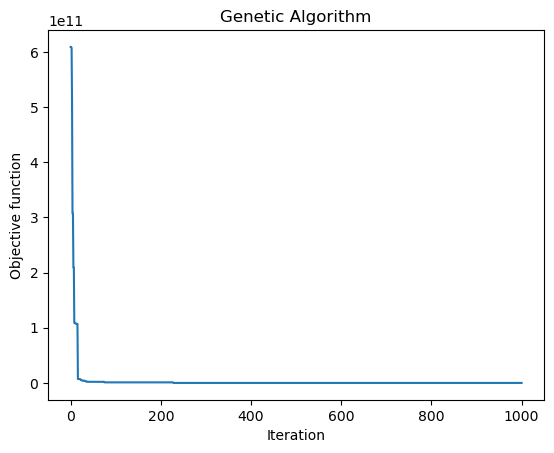

In [42]:
model = Optimizer(tasks, members)
result = model.genatic_algo({'max_num_iteration': 1000, 'population_size': 100, 'mutation_probability': 0.06,
                                        'elit_ratio': 0.06, 'crossover_probability': 0.06, 'parents_portion': 0.08,
                                        'crossover_type': 'uniform', 'max_iteration_without_improv': None})
                

 The best solution found:                                                                           
 [ 483.  840.  480.  725.  669. 1041. 1009.  998.  843.  606.  480.  541.
  557.  662. 1005. 1050. 1136.  738. 1035.  954.  487.]

 Objective function:
 2000030590.0972223


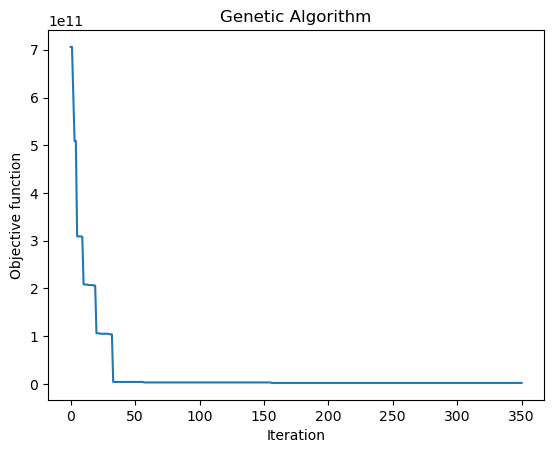

In [50]:
model = Optimizer(tasks, members)
result = model.genatic_algo({'max_num_iteration': 350, 'population_size': 150, 'mutation_probability': 0.01,
                                        'elit_ratio': 0.02, 'crossover_probability': 0.04, 'parents_portion': 0.03,
                                        'crossover_type': 'uniform', 'max_iteration_without_improv': 50})
                

### Testing

 The best solution found:                                                                           
 [ 502.  620.  580. 1060.  832. 1056.  728.  950.  949.  901.  488.  611.
  497.  724.  894.  854.  545.  996. 1041. 1145.  493.]

 Objective function:
 200000037590.59723


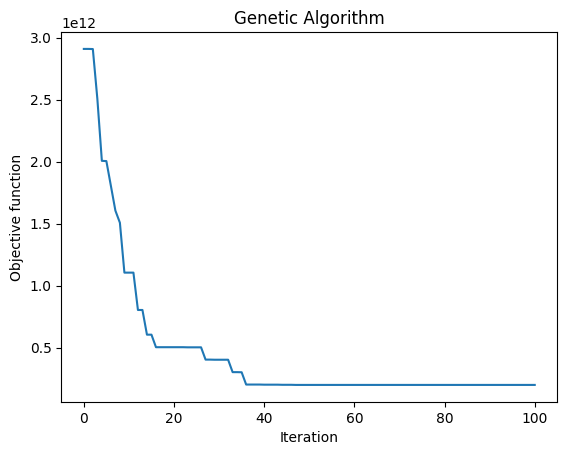

 The best solution found:                                                                           
 [ 484.  890.  929.  693.  827.  869. 1003. 1002.  641.  519.  737.  984.
  482.  490.  768.  889. 1191. 1092.  892.  588.  917.]

 Objective function:
 408000038052.93054


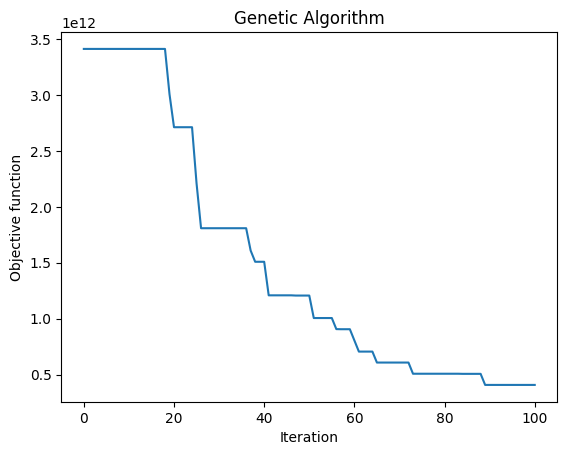

 The best solution found:                                                                           
 [ 539.  580.  956.  826.  699.  941. 1033.  744.  624.  539.  819.  808.
  831.  666.  514.  972.  914.  991.  508.  975.  661.]

 Objective function:
 405000038146.875


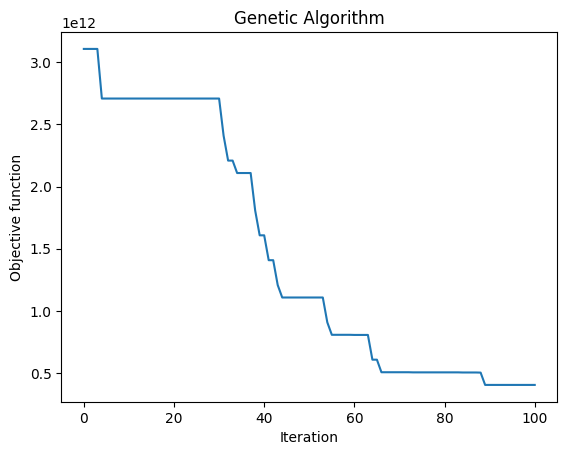

 The best solution found:                                                                           
 [ 690.  536.  563. 1007.  714.  939.  637.  804.  869.  942.  655.  974.
  950.  857.  738.  788. 1090.  920.  901. 1088.  806.]

 Objective function:
 305000038208.05554


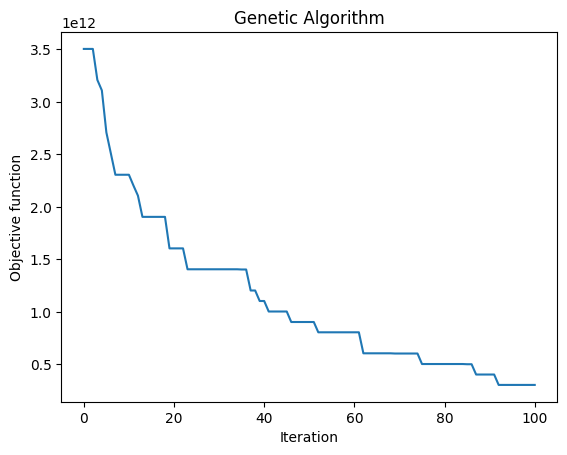

 The best solution found:                                                                           
 [1035.  924.  505.  842.  757.  597. 1102.  512.  485.  584.  533. 1066.
  793.  693.  948.  861. 1014.  849. 1015.  636.  917.]

 Objective function:
 8000038072.805555


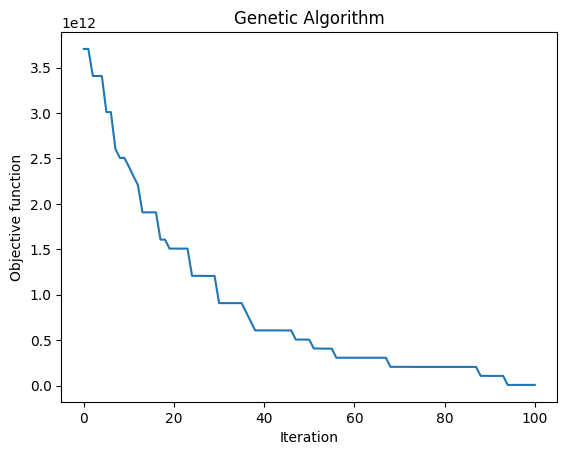

 The best solution found:                                                                           
 [ 980.  945.  718. 1107.  954.  490.  761.  885.  886.  602.  925.  714.
  954.  540.  638. 1063.  821.  648. 1039.  882.  503.]

 Objective function:
 205000038065.7361


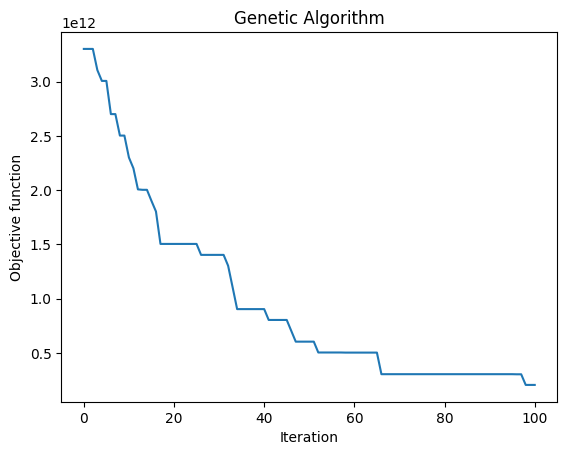

 The best solution found:                                                                           
 [ 802.  703.  976.  855.  808.  497.  642. 1007.  485.  919.  843.  700.
  878. 1069.  503.  553. 1137.  550.  601.  956.  981.]

 Objective function:
 108000038115.33333


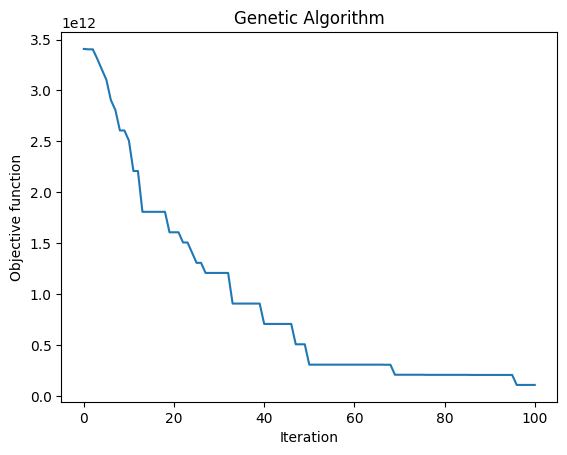

 The best solution found:                                                                           
 [ 616.  861.  566.  748. 1189.  854.  597.  931.  555.  688.  961.  732.
  896. 1008.  532.  492. 1131.  864.  750.  678.  558.]

 Objective function:
 105000038115.93056


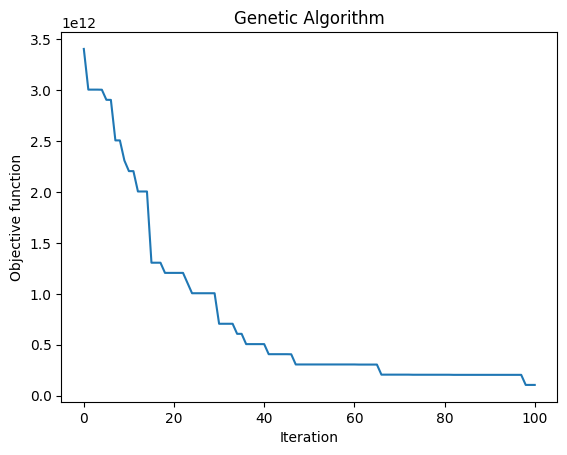

 The best solution found:                                                                           
 [ 566. 1163.  529.  726.  829.  948. 1046.  922.  690.  657.  641.  707.
  676.  984.  904.  865. 1115.  640.  927.  555.  490.]

 Objective function:
 103000037685.84723


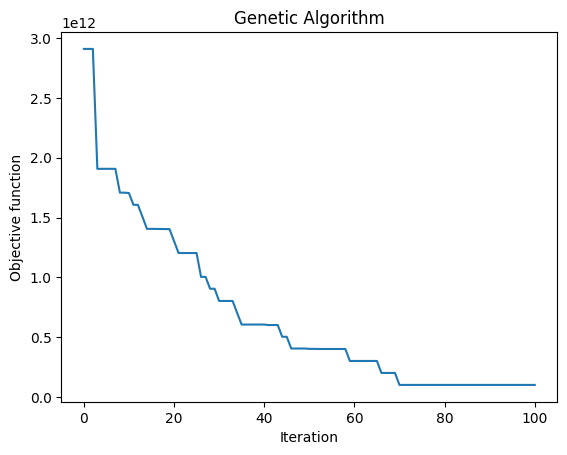

 The best solution found:                                                                           
 [ 486.  980.  629.  622.  495.  818. 1077.  683.  608.  914.  666.  959.
  970.  768.  905.  843. 1152.  554.  713.  842.  831.]

 Objective function:
 7000038166.875


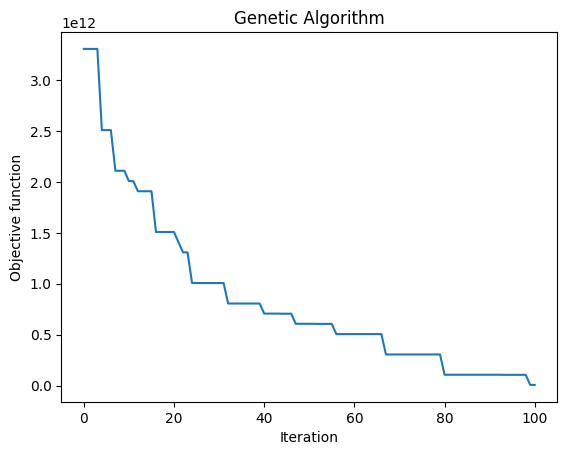

 The best solution found:                                                                           
 [ 491.  614.  562.  826. 1019. 1056.  706. 1018.  841.  790.  489.  594.
  486.  700.  764. 1045. 1151.  954.  980.  896.  487.]

 Objective function:
 37610.222222222226


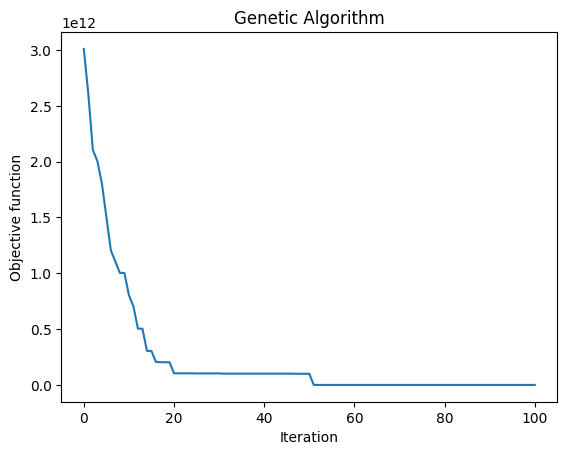

 The best solution found:                                                                           
 [ 529.  827.  646. 1112.  878. 1010.  638.  636.  948.  976.  512.  798.
  506.  958.  954. 1049.  698.  634. 1018.  583.  517.]

 Objective function:
 101000038063.95833


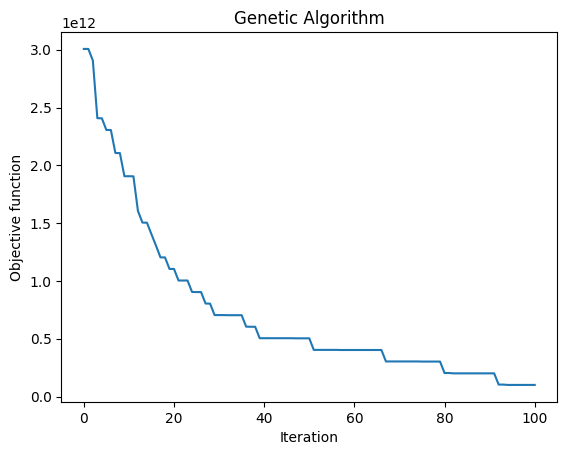

 The best solution found:                                                                           
 [ 536.  573.  671.  658. 1018. 1016.  784. 1012.  848.  541.  570.  753.
  492.  947.  951. 1017. 1119.  841.  965.  879.  488.]

 Objective function:
 1000038052.8472222


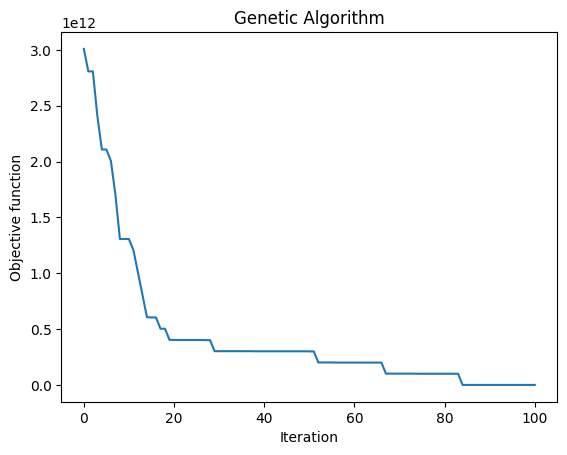

 The best solution found:                                                                           
 [ 644. 1089.  727.  788.  512. 1029.  728.  885.  844. 1038.  530.  877.
  555.  623.  854. 1016. 1037.  919.  986.  985.  577.]

 Objective function:
 3000038089.5277777


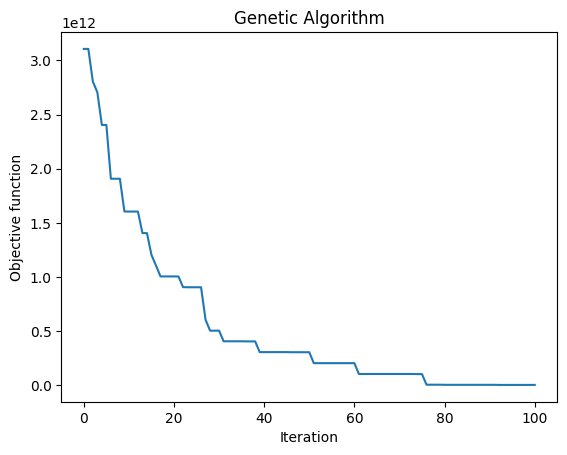

 The best solution found:                                                                           
 [ 716. 1120.  851. 1031.  484.  897.  546.  628.  766.  965.  487.  598.
  492.  810.  968. 1046.  714.  959. 1011.  899.  864.]

 Objective function:
 104000038059.29167


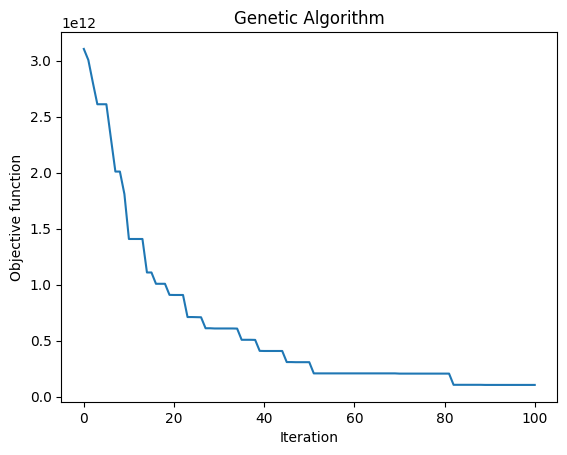

 The best solution found:                                                                           
 [ 664.  554.  651. 1011.  780.  924. 1124.  716. 1047.  856.  508.  980.
  546.  649.  482.  961.  913.  710.  909.  844.  934.]

 Objective function:
 7000038091.888889


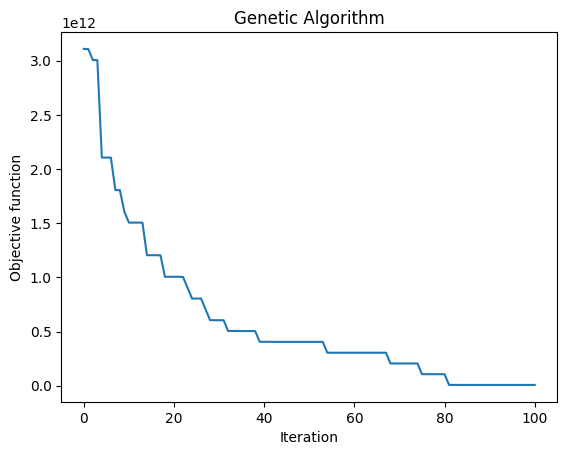

 The best solution found:                                                                           
 [ 857. 1177.  544.  603.  721. 1036. 1002.  942.  788.  838.  587.  968.
  925.  899.  505. 1017. 1119.  674. 1042.  830.  558.]

 Objective function:
 104000038025.13889


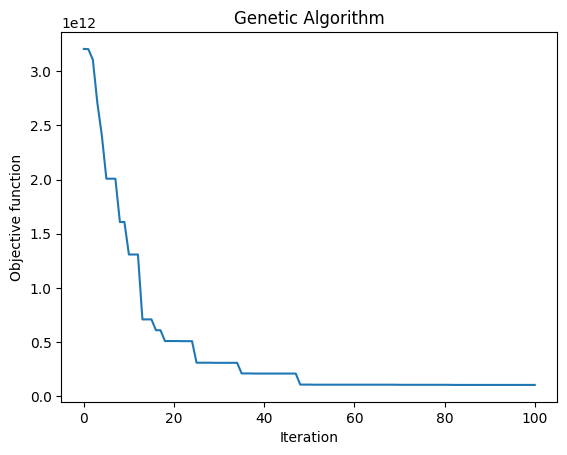

 The best solution found:                                                                           
 [ 505. 1068.  980. 1180.  826.  958.  923.  692.  784.  653.  593. 1057.
  679.  754.  534. 1031.  996.  644.  562.  842.  561.]

 Objective function:
 305000038107.6528


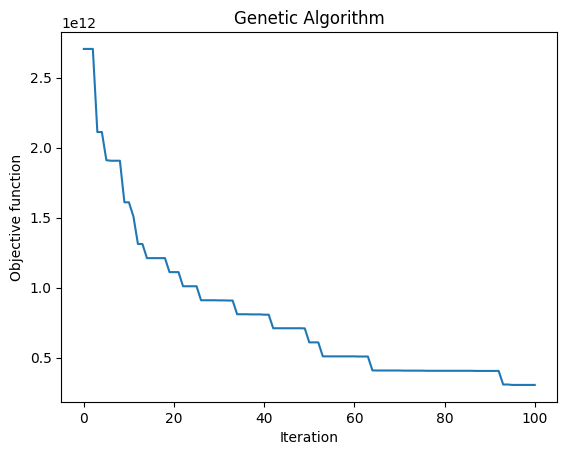

 The best solution found:                                                                           
 [ 504. 1037.  640.  738.  482.  671.  923.  609.  823.  976.  503. 1013.
  945.  809.  883.  783.  563.  613.  776.  687. 1164.]

 Objective function:
 7000036063.361111


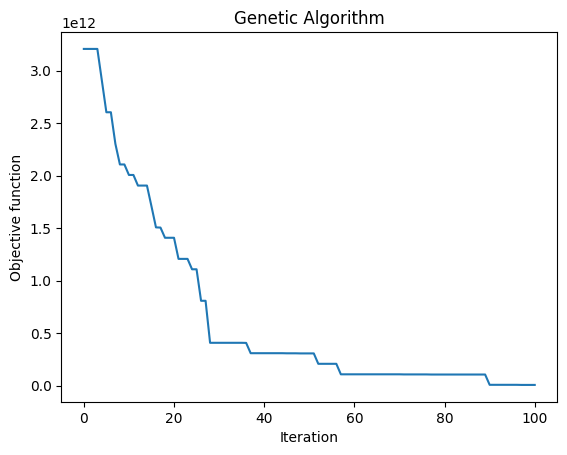

 The best solution found:                                                                           
 [ 912.  978.  814.  884.  898.  499.  637.  633.  774.  519.  746.  613.
  979.  821. 1137.  626. 1086. 1081.  590.  764.  484.]

 Objective function:
 307000038180.0972


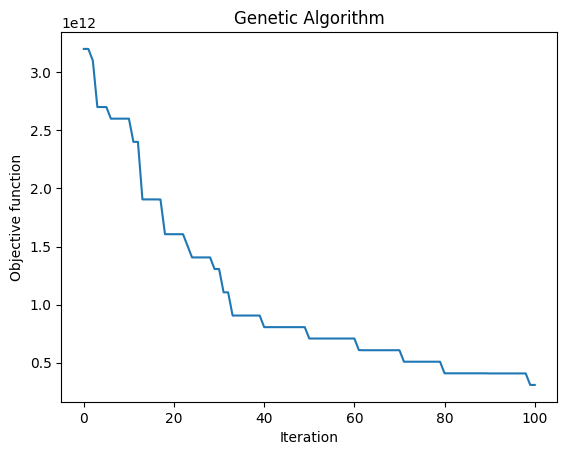

 The best solution found:                                                                           
 [ 847.  955.  795.  673.  954. 1064. 1145.  892.  481.  545.  492. 1094.
  954.  752.  542. 1063. 1032.  828. 1033.  622.  512.]

 Objective function:
 5000037974.152778


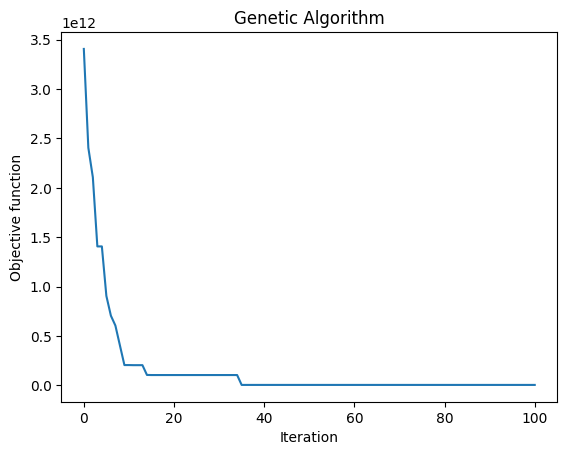

 The best solution found:                                                                           
 [ 860. 1124.  828.  544.  988. 1041. 1051.  978. 1061.  651.  517.  504.
 1000.  918.  901. 1052.  834.  756.  482.  644.  702.]

 Objective function:
 104000037984.30556


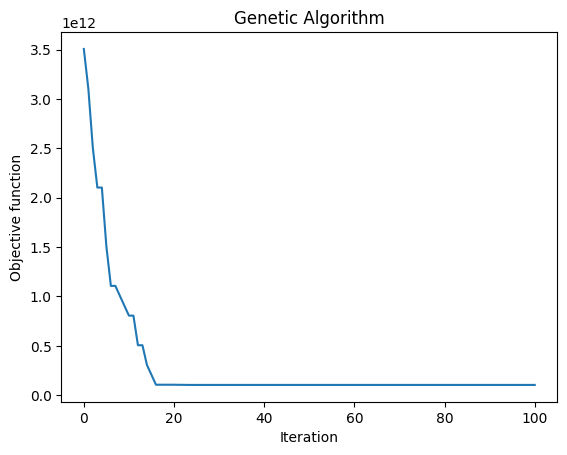

 The best solution found:                                                                           
 [ 722. 1053.  937.  960.  617.  840. 1133.  507.  569.  774.  626.  923.
  854.  748.  949.  809.  814.  864. 1027.  681.  583.]

 Objective function:
 5000038220.013889


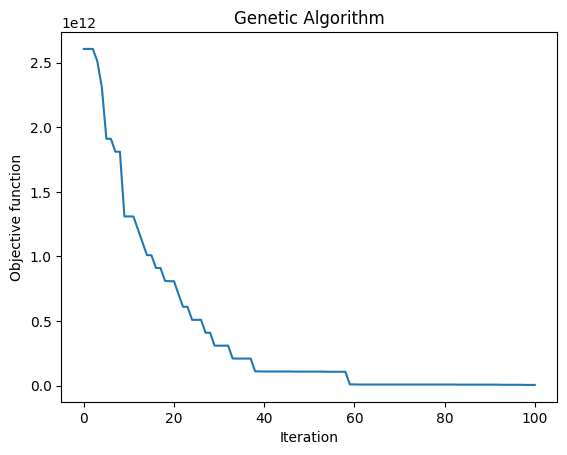

 The best solution found:                                                                           
 [ 496. 1123.  873.  831.  586.  789.  647.  584.  993.  546.  556.  829.
  547.  764.  870. 1000.  717.  986. 1042.  713.  499.]

 Objective function:
 5000038068.180555


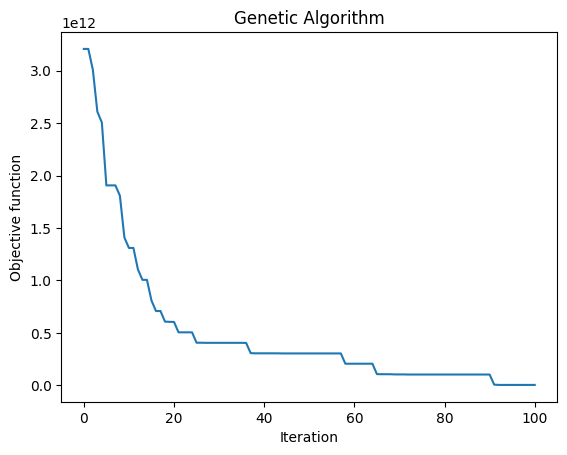

 The best solution found:                                                                           
 [ 696.  927.  609.  798.  866. 1048. 1115.  526. 1053. 1016.  521. 1090.
  492.  709.  874.  845. 1005. 1001.  973.  625.  967.]

 Objective function:
 7000038053.625


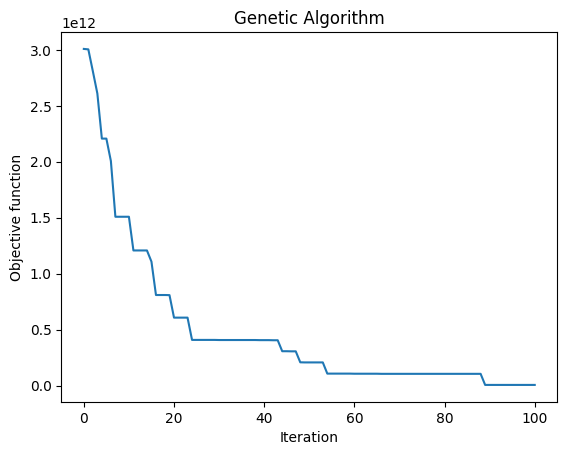

 The best solution found:                                                                           
 [ 534.  744.  616. 1127.  538. 1057.  998.  995.  746.  834.  486.  952.
  502.  828.  855. 1041.  903.  567.  912.  662.  487.]

 Objective function:
 104000038128.40277


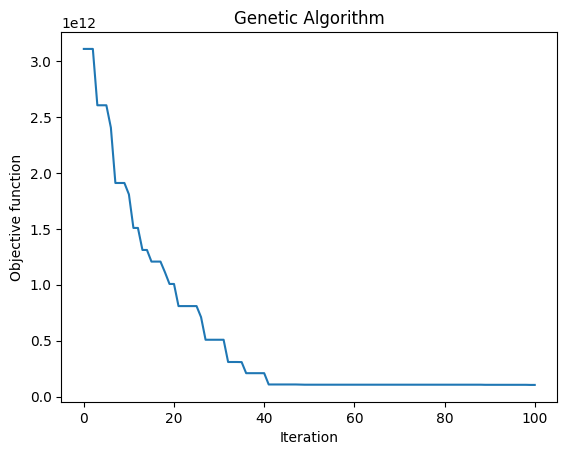

 The best solution found:                                                                           
 [ 488.  820.  824.  941.  908. 1009.  547.  545.  520.  738.  855.  797.
  539. 1122.  729. 1010.  641.  638. 1048. 1002.  486.]

 Objective function:
 101000038045.04167


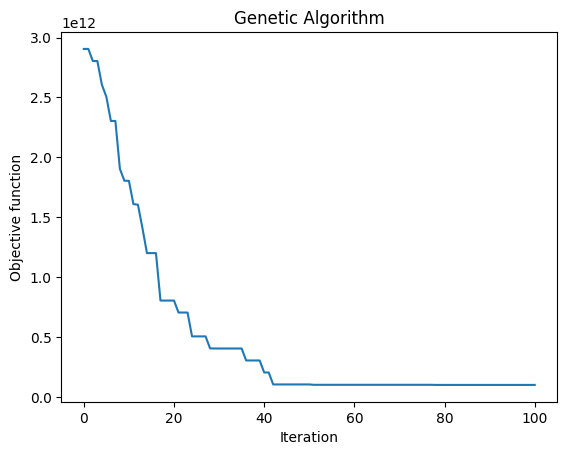

 The best solution found:                                                                           
 [ 542. 1011.  490.  840.  953.  819.  593.  745.  737.  671.  825.  551.
  940.  901. 1124. 1057. 1194.  761.  759.  660.  922.]

 Objective function:
 204000038123.2361


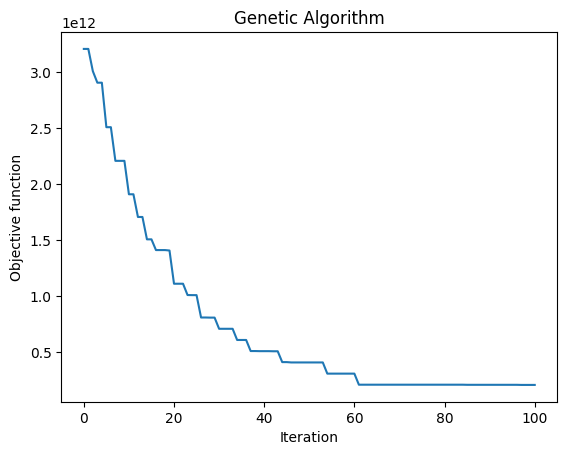

 The best solution found:                                                                           
 [ 561.  917.  637.  597.  493. 1015. 1072.  990.  838.  875.  998.  571.
  756.  722.  998.  587. 1129.  791.  724.  856.  885.]

 Objective function:
 5000038175.444445


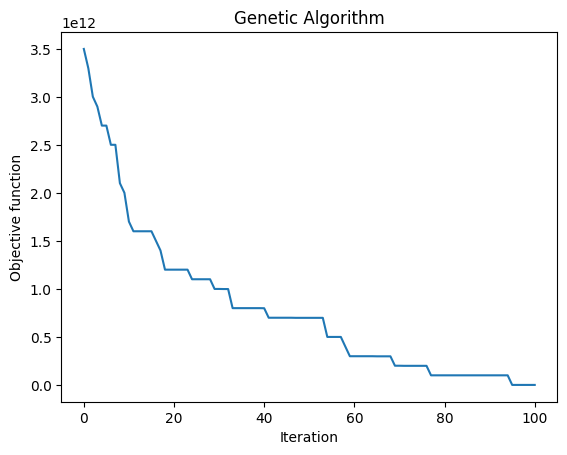

 The best solution found:                                                                           
 [ 520.  617.  588. 1070.  758.  779.  855.  772.  914. 1138.  571.  611.
  705.  543. 1191. 1219.  908.  918.  996. 1013.  715.]

 Objective function:
 702000038123.4722


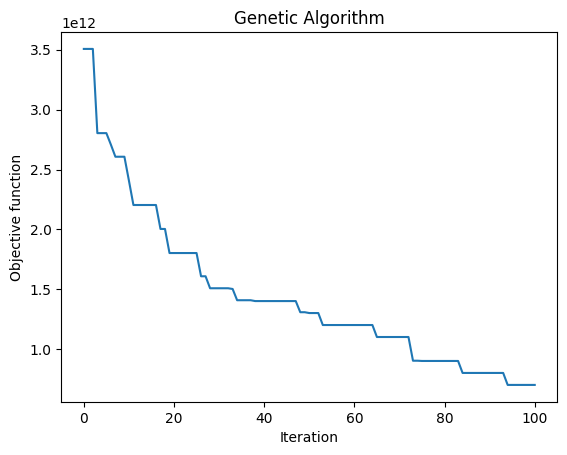

 The best solution found:                                                                           
 [1044.  897.  483. 1018.  635.  485.  548.  540.  703.  699.  483.  896.
  998.  796.  934. 1062. 1152.  541.  886.  730.  482.]

 Objective function:
 2000037992.4027777


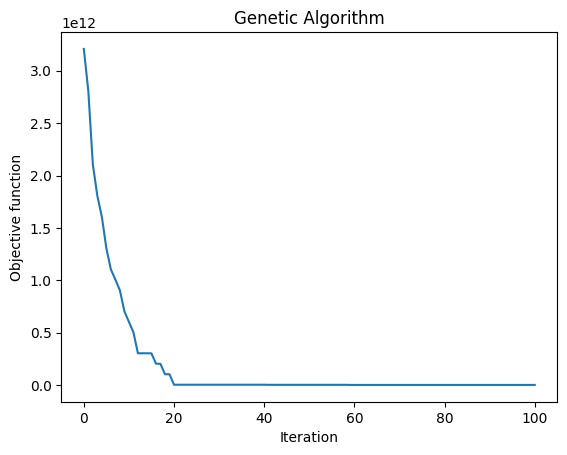

 The best solution found:                                                                           
 [ 512. 1096.  539. 1011.  769.  854.  554.  761.  756.  723.  482.  968.
  666.  606.  954. 1054.  670.  900. 1032.  839.  498.]

 Objective function:
 2000038011.3055556


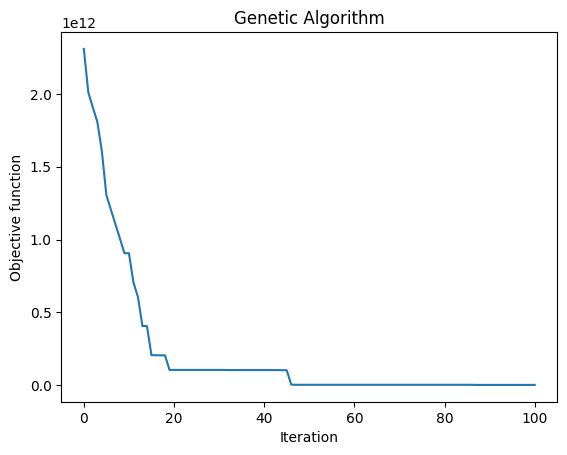

 The best solution found:                                                                           
 [ 561.  545.  487.  766. 1198. 1011.  683.  676.  855.  928.  595. 1033.
  600.  970.  678. 1037.  627.  884. 1026.  857.  514.]

 Objective function:
 103000038059.84723


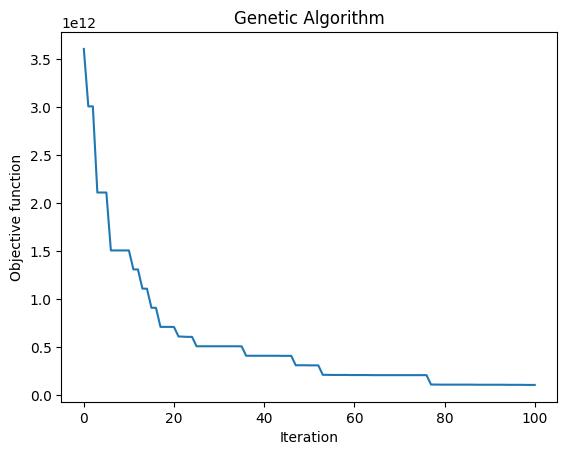

 The best solution found:                                                                           
 [ 960.  892.  831. 1092.  701.  512.  557.  552.  493.  767.  486.  542.
  551. 1154.  913. 1056.  971.  664. 1034. 1024.  489.]

 Objective function:
 302000037982.2222


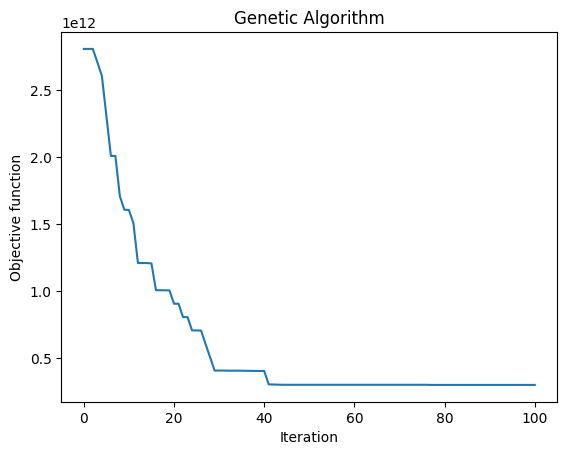

 The best solution found:                                                                           
 [ 771.  768.  711.  597.  521.  868. 1142. 1015.  945.  980.  587.  750.
  563.  663.  913.  937.  866.  990.  931. 1084.  885.]

 Objective function:
 105000038122.65277


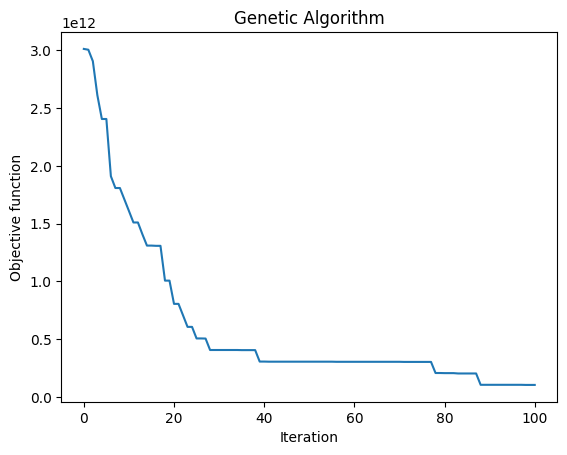

 The best solution found:                                                                           
 [ 794.  594.  645. 1087.  967. 1017. 1148.  947.  872.  817.  484.  565.
  528.  675.  789. 1046. 1032.  806.  865.  890.  748.]

 Objective function:
 101000038108.69444


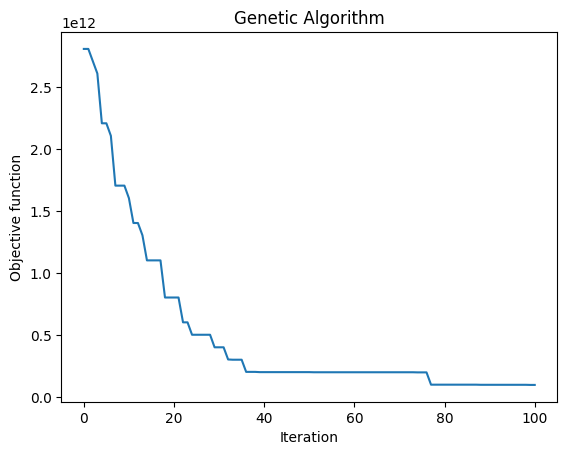

 The best solution found:                                                                           
 [1044.  616.  697.  854.  993.  485.  931.  972.  909.  821.  736. 1092.
  496.  528.  899. 1047.  756.  825.  858.  803.  707.]

 Objective function:
 204000038048.80554


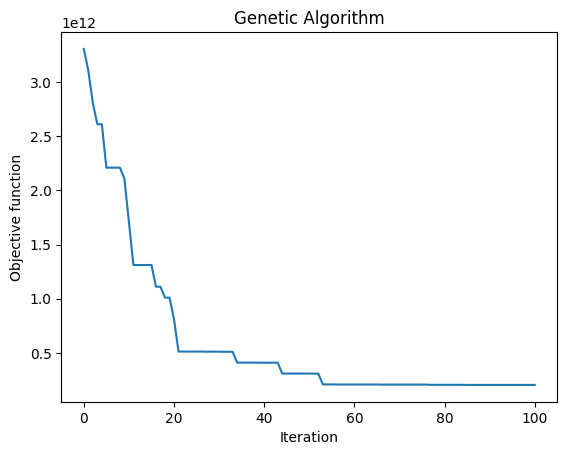

 The best solution found:                                                                           
 [ 695. 1085.  551.  763.  954.  842.  658.  892.  875.  844.  493.  656.
  796.  491.  943. 1031. 1026.  878. 1031.  575.  839.]

 Objective function:
 103000038030.54167


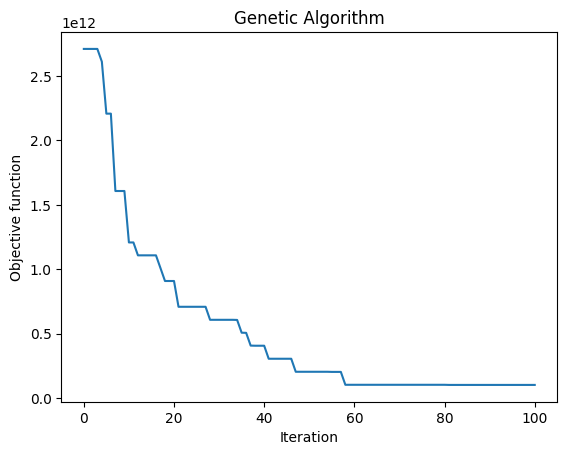

 The best solution found:                                                                           
 [ 939. 1090.  497.  642.  865.  997.  760.  550.  769.  951.  529.  640.
  995.  823.  549.  977.  938. 1013.  678.  936.  894.]

 Objective function:
 106000038118.72223


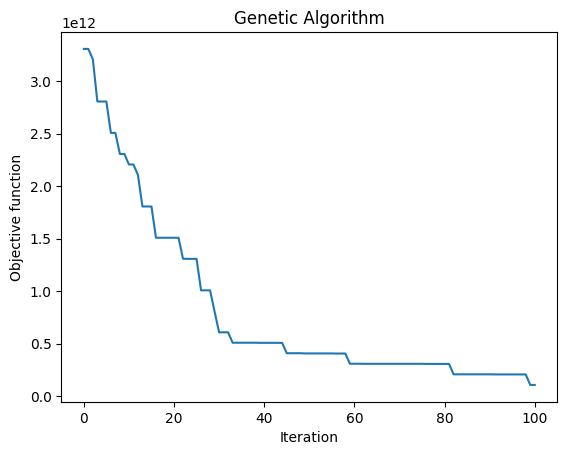

 The best solution found:                                                                           
 [ 787. 1052.  802.  871.  884. 1014.  993.  547.  481.  657.  630.  613.
  961.  932.  524.  542.  814.  805.  567.  740.  736.]

 Objective function:
 107000038129.875


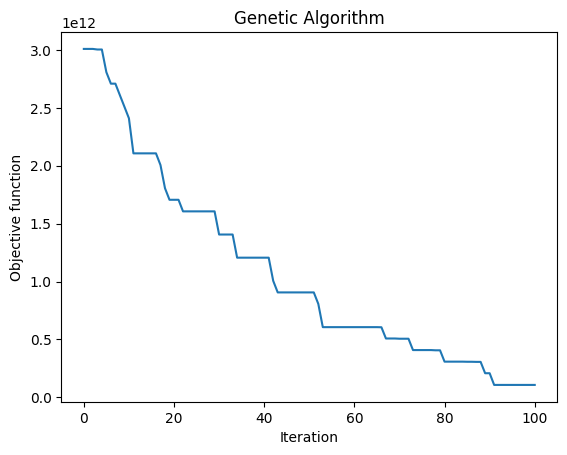

 The best solution found:                                                                           
 [ 842.  942.  481. 1138.  827. 1063.  571.  873.  752.  661.  481.  541.
  558.  726. 1007. 1059. 1068.  790. 1048.  890.  485.]

 Objective function:
 100000037976.625


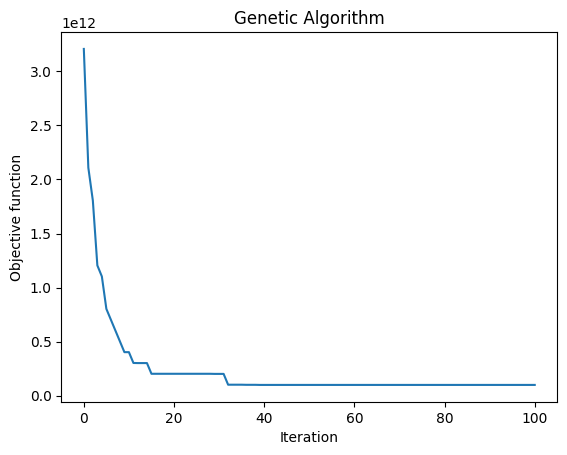

 The best solution found:                                                                           
 [ 495.  578.  768.  971.  486. 1057. 1139.  808.  866.  673.  511.  556.
  485.  719.  783. 1010. 1034.  948. 1032.  905.  844.]

 Objective function:
 4000038006.111111


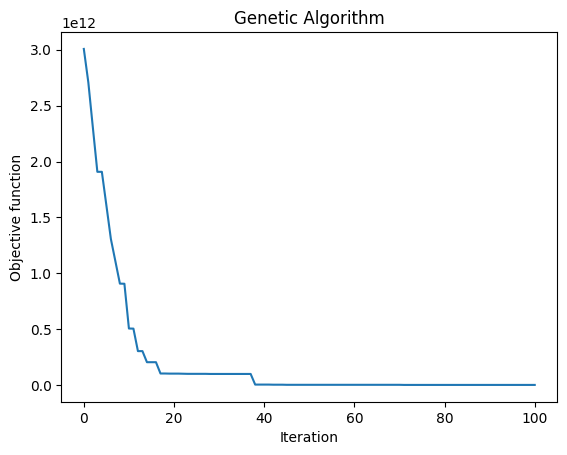

 The best solution found:                                                                           
 [ 538. 1116.  484.  989.  956. 1051.  616.  919.  848.  722.  896. 1094.
 1001.  610.  501. 1054.  801.  701.  925.  865.  559.]

 Objective function:
 3000038019.0555553


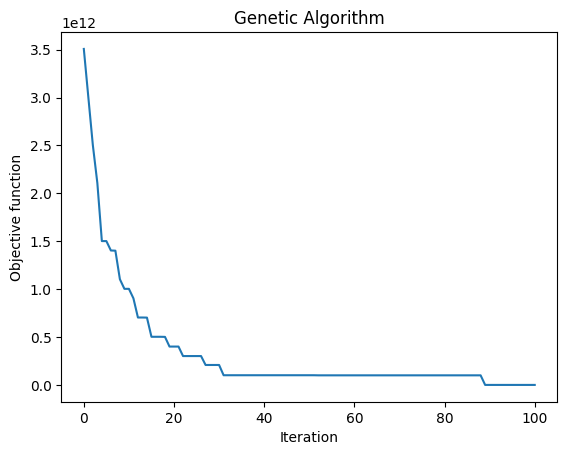

 The best solution found:                                                                           
 [ 997.  821.  589.  922.  715.  611.  597.  753.  884.  672.  483. 1071.
  487.  590.  916. 1002.  667.  661. 1021. 1006.  481.]

 Objective function:
 2000038037.9722223


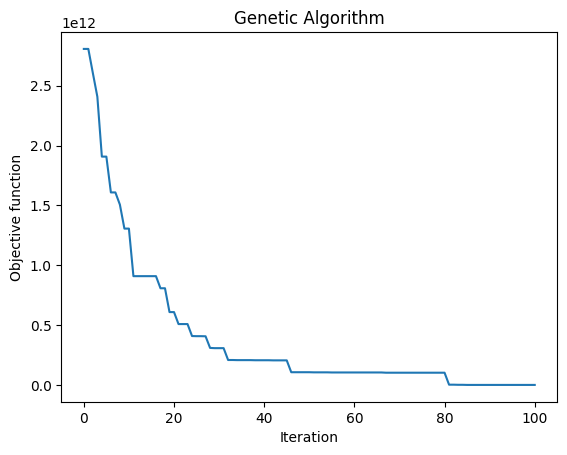

 The best solution found:                                                                           
 [ 593.  991.  494.  803.  723. 1019.  584.  731. 1021.  942.  493.  793.
  998.  926.  496.  898.  643.  641.  800. 1115. 1183.]

 Objective function:
 105000038043.56944


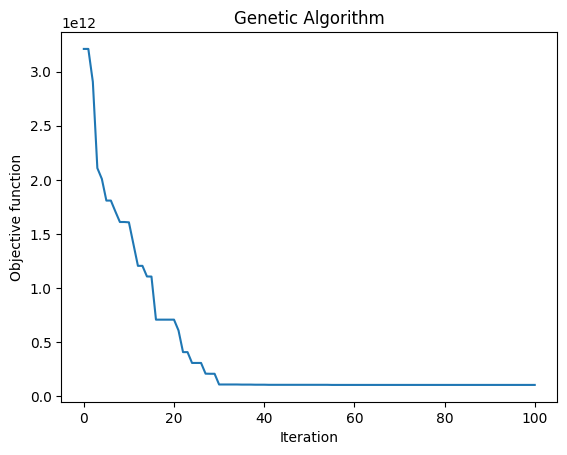

 The best solution found:                                                                           
 [1047. 1108.  483.  741.  577.  523.  671.  909.  857. 1040.  495.  561.
  710.  668.  899. 1063.  847.  818. 1007.  971.  508.]

 Objective function:
 2000038013.3333333


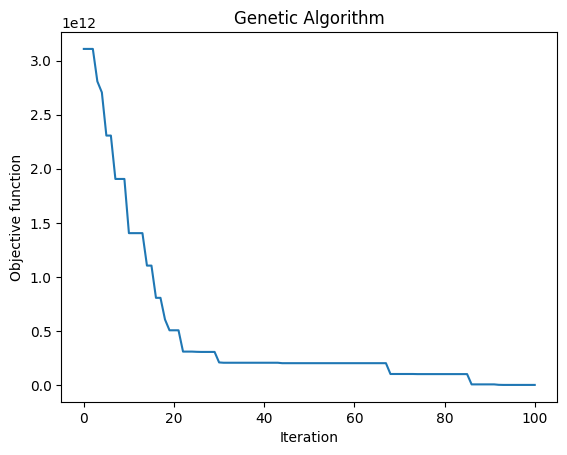

 The best solution found:                                                                           
 [ 755.  943.  947.  573.  782. 1042.  888.  686.  538. 1030.  585.  747.
  483.  501.  960. 1047. 1062.  645.  860. 1134.  652.]

 Objective function:
 206000037996.2361


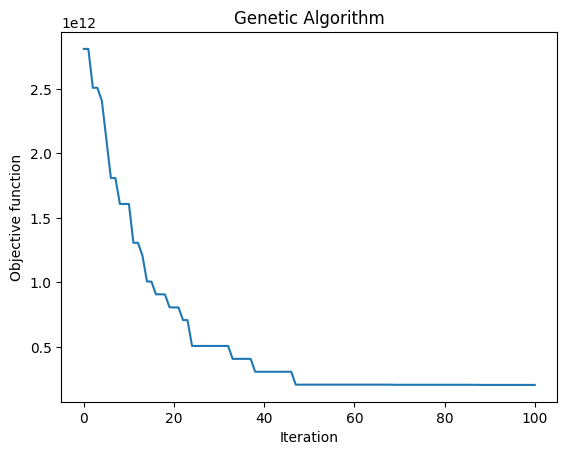

 The best solution found:                                                                           
 [ 948.  552.  698.  697.  636.  502. 1081.  630. 1021.  863.  724. 1053.
  980.  853.  896.  706.  969.  973.  821.  772.  853.]

 Objective function:
 7000038184.458333


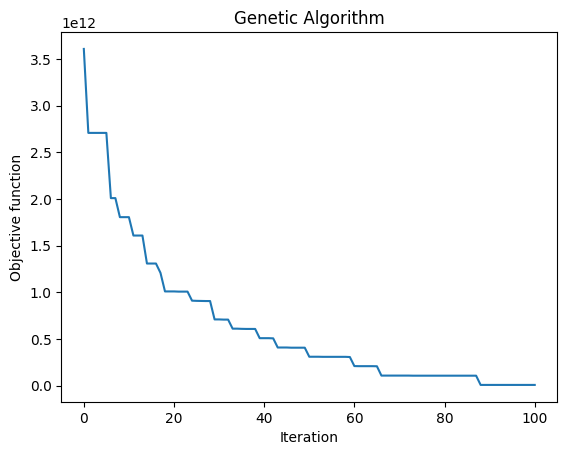

 The best solution found:                                                                           
 [ 496.  605.  867. 1090.  755.  878.  695. 1015.  678.  944.  744. 1086.
  560.  541.  836. 1043.  939. 1006.  995.  936.  484.]

 Objective function:
 103000037675.68056


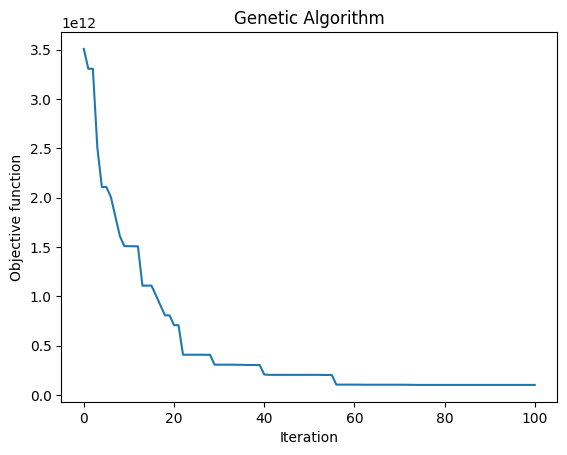

 The best solution found:                                                                           
 [ 794. 1140.  526.  609.  687. 1034.  941.  898.  651. 1107.  558.  671.
  648. 1078.  785. 1017.  882.  779.  992. 1013.  844.]

 Objective function:
 305000038104.4028


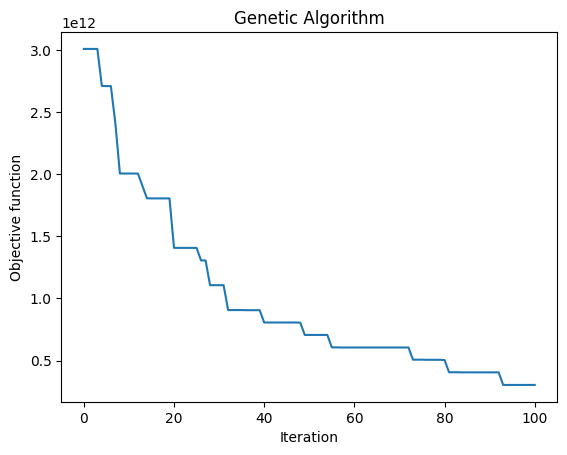

 The best solution found:                                                                           
 [ 483.  843.  484.  957.  722. 1042.  555.  713. 1065. 1049.  481.  543.
  564.  649.  921. 1057. 1152.  987.  842.  792.  492.]

 Objective function:
 1000037971.0138888


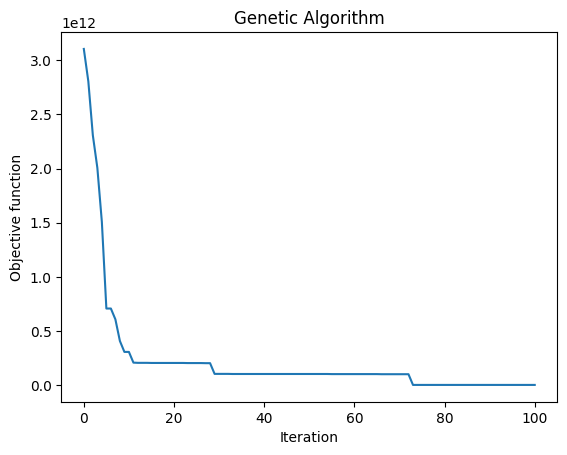

 The best solution found:                                                                           
 [ 842. 1117.  502.  587.  663. 1049.  857.  911.  881. 1046.  495.  662.
  651.  781.  852. 1060. 1039.  923. 1007.  984.  553.]

 Objective function:
 1000037617.7638888


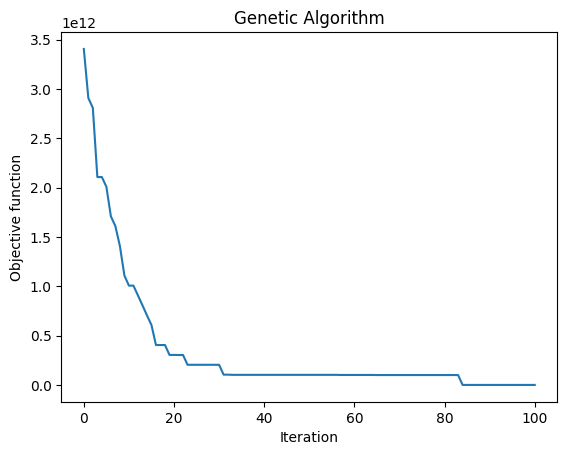

 The best solution found:                                                                           
 [ 827.  908.  798.  543.  686. 1053.  999.  894.  491.  654.  514. 1064.
  548.  990.  635.  911.  749.  737. 1023.  855.  494.]

 Objective function:
 4000038026.8055553


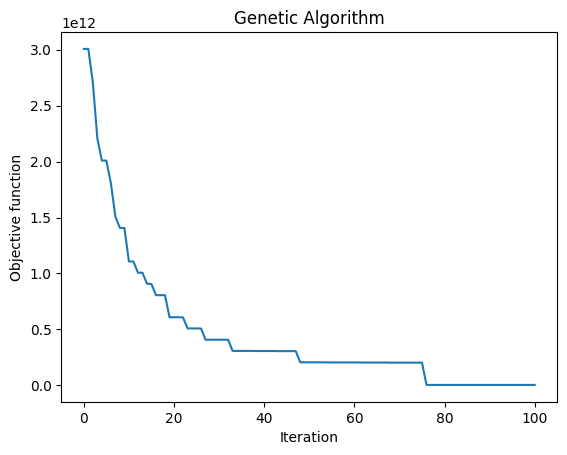

 The best solution found:                                                                           
 [ 484.  909.  599.  613.  680. 1037. 1132.  994.  809.  550.  642.  888.
  521.  547. 1013.  915.  832.  906. 1014.  830.  497.]

 Objective function:
 3000038051.263889


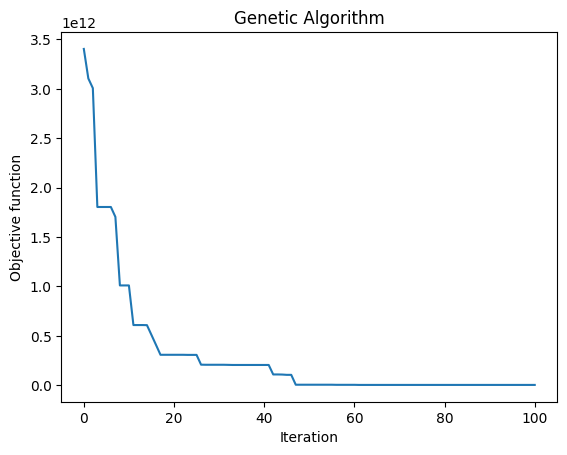

 The best solution found:                                                                           
 [ 579.  956.  611.  683.  902.  991. 1056.  821. 1034.  573.  566.  947.
  992.  882.  800. 1006.  619.  746.  735.  554.  767.]

 Objective function:
 5000038136.125


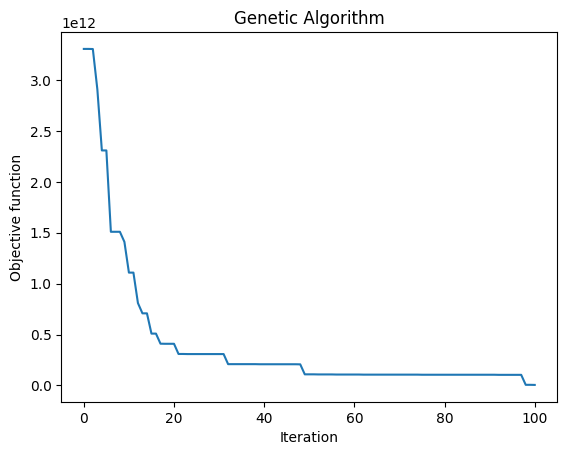

 The best solution found:                                                                           
 [ 884.  959.  490. 1074.  919. 1052. 1148.  506.  729.  767.  605. 1042.
  727.  744.  895. 1058.  618.  683. 1043.  837.  561.]

 Objective function:
 104000038056.94444


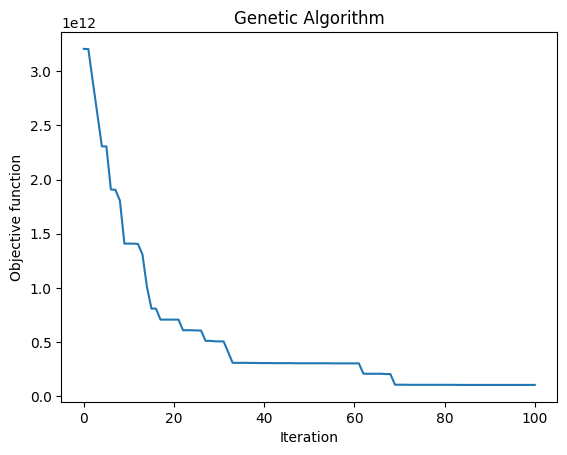

 The best solution found:                                                                           
 [ 687.  912.  837.  499. 1082.  796.  764.  993. 1057.  675.  515. 1060.
  711.  654.  853.  843.  841.  966.  925.  565.  822.]

 Objective function:
 204000038109.70834


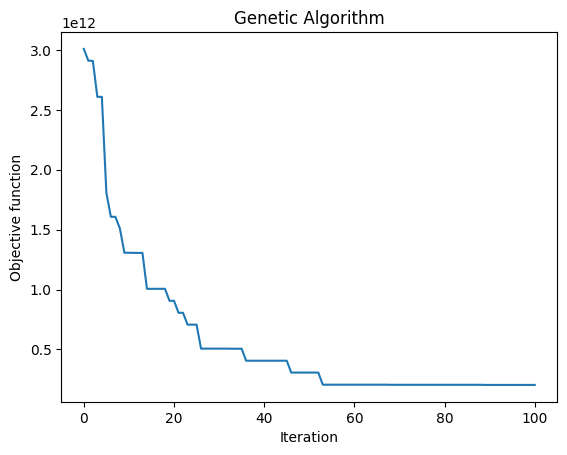

 The best solution found:                                                                           
 [ 736.  502. 1001.  942.  897.  790.  753.  667.  541.  852.  672.  836.
  565. 1004.  745.  884.  582.  806.  509. 1145.  636.]

 Objective function:
 303000038097.5139


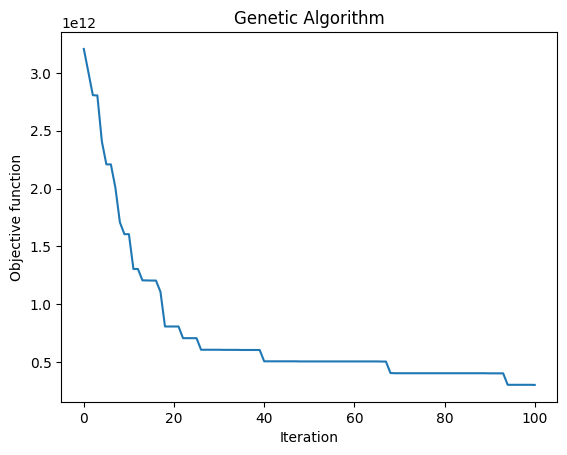

 The best solution found:                                                                           
 [ 602.  818.  632.  924.  992.  719. 1140.  485.  508.  725.  600.  807.
  793.  646. 1000.  861.  717.  709.  870.  554.  935.]

 Objective function:
 6000038132.430555


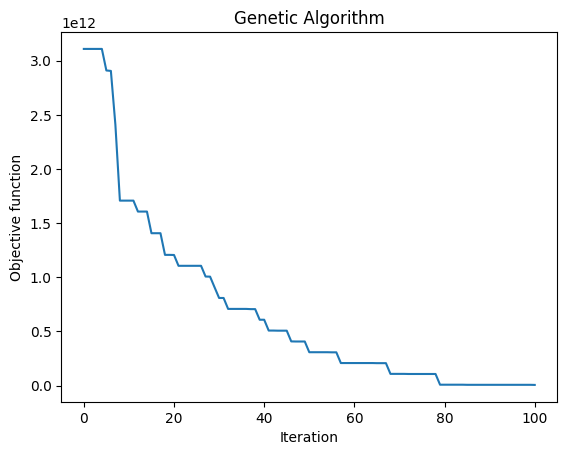

 The best solution found:                                                                           
 [ 936.  836.  544.  749.  789.  507.  936.  931. 1014.  997.  559.  642.
  761. 1103.  862.  814.  586.  978.  693.  996.  521.]

 Objective function:
 305000038136.3333


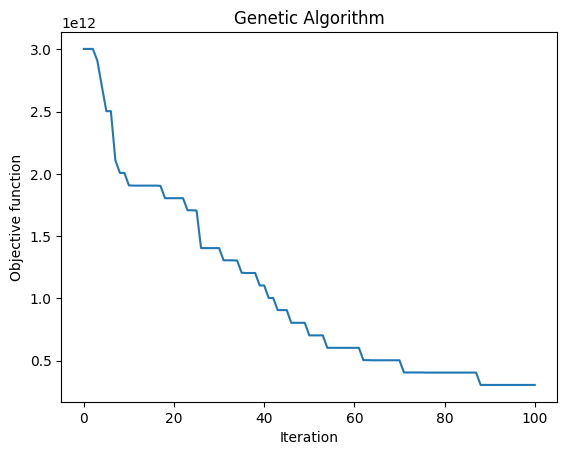

 The best solution found:                                                                           
 [ 844. 1124.  865.  639.  485. 1057.  850. 1017. 1059.  941. 1032.  911.
  481.  843. 1016.  484.  581.  575. 1048.  724.  543.]

 Objective function:
 5000037968.611111


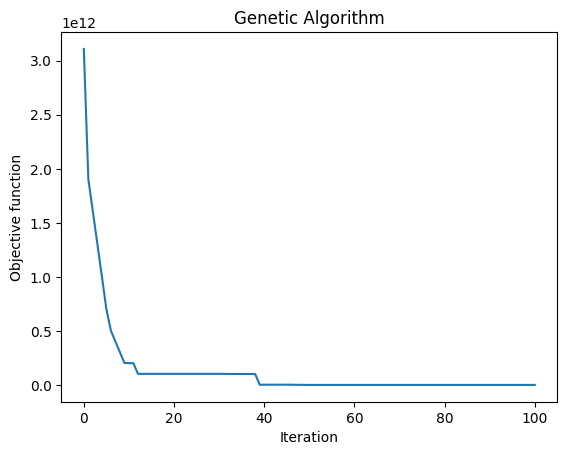

 The best solution found:                                                                           
 [ 488.  989.  497.  826.  937. 1060.  601.  655.  843.  788.  604. 1090.
  599.  482.  848. 1027.  924.  661. 1044.  730.  560.]

 Objective function:
 103000037967.45833


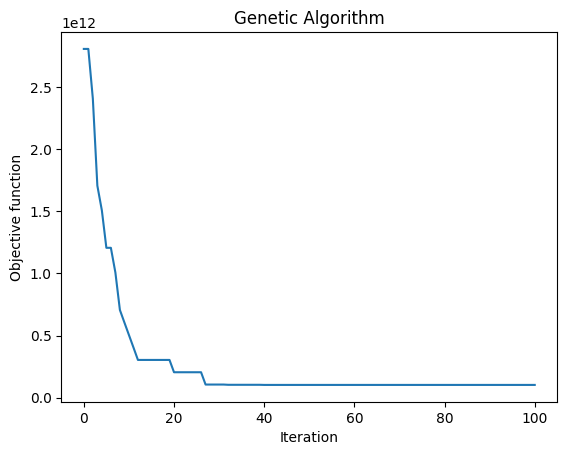

 The best solution found:                                                                           
 [ 861.  723.  489.  610.  992. 1059. 1086.  987.  943.  910.  503.  953.
 1003. 1139.  886. 1053.  817.  804.  689.  551.  485.]

 Objective function:
 104000037583.91667


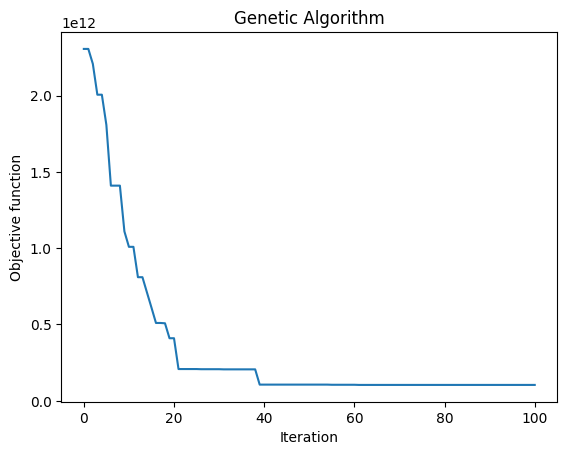

 The best solution found:                                                                           
 [ 715.  808.  568.  979.  647.  800.  895.  566.  518. 1045.  501.  780.
  944.  893.  507.  833. 1149.  640.  753.  720.  604.]

 Objective function:
 3000036054.4305553


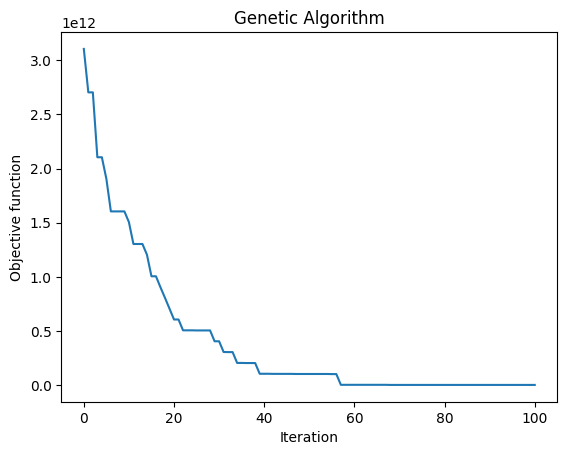

 The best solution found:                                                                           
 [ 949.  906.  980. 1139.  696. 1011.  580.  494.  486.  871.  768.  678.
  880.  982.  576.  948. 1080.  878.  548.  797.  644.]

 Objective function:
 104000038104.34723


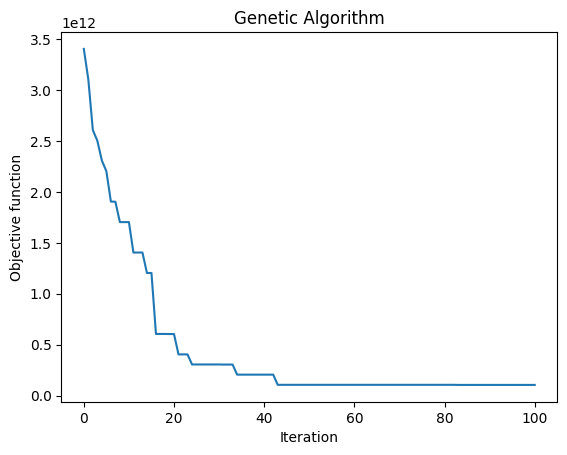

 The best solution found:                                                                           
 [ 574. 1088.  517.  862.  782. 1030.  555.  607.  974.  924.  718.  856.
  843. 1011.  928.  893.  734.  493. 1036.  669.  881.]

 Objective function:
 5000038045.055555


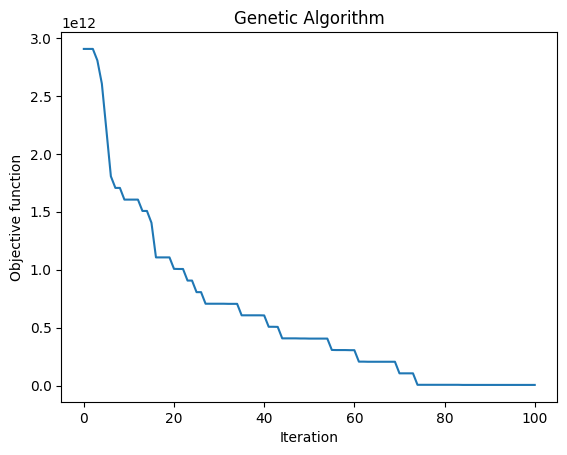

 The best solution found:                                                                           
 [ 668.  645.  523.  989.  882.  945.  566.  873. 1034.  956.  947.  629.
  676.  562.  949. 1012. 1090.  482. 1025.  799.  756.]

 Objective function:
 3000038101.2083335


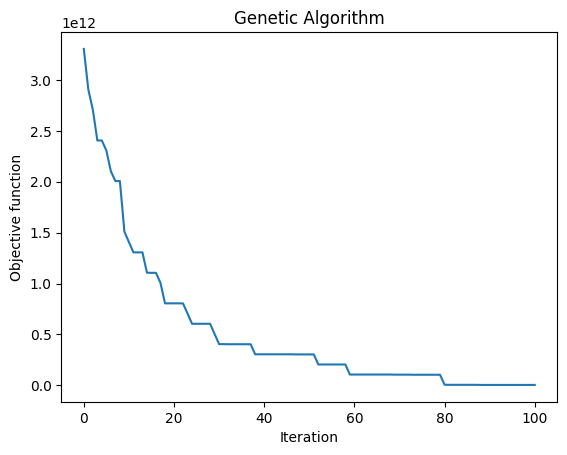

 The best solution found:                                                                           
 [ 845. 1047.  483.  882.  826. 1025.  488.  660.  686.  624.  510.  656.
  889. 1127.  763.  959. 1001.  889. 1009.  542.  827.]

 Objective function:
 205000038031.15277


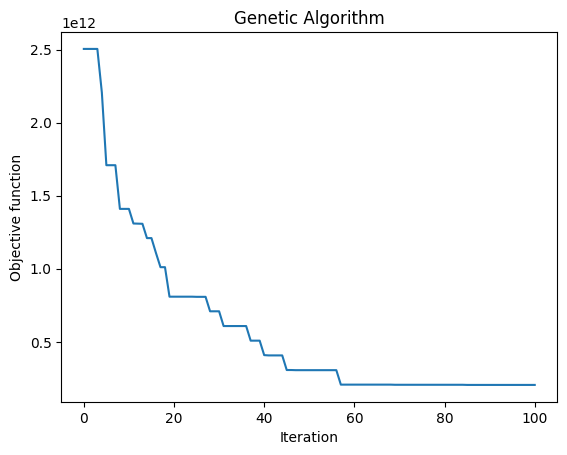

 The best solution found:                                                                           
 [ 540.  653.  873.  811. 1109.  896. 1204.  920.  795.  742.  575.  912.
  566.  567.  953. 1050.  493.  872. 1035.  740.  873.]

 Objective function:
 305000038017.7222


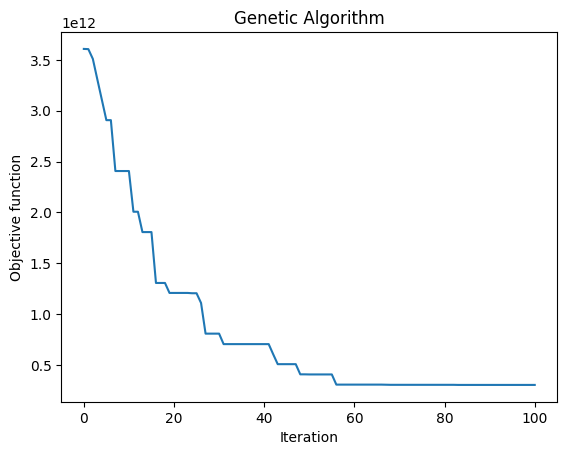

 The best solution found:                                                                           
 [ 747.  579.  894.  884.  657.  623. 1122.  986.  727.  776.  833. 1097.
  607.  513.  919.  791.  818.  693.  552.  760.  995.]

 Objective function:
 210000036023.29166


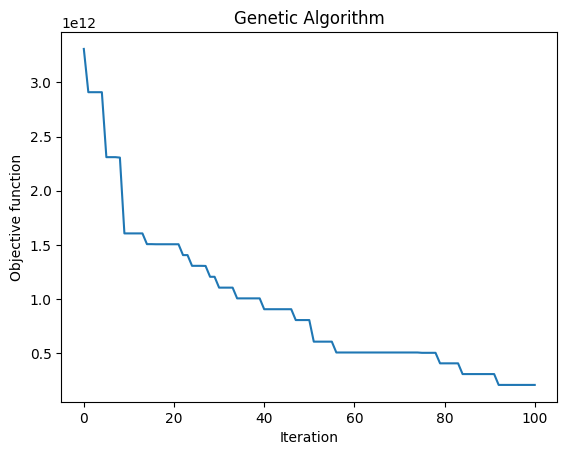

 The best solution found:                                                                           
 [ 497. 1118.  936.  884.  600. 1055.  543.  612.  486.  673.  483.  883.
  481. 1017.  956.  844.  721.  541. 1025.  775.  481.]

 Objective function:
 2000037968.3333333


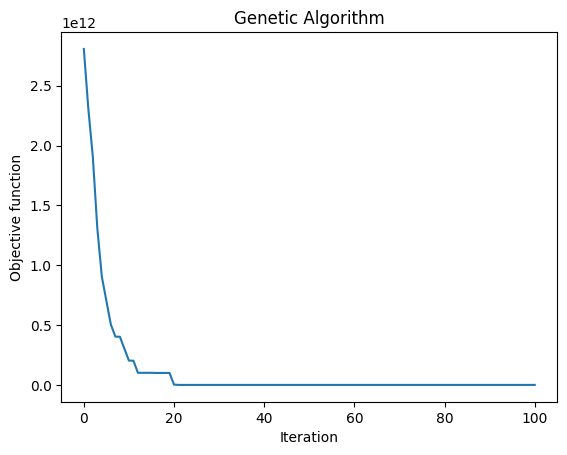

 The best solution found:                                                                           
 [1046.  549.  762.  626. 1184.  489.  803.  940. 1058. 1014.  500.  776.
  483.  711.  856.  845. 1133.  956.  571. 1006.  501.]

 Objective function:
 104000037998.19444


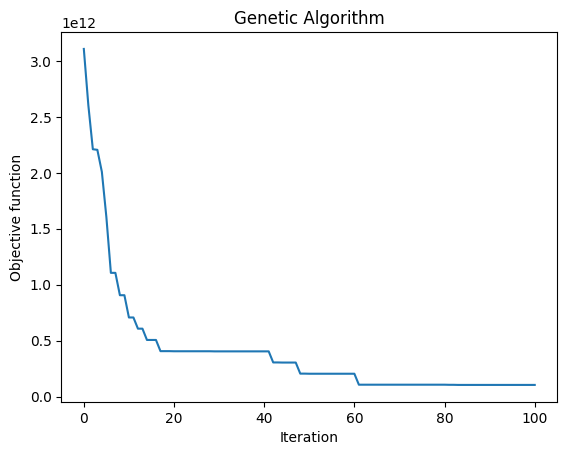

 The best solution found:                                                                           
 [ 569.  782.  765.  703.  841. 1054. 1119.  915. 1058.  621.  485.  773.
  485.  988.  952.  846.  543.  777.  922.  615.  483.]

 Objective function:
 103000038009.875


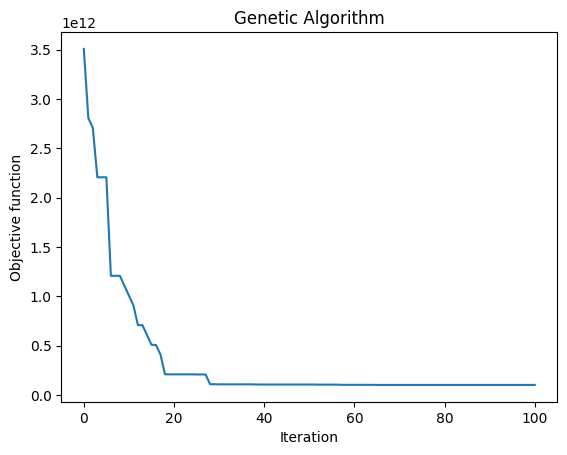

 The best solution found:                                                                           
 [ 572.  573.  481.  927.  894.  901. 1149.  741.  961.  832.  502.  564.
  564.  818.  957. 1064. 1049.  729. 1039.  670.  485.]

 Objective function:
 2000038003.8194444


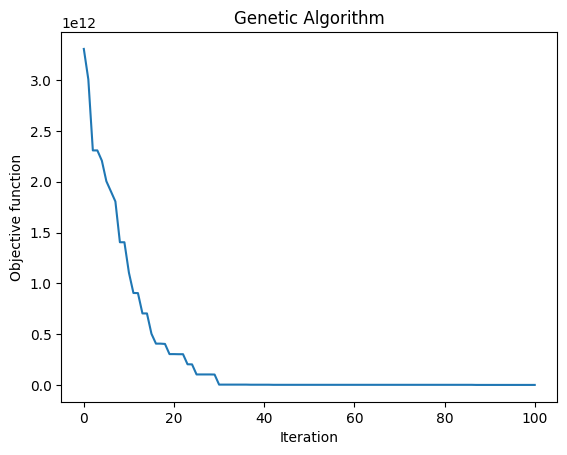

 The best solution found:                                                                           
 [ 852. 1061.  512.  740.  668. 1015.  918.  507. 1061.  990.  565. 1059.
  878.  809.  977. 1055. 1209.  963.  740.  584.  553.]

 Objective function:
 104000038000.11111


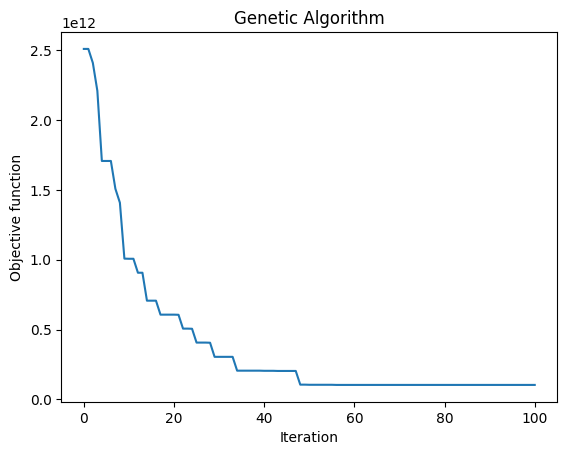

 The best solution found:                                                                           
 [ 629.  957.  724.  827. 1168.  924. 1098.  496.  888.  631.  494.  575.
  542.  691. 1191.  856.  771.  956.  924.  901.  920.]

 Objective function:
 203000038084.97223


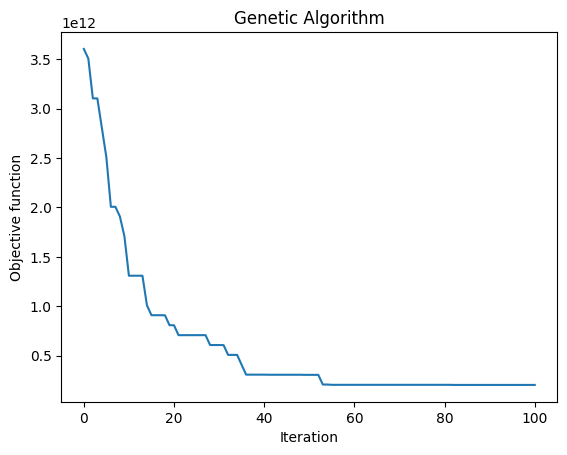

 The best solution found:                                                                           
 [ 905. 1105.  970.  800. 1189.  947.  706.  486.  609.  760.  815.  652.
  633.  963.  955.  940. 1029.  549.  514.  879.  895.]

 Objective function:
 105000038094.875


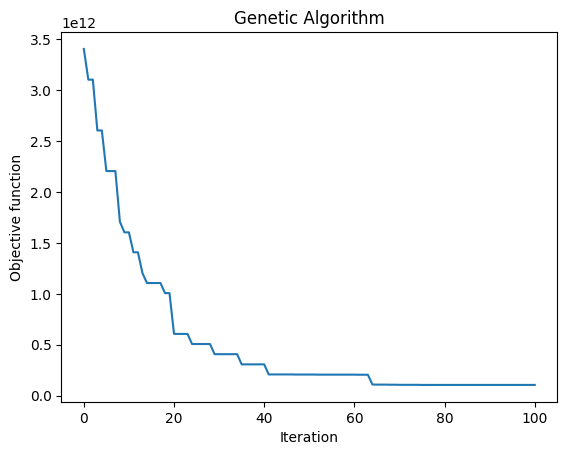

 The best solution found:                                                                           
 [ 909.  788.  802.  557. 1167.  978.  921.  972.  525.  739.  683.  545.
  892. 1077.  988.  995.  875.  880. 1005.  687.  505.]

 Objective function:
 204000038105.125


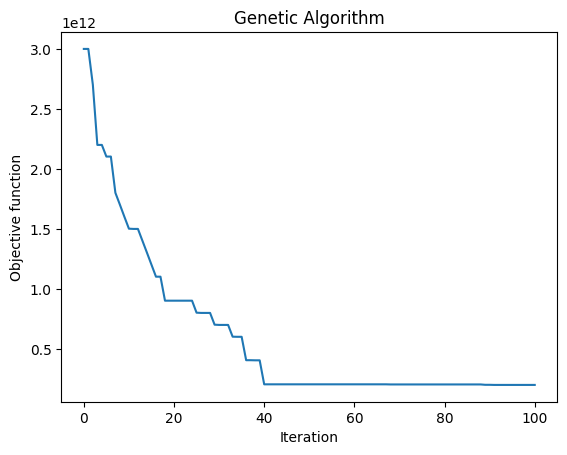

 The best solution found:                                                                           
 [ 488. 1095.  756.  901.  944.  851. 1029.  777.  842.  612.  628.  563.
  562.  827.  748.  945. 1187.  674.  853.  967.  692.]

 Objective function:
 203000038132.41666


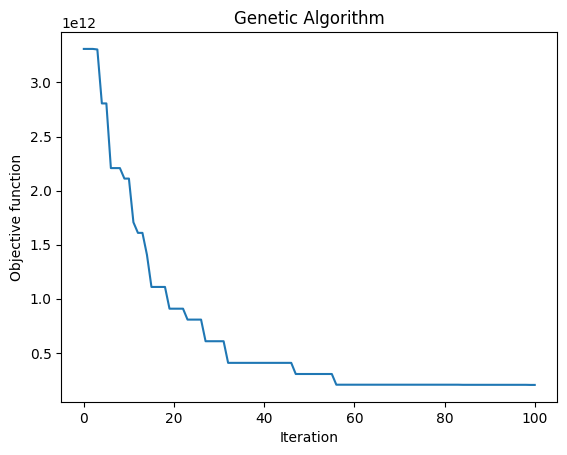

 The best solution found:                                                                           
 [ 818.  992.  821.  741. 1111.  563.  802.  980.  930.  561.  984. 1076.
  958.  858.  854. 1034.  496.  490.  736.  601.  943.]

 Objective function:
 308000038107.4861


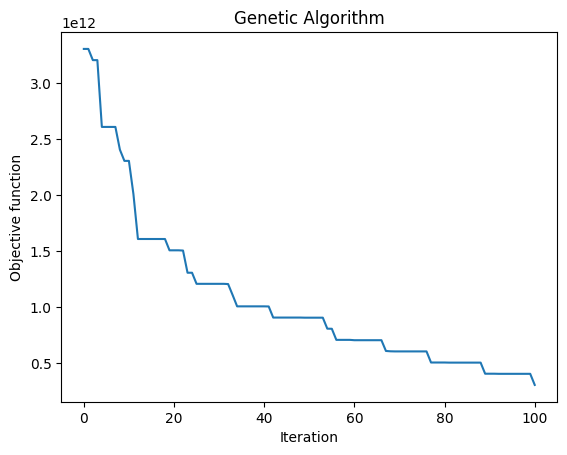

 The best solution found:                                                                           
 [ 482.  935.  481. 1018.  847.  896.  601.  832.  769.  725.  481.  581.
  962.  697.  486. 1063. 1151.  939. 1048.  781.  545.]

 Objective function:
 1000037964.5972222


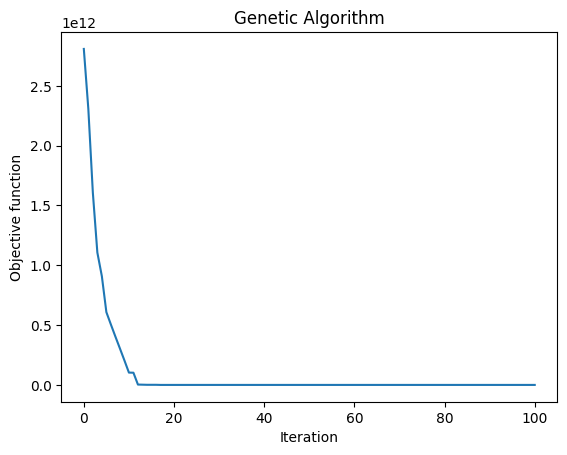

 The best solution found:                                                                           
 [ 531. 1122.  492. 1018.  607.  854.  689.  620.  779.  743.  521.  580.
  575.  805.  741. 1042.  872.  917. 1015.  934.  507.]

 Objective function:
 1000038025.1111112


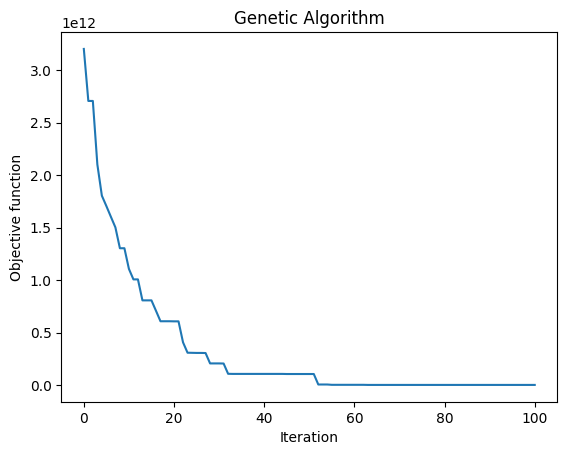

 The best solution found:                                                                           
 [ 487.  962.  862.  732.  544. 1025.  637.  636. 1063. 1049.  613.  609.
  542.  854.  922. 1053. 1138.  505.  955.  799.  868.]

 Objective function:
 5000038020.069445


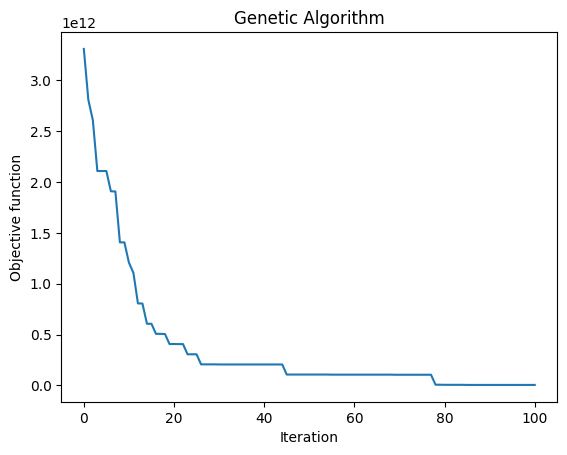

 The best solution found:                                                                           
 [ 492.  630.  581.  779.  954.  907.  566.  951.  832.  727.  495.  913.
  484.  716. 1012. 1038. 1134.  861. 1022.  843.  504.]

 Objective function:
 1000038022.3194444


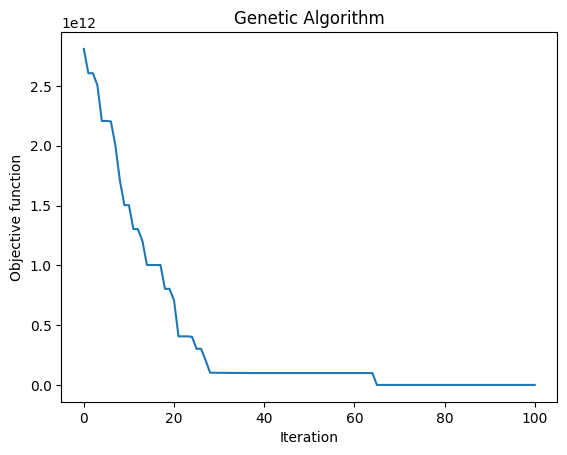

 The best solution found:                                                                           
 [ 489.  849.  507.  483.  997.  842.  728.  944.  956.  683.  522. 1094.
  641.  721. 1009. 1044.  635.  789.  830.  570.  892.]

 Objective function:
 105000038016.97223


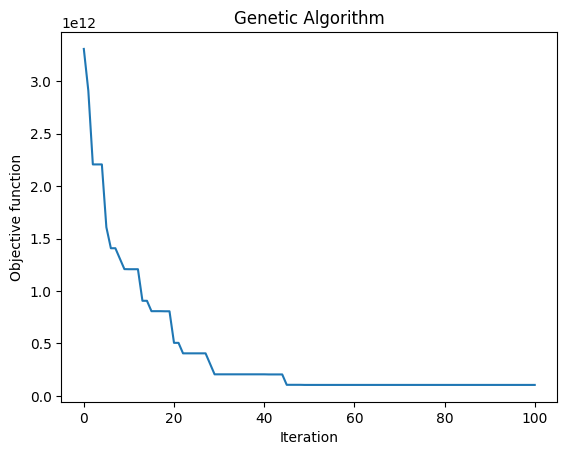

 The best solution found:                                                                           
 [ 481.  889.  493. 1083.  837. 1031.  725.  590. 1049.  971.  512. 1047.
  948.  797.  572. 1036.  662.  912.  585.  658.  558.]

 Objective function:
 204000038067.0139


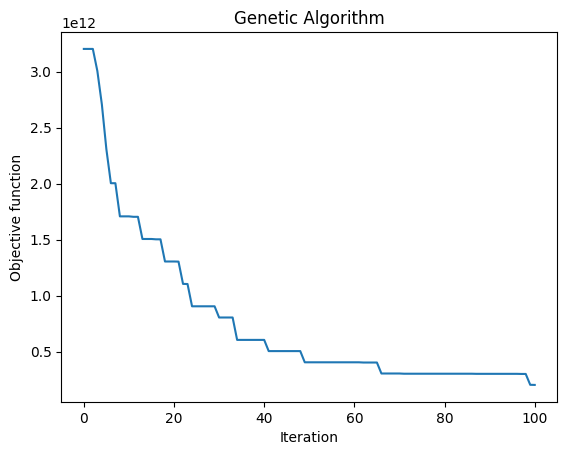

 The best solution found:                                                                           
 [ 704.  887.  681. 1136.  758.  985.  644.  822.  873. 1048.  974. 1025.
  596.  555.  901. 1033.  974.  753. 1011.  973.  705.]

 Objective function:
 101000038107.68056


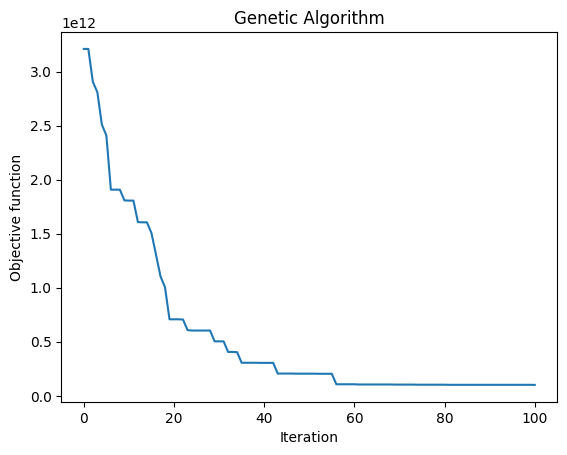

 The best solution found:                                                                           
 [ 877.  483.  532.  941.  659.  544.  824.  868. 1069. 1033.  484.  905.
  645. 1017. 1136.  959.  740.  733.  943.  564.  665.]

 Objective function:
 203000038059.2361


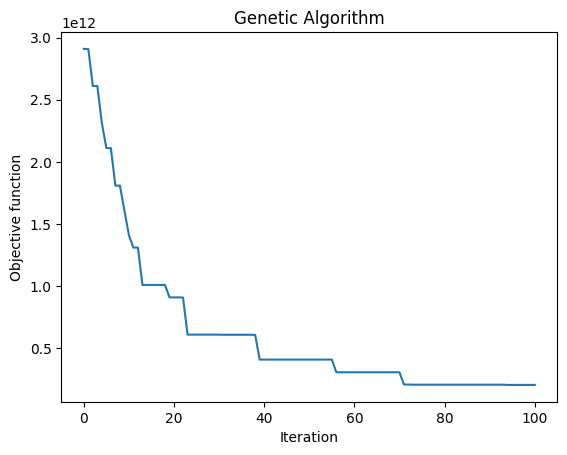

 The best solution found:                                                                           
 [ 869.  863.  509.  683.  941. 1014. 1136.  953.  735.  594.  571.  679.
  952. 1034. 1129. 1011.  583.  870.  894.  809.  533.]

 Objective function:
 202000038118.56946


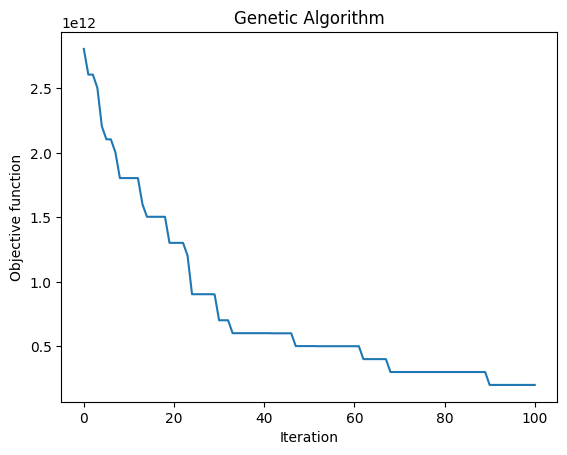

 The best solution found:                                                                           
 [ 582. 1105.  747. 1033.  501.  943.  899.  675.  833.  852.  977. 1094.
  582.  777.  847.  559.  564.  612.  886.  954.  503.]

 Objective function:
 205000038121.70834


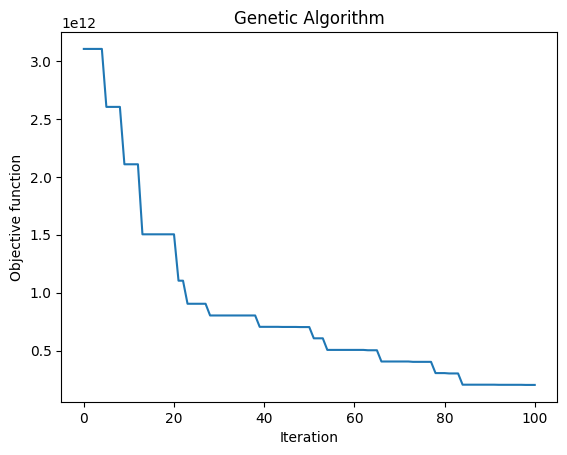

 The best solution found:                                                                           
 [ 482.  574.  557.  847.  985. 1051.  794.  912. 1067.  721.  481.  548.
  481.  786. 1019. 1062. 1152.  957.  844.  661.  486.]

 Objective function:
 2000037551.5


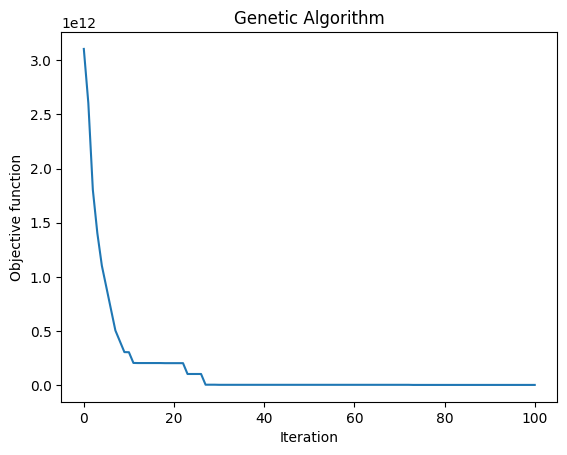

 The best solution found:                                                                           
 [ 580. 1105.  637.  723.  544. 1057.  896.  893.  869. 1031.  482.  879.
  486. 1011.  940.  968.  812.  807.  978.  620.  534.]

 Objective function:
 3000038025.861111


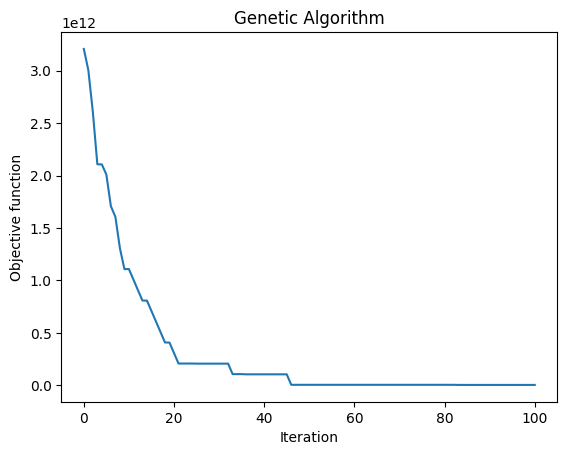

 The best solution found:                                                                           
 [ 620.  679.  589.  547.  892. 1008. 1096.  886. 1019.  795.  499.  652.
  503.  957.  952. 1040. 1030.  770.  856. 1029.  492.]

 Objective function:
 2000038040.7638888


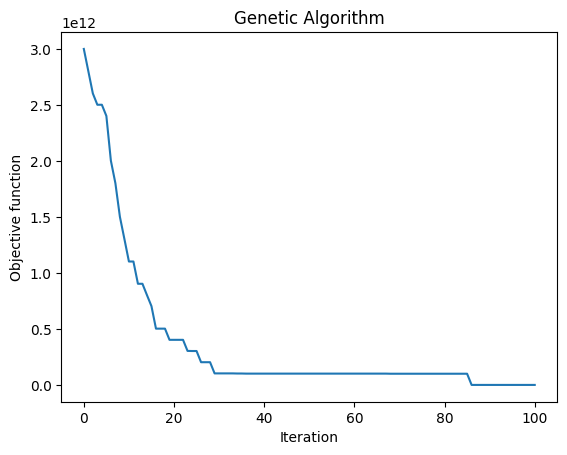

 The best solution found:                                                                           
 [ 570.  746.  503.  829. 1184. 1035. 1016.  957.  753.  671.  492.  633.
  643.  893. 1198.  852.  547.  481. 1047.  963.  902.]

 Objective function:
 202000038012.54166


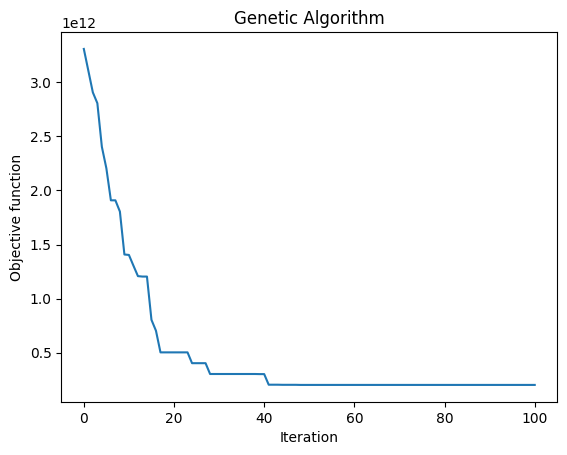

 The best solution found:                                                                           
 [ 849. 1106.  962.  834.  570. 1040.  959.  585.  497.  715.  615.  832.
  606.  954.  988. 1046.  714.  847.  536.  774.  520.]

 Objective function:
 5000038091.541667


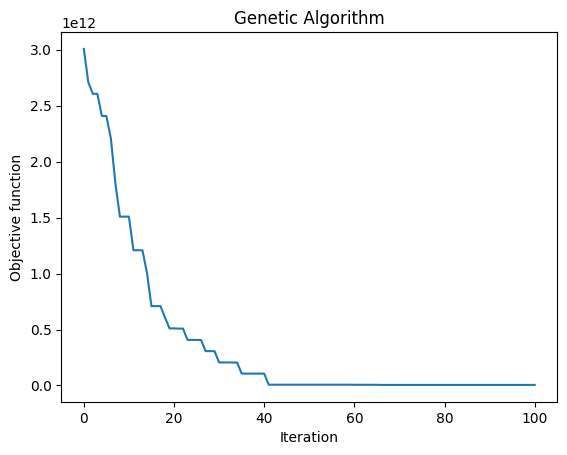

 The best solution found:                                                                           
 [ 522. 1128.  658.  802.  854.  775.  640.  705.  918.  952.  522. 1119.
  504.  570. 1000.  806. 1071.  998.  993.  864.  722.]

 Objective function:
 204000038087.22223


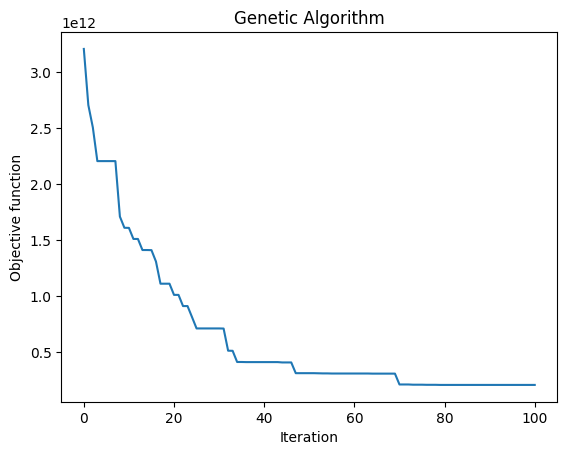

 The best solution found:                                                                           
 [ 837. 1045.  617.  937.  889.  874.  641.  543.  778.  841. 1019.  640.
  761.  815.  579.  488.  752.  956. 1037.  883.  491.]

 Objective function:
 5000038095.527778


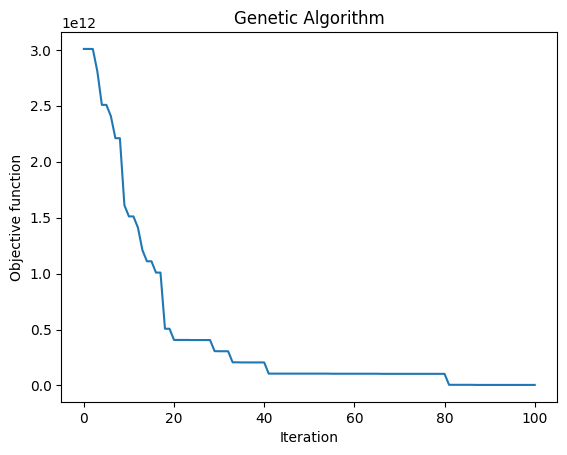

 The best solution found:                                                                           
 [ 686.  686.  836.  981.  935.  863.  495.  862.  483.  623.  876. 1046.
  732.  619.  488. 1041.  928.  797.  523.  566.  763.]

 Objective function:
 106000038095.05556


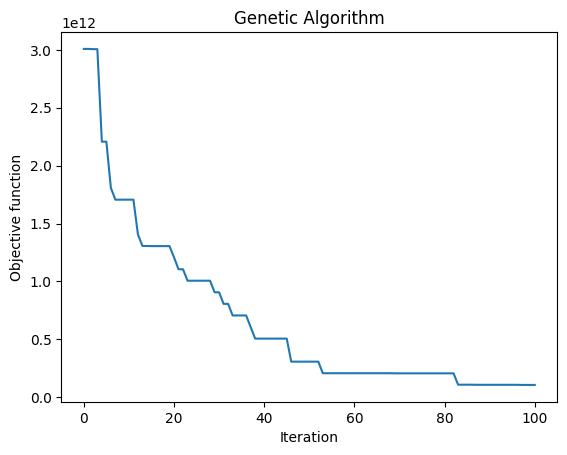

 The best solution found:                                                                           
 [ 777.  750.  501.  510.  811.  899. 1009.  588. 1035.  932.  508.  746.
  788.  912.  936.  988.  861.  622. 1031.  692. 1102.]

 Objective function:
 207000038126.54166


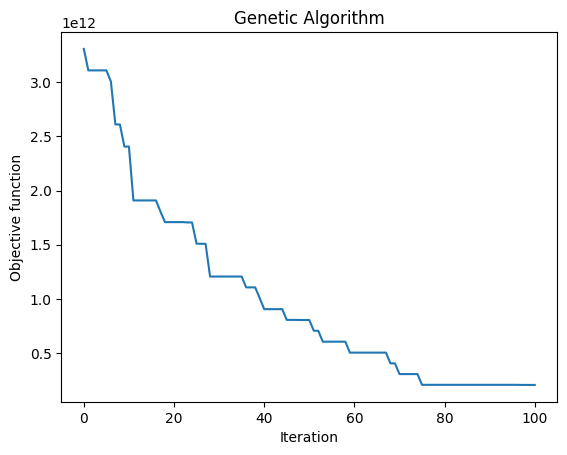

 The best solution found:                                                                           
 [ 612.  634.  810.  883.  928. 1008. 1123.  549.  732.  743.  879. 1079.
  612. 1193.  807. 1018.  954.  505.  532.  736.  997.]

 Objective function:
 208000038064.65277


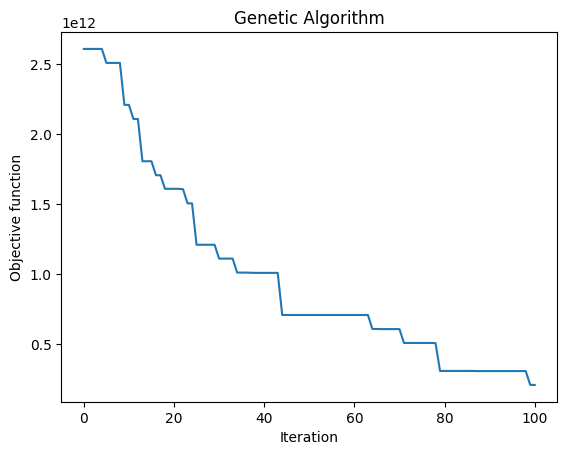

 The best solution found:                                                                           
 [ 502.  551.  486.  826.  938.  951. 1131. 1000. 1053.  764.  491.  526.
  581.  761.  888.  951.  681. 1018. 1049.  677.  636.]

 Objective function:
 102000037608.22223


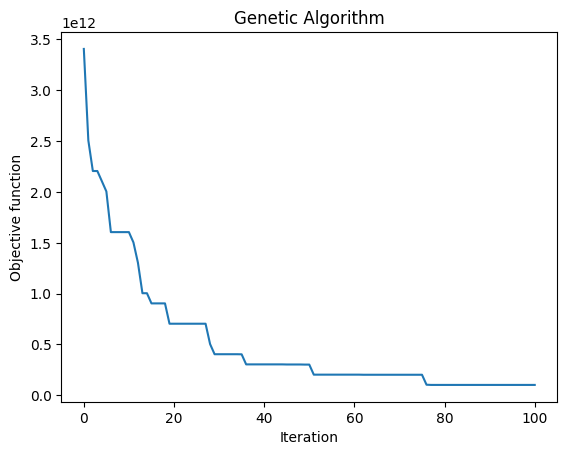

 The best solution found:                                                                           
 [ 841. 1124.  795.  505.  640. 1007.  904.  898.  486. 1028.  893.  874.
  500.  566.  962. 1043.  809.  802.  917.  724.  693.]

 Objective function:
 104000038021.95833


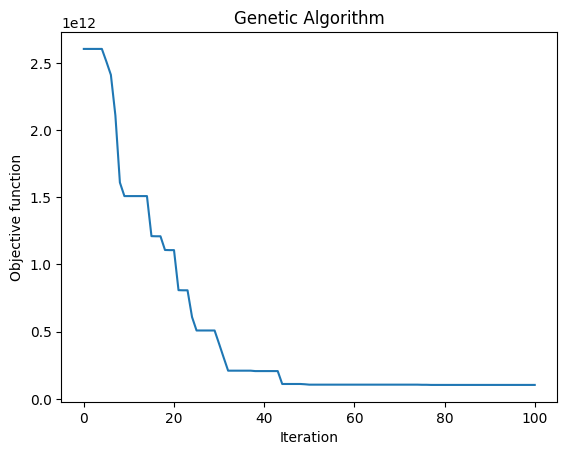

 The best solution found:                                                                           
 [ 822. 1098.  545.  884.  702. 1041.  558.  960.  899.  853.  540.  545.
  866.  781.  677. 1037. 1026.  936.  781. 1023.  664.]

 Objective function:
 2000038102.0833333


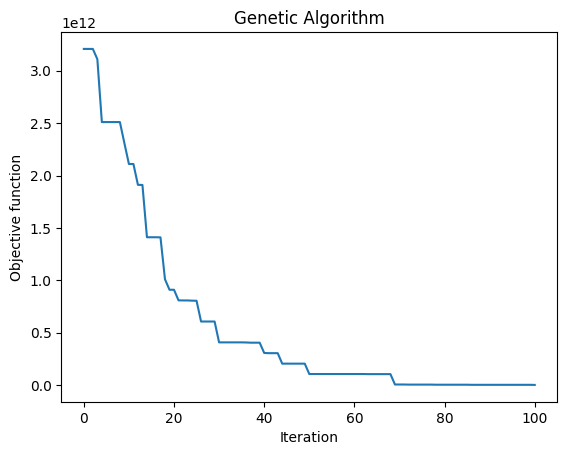

 The best solution found:                                                                           
 [ 678. 1109.  515.  843.  809.  581.  662.  653. 1041.  984. 1010.  922.
  932.  717.  481. 1059.  603.  920. 1031.  601.  543.]

 Objective function:
 5000038102.875


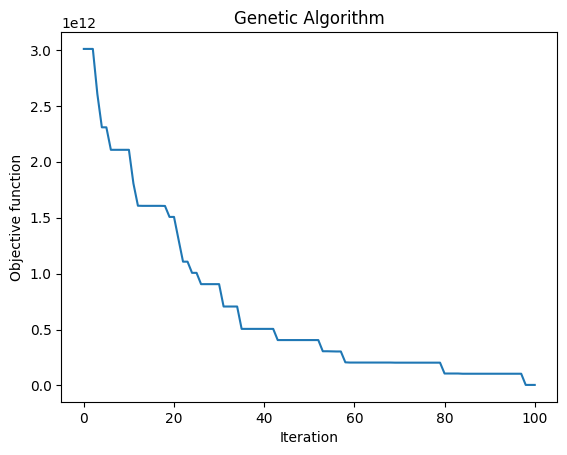

 The best solution found:                                                                           
 [ 481.  683.  585.  561.  960. 1042.  770.  883. 1022.  851.  522.  839.
  490. 1106.  762. 1047.  628.  976.  892. 1037.  488.]

 Objective function:
 201000037640.08334


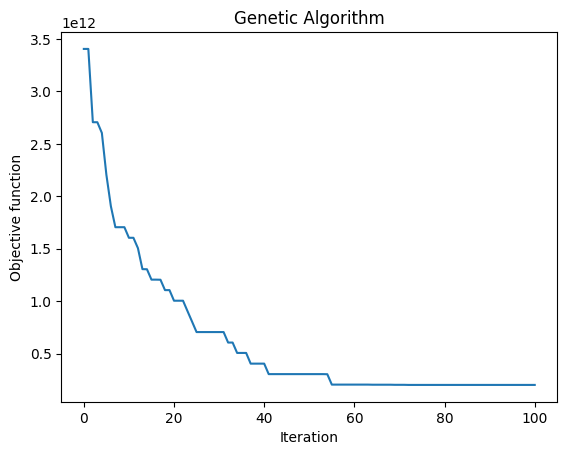

 The best solution found:                                                                           
 [ 562.  506.  723. 1018.  931.  886. 1128.  816.  858.  601.  487. 1090.
  512.  586.  808. 1040.  746.  937.  889.  877.  672.]

 Objective function:
 102000038049.43056


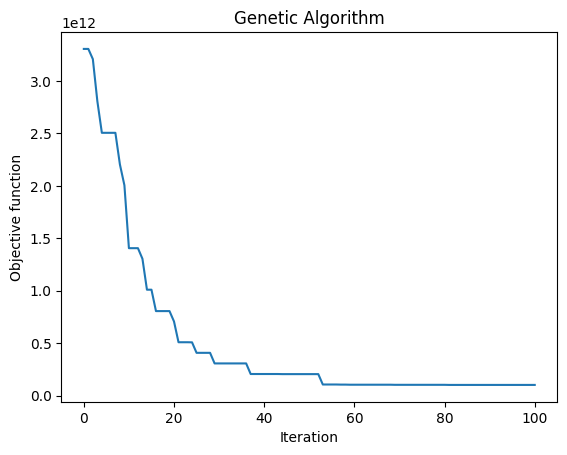

 The best solution found:                                                                           
 [ 552. 1162.  699.  678.  776.  924. 1100.  794. 1066.  951.  511.  775.
  948. 1018.  565.  850.  902.  888.  905.  496.  613.]

 Objective function:
 205000038007.0139


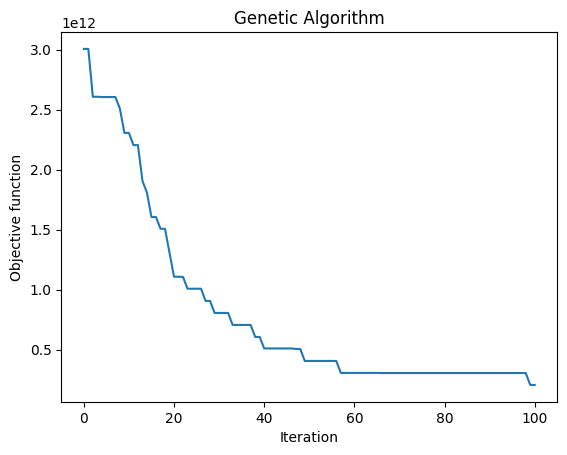

 The best solution found:                                                                           
 [1047. 1016.  510.  752.  604.  495.  898.  957.  720.  703.  492. 1012.
 1002.  897.  553.  790. 1142.  619.  939.  838.  551.]

 Objective function:
 5000038124.375


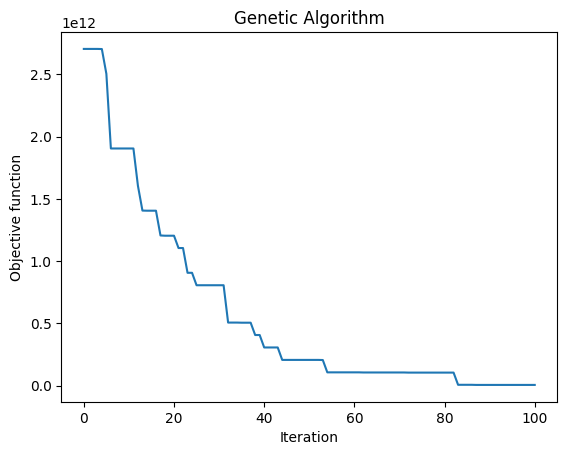

 The best solution found:                                                                           
 [ 846. 1173.  776.  735. 1017. 1039.  890. 1061.  545.  574.  848.  886.
  558.  650.  906. 1060.  486.  993.  960.  826.  855.]

 Objective function:
 304000038047.625


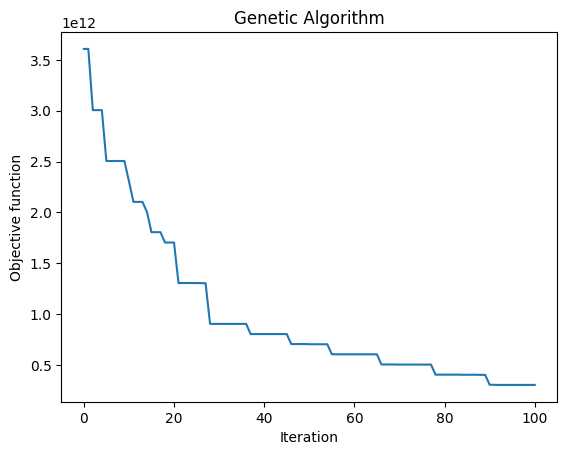

 The best solution found:                                                                           
 [ 487.  930.  562.  545.  850.  864.  671.  860. 1068.  725.  482.  663.
  485.  789. 1010. 1055. 1136. 1015. 1001.  611.  492.]

 Objective function:
 2000037572.625


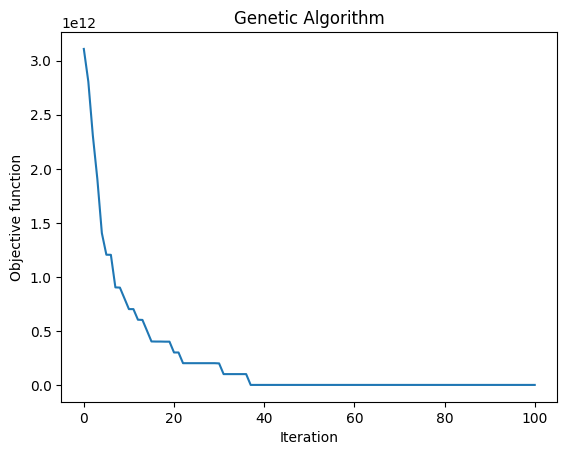

 The best solution found:                                                                           
 [ 483.  544.  594.  821.  702.  997.  620.  687. 1061. 1046.  534.  795.
  502.  968.  862. 1064. 1033.  906.  842. 1029.  490.]

 Objective function:
 1000038079.4166666


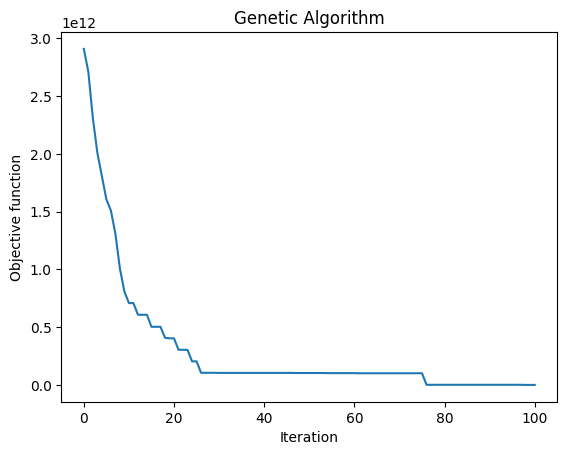

 The best solution found:                                                                           
 [ 482.  875.  488.  748.  643. 1032. 1108.  837. 1066. 1034.  481.  855.
 1002. 1106.  676. 1058. 1033.  916.  854.  550.  489.]

 Objective function:
 104000037987.11111


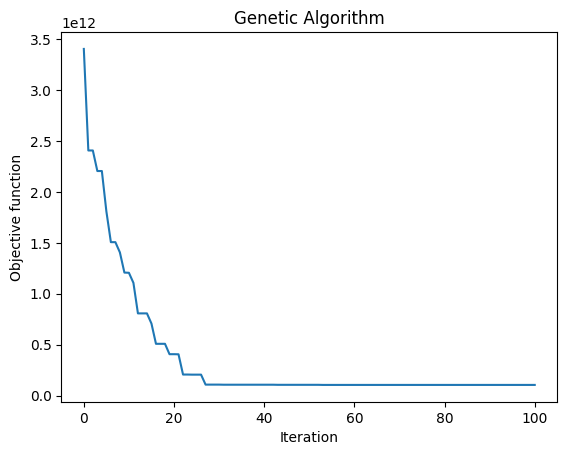

 The best solution found:                                                                           
 [1022.  878.  530.  780.  705.  496.  545.  691. 1052. 1048. 1015.  672.
  998.  954.  537.  492. 1152.  892.  849.  617.  483.]

 Objective function:
 5000037982.944445


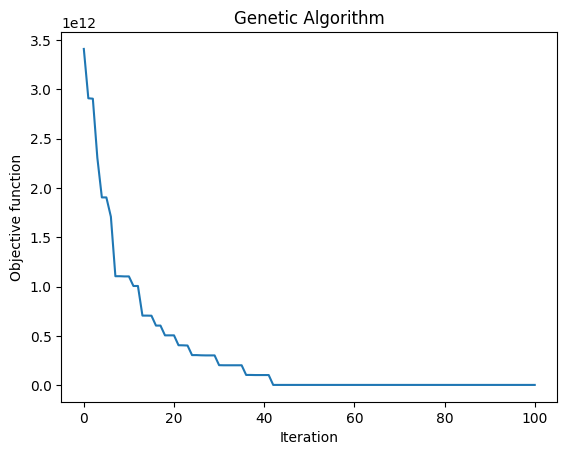

 The best solution found:                                                                           
 [ 860.  748.  489.  982.  629.  912.  558.  626.  842.  866.  856.  736.
  604.  909.  481. 1063. 1128.  557. 1016.  853. 1213.]

 Objective function:
 4000034298.3472223


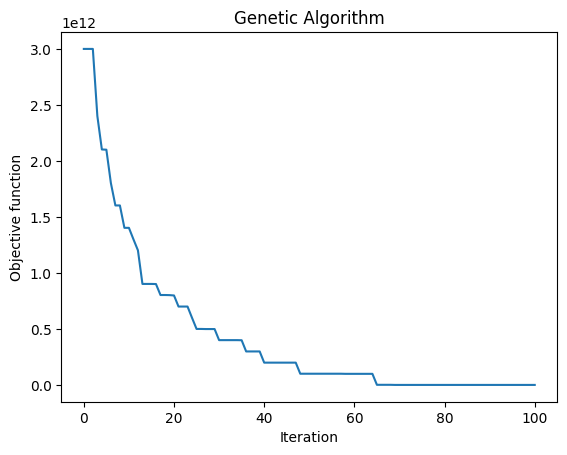

 The best solution found:                                                                           
 [ 585.  942.  713. 1135.  806. 1058. 1051.  658. 1024.  597.  511.  934.
  481. 1042.  592. 1051.  871.  858.  874.  730.  522.]

 Objective function:
 202000037644.8611


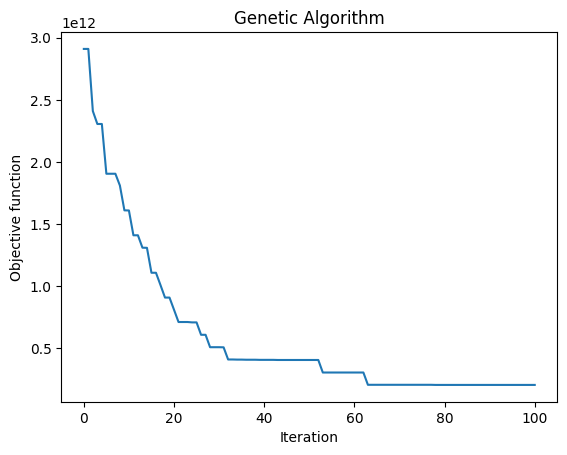

 The best solution found:                                                                           
 [ 586. 1020.  517.  740.  841.  872.  547.  857. 1064.  701.  783.  828.
  905.  545.  484. 1038. 1101.  957. 1018.  647.  610.]

 Objective function:
 4000037663.0277777


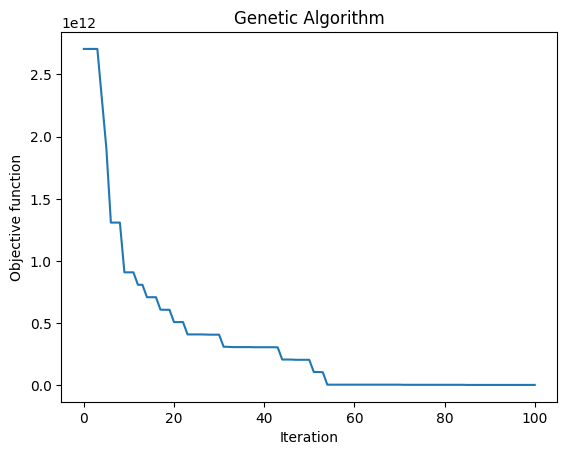

 The best solution found:                                                                           
 [ 507.  573.  572.  932.  821.  846.  767.  490. 1032. 1025.  548.  900.
  491. 1007.  912.  984. 1141.  841.  964.  678. 1221.]

 Objective function:
 5000038032.430555


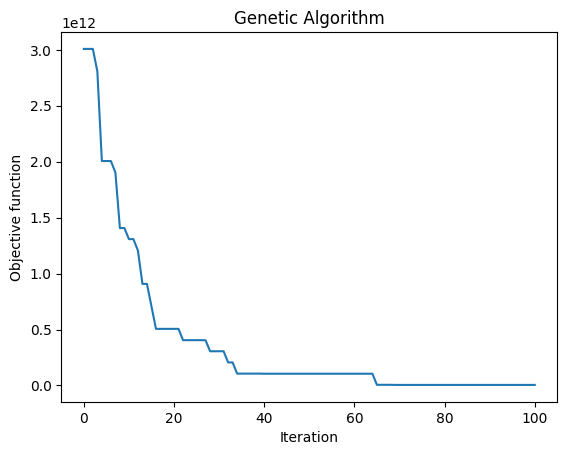

 The best solution found:                                                                           
 [ 714. 1166.  542.  528.  964.  819.  913.  990. 1031.  720.  570.  510.
  945.  714.  646. 1017. 1096.  860. 1044.  850.  829.]

 Objective function:
 304000038044.4167


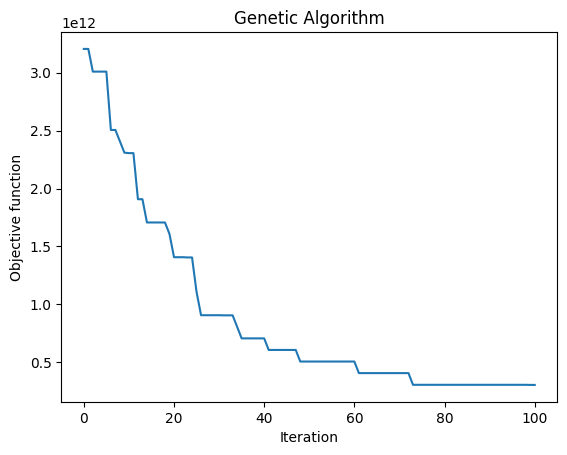

 The best solution found:                                                                           
 [ 486. 1124.  585.  670.  483. 1063.  770.  983.  843.  867.  482.  630.
  485.  762.  980. 1064. 1045.  846. 1032.  921.  561.]

 Objective function:
 2000037588.9305556


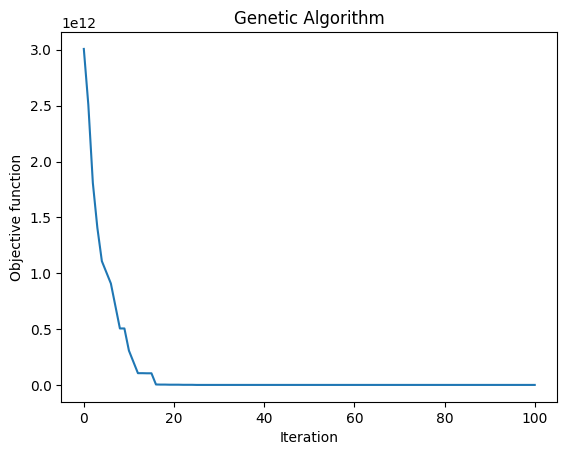

 The best solution found:                                                                           
 [ 515.  661.  483.  845. 1017. 1051. 1078. 1017.  697.  579.  506.  658.
  573.  555.  940. 1052. 1153.  949.  973.  765.  481.]

 Objective function:
 2000037598.0138888


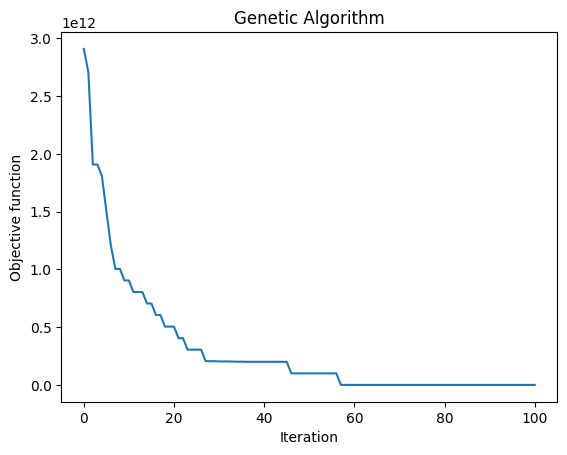

 The best solution found:                                                                           
 [ 506.  830.  562.  917.  733. 1037.  987.  485.  860.  654.  488.  804.
  485.  983.  911. 1064. 1154.  842. 1046.  566.  702.]

 Objective function:
 3000037994.4444447


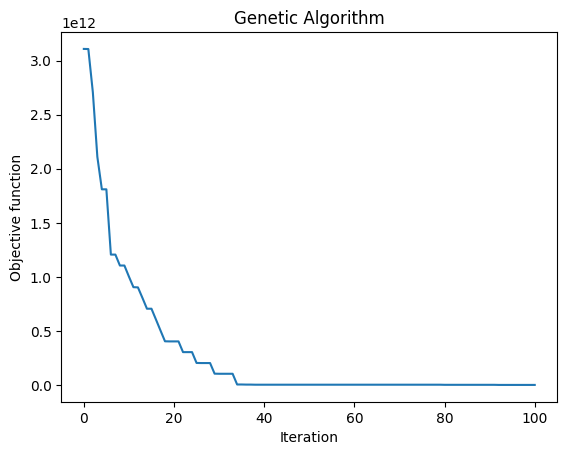

 The best solution found:                                                                           
 [ 575.  868.  515. 1127.  647. 1044.  728.  902.  842.  958.  485.  617.
  674.  724.  552. 1053.  785.  832. 1040. 1004.  569.]

 Objective function:
 101000038017.375


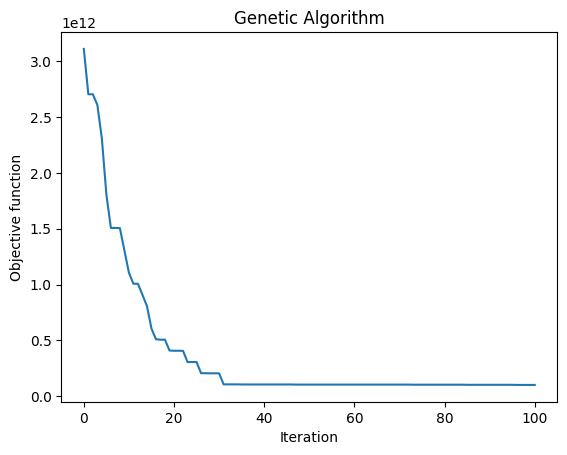

 The best solution found:                                                                           
 [ 484. 1001.  608.  623.  705. 1064.  783.  930. 1027.  896.  562.  895.
  486.  549.  863.  848. 1081.  936. 1046. 1143.  495.]

 Objective function:
 102000038024.68056


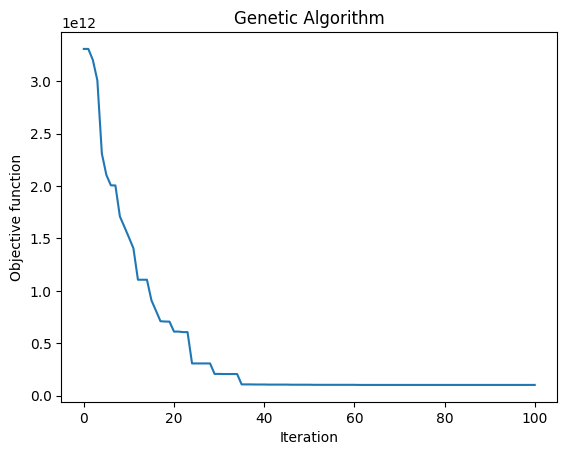

 The best solution found:                                                                           
 [ 491.  638.  494.  981.  808. 1053. 1144.  826.  783.  724.  864.  957.
  595.  481.  943.  955. 1064.  719. 1030.  880.  581.]

 Objective function:
 102000037989.70833


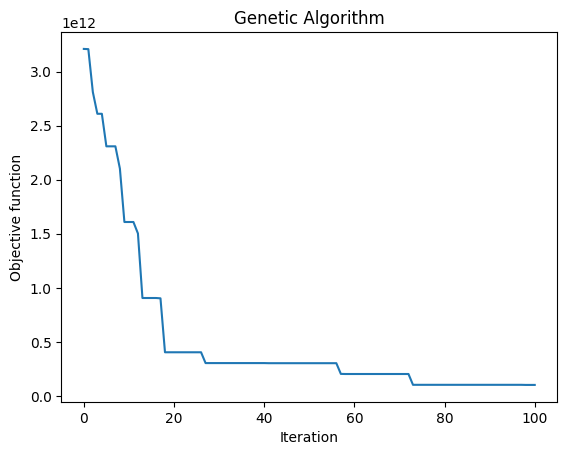

 The best solution found:                                                                           
 [1036. 1031.  810.  584.  732.  485.  927.  788.  910.  686.  491.  577.
  574. 1111.  889. 1044.  980.  800. 1030.  489.  721.]

 Objective function:
 205000038010.68054


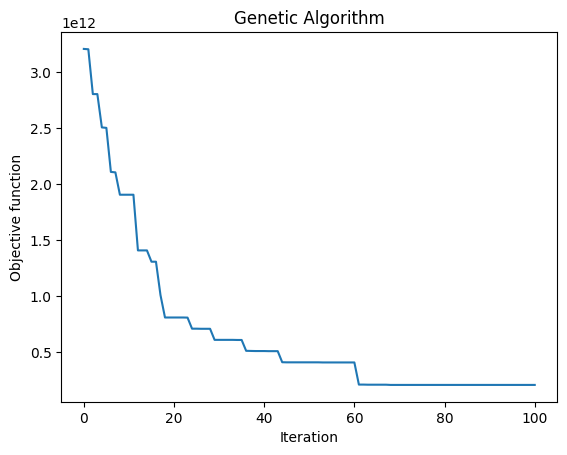

 The best solution found:                                                                           
 [ 492. 1033.  589.  915.  865. 1058.  629.  779.  971.  999. 1024.  578.
 1004.  849.  717.  551. 1151.  935.  682. 1147.  523.]

 Objective function:
 103000038066.13889


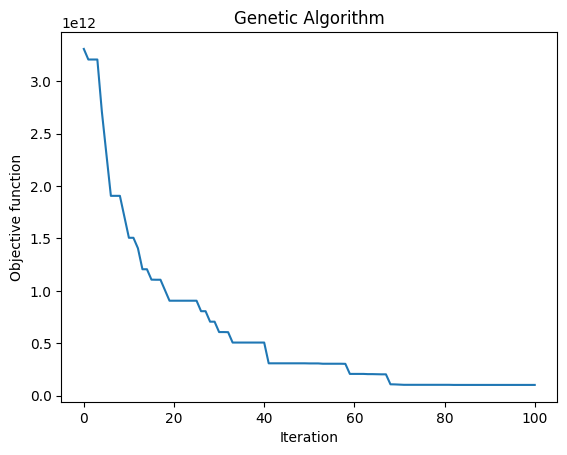

 The best solution found:                                                                           
 [ 501. 1035.  871. 1133.  525. 1055.  885.  871.  662.  594.  648.  842.
  624.  763.  964. 1040.  589.  956.  992.  710.  840.]

 Objective function:
 104000038111.13889


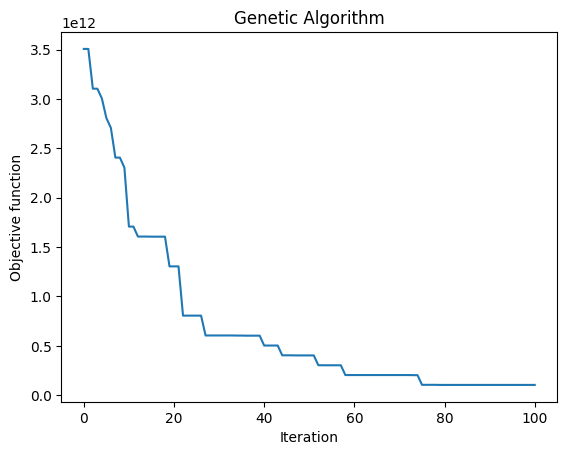

 The best solution found:                                                                           
 [ 495. 1000.  482.  605.  958. 1062.  937.  721.  850.  679.  481.  564.
  563.  783.  933. 1046.  849.  672. 1049. 1149.  483.]

 Objective function:
 102000037973.05556


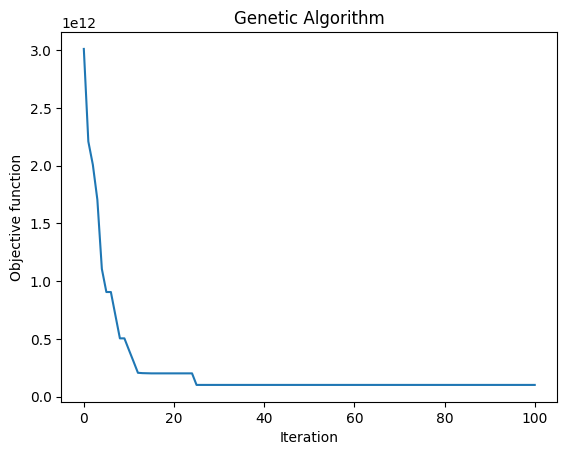

 The best solution found:                                                                           
 [ 501. 1085.  483.  544.  862.  841.  631.  922. 1068.  817.  499. 1084.
  562.  629.  936. 1061.  997.  989. 1002.  726.  491.]

 Objective function:
 3000037580.7916665


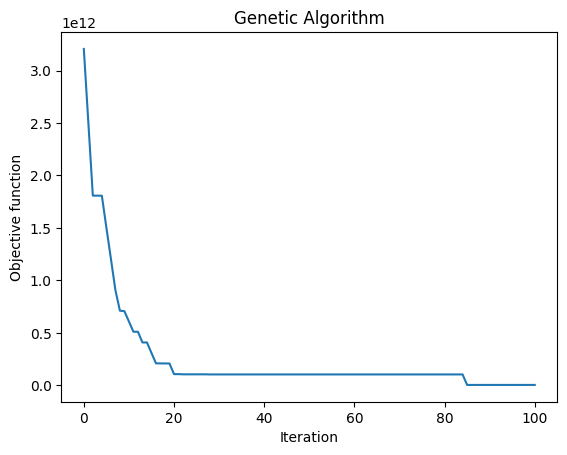

 The best solution found:                                                                           
 [ 852.  942.  590.  555.  849. 1032.  754.  954.  831.  699.  487.  542.
  495.  751.  679. 1063. 1146.  678. 1048. 1018.  482.]

 Objective function:
 2000037977.3888888


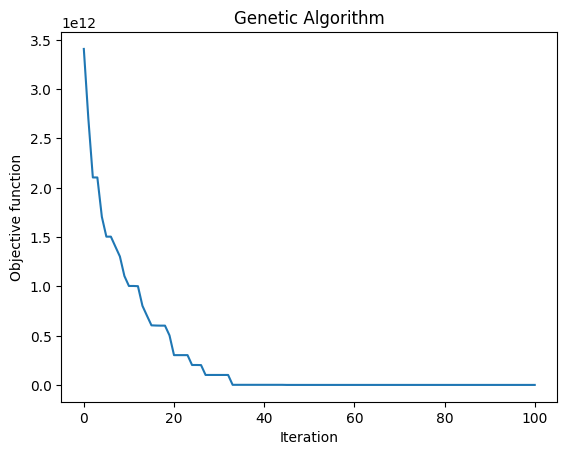

 The best solution found:                                                                           
 [ 969.  920.  642.  825.  514.  531.  644.  638.  924. 1004.  482.  624.
  485. 1133.  851. 1059.  773.  764. 1036.  998.  571.]

 Objective function:
 103000038013.83333


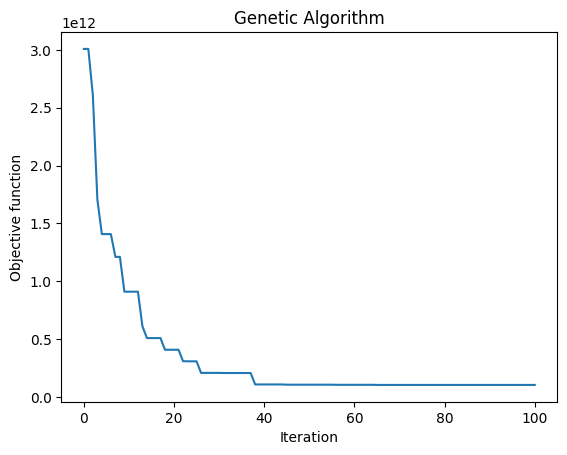

 The best solution found:                                                                           
 [ 481.  703.  497.  934.  896. 1056.  626.  624. 1067.  830.  555.  697.
  871.  814.  998. 1030. 1145. 1004.  974.  543.  491.]

 Objective function:
 1000038010.2083334


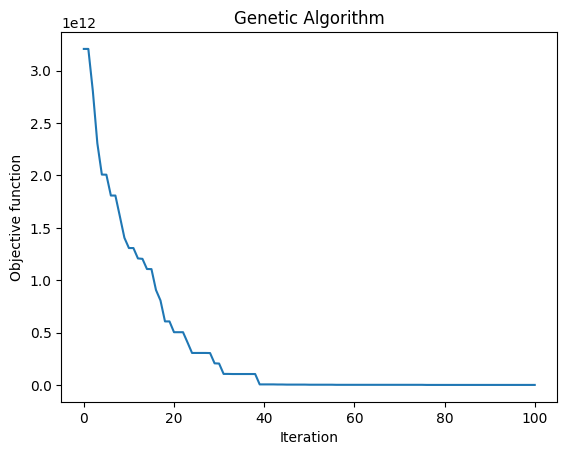

 The best solution found:                                                                           
 [ 486. 1121.  622.  712.  485. 1048.  801.  843. 1052.  967.  504.  787.
  483.  568. 1014.  849.  919.  998. 1041.  661.  959.]

 Objective function:
 5000037985.583333


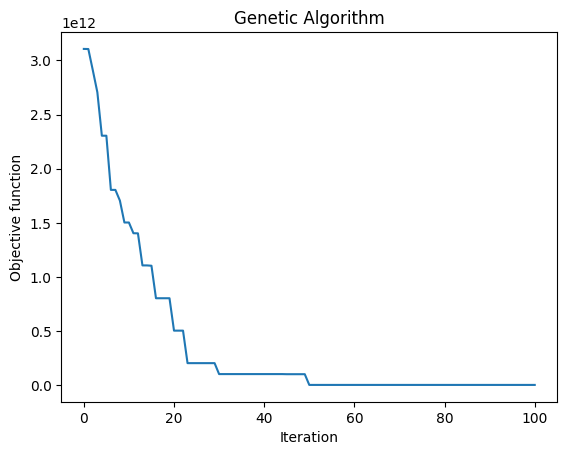

 The best solution found:                                                                           
 [ 947.  490.  486.  692.  599.  535.  833.  825.  947.  967.  845.  789.
  972. 1010.  901.  485. 1074.  896.  739. 1142.  567.]

 Objective function:
 202000037619.56946


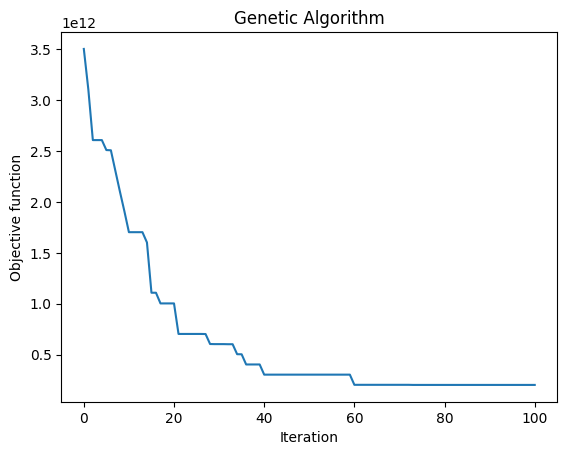

 The best solution found:                                                                           
 [ 501.  937.  484.  802.  939.  924. 1031.  734.  856.  616.  930. 1082.
  647.  591.  849. 1058.  878.  719. 1041.  877.  683.]

 Objective function:
 103000038061.40277


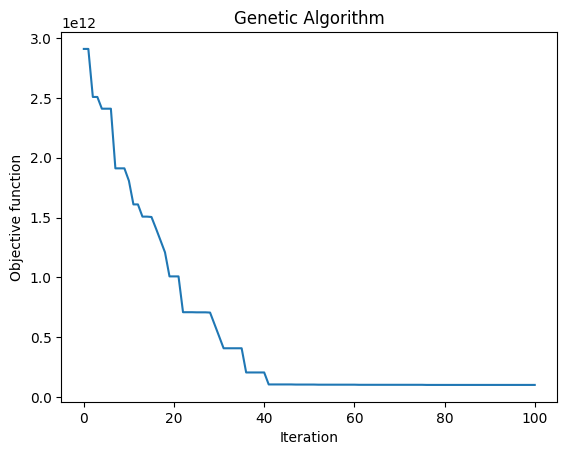

 The best solution found:                                                                           
 [ 640.  788.  806.  615. 1081.  840.  909.  935. 1026. 1045.  734.  766.
  626.  902.  508.  844. 1142.  547.  524.  707.  888.]

 Objective function:
 106000038110.70833


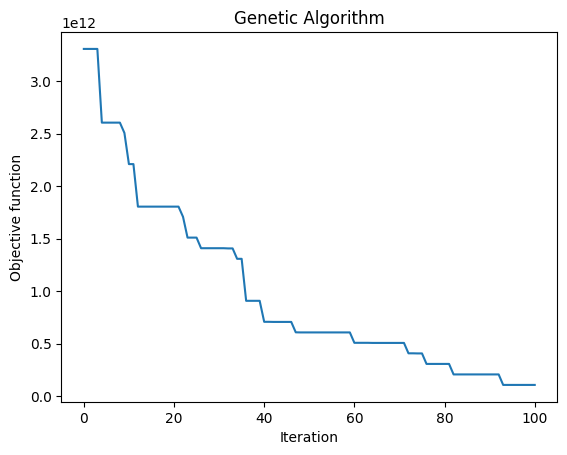

 The best solution found:                                                                           
 [ 841. 1123.  839.  481.  775. 1031.  965.  543.  481. 1038. 1034.  734.
  496.  843.  953.  493.  915.  661. 1002. 1021.  558.]

 Objective function:
 104000037942.05556


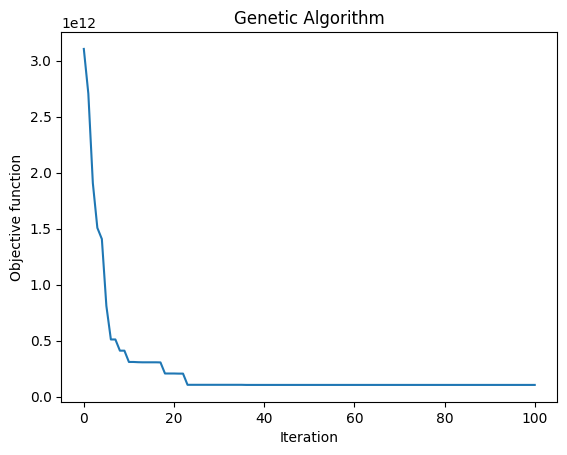

 The best solution found:                                                                           
 [ 481. 1183.  561.  789.  661. 1059.  562.  997. 1057.  898.  842.  547.
  481.  936. 1013. 1054.  741.  483.  940.  881.  854.]

 Objective function:
 104000037944.81944


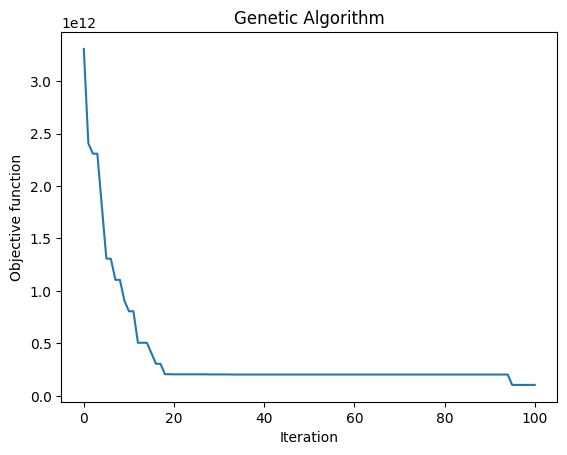

 The best solution found:                                                                           
 [ 494.  743.  487.  872.  849. 1045. 1008.  958. 1049.  614.  589.  739.
  996.  999.  545.  841. 1144.  488.  932.  685.  577.]

 Objective function:
 4000037983.6805553


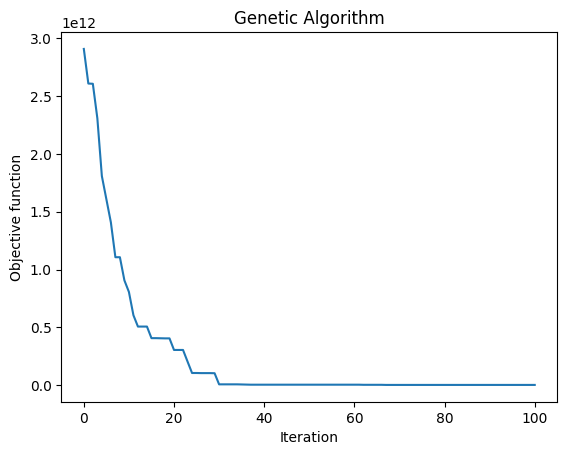

 The best solution found:                                                                           
 [ 481.  871.  487. 1118.  625. 1063.  559.  762.  686. 1010.  846. 1086.
 1004.  558.  630. 1062. 1002.  955.  917.  701.  495.]

 Objective function:
 102000037999.69444


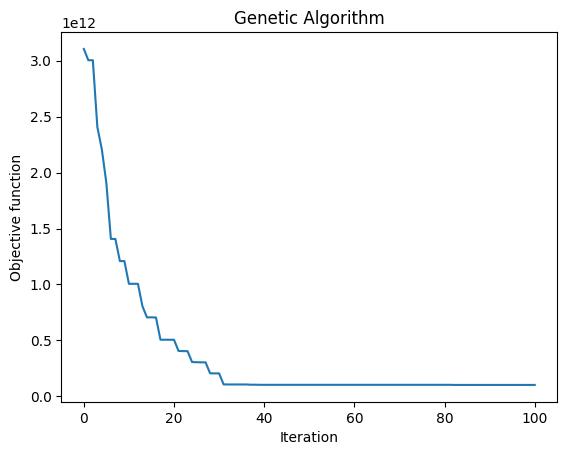

 The best solution found:                                                                           
 [1004.  515.  780. 1050.  707.  540.  900.  897.  481.  609.  552. 1034.
  544.  971.  770. 1044. 1144.  896. 1046.  840.  726.]

 Objective function:
 205000038023.79166


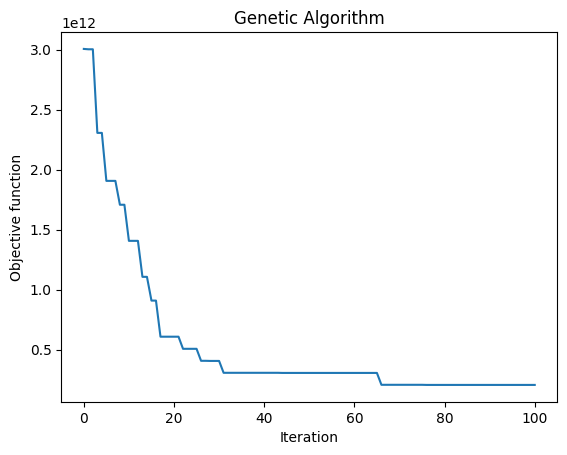

 The best solution found:                                                                           
 [ 557. 1095.  925.  927.  673.  872. 1020.  606.  505.  542. 1014.  900.
  517. 1011.  915.  525.  848.  652. 1009.  738.  486.]

 Objective function:
 4000038023.4027777


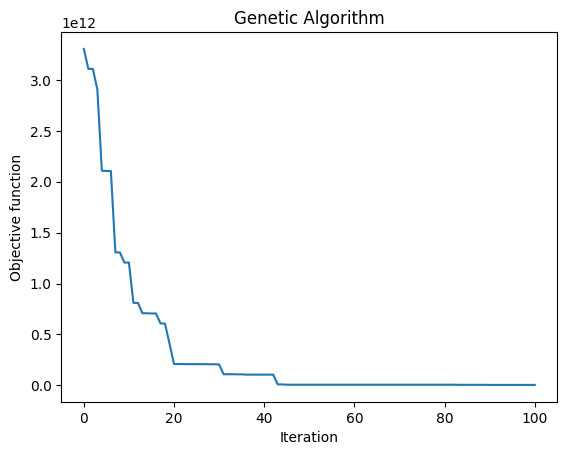

 The best solution found:                                                                           
 [ 524.  937.  554. 1135.  883. 1057. 1020.  790.  846.  668.  485. 1017.
  798.  876.  953. 1034.  592.  767. 1036.  651.  529.]

 Objective function:
 103000038028.41667


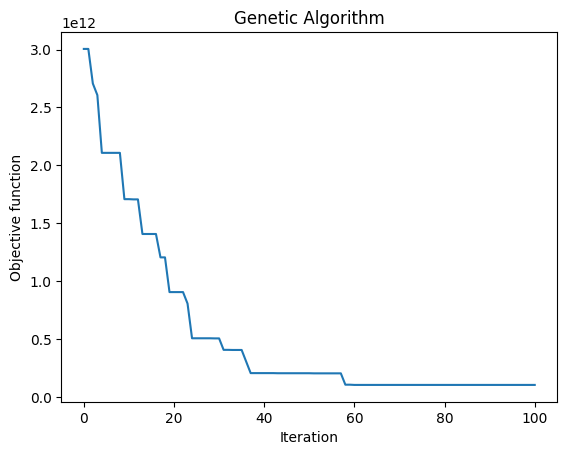

 The best solution found:                                                                           
 [ 984.  983.  947.  661.  557.  504.  920.  554.  702.  821.  484.  622.
  589. 1068.  481. 1009.  764.  897.  745.  865.  733.]

 Objective function:
 108000038092.22223


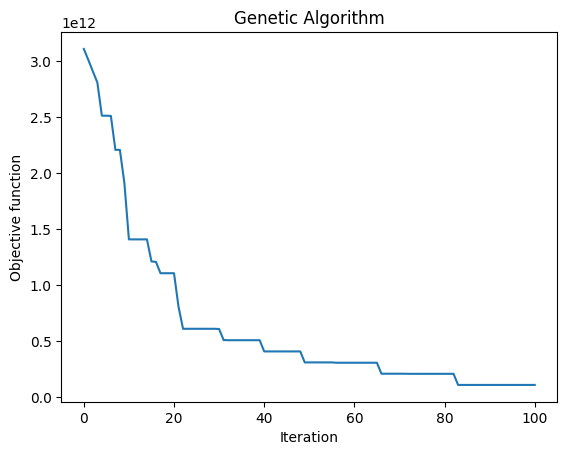

 The best solution found:                                                                           
 [ 543.  938.  781. 1179.  495. 1028. 1103.  924. 1053.  628.  665.  576.
  582.  873. 1017.  797.  744.  486.  902.  794.  985.]

 Objective function:
 305000038053.81946


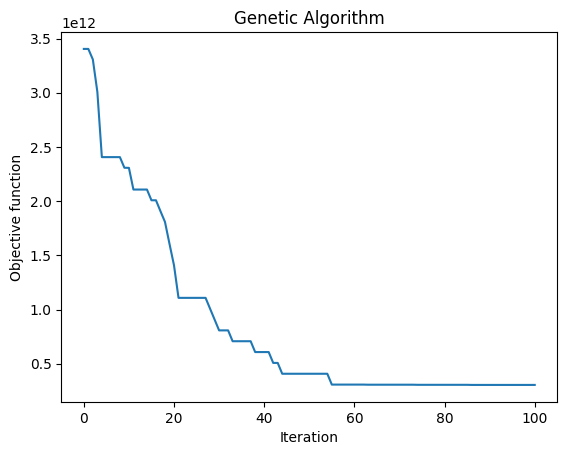

 The best solution found:                                                                           
 [ 489. 1033.  542.  637.  786. 1058.  729.  920. 1051.  986.  496.  606.
  618.  720.  896. 1062.  541.  971.  849. 1147.  483.]

 Objective function:
 101000037587.52777


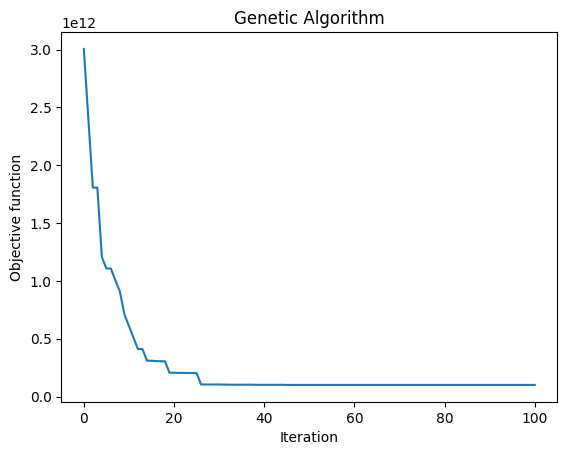

 The best solution found:                                                                           
 [ 483. 1122.  571.  736.  839.  843.  636.  998. 1054.  950.  482.  702.
  494.  923.  993. 1058. 1072.  854. 1044.  575.  484.]

 Objective function:
 2000037579.3055556


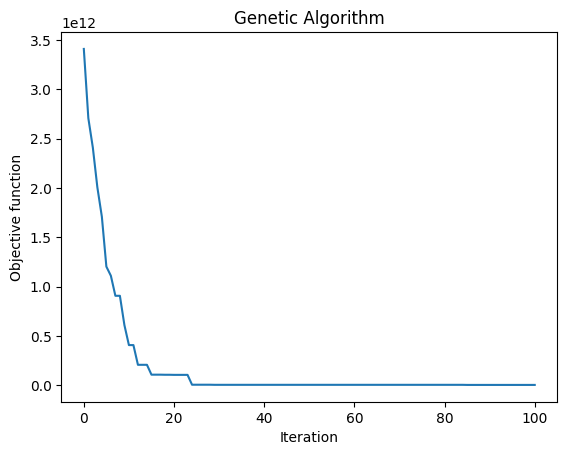

 The best solution found:                                                                           
 [ 539.  999.  951.  880.  731. 1054.  552.  706.  492.  670.  489. 1092.
  508.  547.  890.  847.  657.  957. 1032.  804.  484.]

 Objective function:
 3000037992.4027777


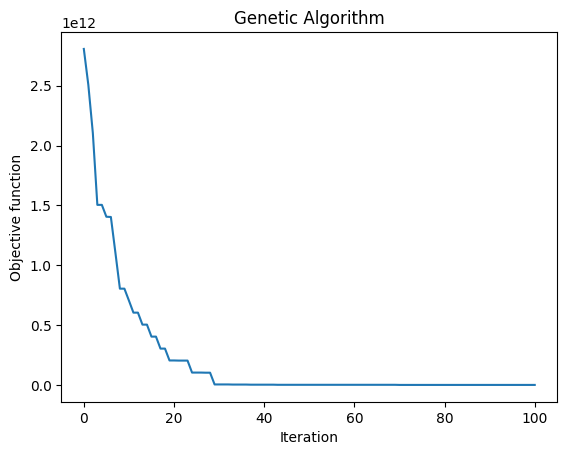

 The best solution found:                                                                           
 [ 626. 1118.  481.  484.  963.  816.  577.  837.  583.  636.  481. 1091.
 1000.  571.  899.  786. 1025.  929.  833.  667.  733.]

 Objective function:
 103000035512.73611


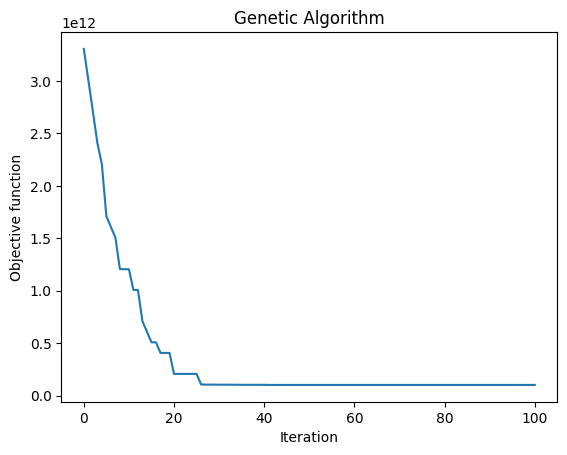

 The best solution found:                                                                           
 [ 497.  955.  815.  863.  725.  924. 1039.  941.  486.  550.  547.  926.
  641. 1123.  847. 1064.  667.  788. 1043.  587.  512.]

 Objective function:
 103000038019.90277


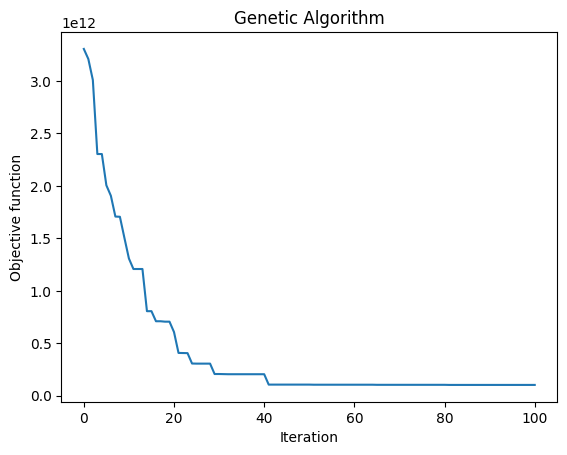

 The best solution found:                                                                           
 [ 493. 1124.  492.  671.  805. 1011.  551.  807.  869.  753.  853.  888.
  595.  543.  929. 1041. 1023.  738. 1024. 1019.  491.]

 Objective function:
 2000038002.3194444


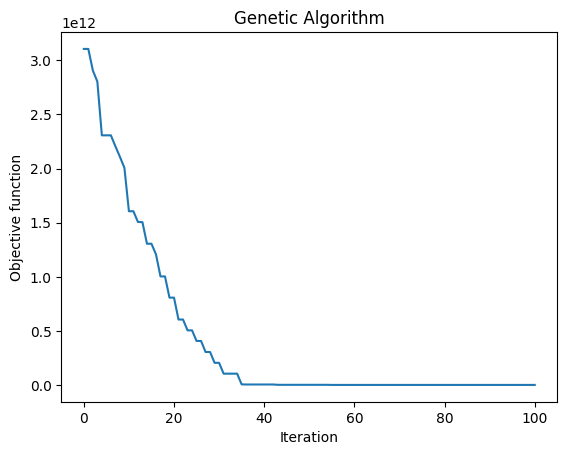

 The best solution found:                                                                           
 [ 656.  790.  544.  962.  930.  849.  890.  575.  994. 1023.  661.  565.
  632. 1124.  883.  952.  730.  866.  991. 1064.  688.]

 Objective function:
 201000038193.08334


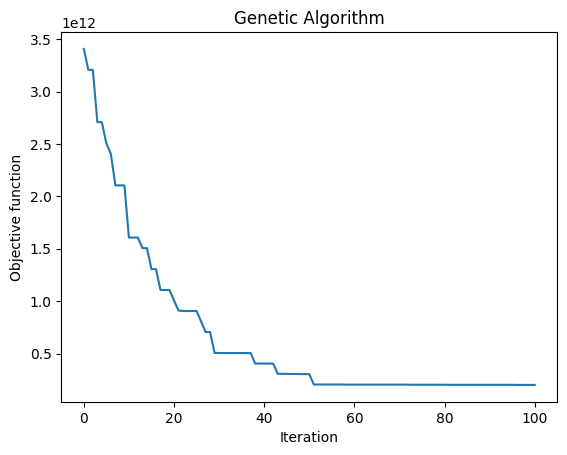

 The best solution found:                                                                           
 [ 769.  814.  650.  946.  878.  848.  711.  621.  987. 1013.  489.  691.
  812. 1070.  984.  991. 1154.  627.  584.  560.  494.]

 Objective function:
 103000038061.72223


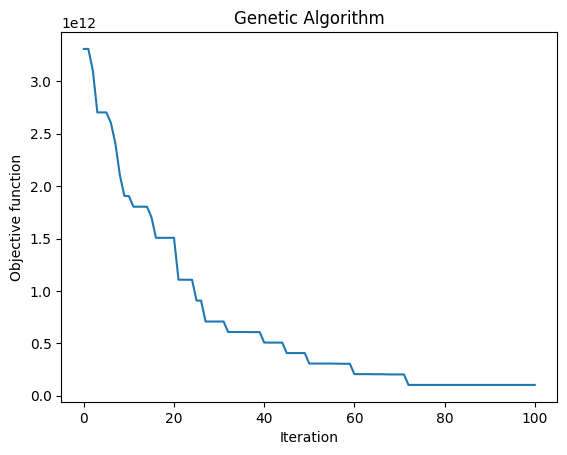

 The best solution found:                                                                           
 [ 557. 1046.  814.  633.  518.  870.  879.  801. 1045.  739. 1000. 1043.
  537.  872.  920.  503. 1213.  786. 1040.  983.  694.]

 Objective function:
 106000038030.01389


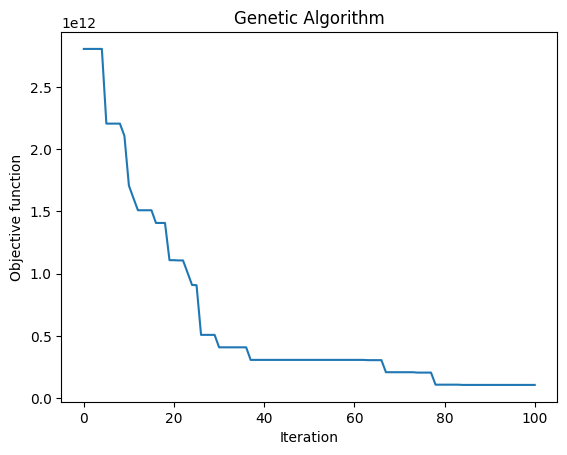

 The best solution found:                                                                           
 [ 483.  691.  482.  841.  876. 1063.  630.  626.  842.  782.  728.  840.
  759. 1019.  545.  857. 1153.  514. 1044.  968.  482.]

 Objective function:
 1000037975.9583334


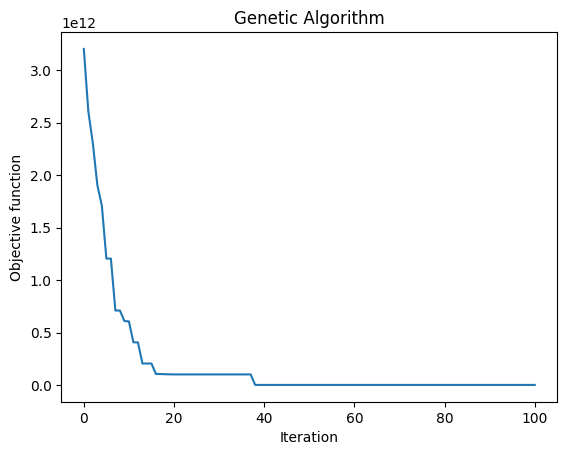

 The best solution found:                                                                           
 [ 495.  962.  702.  649.  546. 1060.  849.  958.  484. 1048.  496.  617.
 1004.  776.  489. 1064. 1148.  841.  842.  724.  585.]

 Objective function:
 4000037964.763889


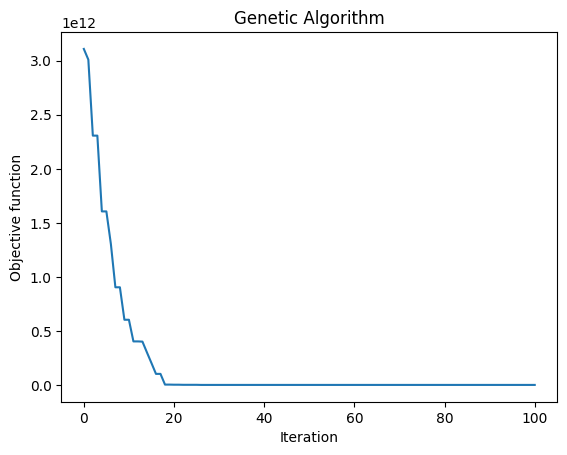

 The best solution found:                                                                           
 [ 584.  831.  492.  951.  940. 1033.  561.  705.  844.  672.  484.  823.
  570.  557.  722. 1054. 1151.  846. 1042. 1029.  481.]

 Objective function:
 1000037976.8611112


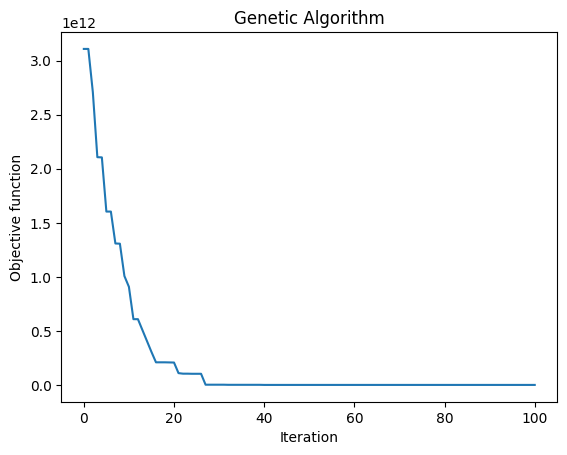

 The best solution found:                                                                           
 [ 491.  671.  777.  959.  976.  888. 1095.  771.  872.  599.  482.  661.
  500.  883.  886. 1059. 1149.  819. 1037.  590.  511.]

 Objective function:
 2000038019.0555556


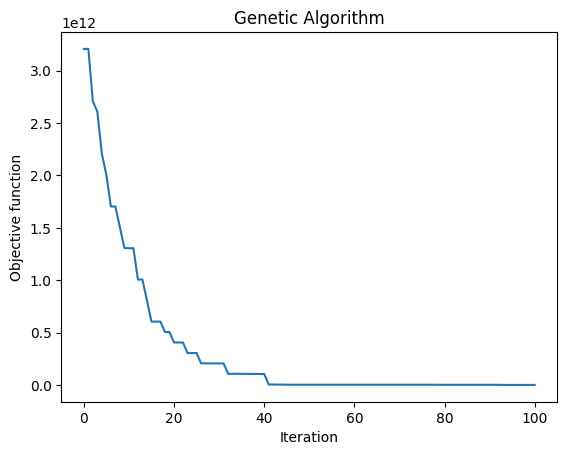

 The best solution found:                                                                           
 [ 515. 1116.  481.  671.  596. 1061.  956.  588.  870. 1032.  578.  552.
  567.  758. 1007. 1047.  819. 1004.  995.  884.  484.]

 Objective function:
 1000038009.8333334


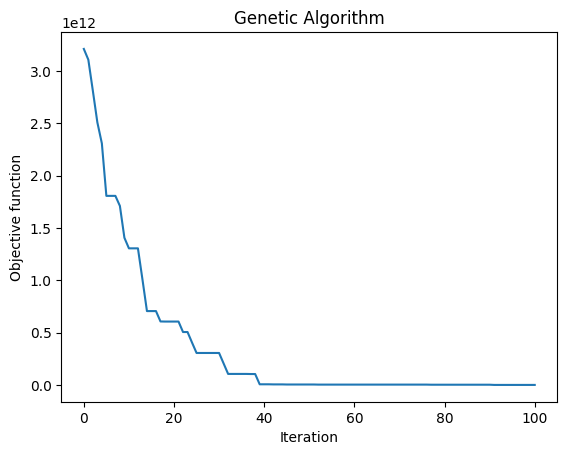

 The best solution found:                                                                           
 [ 991. 1112.  491.  813.  748.  535.  910.  725. 1060. 1049.  485. 1094.
  982.  907.  884. 1020.  675.  988.  846.  546.  513.]

 Objective function:
 4000037993.0277777


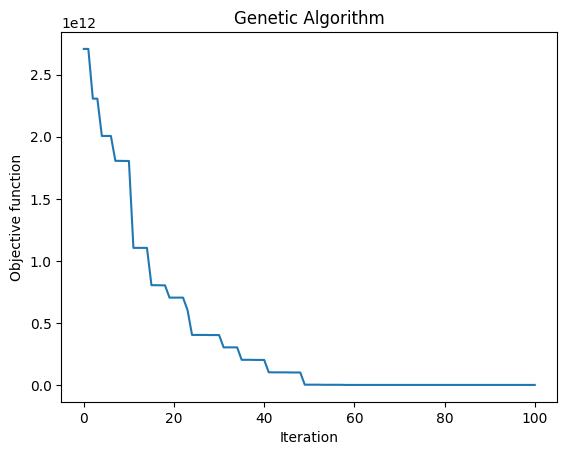

 The best solution found:                                                                           
 [ 510.  946.  592.  618.  765.  871.  879.  941. 1058. 1049.  553.  943.
  490.  875.  862. 1053.  543.  756.  956.  702.  508.]

 Objective function:
 3000038086.236111


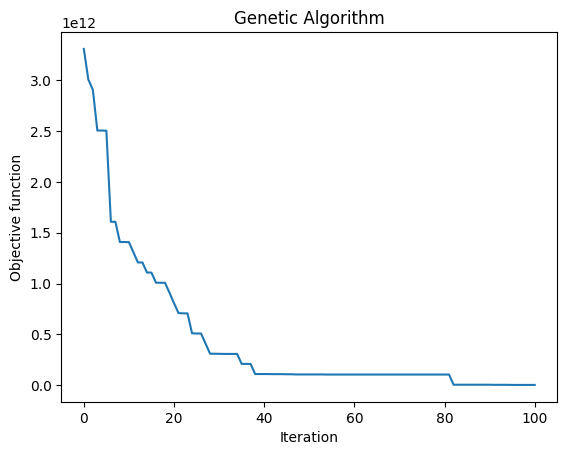

 The best solution found:                                                                           
 [ 556.  974.  666.  675. 1102.  882.  859.  490.  481.  818.  498. 1067.
  503.  602.  799. 1034.  737.  923. 1036.  910.  554.]

 Objective function:
 105000038030.88889


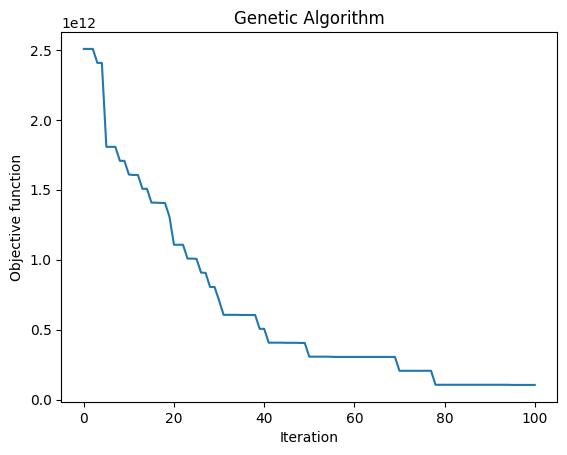

 The best solution found:                                                                           
 [ 645.  690.  625. 1133.  504.  952. 1037.  805.  709.  930.  797. 1025.
  969. 1199.  905.  513.  979.  893.  730.  823.  610.]

 Objective function:
 403000038182.93054


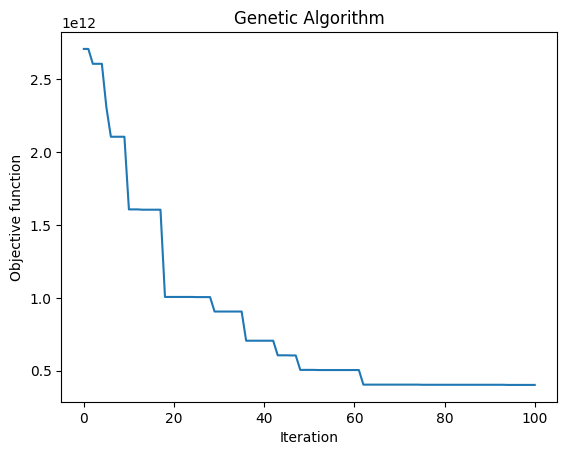

 The best solution found:                                                                           
 [ 845.  843.  894.  945.  615. 1064.  728.  481. 1062. 1014.  487.  683.
  484. 1011.  950.  957. 1152.  616. 1048.  560.  878.]

 Objective function:
 4000037979.5


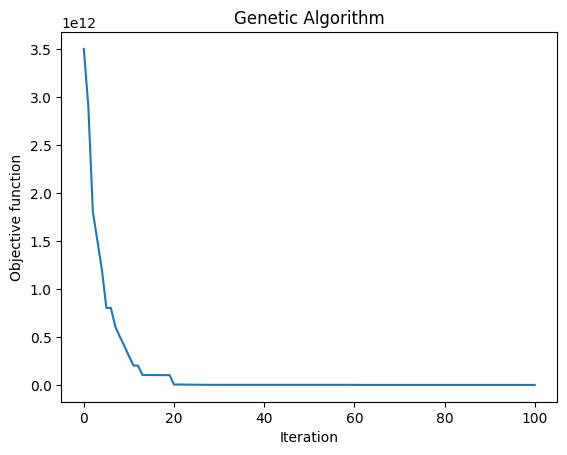

 The best solution found:                                                                           
 [ 483.  942.  482.  605.  763. 1061.  545.  737. 1005. 1046.  481.  721.
  572.  875.  844. 1059. 1153.  948.  849. 1027.  486.]

 Objective function:
 1000037973.9861112


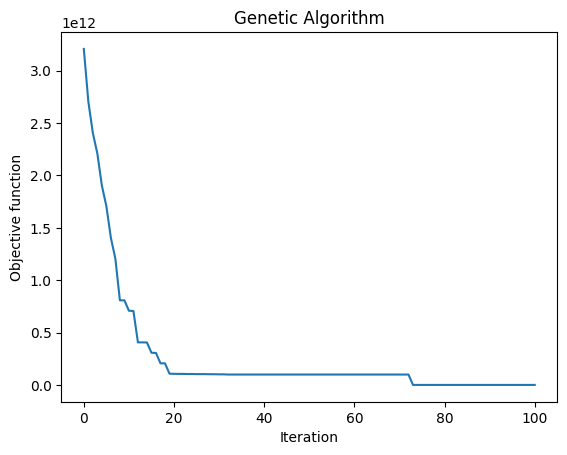

 The best solution found:                                                                           
 [ 482.  605.  582.  971.  817.  842.  700.  691.  803.  760.  486.  940.
  483. 1138.  945. 1049.  544.  851. 1049.  879.  492.]

 Objective function:
 100000037984.30556


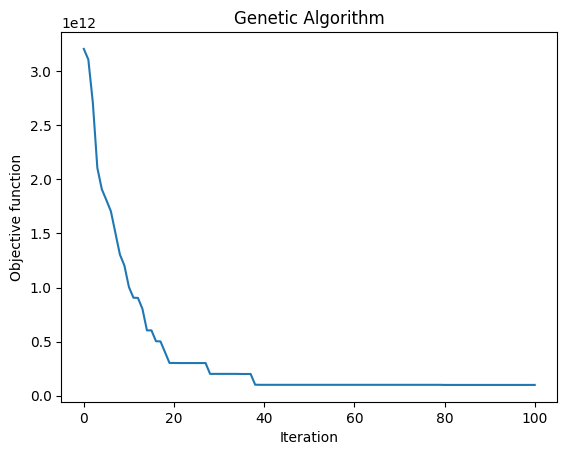

 The best solution found:                                                                           
 [ 499. 1118.  732.  986.  663.  842.  749.  680.  488.  914.  485.  948.
  482.  542.  954. 1064.  864.  606. 1045.  861.  487.]

 Objective function:
 3000037964.8194447


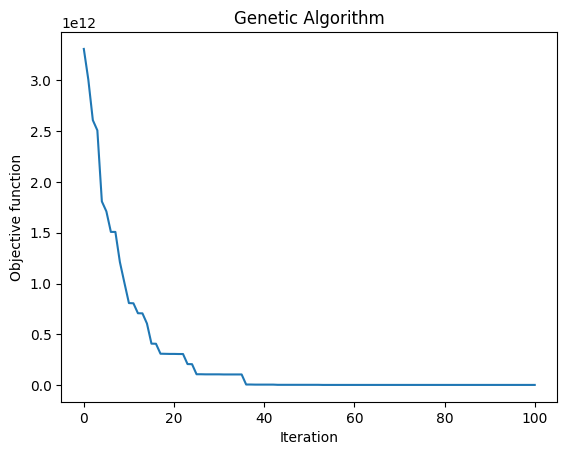

 The best solution found:                                                                           
 [ 857.  484.  563. 1087.  704. 1045.  980.  932.  771.  830.  494. 1078.
  481.  901.  973. 1060.  766.  611. 1044.  824.  562.]

 Objective function:
 202000037989.02777


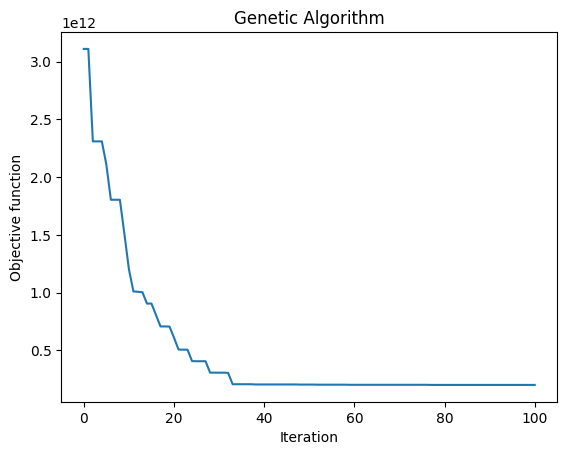

 The best solution found:                                                                           
 [ 497.  594.  577.  987.  931. 1053.  741.  486. 1047.  803.  524.  734.
  500.  909.  844. 1036. 1117.  845.  845.  672.  561.]

 Objective function:
 2000038048.1944444


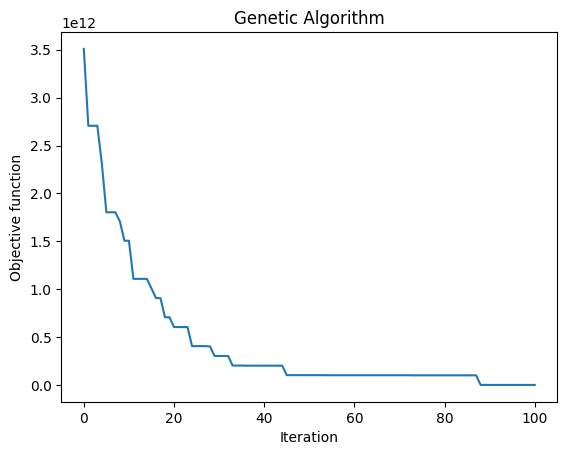

 The best solution found:                                                                           
 [ 780. 1045.  499.  647.  815.  846.  595.  973.  942.  722.  522.  784.
  808.  715.  974. 1024. 1132.  909. 1032.  543.  482.]

 Objective function:
 3000037622.486111


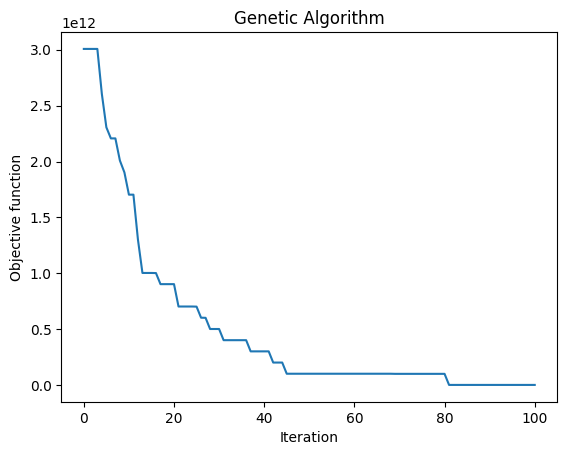

 The best solution found:                                                                           
 [ 605.  928.  503.  830.  634.  978.  771.  698.  825. 1032.  558.  903.
  867. 1077.  606. 1014. 1141.  912.  999. 1013.  570.]

 Objective function:
 102000038132.76389


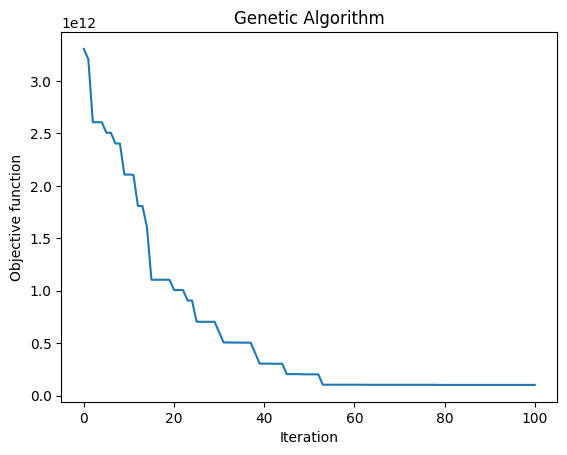

 The best solution found:                                                                           
 [ 966.  734.  520.  608.  908. 1009.  976.  519.  864.  823.  873.  595.
  695. 1110.  944.  776.  858.  743. 1011. 1029.  484.]

 Objective function:
 204000038171.95834


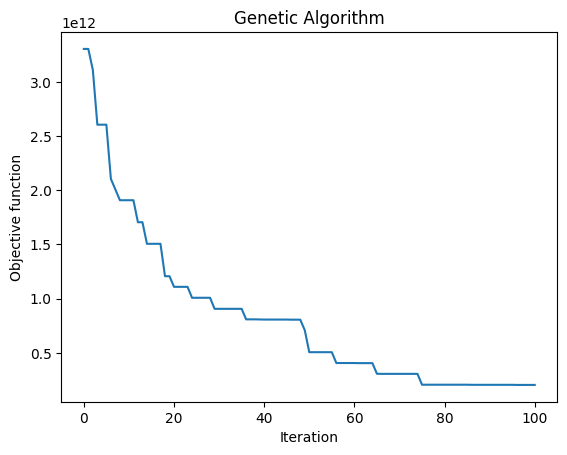

 The best solution found:                                                                           
 [ 482. 1124.  481.  831.  616. 1058.  744. 1016.  841.  980.  481.  797.
  560.  542. 1018. 1063.  917.  679. 1046.  914.  481.]

 Objective function:
 2000037549.3472223


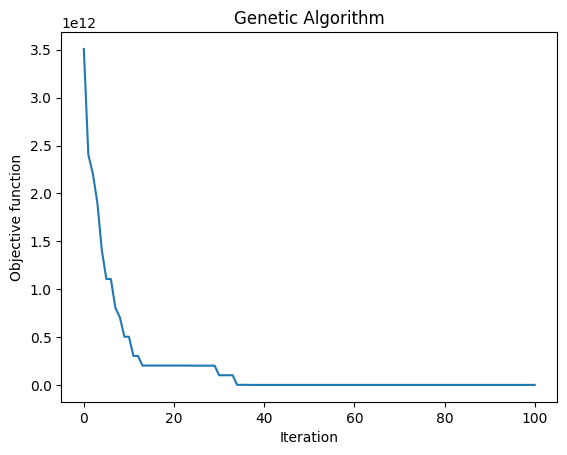

 The best solution found:                                                                           
 [ 511.  782.  693.  959.  913. 1064.  553.  546.  486.  650.  484.  541.
  482. 1138. 1019. 1055.  722.  845. 1048.  718.  483.]

 Objective function:
 101000037981.01389


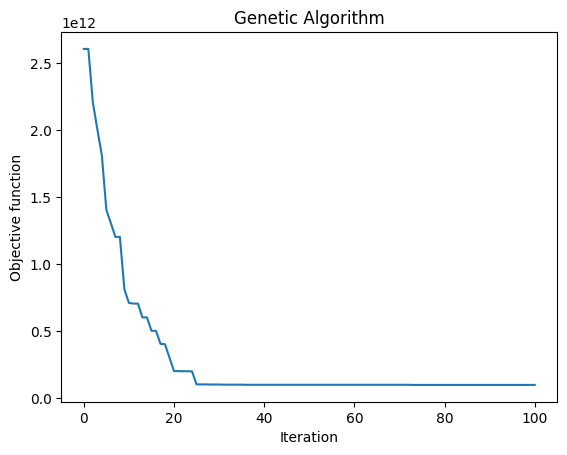

 The best solution found:                                                                           
 [ 504.  673.  483.  751.  606. 1025.  550.  547.  871. 1008.  491. 1003.
  562. 1138.  761. 1059.  840.  946. 1044.  936.  506.]

 Objective function:
 200000037985.06946


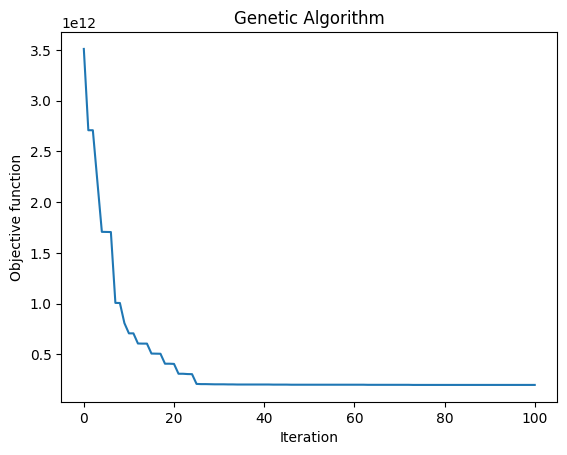

 The best solution found:                                                                           
 [ 481. 1081.  483.  915.  925. 1060.  615.  794.  849.  722.  524. 1076.
  572.  612.  700. 1062.  546.  693. 1046.  998.  502.]

 Objective function:
 2000037991.2222223


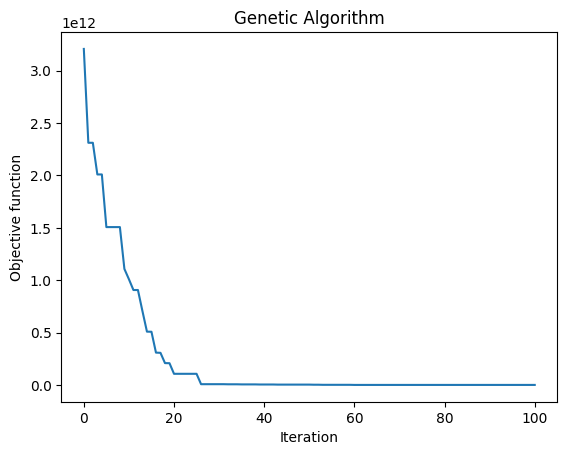

 The best solution found:                                                                           
 [ 521.  870.  626.  686.  964. 1046.  596.  950. 1040.  809.  517. 1081.
  978.  591.  800.  848.  751. 1012.  482.  748.  554.]

 Objective function:
 4000037624.875


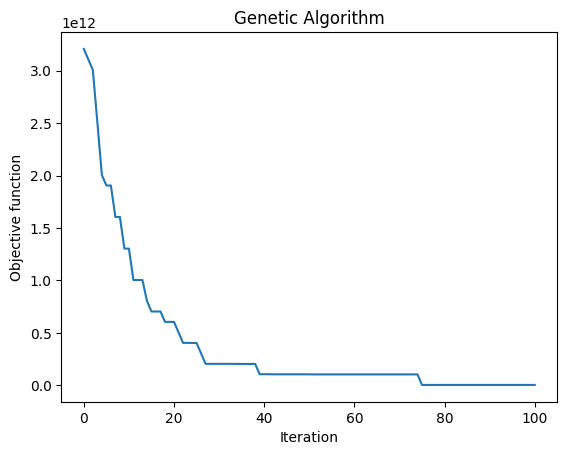

 The best solution found:                                                                           
 [ 485. 1114.  586.  872.  909.  982.  617.  674. 1045.  753.  857.  868.
  502.  549.  846. 1033. 1008.  678.  979.  748.  494.]

 Objective function:
 3000038031.5


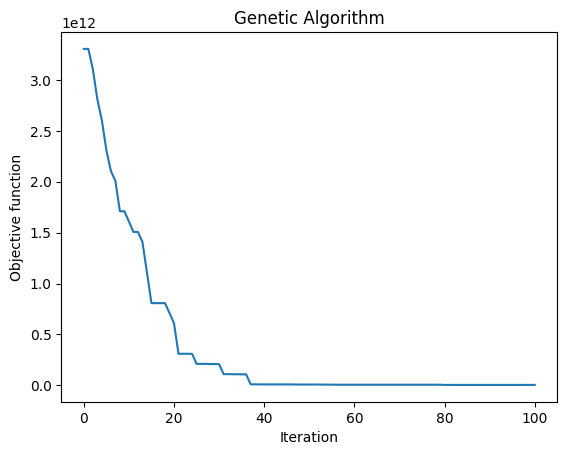

 The best solution found:                                                                           
 [ 620. 1113.  491.  555.  778. 1025.  692.  812.  843. 1026.  499.  776.
  812.  918.  890. 1031.  628.  688.  977.  626.  512.]

 Objective function:
 2000038038.0555556


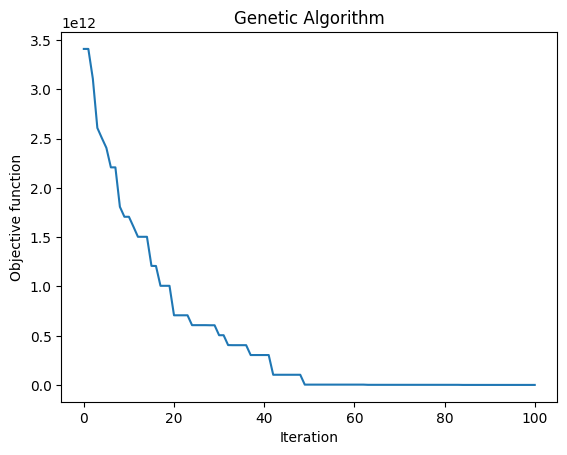

 The best solution found:                                                                           
 [ 579.  541.  571.  883.  899.  963. 1112.  812.  831.  720.  954.  875.
  491.  645.  815.  503. 1011. 1009.  854.  714.  484.]

 Objective function:
 4000038112.4166665


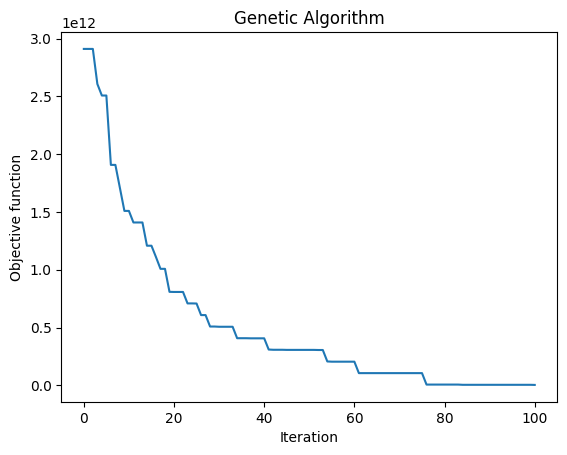

 The best solution found:                                                                           
 [ 680.  800.  875.  892.  673.  830. 1038.  496. 1022.  750.  575. 1090.
  765.  739.  671.  958.  984.  893. 1004.  563.  987.]

 Objective function:
 7000038172.388889


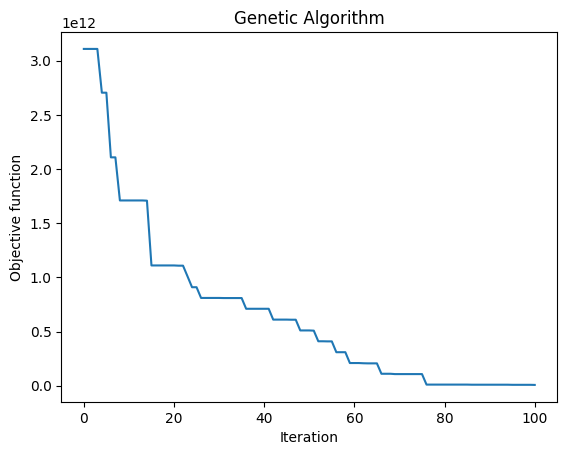

 The best solution found:                                                                           
 [ 489.  614.  814. 1139.  525. 1064. 1062.  936.  891.  723.  481.  598.
  481.  812.  873. 1059.  716.  935. 1049. 1005.  486.]

 Objective function:
 102000037579.77777


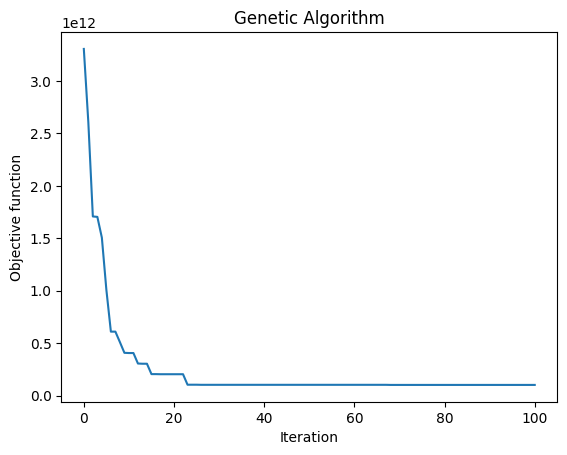

 The best solution found:                                                                           
 [ 495.  657.  485.  939.  798. 1057.  880.  544.  879. 1049.  486.  629.
  574.  871.  982. 1064. 1151.  538. 1015.  740.  488.]

 Objective function:
 1000037986.125


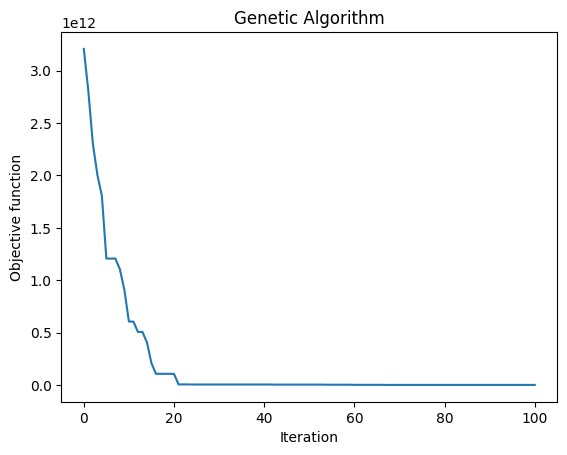

 The best solution found:                                                                           
 [ 505.  927.  569. 1134.  734. 1060.  545.  920.  846. 1042.  492.  900.
  487.  666.  857. 1051.  806.  741.  995. 1023.  481.]

 Objective function:
 101000037984.75


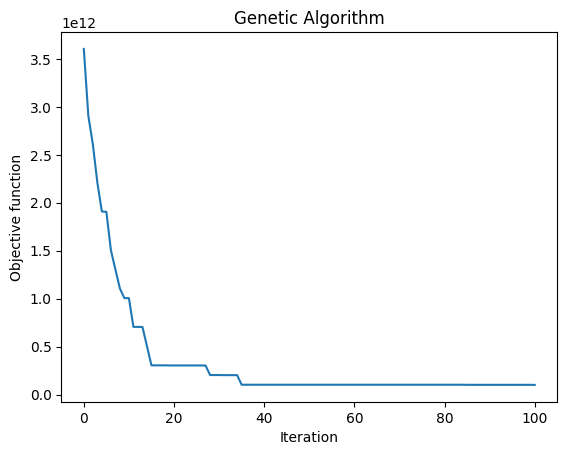

 The best solution found:                                                                           
 [ 520. 1124.  761.  603.  484. 1050.  950.  948.  865. 1025.  490.  568.
  483.  746.  904. 1062.  853.  812.  993. 1019.  702.]

 Objective function:
 2000037992.3333333


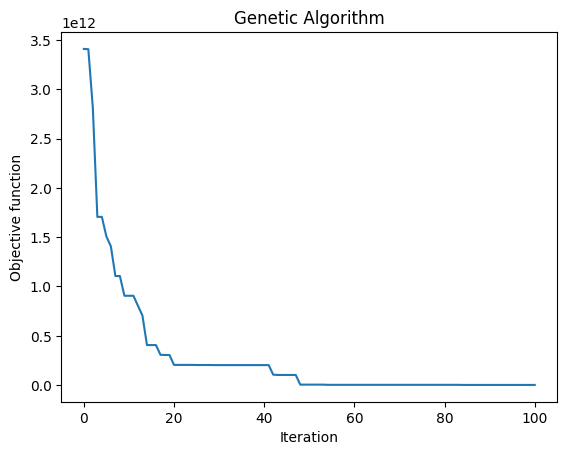

 The best solution found:                                                                           
 [ 549.  550.  747.  837.  939.  950.  631. 1012.  502.  691.  492.  826.
  486.  628. 1009. 1061. 1117.  942. 1040.  738.  482.]

 Objective function:
 2000037590.6666667


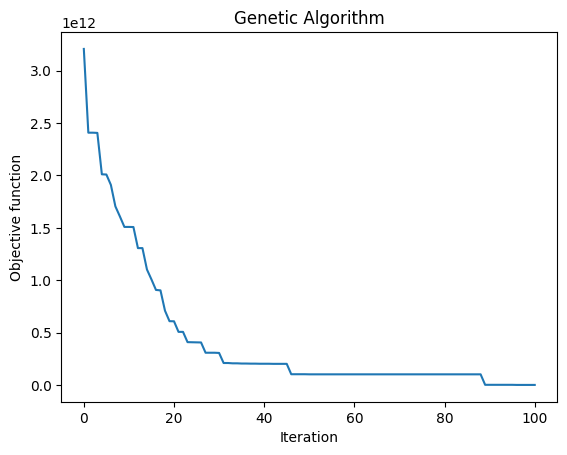

 The best solution found:                                                                           
 [ 516.  877.  498.  664.  890. 1063. 1142.  806. 1037.  604.  570.  875.
  952.  988.  749. 1056. 1083.  741.  665.  588.  510.]

 Objective function:
 3000038049.388889


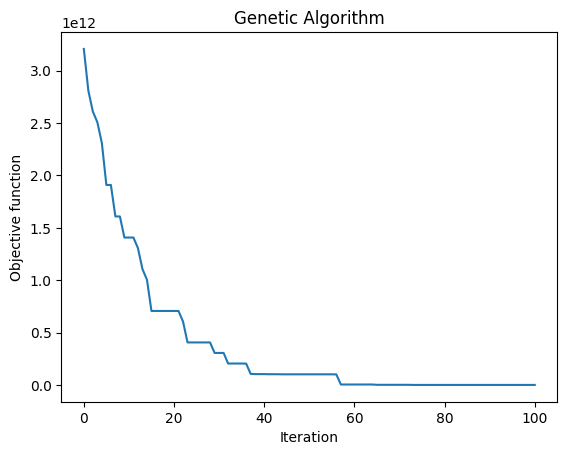

 The best solution found:                                                                           
 [ 504. 1123.  500.  784.  872. 1023.  610.  605.  945.  936.  556.  573.
  910.  693.  497. 1055.  935.  900. 1033.  990.  541.]

 Objective function:
 2000038013.9444444


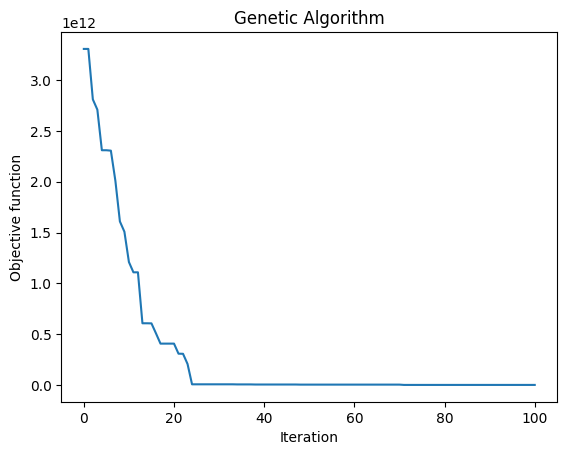

 The best solution found:                                                                           
 [ 729.  750.  880.  879.  962. 1044.  633.  942.  529.  847.  739.  580.
  525.  481.  834.  801. 1143. 1016. 1026.  690.  904.]

 Objective function:
 104000038013.01389


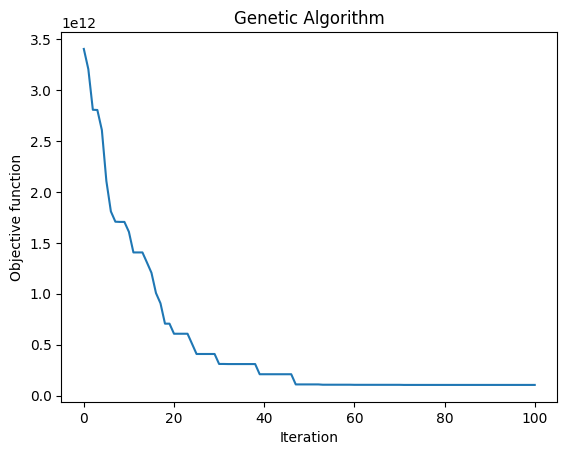

 The best solution found:                                                                           
 [ 682. 1114.  493.  790.  641. 1015.  578.  931.  884. 1020.  890.  900.
  696.  708.  907.  979.  501. 1003.  987. 1006.  673.]

 Objective function:
 203000038089.43054


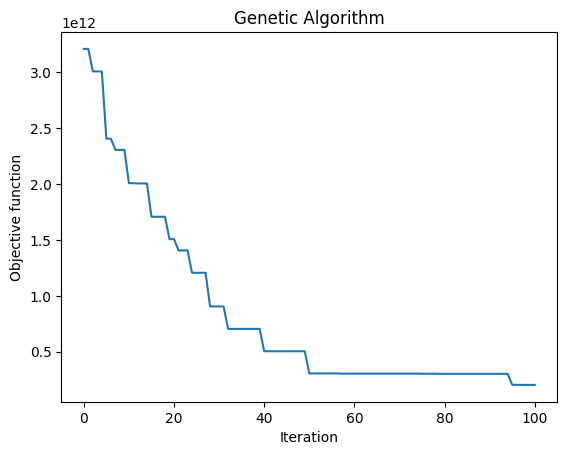

 The best solution found:                                                                           
 [ 882. 1097.  881. 1195.  780. 1000.  951.  500.  614.  603.  514.  777.
  530.  671.  852.  993.  601.  590. 1013. 1011.  558.]

 Objective function:
 204000038020.1111


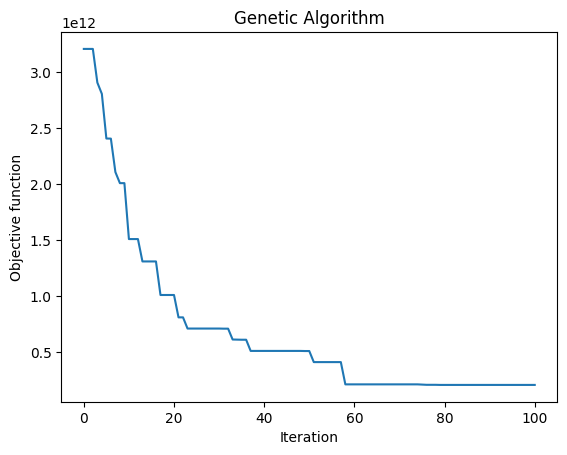

 The best solution found:                                                                           
 [ 689.  743.  769.  878. 1001. 1025.  585.  490.  491.  554.  536. 1087.
  488.  940. 1010. 1016.  685.  682.  917.  821.  652.]

 Objective function:
 4000038031.375


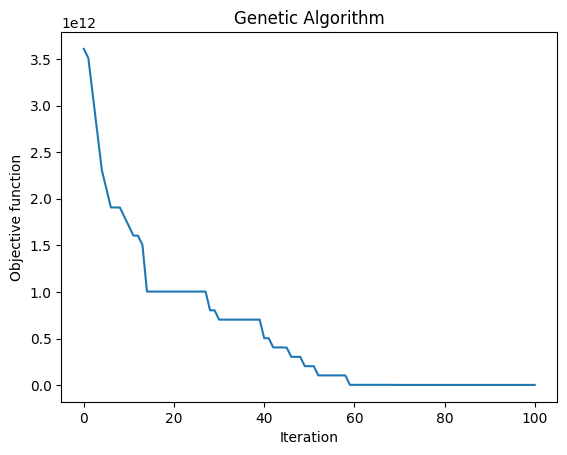

 The best solution found:                                                                           
 [ 837.  806.  680. 1135.  820. 1028.  674.  547.  892. 1041.  489.  805.
  541.  611.  734. 1042.  912.  909.  990.  958.  536.]

 Objective function:
 202000038038.875


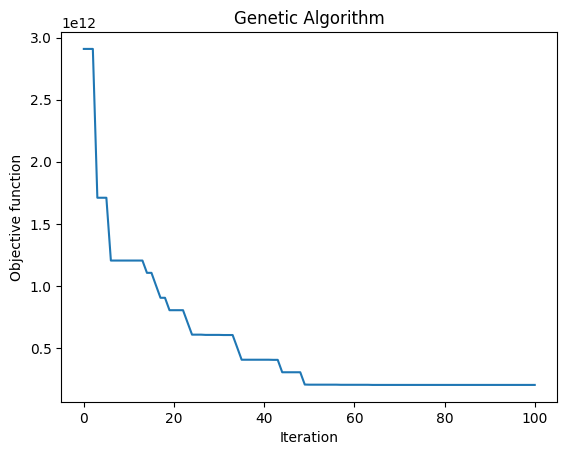

 The best solution found:                                                                           
 [ 579. 1118.  831. 1012.  732.  894.  857.  794.  920.  947.  500. 1008.
  572.  650.  773.  990.  581.  876. 1004.  933.  735.]

 Objective function:
 3000038098.361111


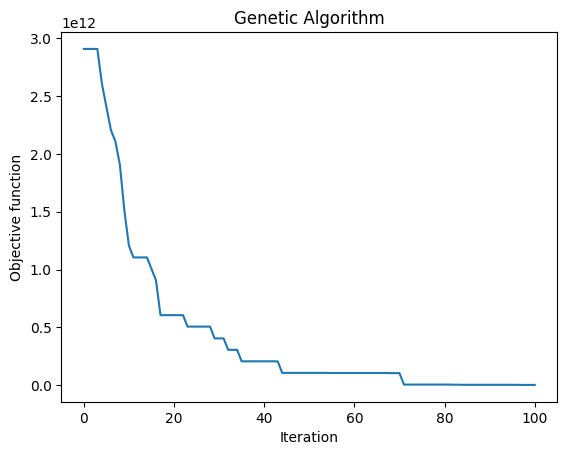

 The best solution found:                                                                           
 [ 489. 1031.  510.  905.  666. 1064.  768.  830. 1066.  966.  619.  656.
  770.  766.  937.  840. 1128.  861.  875.  556.  489.]

 Objective function:
 2000038067.75


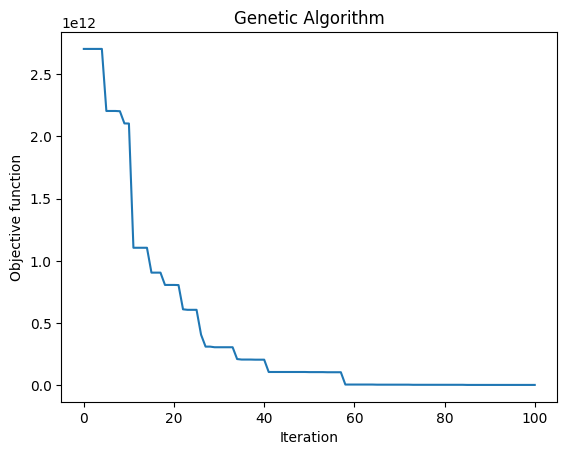

 The best solution found:                                                                           
 [ 932.  799.  800. 1120. 1021.  614.  547.  849. 1021.  616.  521.  786.
  535.  654.  912. 1041.  975.  896. 1046.  727. 1185.]

 Objective function:
 208000038055.15277


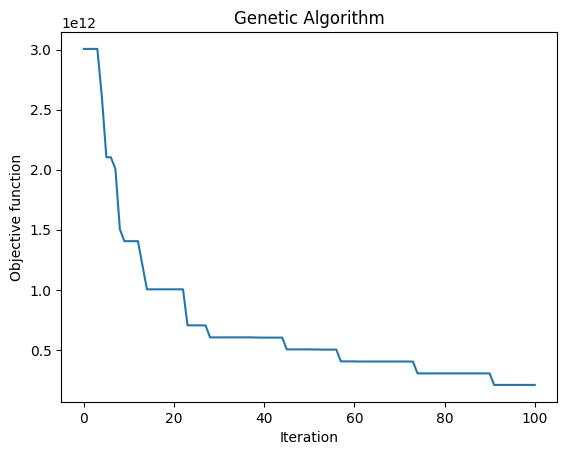

 The best solution found:                                                                           
 [ 805.  551.  488.  794.  634.  659. 1046.  948.  772.  738.  944. 1022.
  760.  732.  643.  484.  899. 1165.  930.  895.  488.]

 Objective function:
 105000038117.18056


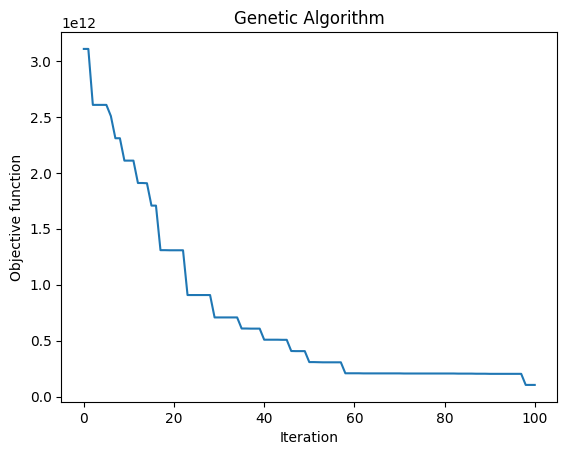

 The best solution found:                                                                           
 [ 679. 1025.  520.  847.  840.  999. 1115.  603. 1068.  667.  840.  809.
  646.  939. 1003. 1055.  763.  701.  947.  551.  636.]

 Objective function:
 104000038094.25


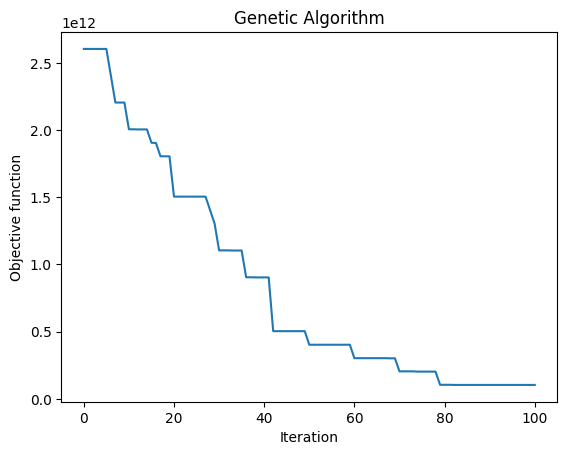

 The best solution found:                                                                           
 [ 487. 1120.  923.  774.  482.  849.  850.  980. 1007.  612.  488.  734.
  681.  849.  935. 1052.  561. 1019. 1035.  557.  661.]

 Objective function:
 4000037571.763889


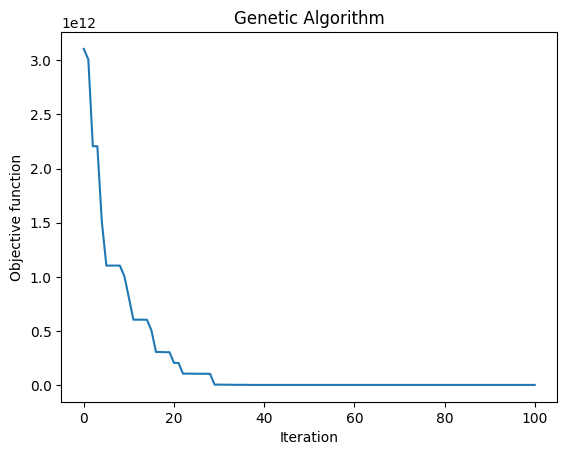

 The best solution found:                                                                           
 [ 497.  939.  529.  818.  868. 1030.  549.  662. 1043.  782.  482.  781.
  792. 1017.  955.  845. 1142.  657. 1040.  606.  502.]

 Objective function:
 2000037992.6527777


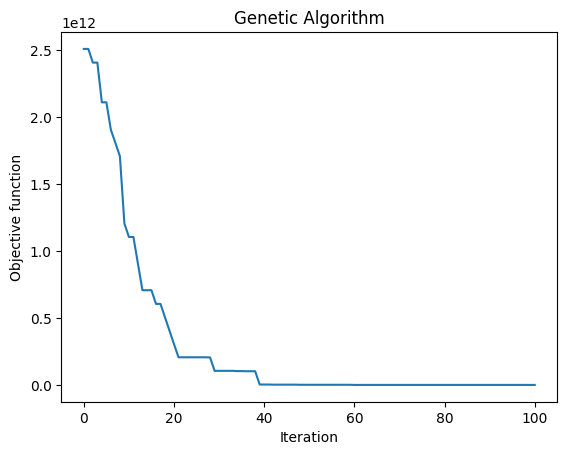

 The best solution found:                                                                           
 [ 680.  645.  486.  967.  887.  869.  568.  484. 1067. 1031.  482.  626.
  586.  735.  854. 1056. 1143.  945.  970.  799.  845.]

 Objective function:
 3000038001.2916665


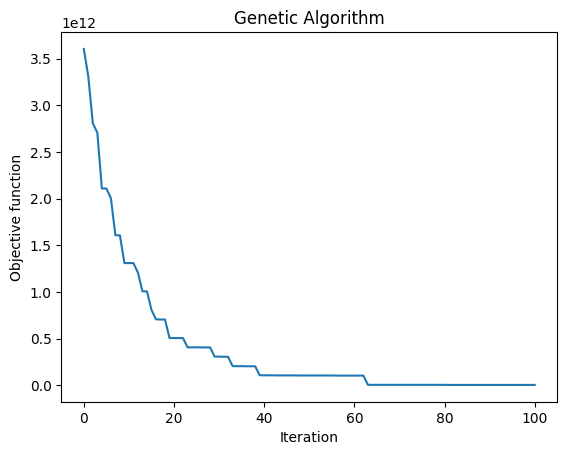

 The best solution found:                                                                           
 [ 612. 1027.  482.  528.  955.  849.  733.  648. 1059.  784.  494.  722.
  862.  853.  963. 1050. 1148.  652.  817.  591.  495.]

 Objective function:
 102000038004.48611


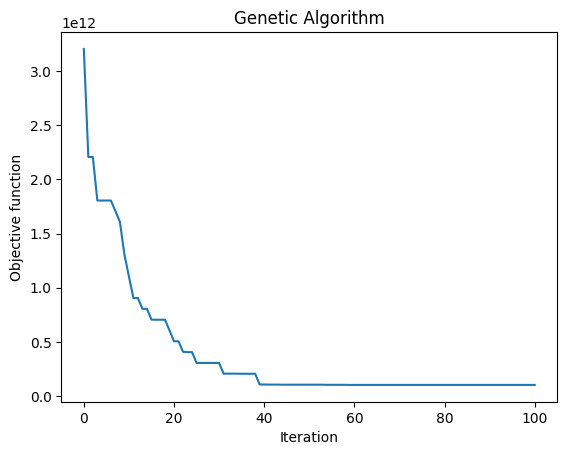

 The best solution found:                                                                           
 [ 490.  661.  486.  875.  904. 1042.  808.  941. 1056.  763.  486.  762.
  756. 1135. 1009. 1063.  561.  969.  868.  560.  522.]

 Objective function:
 102000037997.18056


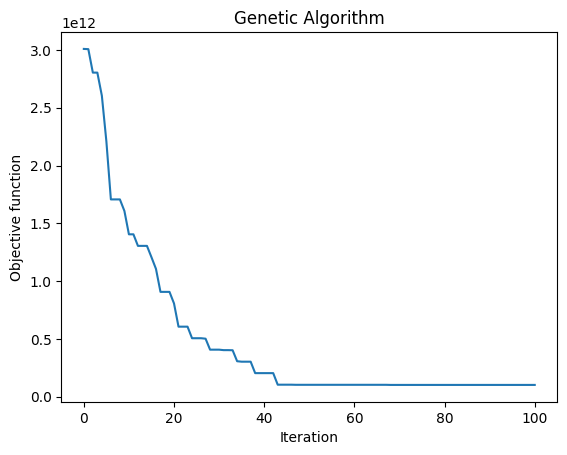

 The best solution found:                                                                           
 [ 574.  987.  504.  902. 1156. 1049.  677.  775.  951.  846.  874.  642.
  994.  558.  870. 1041. 1069.  779.  948. 1068.  983.]

 Objective function:
 205000038088.97223


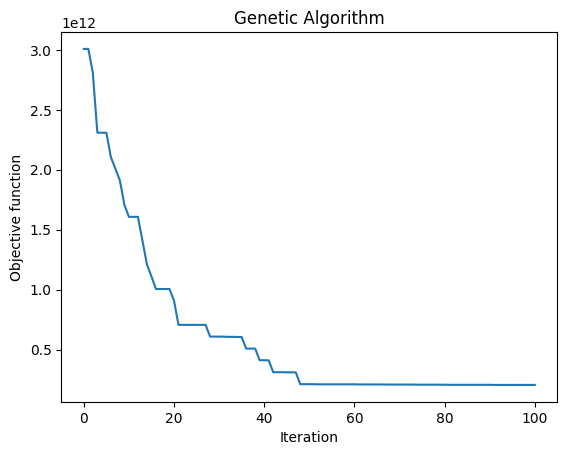

 The best solution found:                                                                           
 [ 656.  717.  481.  545.  876.  718. 1116.  918. 1036.  818.  857. 1081.
  954.  948.  803. 1036. 1027. 1014.  599.  627.  508.]

 Objective function:
 5000038110.416667


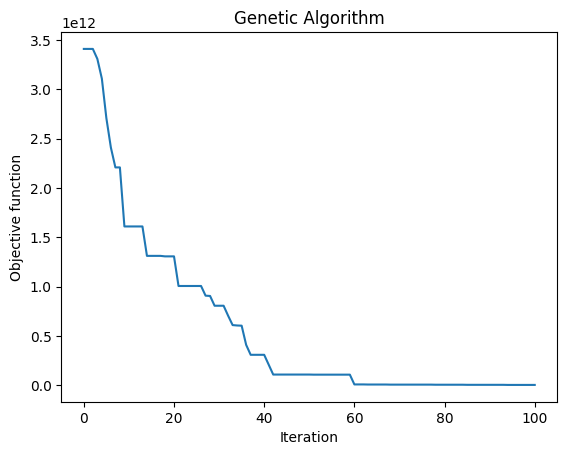

 The best solution found:                                                                           
 [ 499.  690.  555.  869.  782.  948. 1058.  930. 1040.  600.  570. 1016.
  699.  492.  948.  865.  588.  826.  956. 1142.  791.]

 Objective function:
 303000038074.0833


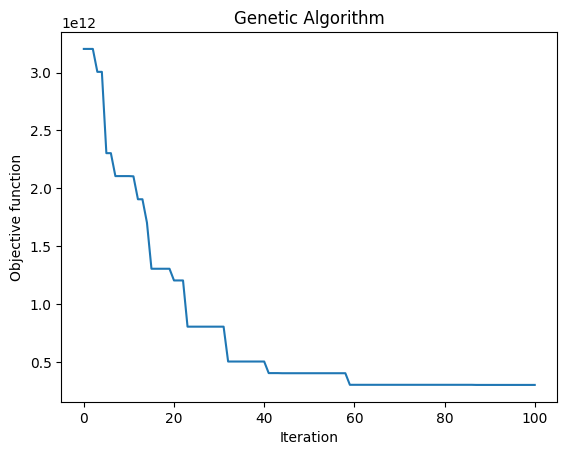

 The best solution found:                                                                           
 [ 485. 1025.  592.  740.  809.  848.  945.  940. 1050.  559.  486.  904.
 1003.  625.  808. 1035.  692.  950.  679.  553.  493.]

 Objective function:
 4000038048.3055553


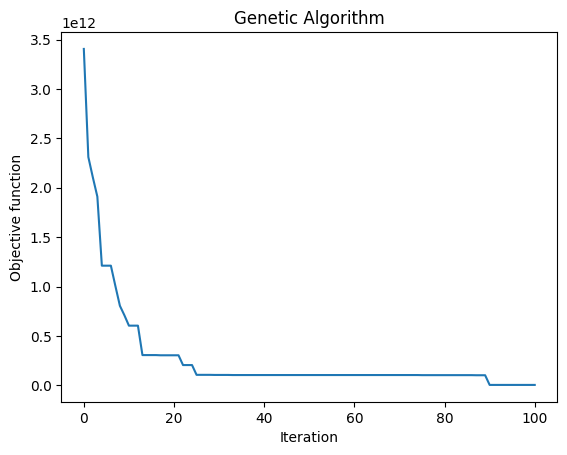

 The best solution found:                                                                           
 [ 489. 1014.  671.  702.  578. 1061.  776.  775.  541.  950.  973.  906.
  503.  843.  949. 1051.  654.  535. 1041.  651.  489.]

 Objective function:
 3000038072.4444447


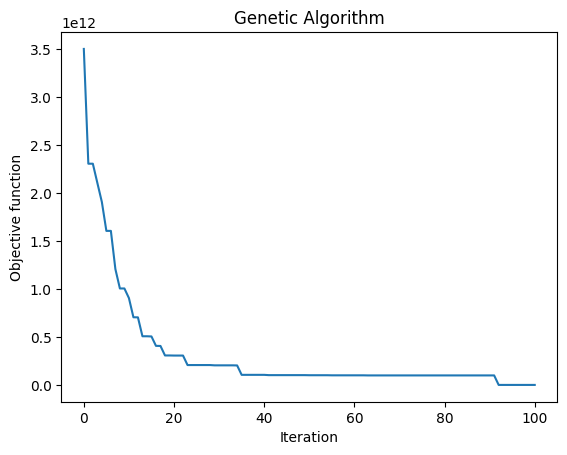

 The best solution found:                                                                           
 [ 566.  682.  485.  961.  598.  930.  858.  868.  997.  913.  501.  569.
  896.  850.  760.  983. 1150.  959.  696. 1027.  488.]

 Objective function:
 38055.791666666664


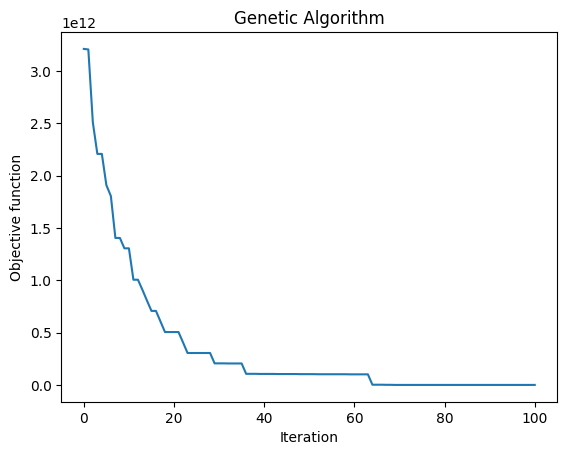

 The best solution found:                                                                           
 [ 493.  988.  499. 1131.  959.  847.  679.  748. 1063.  927.  484.  638.
  951.  916.  517. 1063.  578.  808. 1030.  847.  542.]

 Objective function:
 102000037987.30556


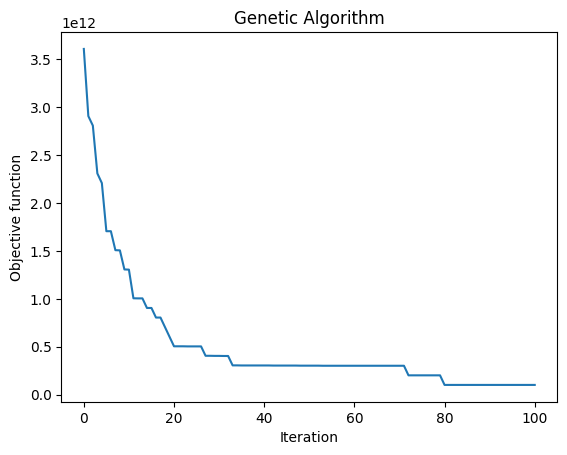

 The best solution found:                                                                           
 [ 503.  770.  496.  903.  868. 1039. 1134. 1003. 1040.  609.  498.  877.
  996.  705.  540. 1064.  641.  965.  930. 1082.  562.]

 Objective function:
 103000038025.38889


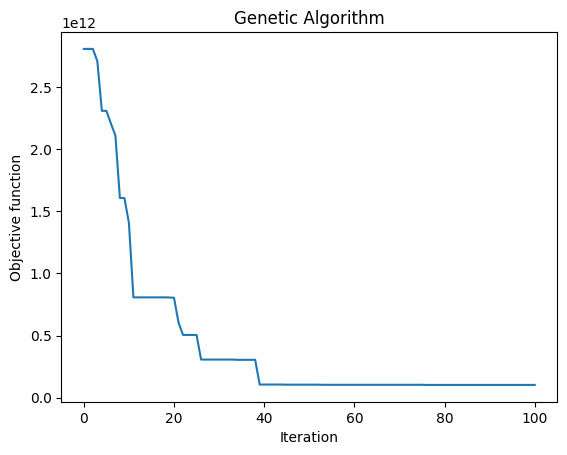

 The best solution found:                                                                           
 [ 491. 1091.  668.  790.  541. 1004.  941.  525.  779. 1016.  491.  760.
  560.  608.  946.  960. 1014.  936.  960.  875.  689.]

 Objective function:
 4000038070.8055553


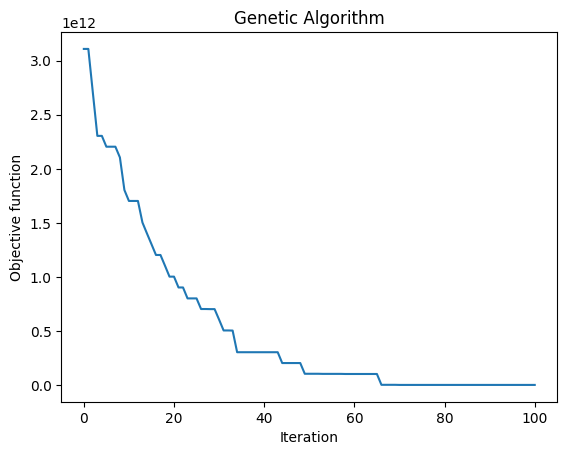

 The best solution found:                                                                           
 [ 693.  578.  565.  846.  481.  822.  750.  743.  660.  982.  488.  720.
  997.  654.  902.  786.  910.  963.  646. 1147.  544.]

 Objective function:
 102000036001.86111


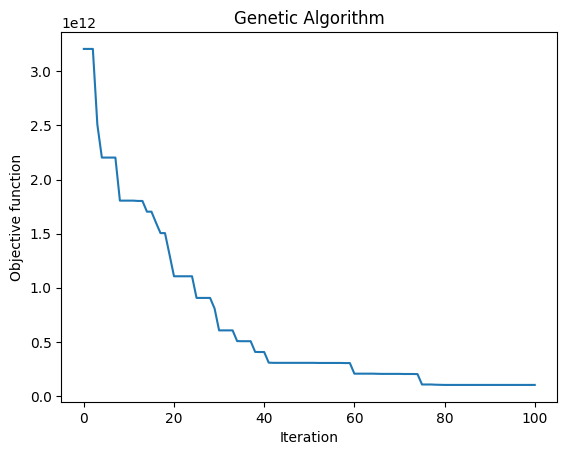

 The best solution found:                                                                           
 [ 508. 1099.  954.  856.  864.  634.  974.  566.  558.  757. 1014.  842.
  534.  496.  959. 1064. 1049.  756. 1033.  677.  610.]

 Objective function:
 106000038012.54167


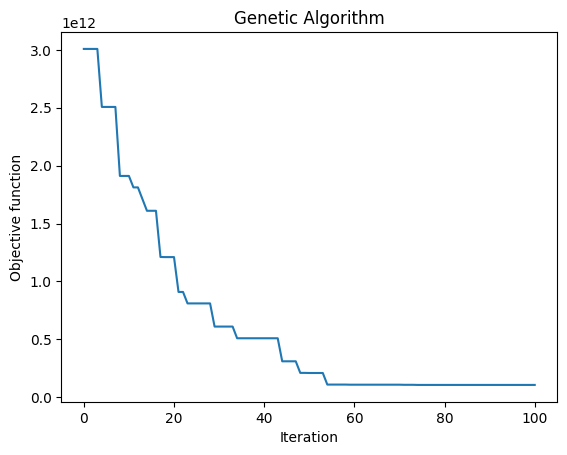

 The best solution found:                                                                           
 [ 547. 1076.  484.  544.  722. 1062.  883.  700.  847.  983.  483.  680.
  561.  874.  886. 1060. 1154.  951. 1031. 1023.  503.]

 Objective function:
 1000037970.2916666


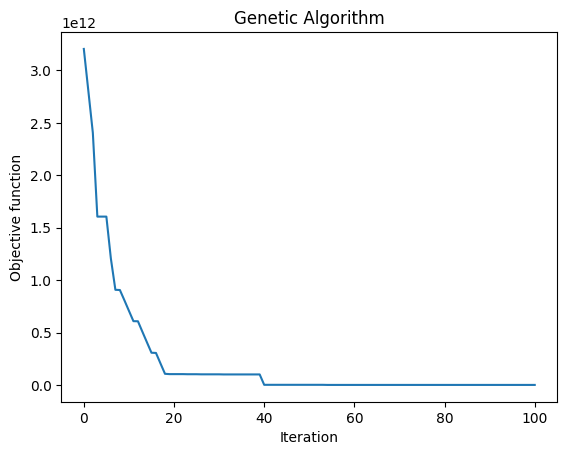

 The best solution found:                                                                           
 [ 549. 1119.  683.  841.  568. 1060.  660.  586.  510.  782.  496.  906.
  535.  773.  873.  864. 1023.  961. 1039.  713.  495.]

 Objective function:
 3000038030.9166665


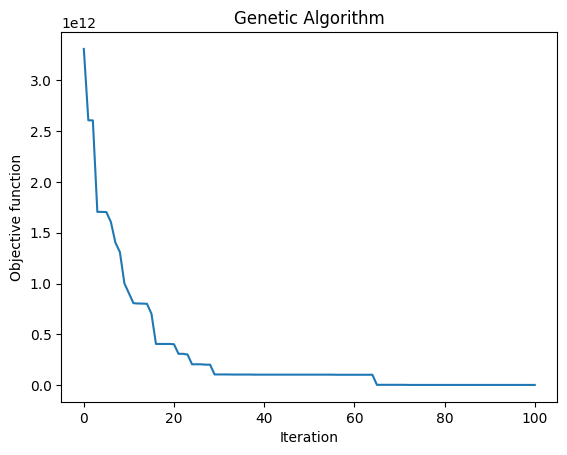

 The best solution found:                                                                           
 [ 492. 1119.  495.  873.  601. 1042.  956.  956.  847. 1041.  485. 1091.
  662.  674.  816. 1054.  542.  804. 1001. 1022.  491.]

 Objective function:
 2000037993.0555556


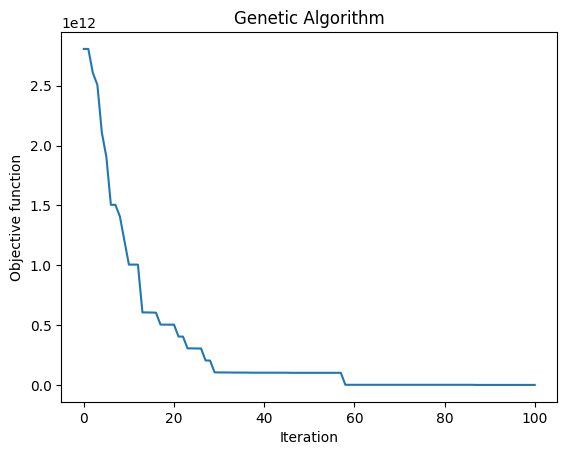

 The best solution found:                                                                           
 [ 519.  810.  597. 1131.  511. 1053.  671.  662.  847.  749.  508.  794.
  493.  723.  850.  989.  610.  906. 1037.  997.  562.]

 Objective function:
 102000038022.80556


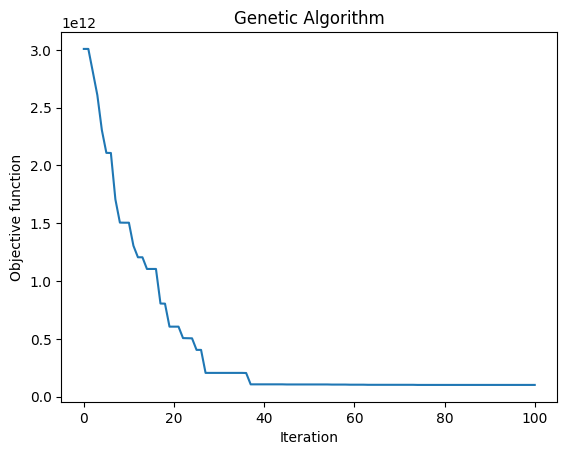

 The best solution found:                                                                           
 [ 672.  721.  481.  831. 1156.  905.  649.  982. 1060.  939.  481.  615.
  952.  915.  846. 1053. 1076. 1013.  589.  556.  488.]

 Objective function:
 102000038015.76389


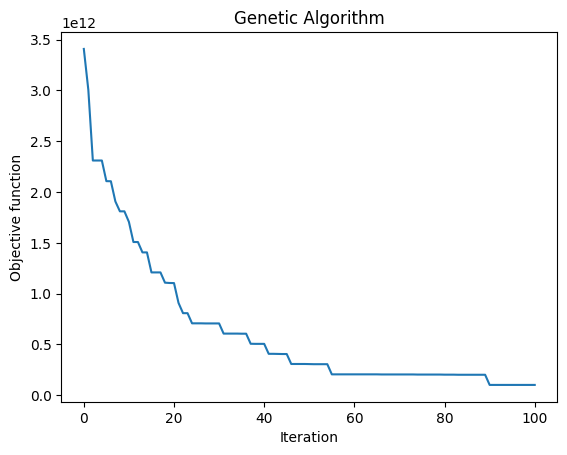

 The best solution found:                                                                           
 [ 512.  609.  703.  709.  806.  843.  889. 1012. 1039. 1112.  482.  868.
  588.  545. 1004. 1050. 1109.  844. 1033.  487.  770.]

 Objective function:
 202000038005.66666


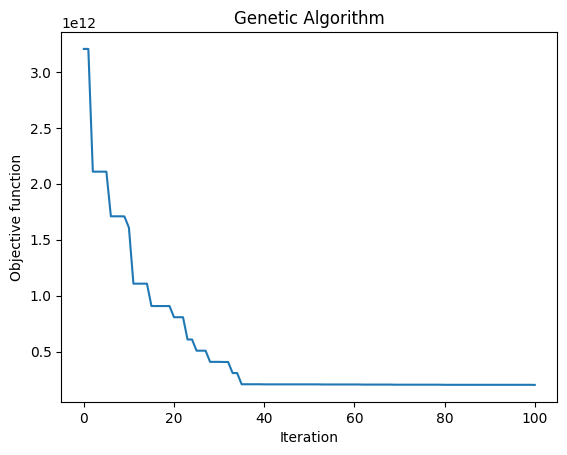

 The best solution found:                                                                           
 [ 581.  803.  484. 1017.  738.  981.  880.  579. 1005.  704.  502.  696.
  948.  954.  567. 1023. 1114.  886. 1029.  496.  653.]

 Objective function:
 104000038007.09723


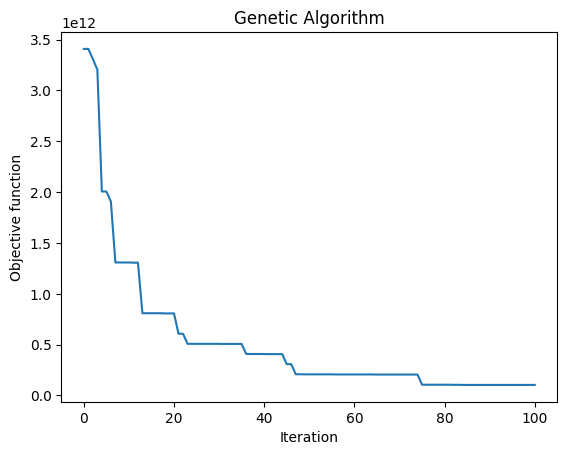

 The best solution found:                                                                           
 [ 847. 1103.  574.  693.  794. 1022. 1024.  756.  559.  993.  814.  973.
  669.  614.  953. 1008.  921.  509. 1027.  856.  547.]

 Objective function:
 6000038067.472222


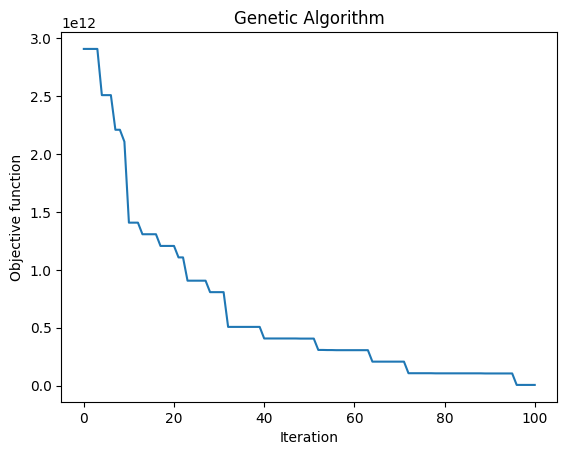

 The best solution found:                                                                           
 [ 486. 1123.  568.  543.  881. 1057.  722.  713.  946.  977.  482.  702.
  484.  808.  908. 1063.  636.  635. 1043. 1017.  485.]

 Objective function:
 1000037568.1388888


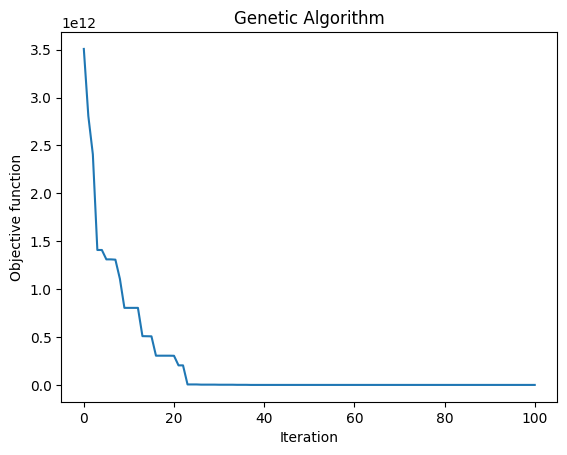

 The best solution found:                                                                           
 [ 488. 1124.  486.  990.  649. 1060.  729.  588.  842.  825.  481.  969.
  964.  724.  542. 1040.  813.  843. 1047.  887.  483.]

 Objective function:
 3000038010.9583335


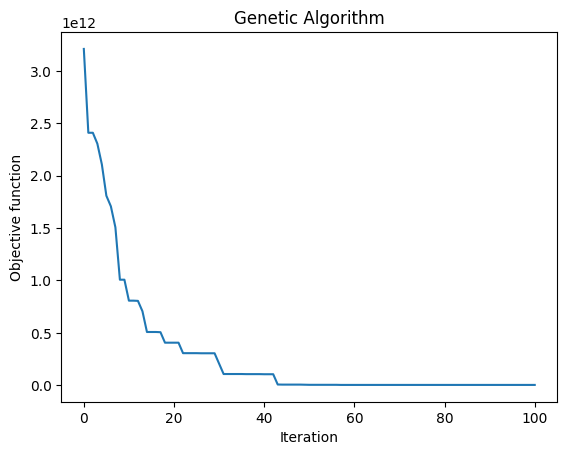

 The best solution found:                                                                           
 [ 847.  823.  493.  569.  723. 1062.  924.  936.  816.  983.  510.  807.
  598.  920.  714. 1013. 1152.  499. 1036. 1016.  666.]

 Objective function:
 2000038004.4027777


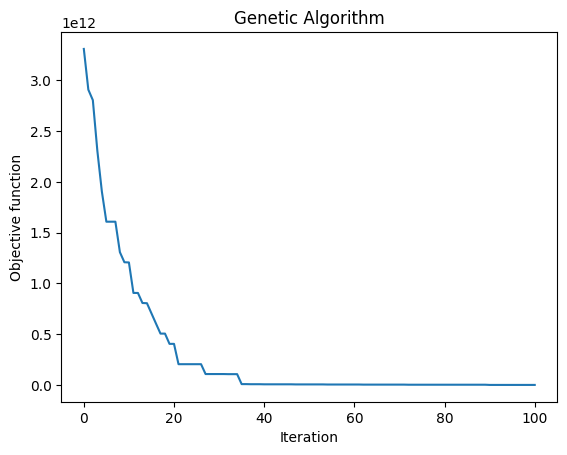

 The best solution found:                                                                           
 [ 499. 1043.  870.  863.  584. 1048.  729.  599.  486.  828.  528. 1027.
  598.  799.  871. 1063.  664.  657. 1024.  961.  550.]

 Objective function:
 3000038106.1944447


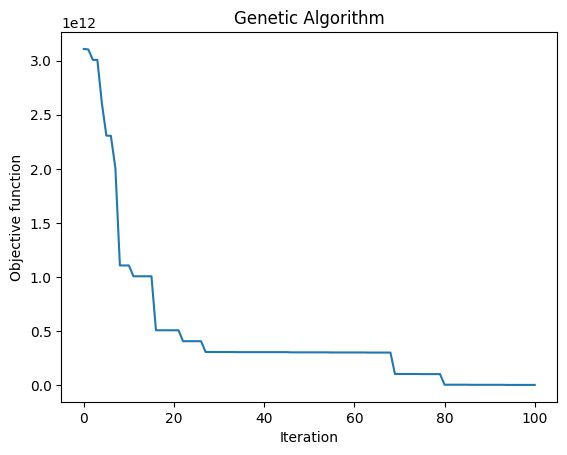

 The best solution found:                                                                           
 [ 489.  833.  520.  926.  846.  844.  575.  748. 1058.  664.  481.  912.
  665.  574.  995. 1048. 1150.  924.  930. 1086.  718.]

 Objective function:
 101000038020.79167


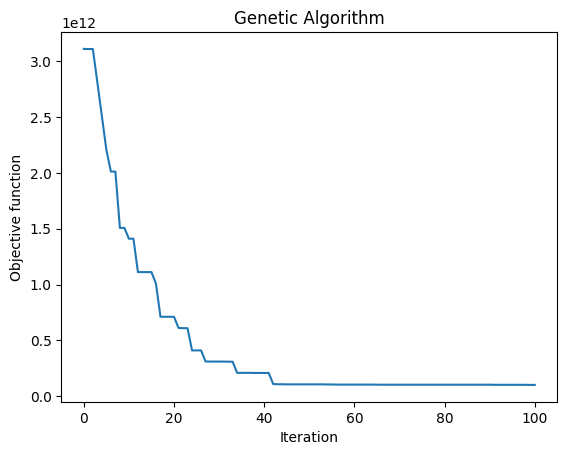

 The best solution found:                                                                           
 [ 888. 1120.  648.  504.  811. 1012.  732.  811.  915. 1023.  554.  804.
  502.  663. 1012. 1039.  586. 1012.  983.  942.  900.]

 Objective function:
 104000038026.66667


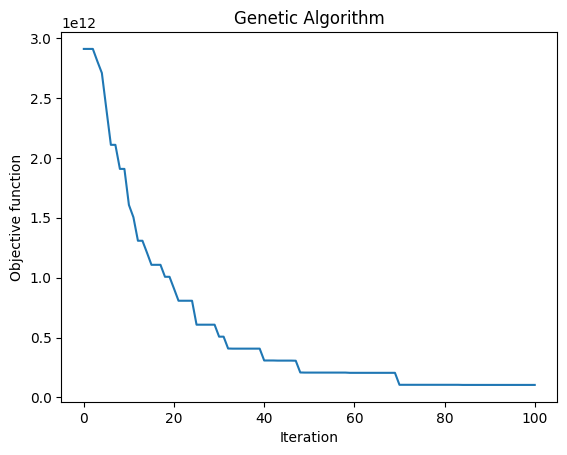

 The best solution found:                                                                           
 [ 518. 1018.  793.  847.  674.  911.  735.  489. 1035.  564.  497.  823.
  494.  941.  955. 1026.  606.  734.  900. 1134.  676.]

 Objective function:
 104000038034.41667


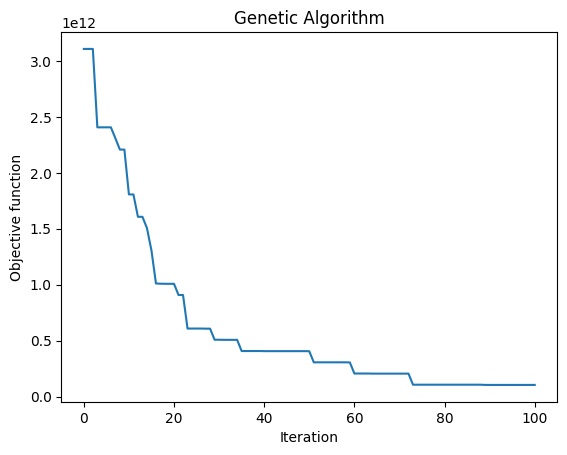

 The best solution found:                                                                           
 [ 695.  560.  488.  859.  636.  490.  806. 1001.  829.  932.  517.  993.
  601. 1116.  742. 1019.  727.  906.  760.  931.  650.]

 Objective function:
 202000038137.06946


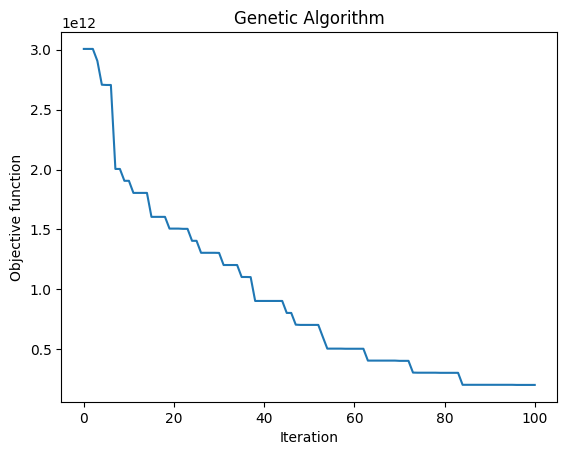

 The best solution found:                                                                           
 [ 846.  844.  717.  960.  959.  482. 1028.  667. 1055.  544.  486.  729.
  602.  601.  889. 1063. 1149.  664. 1047.  541.  487.]

 Objective function:
 4000037975.0416665


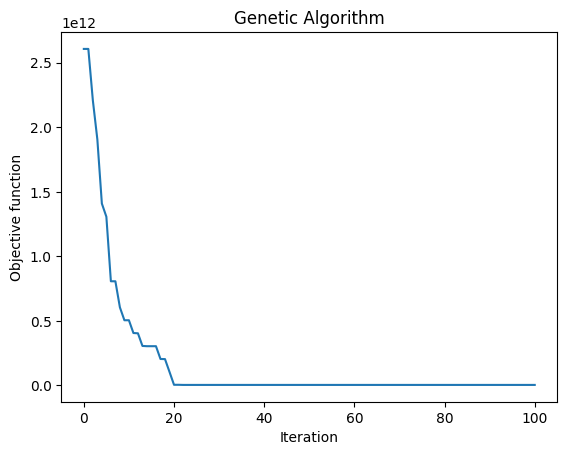

 The best solution found:                                                                           
 [ 482. 1052.  866.  911.  692. 1058.  629.  547.  522. 1021.  490.  910.
  484.  830.  956. 1062. 1153.  563.  989.  770.  499.]

 Objective function:
 3000038009.6666665


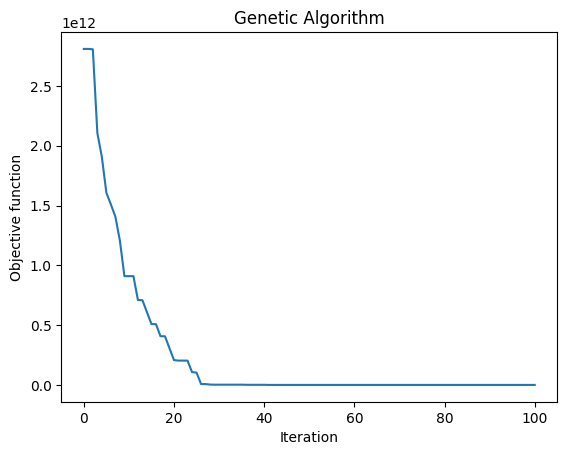

 The best solution found:                                                                           
 [ 547.  560.  485.  729.  960. 1064.  870.  891. 1036. 1048.  490.  705.
  998.  866.  487. 1062. 1148.  956.  868.  645.  847.]

 Objective function:
 3000037975.6805553


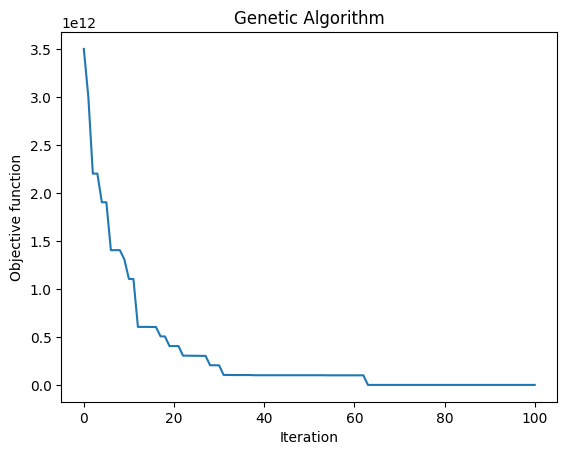

 The best solution found:                                                                           
 [ 485.  942.  486.  603.  946.  861.  685. 1017. 1058.  769.  531.  571.
  562.  873.  835. 1048. 1154.  681.  866.  760.  497.]

 Objective function:
 2000038012.2222223


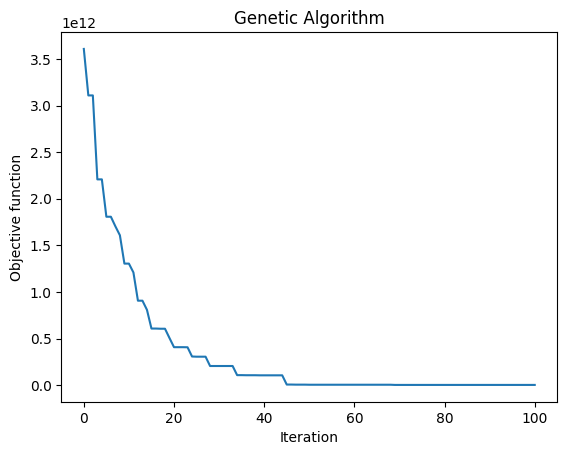

 The best solution found:                                                                           
 [ 489. 1078.  836.  611. 1190. 1034.  869.  700.  925.  549.  515.  591.
  512.  787.  721. 1064.  954.  938. 1048.  953.  489.]

 Objective function:
 102000038005.30556


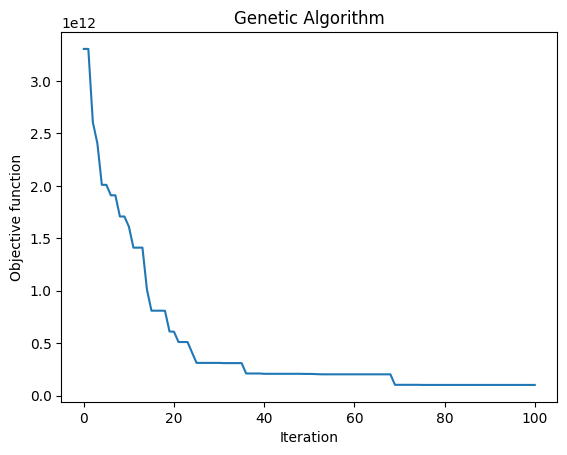

 The best solution found:                                                                           
 [ 509.  604.  630.  826.  747.  983.  968.  899. 1046. 1045.  848. 1085.
  513.  542.  928. 1049. 1032.  966.  951.  686.  847.]

 Objective function:
 3000038028.7916665


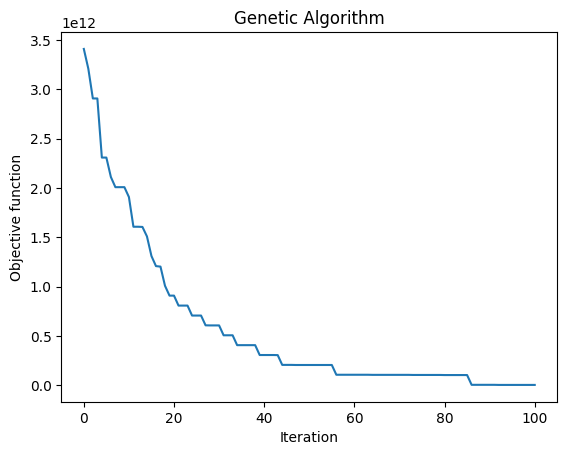

 The best solution found:                                                                           
 [ 529.  840.  621.  988.  955. 1063.  624.  620.  842.  791.  523.  593.
  539.  927.  865. 1059. 1074.  699.  915.  783.  552.]

 Objective function:
 1000038112.3611112


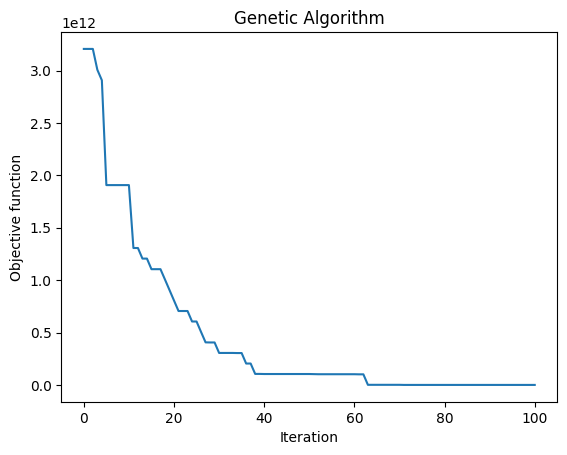

 The best solution found:                                                                           
 [ 954. 1057.  534. 1142.  623. 1033.  816.  627.  725. 1002.  874.  804.
  841.  508.  936.  843.  576.  954.  765.  699.  887.]

 Objective function:
 305000038125.375


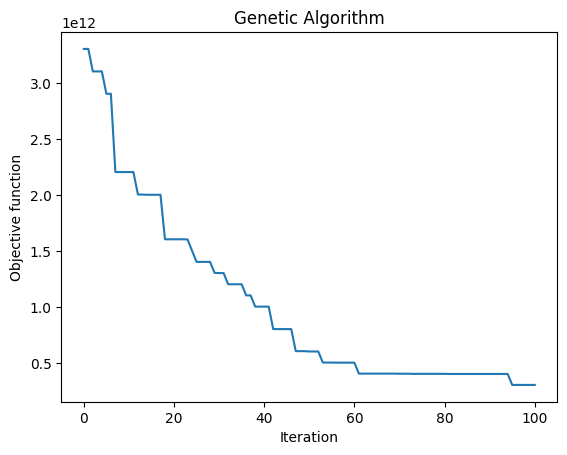

 The best solution found:                                                                           
 [ 481. 1122.  841.  558.  926. 1063.  842.  942. 1066. 1004.  482.  545.
  979.  999.  727.  844.  664.  729.  530.  660.  485.]

 Objective function:
 3000037977.7083335


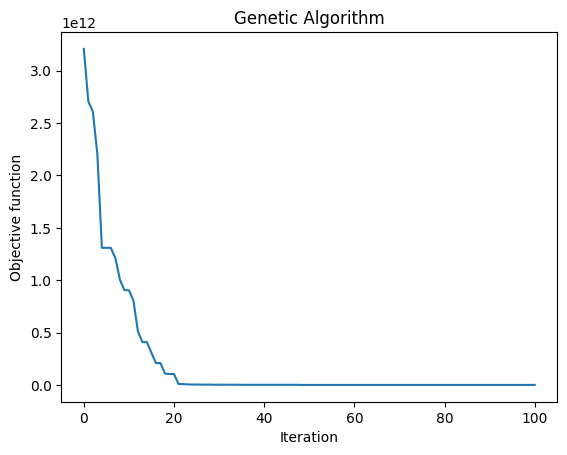

 The best solution found:                                                                           
 [ 485.  854.  561.  934.  907. 1034.  596. 1012.  841.  753.  487.  551.
  483.  728. 1019. 1063.  675.  807. 1047.  674.  481.]

 Objective function:
 1000038054.8055556


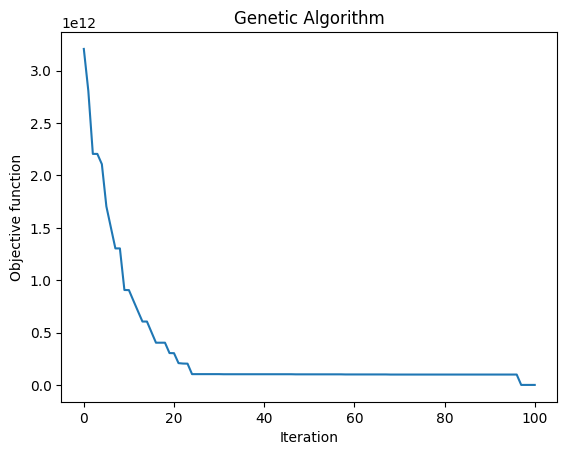

 The best solution found:                                                                           
 [ 540.  547.  601.  722.  485.  859.  835. 1014. 1059.  943.  502.  717.
  484.  827.  892. 1054. 1151. 1010.  725.  663.  847.]

 Objective function:
 2000037990.8333333


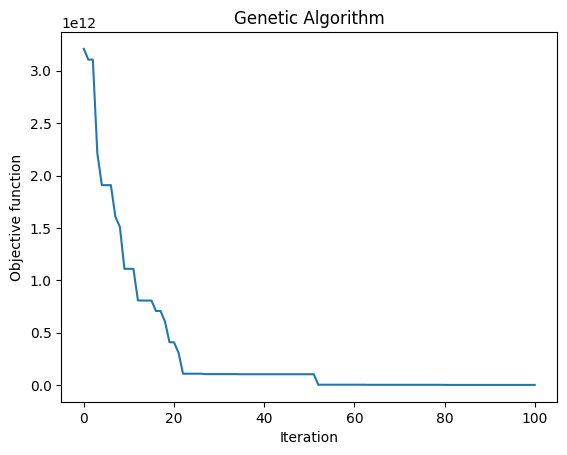

 The best solution found:                                                                           
 [ 548. 1102.  583. 1010.  872.  679.  792.  481.  489.  545.  485.  742.
  995.  933.  851.  823.  595.  592.  812.  654.  708.]

 Objective function:
 5000035554.0


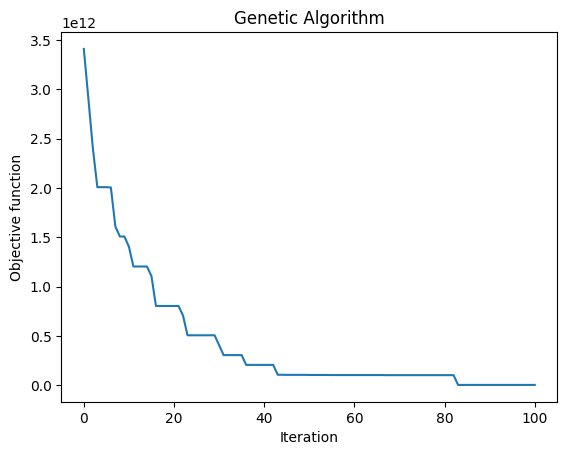

 The best solution found:                                                                           
 [ 875. 1116.  900.  871.  570. 1046.  938.  484. 1058. 1045.  486.  559.
  481.  934.  939. 1030.  722.  833.  977.  769.  680.]

 Objective function:
 4000037995.0972223


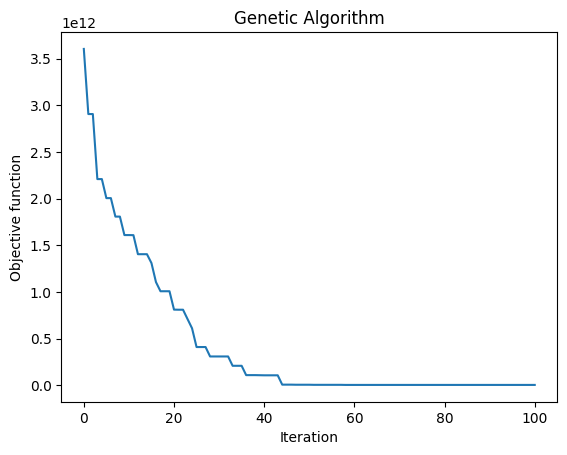

 The best solution found:                                                                           
 [1035.  659.  560.  890.  494.  510.  794. 1009. 1036.  966.  500.  641.
  644.  790.  899. 1063. 1147.  962.  849.  587.  546.]

 Objective function:
 3000038026.486111


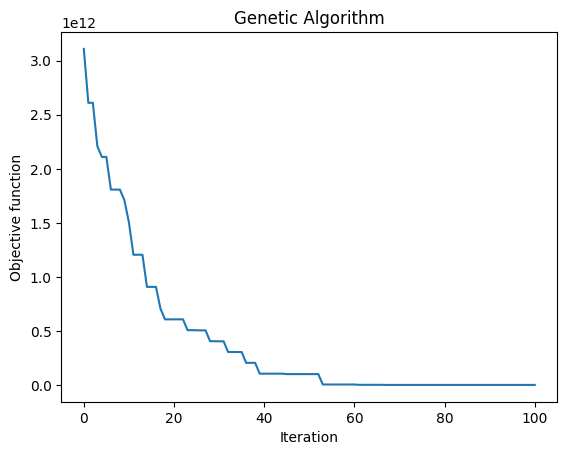

 The best solution found:                                                                           
 [ 927.  920.  939.  697.  765. 1060.  641.  806.  493. 1025.  851.  891.
  554.  553.  929. 1062. 1110.  485.  487. 1022.  848.]

 Objective function:
 7000038015.069445


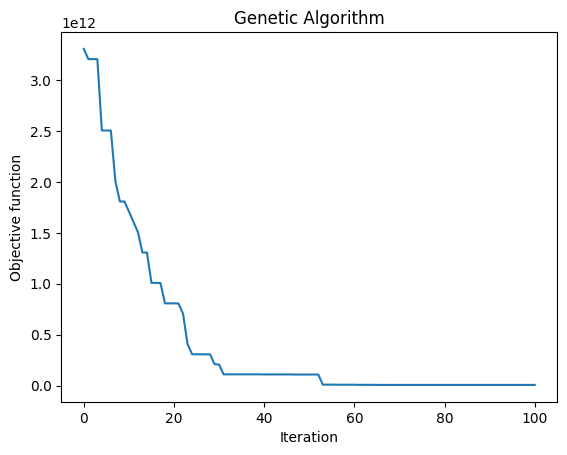

 The best solution found:                                                                           
 [ 492.  986.  491.  567.  949. 1000. 1099.  839.  865.  750.  866.  807.
  927.  630.  724. 1062. 1165.  487. 1012. 1162.  878.]

 Objective function:
 306000038009.0278


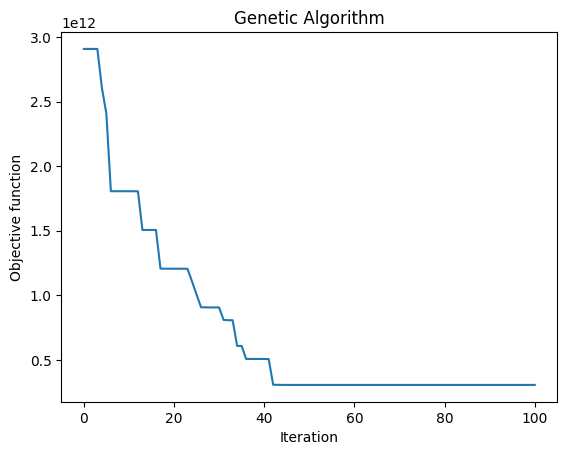

 The best solution found:                                                                           
 [ 512. 1182.  484.  843.  583. 1045.  679.  963.  853. 1026.  502.  563.
  575.  730. 1016. 1059. 1105.  953.  986.  905.  483.]

 Objective function:
 101000037965.43056


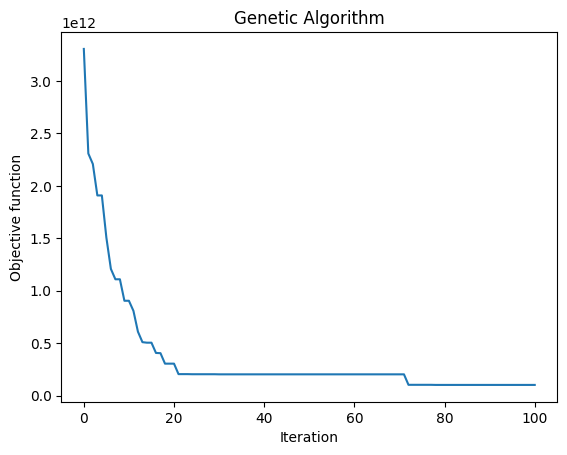

 The best solution found:                                                                           
 [ 861. 1114.  915.  795.  588. 1055.  686.  987.  504.  858. 1034.  548.
  497.  678.  999.  484.  926.  917. 1048.  740.  506.]

 Objective function:
 3000037581.0833335


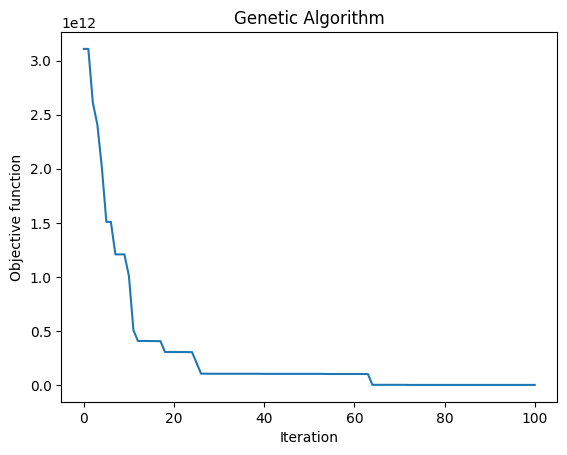

 The best solution found:                                                                           
 [ 854.  727.  849.  549.  482. 1060.  952.  626.  937. 1035.  482.  621.
  483.  836.  949. 1058. 1144.  946.  999. 1016.  908.]

 Objective function:
 3000037571.861111


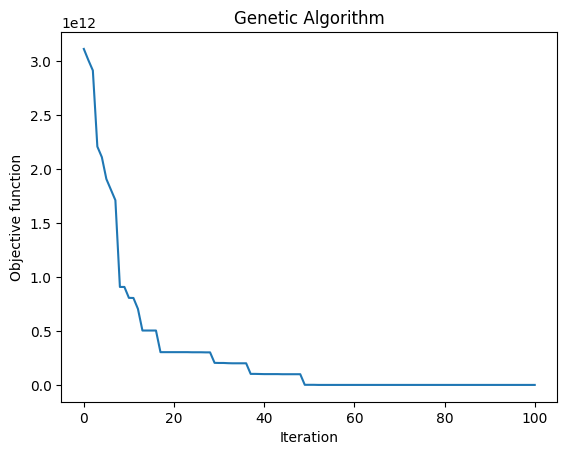

 The best solution found:                                                                           
 [ 500. 1010.  601.  754.  519.  897.  621.  959.  779.  878.  484. 1088.
  688.  940.  875. 1063.  679.  676. 1046.  822.  571.]

 Objective function:
 3000038021.486111


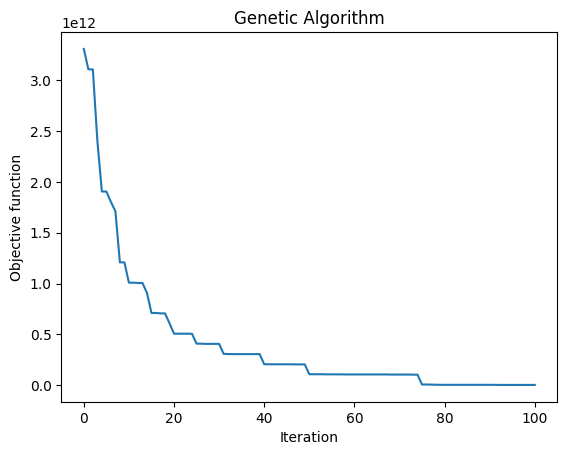

 The best solution found:                                                                           
 [ 568.  879.  600.  625.  992. 1058.  560.  995. 1067.  836.  850.  981.
  492. 1087.  871. 1043. 1152.  486.  952.  763.  713.]

 Objective function:
 103000038020.33333


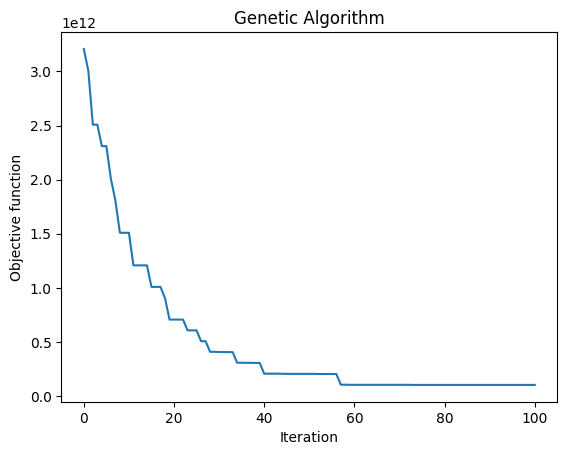

 The best solution found:                                                                           
 [ 809.  907.  938.  551.  664. 1059.  850.  890.  485.  817.  518.  623.
  548.  789. 1015.  872. 1123.  964. 1029.  730.  508.]

 Objective function:
 3000038024.6666665


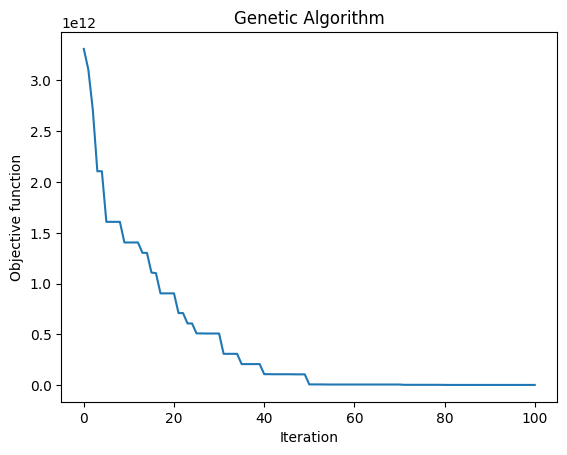

 The best solution found:                                                                           
 [ 736. 1123.  876.  543. 1006.  838.  651.  643.  494.  762.  483.  629.
  485.  747.  815.  820.  944.  993.  569.  890.  488.]

 Objective function:
 4000035546.25


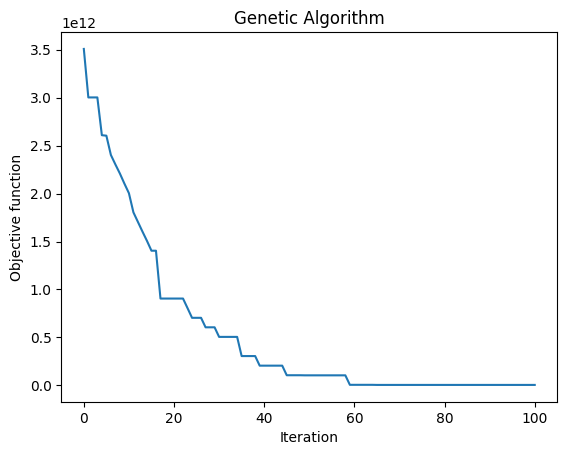

 The best solution found:                                                                           
 [ 499.  859.  710.  950.  829. 1012. 1070.  708.  983.  664.  819.  707.
  825.  645.  928.  973. 1149. 1005.  554.  577.  825.]

 Objective function:
 6000038118.291667


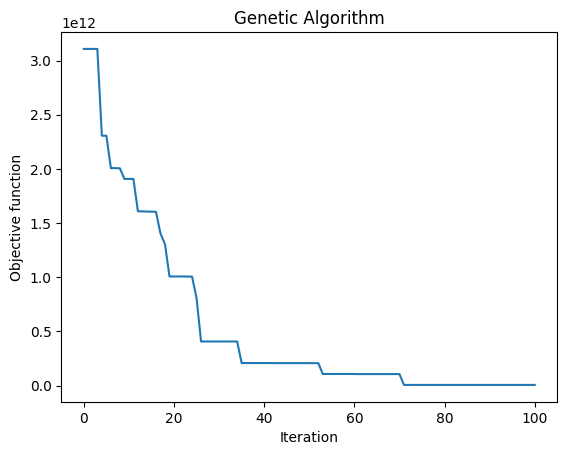

 The best solution found:                                                                           
 [ 490.  699.  569.  613.  789. 1061.  892.  521.  854. 1046.  482.  680.
  486.  885.  874. 1063. 1154.  548. 1014. 1028.  481.]

 Objective function:
 1000037986.4305556


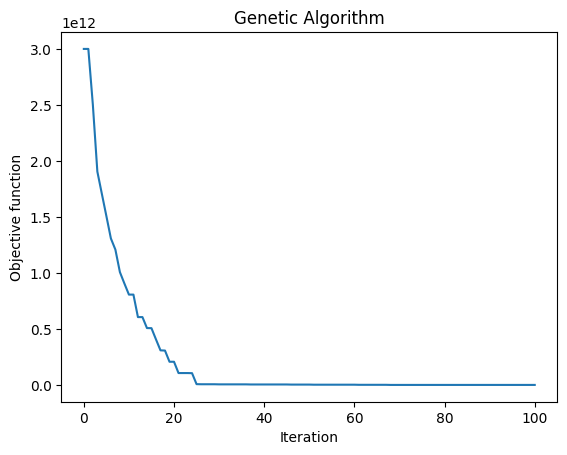

 The best solution found:                                                                           
 [ 485. 1068.  481.  909.  940. 1056.  847.  973.  848.  576.  913. 1067.
  791.  485. 1002. 1058.  671.  803. 1047.  558.  723.]

 Objective function:
 104000037959.69444


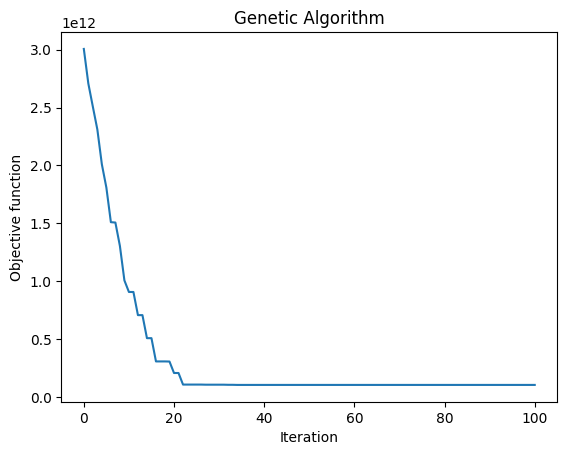

 The best solution found:                                                                           
 [ 515. 1032.  616.  885.  697. 1029.  597.  678.  482.  979.  500.  658.
  992.  824.  929. 1038. 1152.  956.  848.  772.  486.]

 Objective function:
 2000038032.25


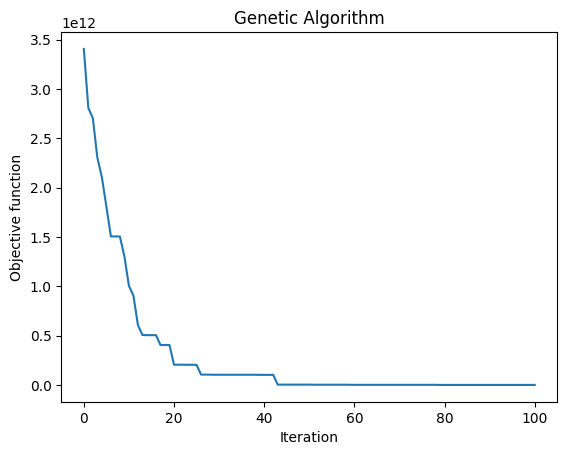

 The best solution found:                                                                           
 [ 515.  741.  750. 1135. 1005. 1050.  671.  846.  486.  575.  851.  731.
  539.  568.  842. 1050.  915. 1018.  829.  911.  533.]

 Objective function:
 103000037637.0


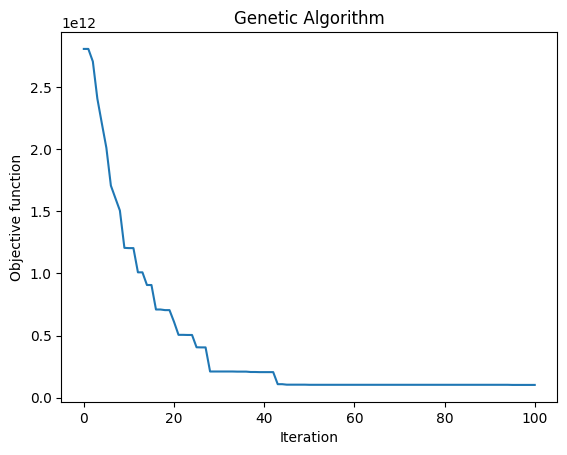

 The best solution found:                                                                           
 [ 490.  928.  491. 1100.  721. 1059.  806.  995.  986.  879.  484. 1088.
  721.  607.  931. 1061.  549.  735. 1047.  670.  517.]

 Objective function:
 102000038003.97223


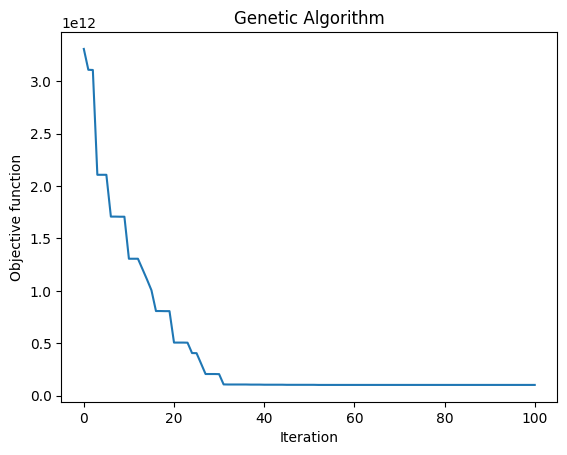

 The best solution found:                                                                           
 [ 771. 1007.  986.  579.  779.  836.  842.  947.  490.  923.  481.  567.
  839.  715.  484.  780. 1134.  837.  527.  955.  675.]

 Objective function:
 4000035980.4444447


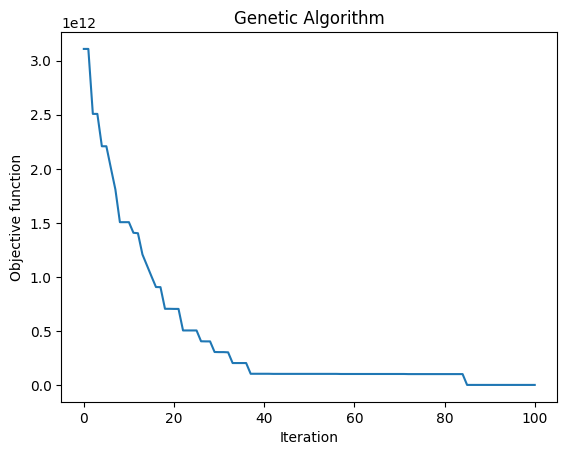

 The best solution found:                                                                           
 [ 494.  722.  547.  913.  638.  866. 1132.  587.  714.  842.  814.  879.
  918.  502.  564. 1048. 1023.  886. 1018.  826.  673.]

 Objective function:
 105000038008.15277


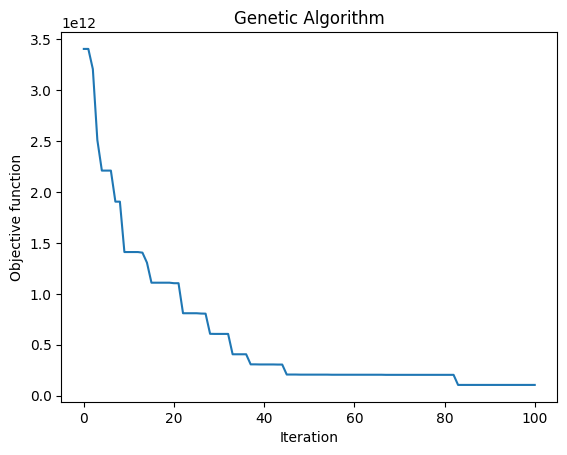

 The best solution found:                                                                           
 [ 897.  673.  853. 1056. 1177.  523.  994.  948. 1021.  935.  491. 1133.
  647.  992.  508.  687.  605.  920. 1042.  836.  754.]

 Objective function:
 306000038103.2778


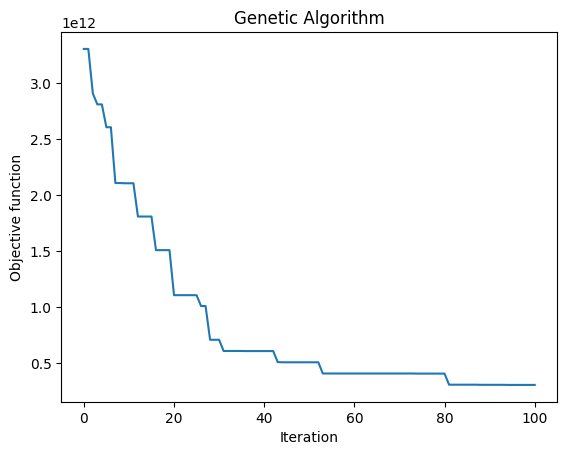

 The best solution found:                                                                           
 [ 481. 1000.  711.  594.  488.  857.  767.  945.  793.  925.  481. 1090.
  527.  763.  904. 1054.  698.  686. 1030.  830.  547.]

 Objective function:
 3000037988.9166665


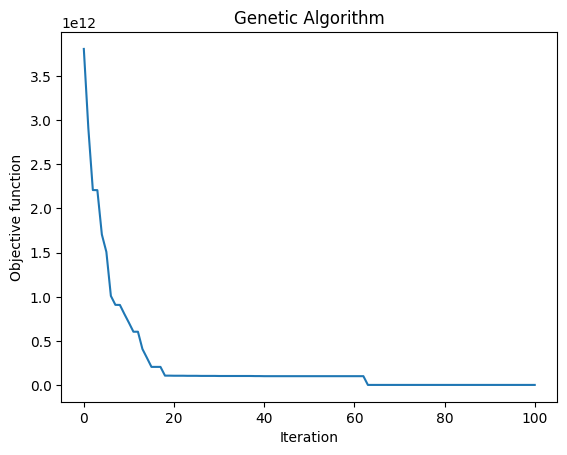

 The best solution found:                                                                           
 [ 487.  988.  483.  769.  652. 1059.  717.  641.  842.  875.  483. 1084.
  649.  921.  922. 1061.  542.  708. 1048.  589.  486.]

 Objective function:
 3000037980.7916665


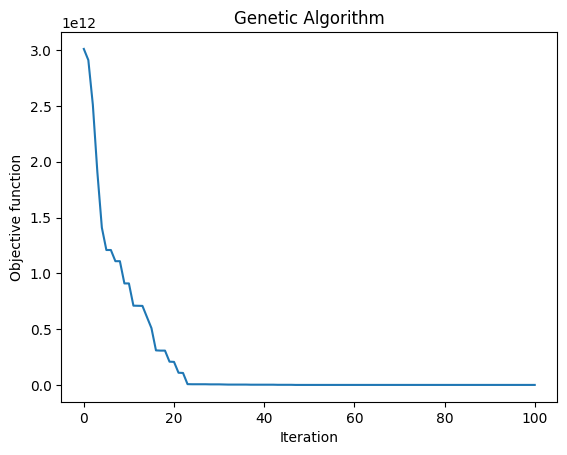

 The best solution found:                                                                           
 [ 483.  786.  911. 1011.  577.  874.  878.  584. 1048.  543.  484.  763.
  531.  677.  869. 1058. 1139.  912. 1045.  931.  482.]

 Objective function:
 4000037985.986111


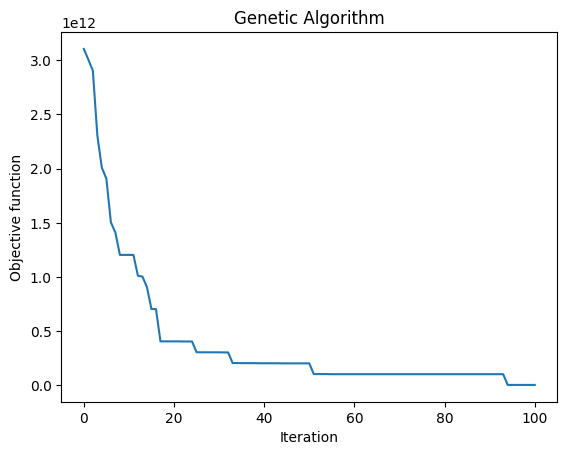

 The best solution found:                                                                           
 [ 626.  852.  487.  954.  880.  852.  602.  489. 1008. 1026. 1018.  550.
  585.  668. 1016.  483. 1143. 1017.  966.  730.  783.]

 Objective function:
 3000037993.5


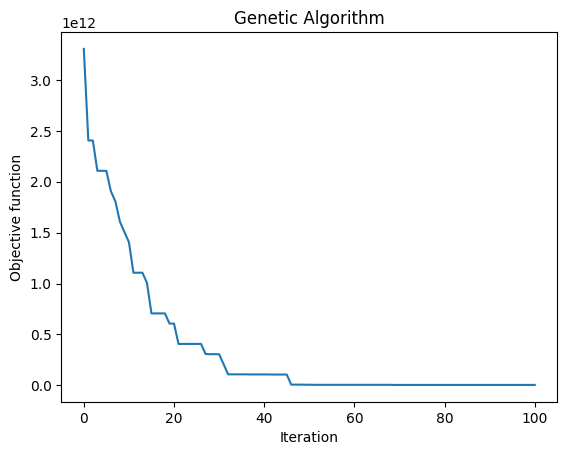

 The best solution found:                                                                           
 [ 502.  817.  483.  680.  610. 1044.  931.  866.  933. 1047.  498.  912.
  951.  751.  487. 1029. 1154.  930.  869. 1029.  541.]

 Objective function:
 3000038023.138889


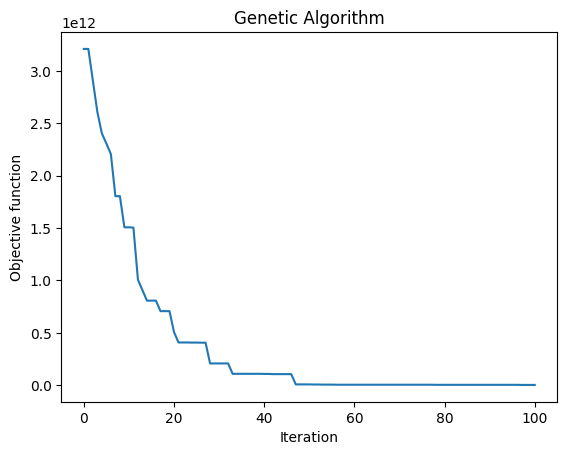

 The best solution found:                                                                           
 [ 548. 1023.  491.  942.  590. 1051.  780.  536.  805.  700.  488. 1007.
 1002.  772.  687. 1052.  842.  885.  862.  891.  503.]

 Objective function:
 5000038097.208333


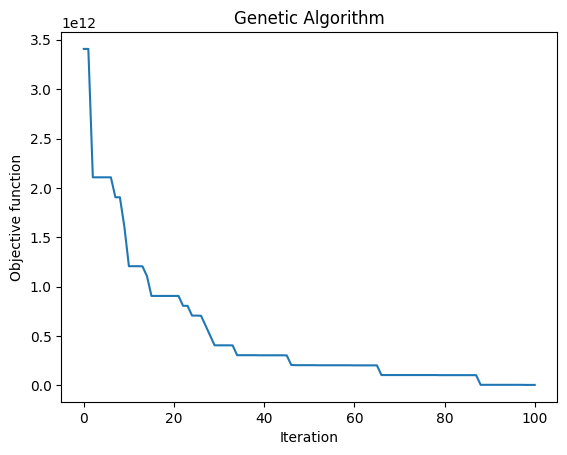

 The best solution found:                                                                           
 [ 491. 1062.  617.  740.  726. 1028.  611.  845.  856.  928.  523.  567.
  487.  924.  894. 1043. 1148.  677. 1017. 1000.  483.]

 Objective function:
 101000038016.59723


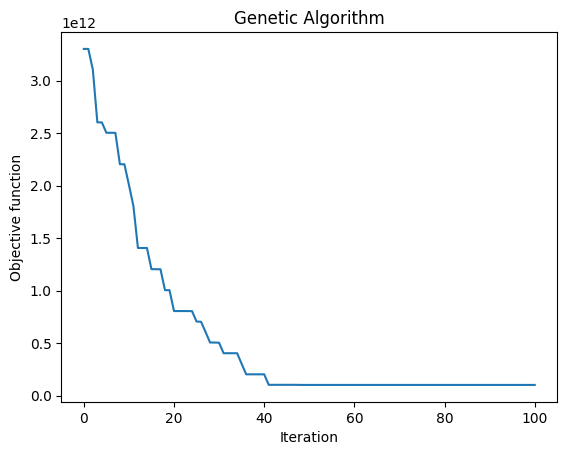

 The best solution found:                                                                           
 [ 706. 1026.  803.  756.  612. 1058.  549.  486.  905.  892.  532.  998.
  495. 1115.  691. 1007.  885.  607. 1014.  937.  951.]

 Objective function:
 105000038050.40277


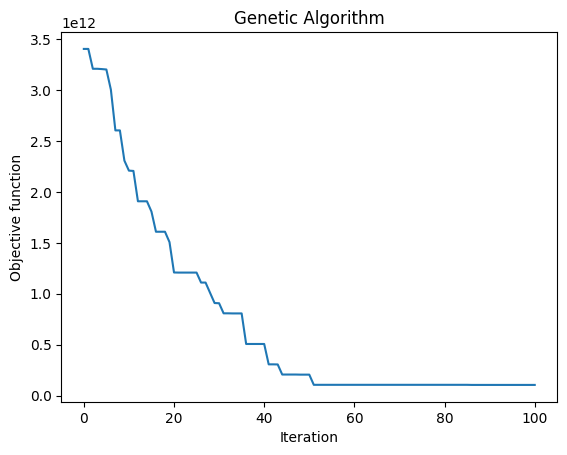

 The best solution found:                                                                           
 [ 992. 1042.  929.  841.  784.  623.  566.  722.  526.  684.  512. 1021.
  481.  559.  720. 1014.  914.  876.  641.  911.  637.]

 Objective function:
 5000038107.652778


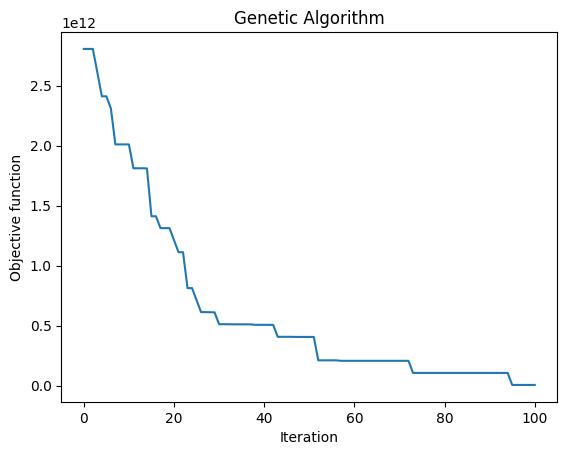

 The best solution found:                                                                           
 [ 612. 1065.  660.  482.  555.  932. 1143.  956.  753.  751.  515.  916.
  504.  745.  929. 1053.  664.  662.  964.  809.  546.]

 Objective function:
 104000038051.59723


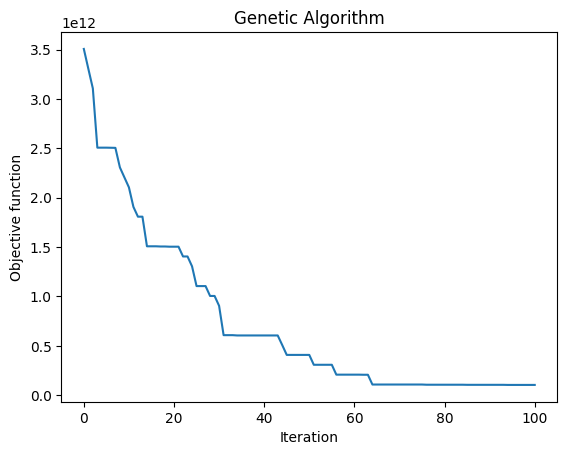

 The best solution found:                                                                           
 [ 484. 1049.  597.  609.  682. 1033.  779.  545.  864.  883.  994. 1048.
  892.  774.  681.  492.  919.  880.  977.  981.  574.]

 Objective function:
 5000038081.611111


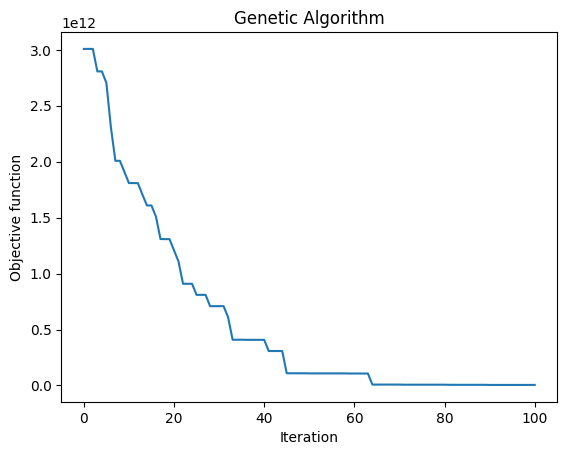

 The best solution found:                                                                           
 [ 878.  832.  796.  481.  734.  992. 1085.  560. 1066.  643.  607.  718.
  534.  980.  949.  493.  918.  849. 1001.  638.  607.]

 Objective function:
 106000038024.84723


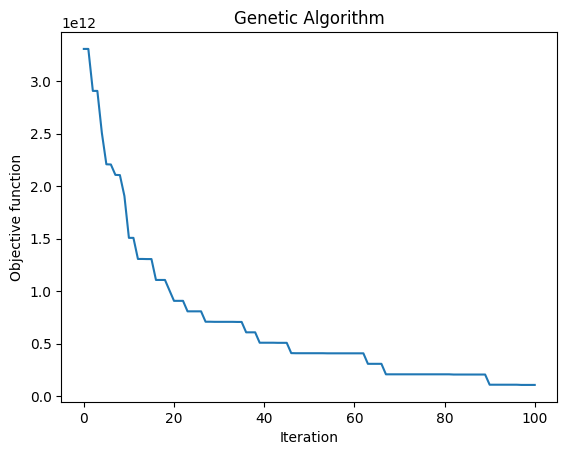

 The best solution found:                                                                           
 [ 846.  993.  636. 1097.  502. 1054.  820.  663.  754.  958.  611. 1069.
  499.  873.  921. 1062.  595.  668. 1024.  767.  543.]

 Objective function:
 103000038050.81944


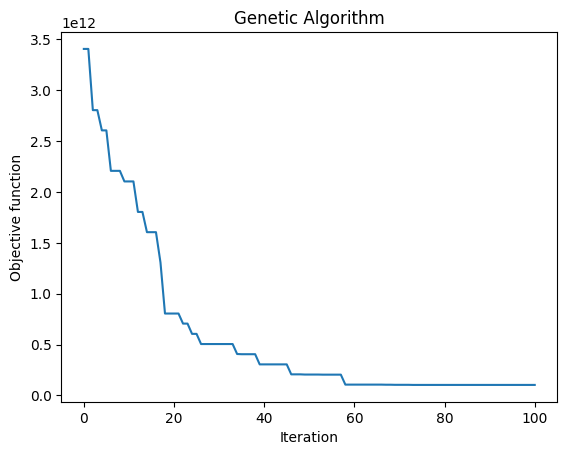

 The best solution found:                                                                           
 [ 813.  980.  516.  577.  972.  853.  782. 1125. 1044.  913.  505.  754.
  937.  901.  495. 1036. 1073. 1178.  648.  665.  913.]

 Objective function:
 304000038030.1528


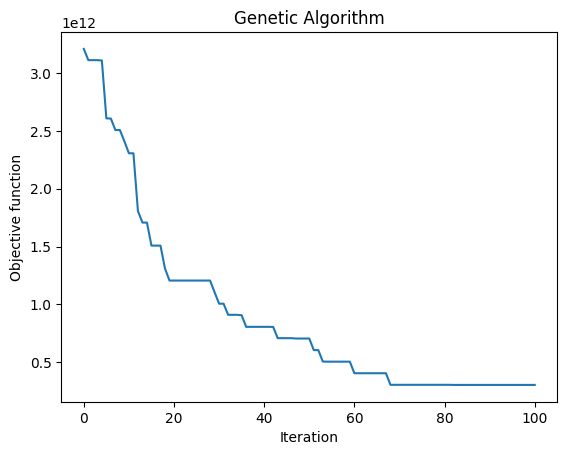

 The best solution found:                                                                           
 [ 919.  880.  616.  977.  795.  572.  525.  899. 1002.  740.  565.  856.
  835. 1130.  720.  899.  726.  800.  514.  643.  604.]

 Objective function:
 303000038160.1667


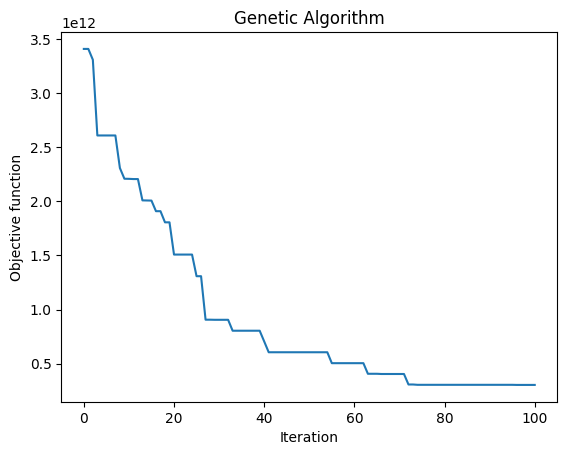

 The best solution found:                                                                           
 [ 613.  852.  493.  953.  649. 1047.  580.  866.  716.  750.  513.  843.
 1002.  572.  934. 1049.  797.  663.  846.  734.  540.]

 Objective function:
 1000038138.3333334


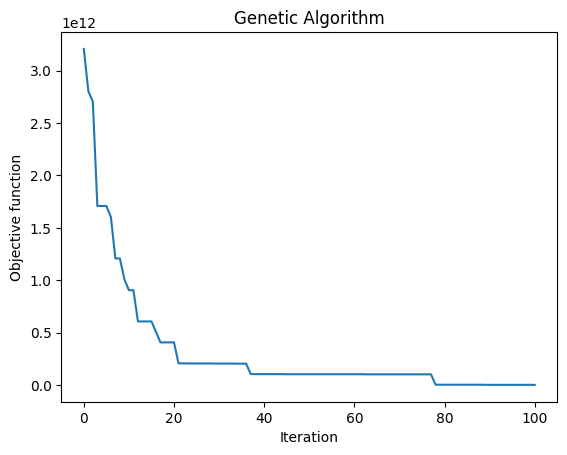

 The best solution found:                                                                           
 [ 484.  996.  571.  780.  507.  888.  652.  879. 1029.  728.  497.  867.
 1003.  651.  718. 1031. 1149.  891.  657. 1087.  582.]

 Objective function:
 103000038059.15277


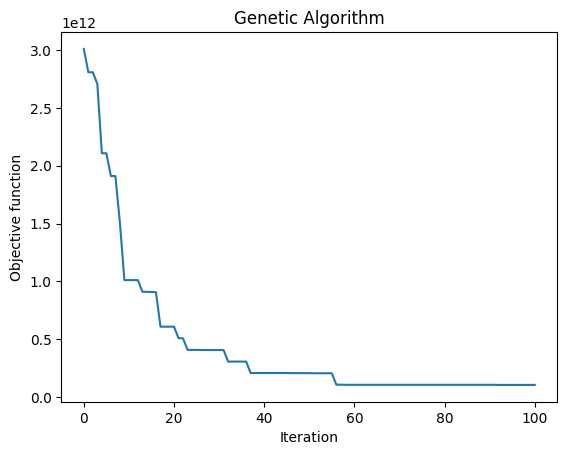

 The best solution found:                                                                           
 [ 482.  840.  861.  619.  496. 1011.  767.  759. 1019. 1036.  503.  824.
  489. 1010.  956.  994.  573.  883.  946. 1136.  686.]

 Objective function:
 102000038021.11111


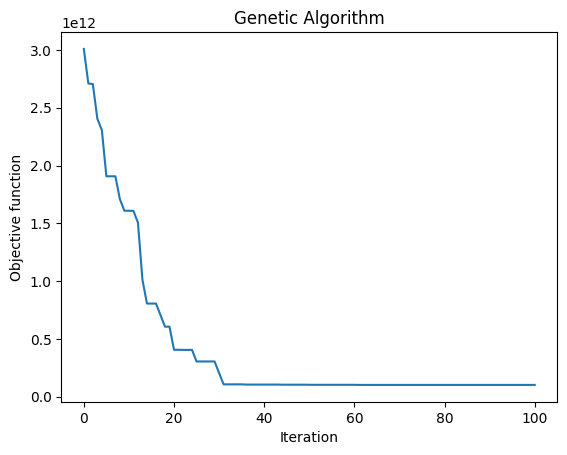

 The best solution found:                                                                           
 [ 484.  680.  705. 1060.  781. 1006.  627.  804.  925.  848.  494. 1022.
  577.  556.  842. 1014. 1151.  895.  884.  951.  756.]

 Objective function:
 102000038088.59723


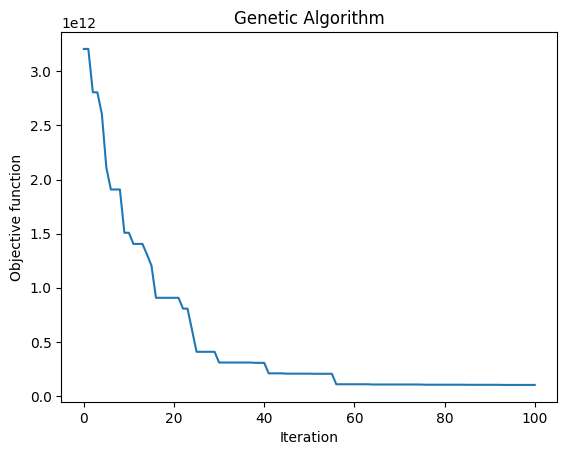

 The best solution found:                                                                           
 [ 648.  567.  536. 1179.  678.  492.  930. 1009.  739.  854.  521.  544.
  612.  921. 1005.  830. 1101.  650. 1024.  768.  484.]

 Objective function:
 202000038054.625


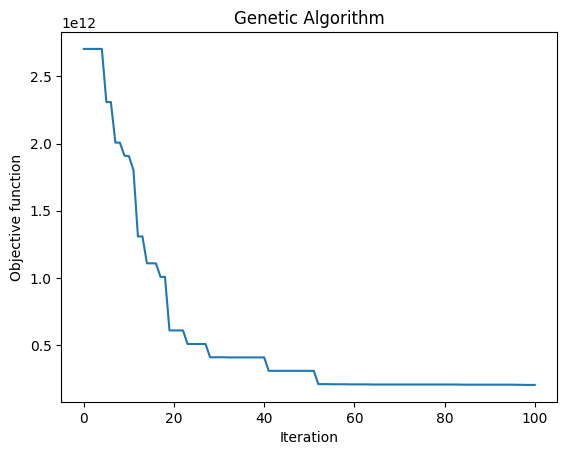

 The best solution found:                                                                           
 [ 575.  708.  637. 1083.  968.  766.  825. 1018.  864.  602.  799.  683.
  973.  902.  822. 1039. 1145.  521.  752.  588.  490.]

 Objective function:
 103000037700.375


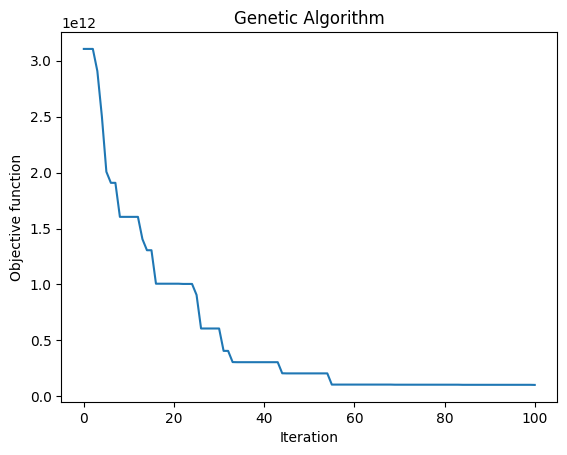

 The best solution found:                                                                           
 [ 572. 1104.  847.  543.  481. 1003.  891.  803.  966. 1040.  818. 1083.
  531.  718.  832.  997. 1028.  607.  990.  950.  631.]

 Objective function:
 5000038078.041667


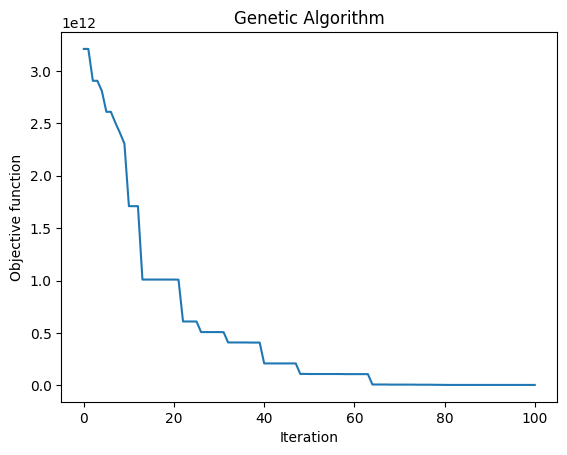

 The best solution found:                                                                           
 [ 489.  933.  562.  661.  737. 1046.  862.  943.  844. 1047.  532.  922.
  486. 1030.  836. 1060. 1148.  773.  990.  563.  488.]

 Objective function:
 102000038008.66667


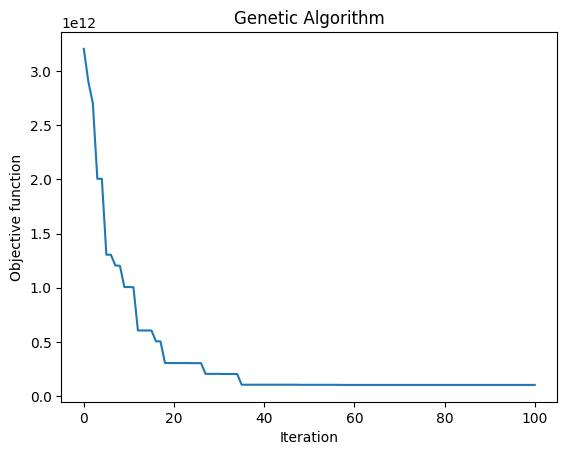

 The best solution found:                                                                           
 [ 585.  542.  482.  888.  841. 1058. 1149.  663. 1069.  976.  484.  865.
  588. 1016.  952.  864. 1096.  657. 1029.  755.  483.]

 Objective function:
 2000037971.0694444


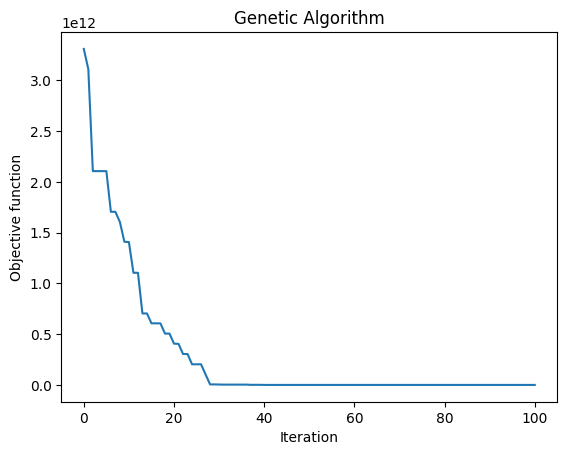

 The best solution found:                                                                           
 [ 591.  905. 1004.  993.  867. 1063.  644.  928.  557.  764.  843.  742.
  916.  643.  488. 1054. 1131.  545.  491.  854.  704.]

 Objective function:
 5000038013.083333


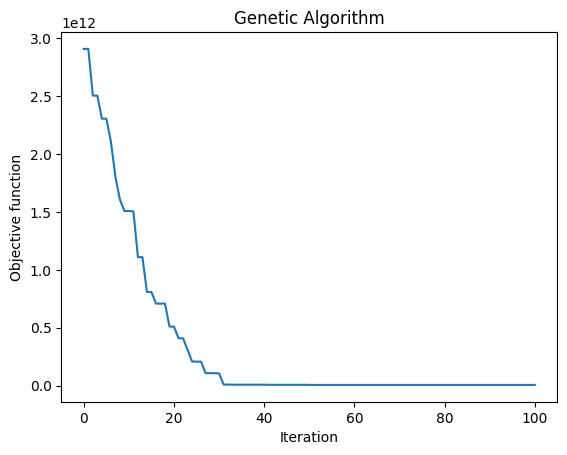

 The best solution found:                                                                           
 [ 499.  730.  778.  926.  488. 1025. 1123. 1004. 1056.  683.  500.  726.
  632.  863. 1006. 1035. 1069.  927.  855.  558.  893.]

 Objective function:
 3000038008.111111


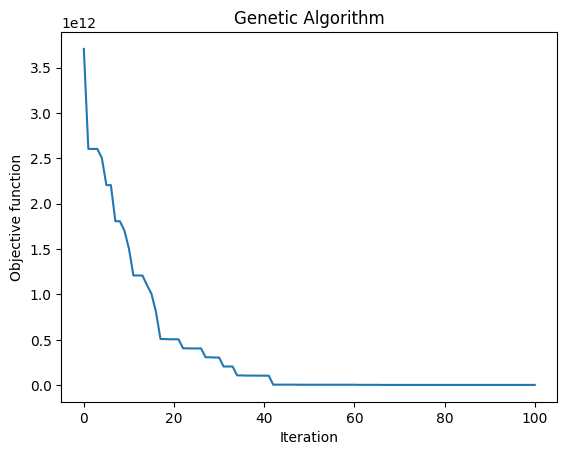

 The best solution found:                                                                           
 [ 560. 1049.  576.  865.  920. 1029.  660.  496.  544.  760.  494.  829.
  489.  581.  810. 1057.  944.  734. 1035.  998.  550.]

 Objective function:
 104000038043.41667


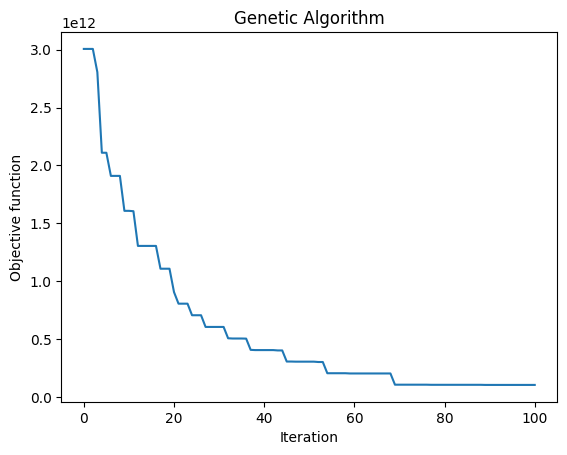

 The best solution found:                                                                           
 [1045.  555.  562. 1081.  803.  639.  690.  862.  935.  753.  793. 1058.
  658.  898.  742. 1059. 1196.  684. 1026.  967.  507.]

 Objective function:
 202000038072.83334


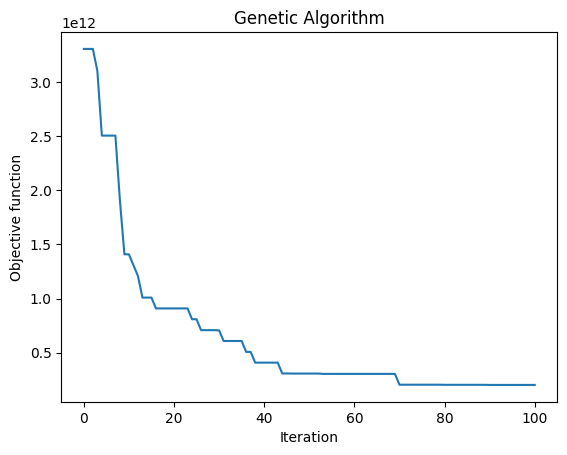

 The best solution found:                                                                           
 [ 782.  635.  595.  991.  811.  604.  482. 1072. 1051. 1165.  498.  956.
  499.  817.  721. 1014.  570.  565.  887.  893.  733.]

 Objective function:
 405000038042.0417


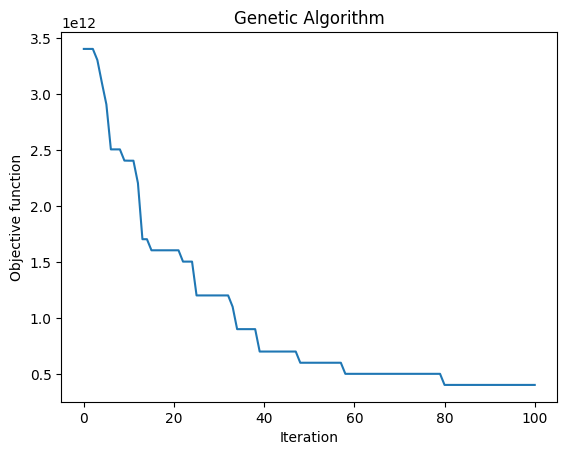

 The best solution found:                                                                           
 [ 852.  647.  481.  542.  972. 1063.  803.  895. 1062.  861.  482.  624.
  578.  730. 1017. 1046. 1097.  930.  892. 1149.  487.]

 Objective function:
 101000037563.98611


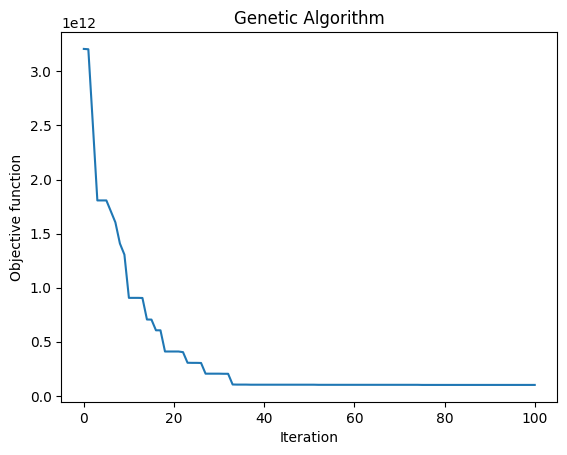

 The best solution found:                                                                           
 [ 502.  598.  494.  883.  862. 1057.  698.  802.  924.  972.  535.  589.
  585.  696. 1017. 1056. 1142.  932. 1017.  964.  545.]

 Objective function:
 38042.63888888889


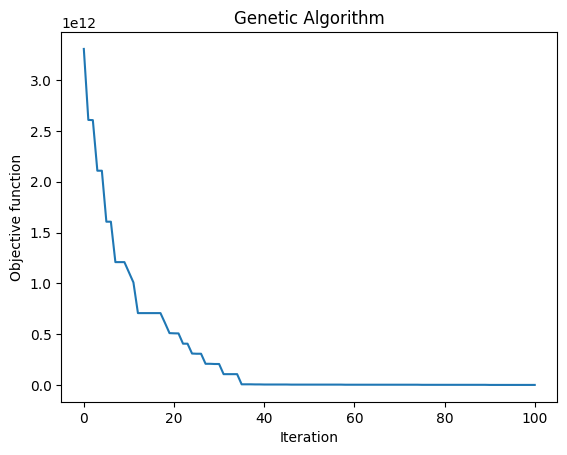

 The best solution found:                                                                           
 [ 496.  874.  694.  557.  494. 1020.  784.  916.  802. 1021.  510.  852.
  502.  775.  703. 1027. 1145. 1012.  959.  959.  643.]

 Objective function:
 3000038031.25


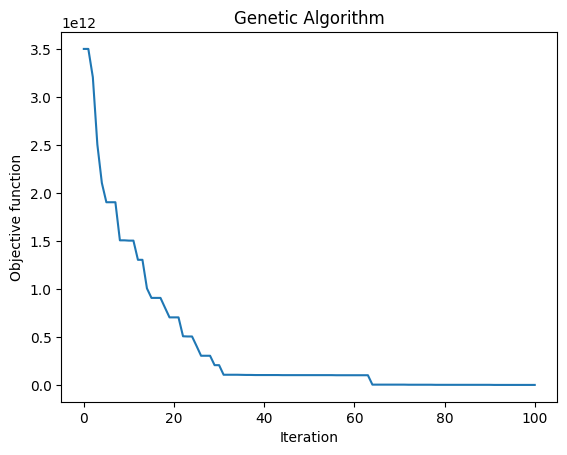

 The best solution found:                                                                           
 [ 588.  710.  481.  902.  641.  652. 1014.  488.  716.  788.  525.  880.
  934.  575. 1012.  733. 1136.  917.  827.  820.  543.]

 Objective function:
 3000036012.361111


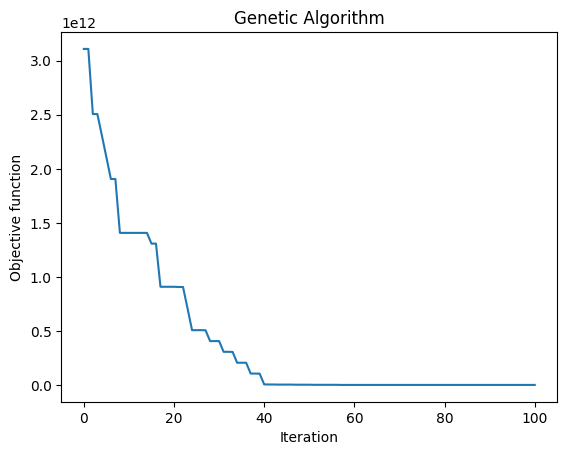

 The best solution found:                                                                           
 [ 530. 1070.  482.  841.  975. 1061.  651.  916. 1063.  588.  484.  624.
  935.  780.  487. 1017.  577.  993.  684.  573.  738.]

 Objective function:
 4000037620.7222223


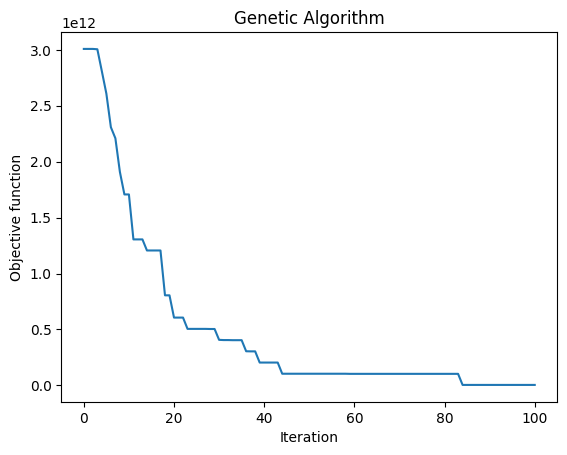

 The best solution found:                                                                           
 [ 556. 1098.  657.  627.  750.  723. 1013.  909.  817.  552.  667. 1071.
 1000.  542.  777.  769.  694.  885.  482.  856.  503.]

 Objective function:
 4000036017.125


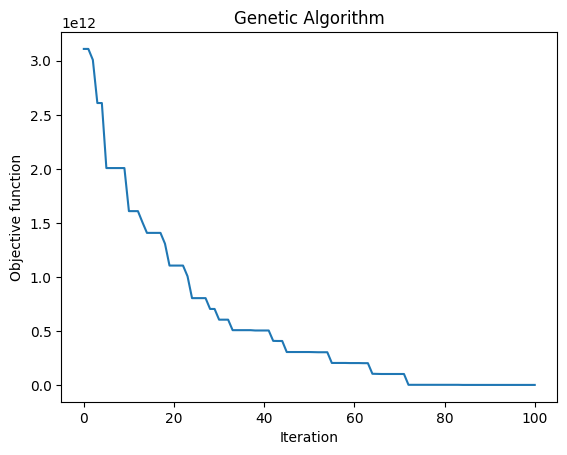

 The best solution found:                                                                           
 [1018.  523.  614.  672.  996.  534.  747. 1004.  958.  901.  609.  628.
  491.  885.  854.  970. 1184.  782.  941.  800. 1125.]

 Objective function:
 306000038076.80554


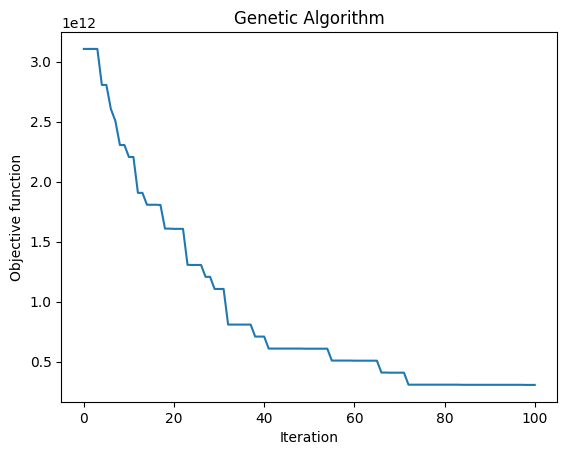

 The best solution found:                                                                           
 [ 484.  550.  488.  725.  786. 1049.  922. 1018.  753.  661.  483.  543.
  583.  920.  950.  996. 1154. 1018. 1049.  848.  492.]

 Objective function:
 1000037983.1111112


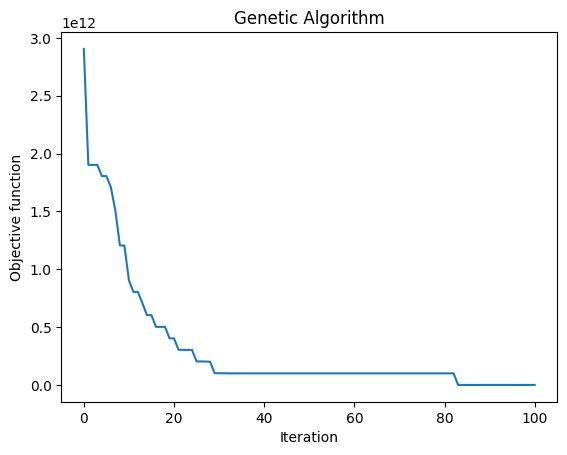

 The best solution found:                                                                           
 [1046. 1060.  663.  950.  975.  505.  622.  728.  748.  583.  486.  569.
  493.  852.  909. 1061. 1145.  690. 1048.  801.  483.]

 Objective function:
 3000038014.2083335


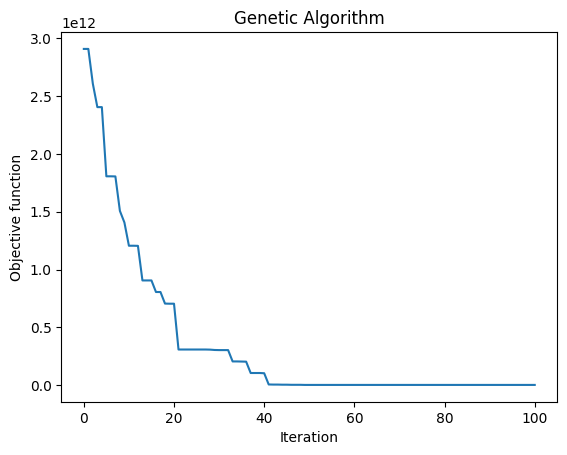

 The best solution found:                                                                           
 [ 491.  924.  646.  763.  490.  954.  653.  924. 1012.  873.  487.  915.
  486.  558.  859. 1018. 1116.  644.  929. 1028.  827.]

 Objective function:
 4000038041.0833335


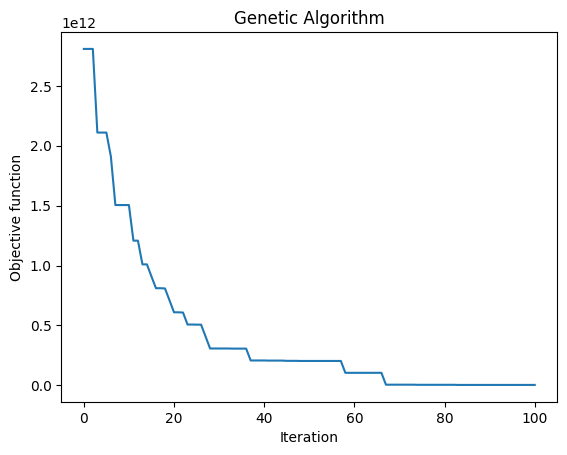

 The best solution found:                                                                           
 [ 570.  724.  503.  563.  645.  673.  905.  951.  794. 1012.  486.  719.
  994.  904.  483.  692.  838. 1011.  830.  837.  666.]

 Objective function:
 4000036002.5972223


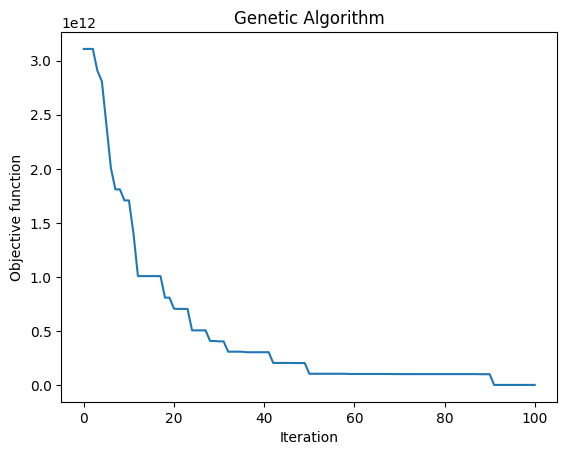

 The best solution found:                                                                           
 [ 486.  488.  486.  938.  837. 1049.  666.  580.  940.  802.  527.  902.
  575.  733.  937. 1055. 1151.  861.  996. 1008.  606.]

 Objective function:
 102000037981.13889


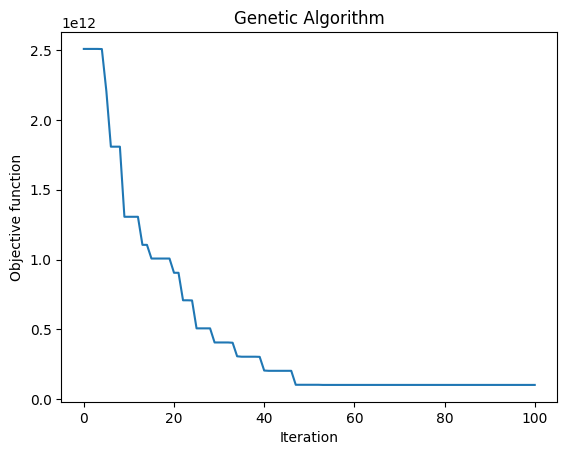

 The best solution found:                                                                           
 [ 664.  932.  729.  721.  561.  863.  646.  890.  808.  894.  583.  716.
  527. 1041.  976.  960. 1148.  642.  982.  878.  570.]

 Objective function:
 102000038148.43056


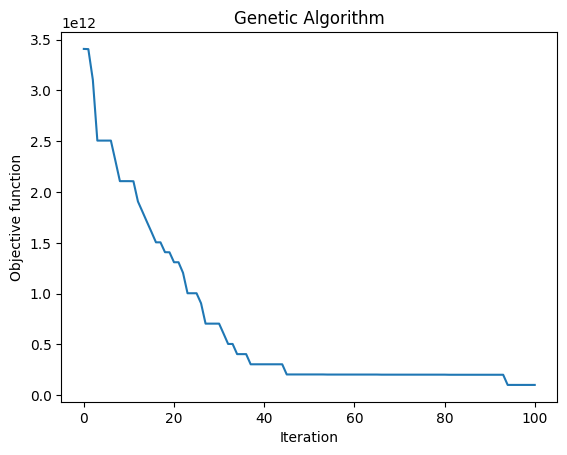

 The best solution found:                                                                           
 [ 812.  916.  613.  585.  913. 1019. 1008.  719.  504.  880.  883.  567.
  891. 1006.  786.  675. 1082.  802. 1003. 1078.  743.]

 Objective function:
 106000038129.51389


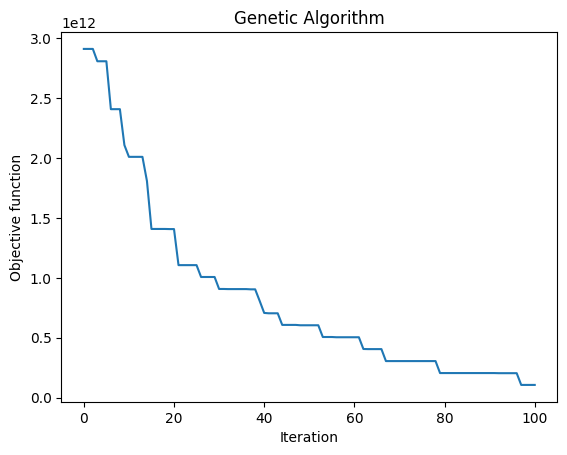

 The best solution found:                                                                           
 [ 483. 1048.  576.  637.  971. 1033.  568.  796. 1055.  699.  486. 1036.
  483.  897.  567. 1060.  743.  970.  841.  740.  483.]

 Objective function:
 3000037629.4444447


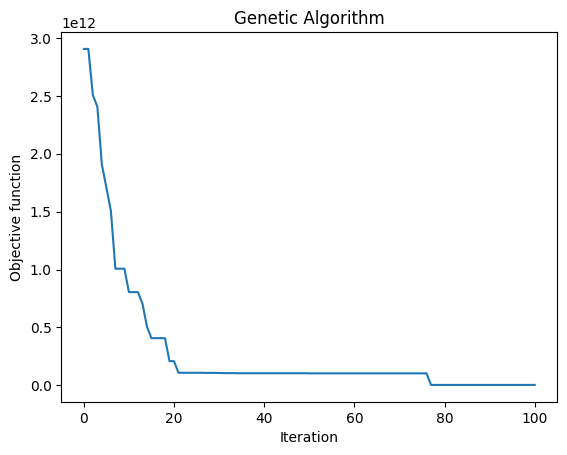

 The best solution found:                                                                           
 [ 542.  998.  625.  813.  564.  901. 1140.  687.  486.  760.  481.  978.
  503.  917.  913. 1050. 1086.  738. 1033.  625.  534.]

 Objective function:
 4000038014.4027777


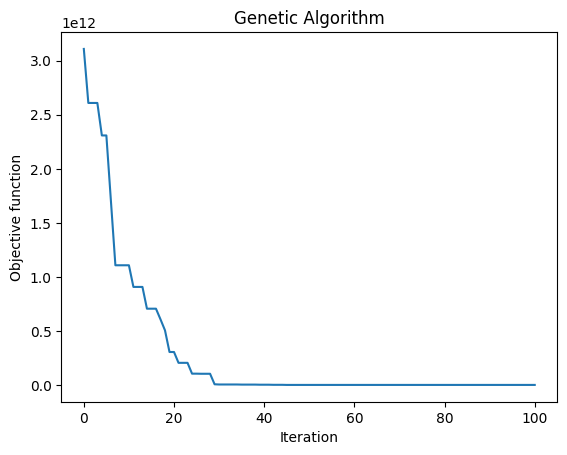

 The best solution found:                                                                           
 [ 850. 1057.  489.  787.  707.  889.  944.  910.  940. 1003.  503. 1044.
  895.  580.  982. 1029.  863.  722. 1044.  641.  515.]

 Objective function:
 3000038053.7916665


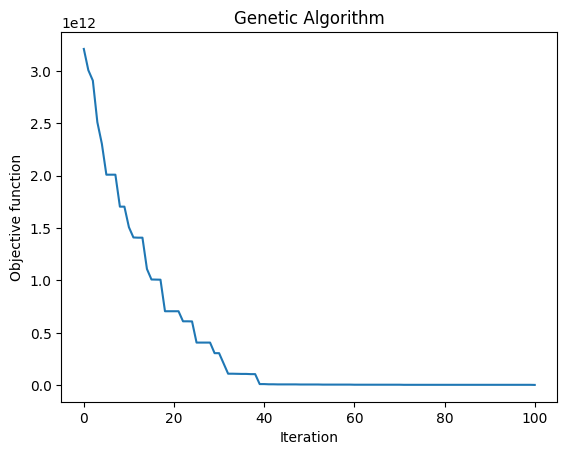

 The best solution found:                                                                           
 [ 488.  936.  690.  851.  863.  930.  551.  706.  519.  603.  486. 1013.
  500.  775.  949. 1037. 1147.  703. 1047.  638.  500.]

 Objective function:
 3000038007.0416665


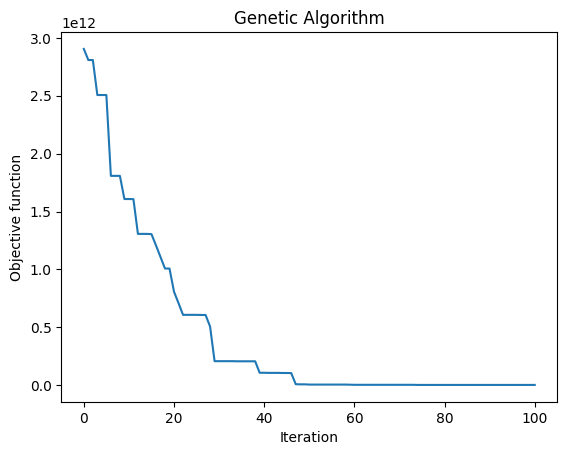

 The best solution found:                                                                           
 [ 505.  976.  496.  754.  848.  864.  925.  906. 1059.  635.  495.  582.
  845. 1096.  515. 1060.  705.  824.  923. 1203.  550.]

 Objective function:
 303000037978.19446


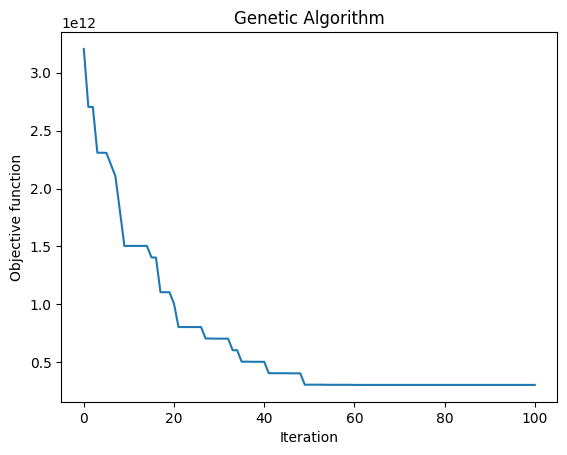

 The best solution found:                                                                           
 [ 813.  568.  513.  501.  647.  994. 1141. 1136. 1037.  859.  495.  849.
  994. 1067.  895. 1062.  773.  999.  777.  717.  819.]

 Objective function:
 304000038054.31946


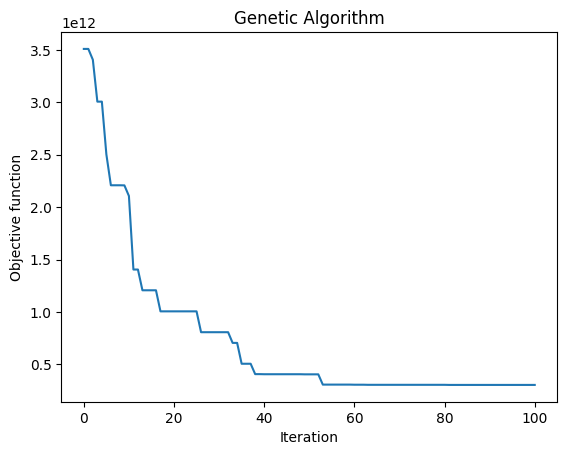

 The best solution found:                                                                           
 [ 623. 1103.  604.  665.  893.  772.  842.  988.  741.  557.  515. 1088.
  502.  598.  974. 1061.  548.  826. 1006.  770. 1222.]

 Objective function:
 7000038077.5


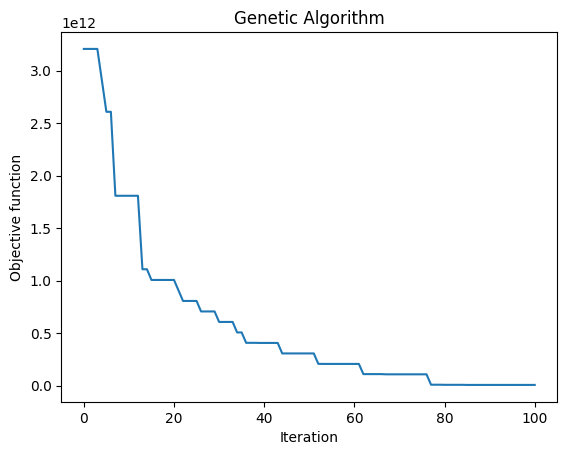

 The best solution found:                                                                           
 [ 486. 1021.  488.  733.  661. 1044.  907.  663.  772.  973.  873.  899.
  577.  541.  948. 1063. 1153.  865. 1049.  808.  483.]

 Objective function:
 2000037986.9166667


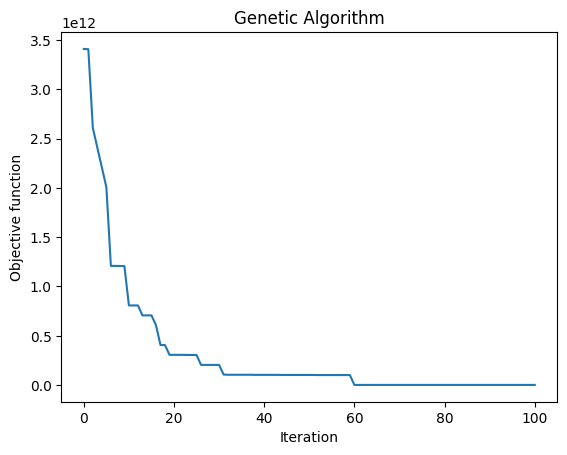

 The best solution found:                                                                           
 [ 485.  671.  579.  834.  976. 1056.  597.  969.  856.  785.  792.  548.
  493.  912.  896. 1031. 1154.  483. 1046.  774.  845.]

 Objective function:
 2000037995.9166667


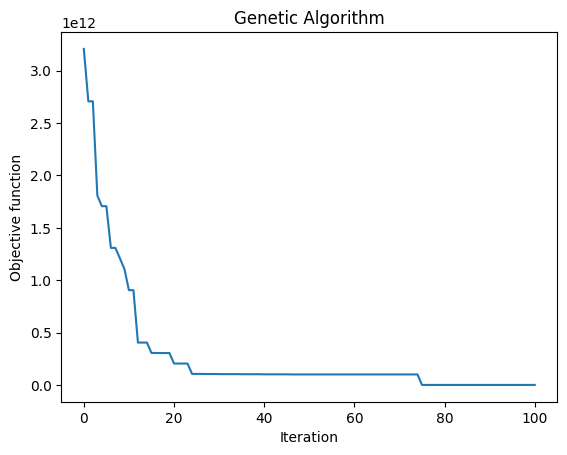

 The best solution found:                                                                           
 [ 850. 1089.  481.  634.  967. 1048.  893.  499.  918.  723.  490. 1076.
  908.  713. 1008. 1063.  774.  933. 1039.  560.  845.]

 Objective function:
 5000037993.0


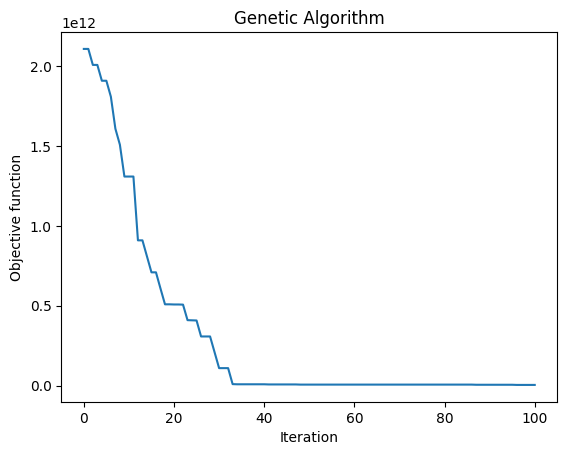

 The best solution found:                                                                           
 [ 854.  867.  941.  485. 1185.  896.  709.  980.  503.  671.  494.  856.
  494.  608.  939. 1024. 1137. 1010. 1039.  780.  904.]

 Objective function:
 204000037965.55554


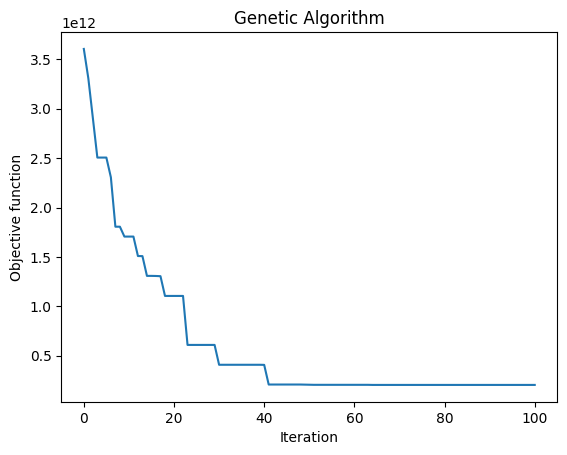

 The best solution found:                                                                           
 [ 485. 1075.  516.  919.  626. 1053.  738.  735.  838.  997.  923.  718.
  981.  991.  914.  483.  562.  611.  726.  861.  481.]

 Objective function:
 2000038079.3055556


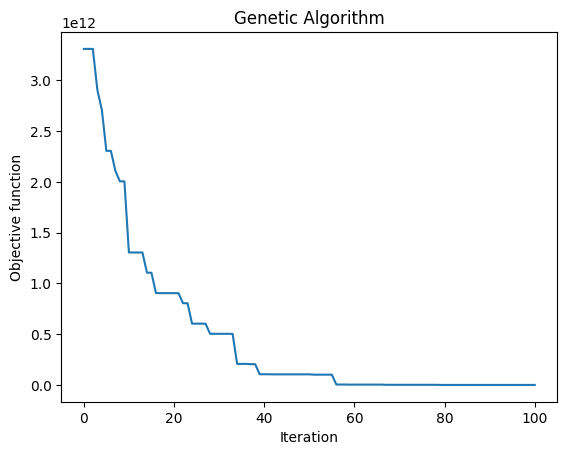

 The best solution found:                                                                           
 [ 483. 1117.  638.  704.  749.  935.  851. 1014.  859.  559.  606. 1009.
  482.  789.  607.  983.  555.  951.  994.  929.  500.]

 Objective function:
 103000038056.52777


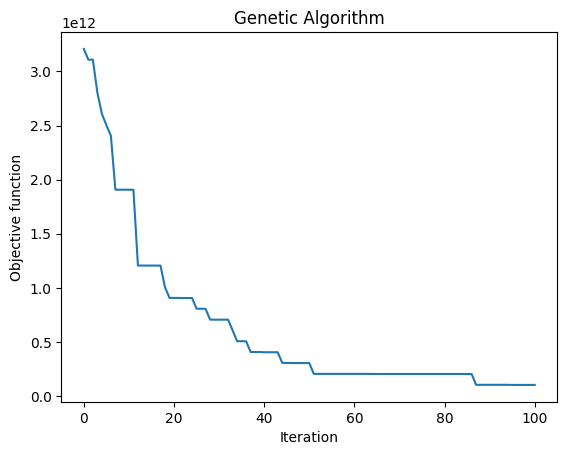

 The best solution found:                                                                           
 [ 977.  555.  529. 1074.  678.  652.  970.  859.  816. 1022.  507.  951.
  979. 1139.  717.  998.  789.  905.  875.  785.  511.]

 Objective function:
 203000038058.1111


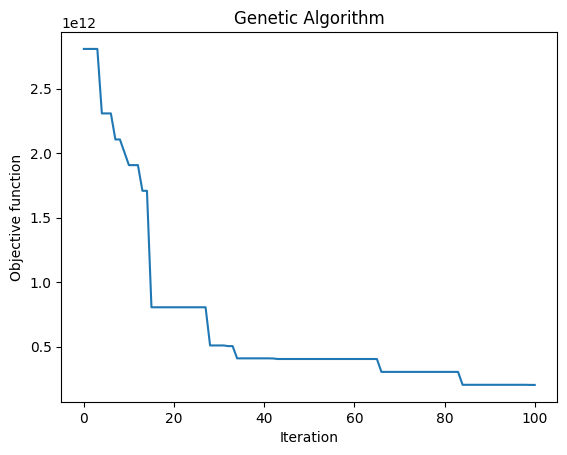

 The best solution found:                                                                           
 [ 485.  940.  482.  722.  861. 1050. 1117.  866. 1046. 1036.  661. 1089.
  642.  484. 1018.  844.  813. 1018.  960.  547.  674.]

 Objective function:
 104000037539.04167


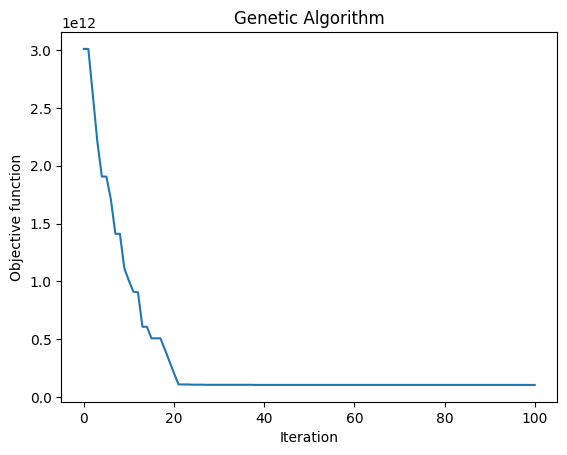

 The best solution found:                                                                           
 [ 850.  675.  842.  545.  609. 1058.  994.  989.  490.  764.  505.  952.
  486.  763.  938. 1027. 1148.  609. 1032.  863.  482.]

 Objective function:
 4000037990.138889


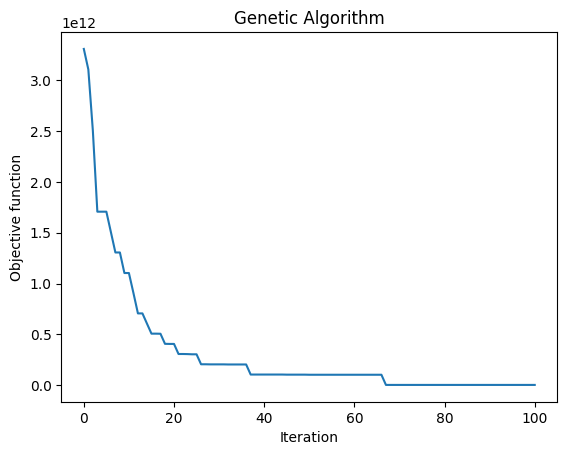

 The best solution found:                                                                           
 [ 556. 1176.  483.  950.  990. 1055.  614.  885. 1069.  841.  485.  563.
  560. 1108.  913. 1049.  749.  829.  885.  696.  496.]

 Objective function:
 202000037970.94446


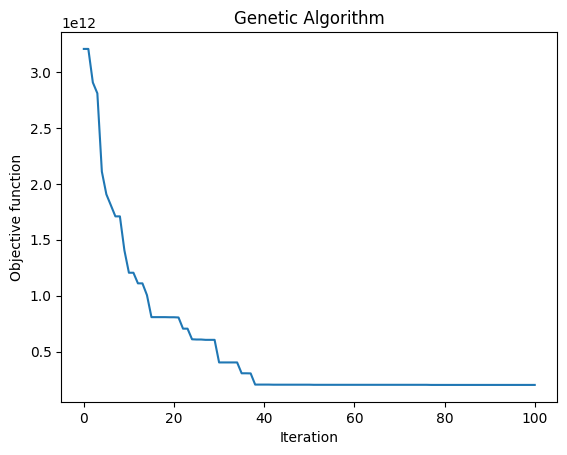

 The best solution found:                                                                           
 [ 488. 1047.  718.  654.  807.  840.  739.  737. 1006.  887.  542. 1028.
  499.  873.  829. 1031.  951.  732. 1037.  592.  549.]

 Objective function:
 3000038120.861111


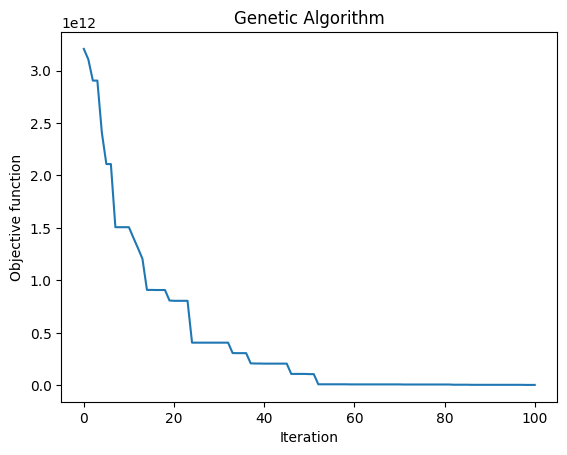

 The best solution found:                                                                           
 [ 499.  811.  485.  926.  677. 1033. 1006. 1005. 1029.  638.  489.  998.
  646.  613.  843.  994. 1132.  723.  842.  552.  511.]

 Objective function:
 3000038031.0


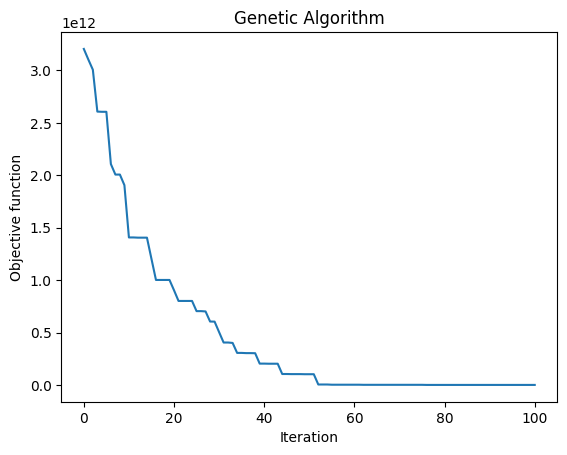

 The best solution found:                                                                           
 [ 501. 1000.  997.  817.  718. 1009.  560.  940.  647.  935.  498. 1092.
  793.  626.  495. 1024.  929.  844.  564.  926.  719.]

 Objective function:
 6000038041.986111


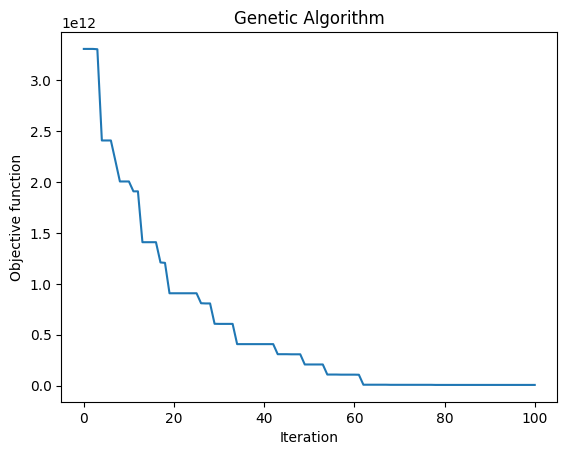

 The best solution found:                                                                           
 [ 577. 1106.  888.  893.  560.  557.  710. 1012.  760.  830.  499.  996.
  494.  633.  726. 1036.  765.  913.  973.  811.  552.]

 Objective function:
 105000038123.54167


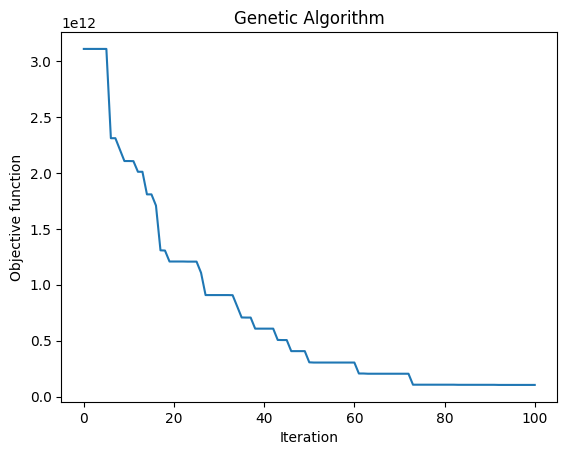

 The best solution found:                                                                           
 [ 545. 1102.  798.  778.  928.  864.  662. 1015.  497.  739.  483.  901.
  490.  601. 1011. 1045.  730.  848. 1045.  841.  556.]

 Objective function:
 3000038012.861111


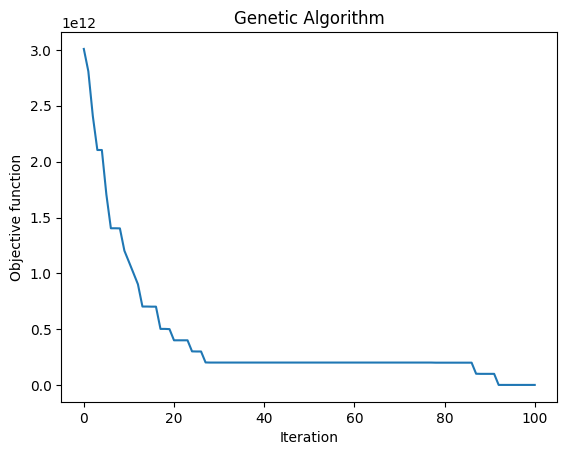

 The best solution found:                                                                           
 [ 487. 1069.  577.  990.  751. 1064.  834.  575.  873.  926.  482.  716.
  487.  831.  563. 1053.  670.  929. 1048.  911.  482.]

 Objective function:
 1000038061.5277778


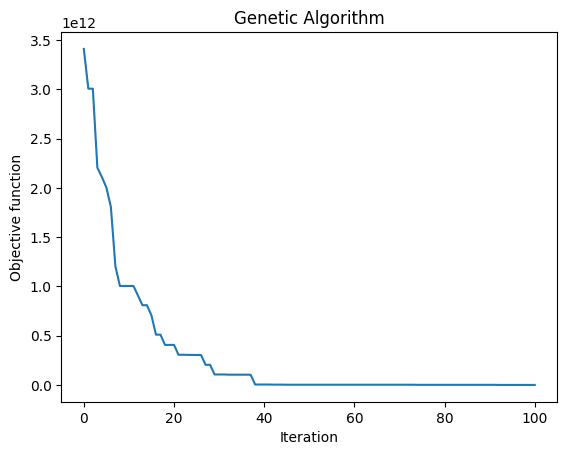

 The best solution found:                                                                           
 [ 569.  611.  603.  760.  890. 1002.  544.  939.  859.  825.  481.  751.
  525. 1137.  864. 1059. 1029.  954. 1029.  699.  492.]

 Objective function:
 101000037599.27777


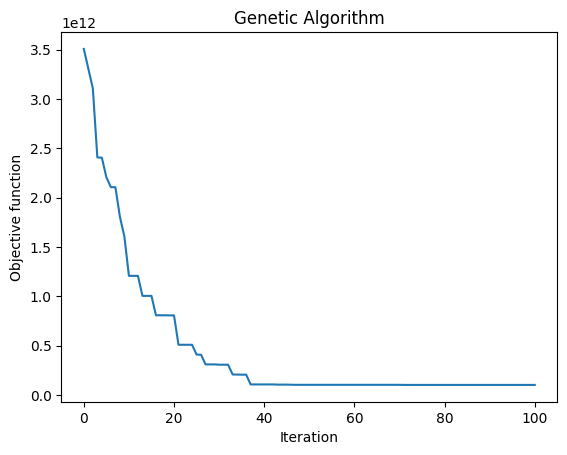

 The best solution found:                                                                           
 [1044.  623.  536.  710. 1168.  522.  949.  949.  946. 1032.  484.  896.
  993.  771.  832. 1063. 1104.  840.  772.  547.  505.]

 Objective function:
 105000038009.29167


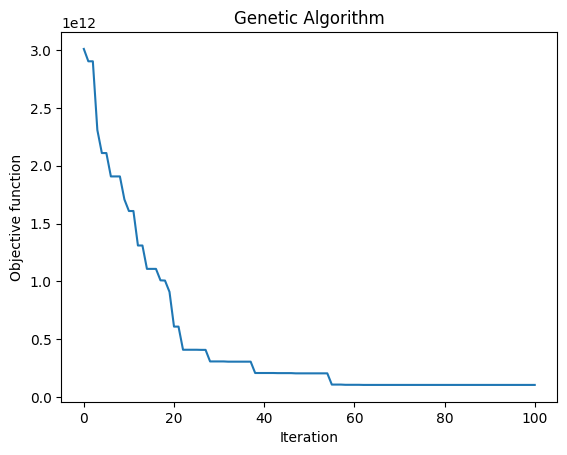

 The best solution found:                                                                           
 [ 550.  675.  810. 1017.  481.  955. 1135.  835. 1017.  643.  513.  973.
  486.  751.  919. 1003.  903.  994. 1037.  584.  553.]

 Objective function:
 104000038032.91667


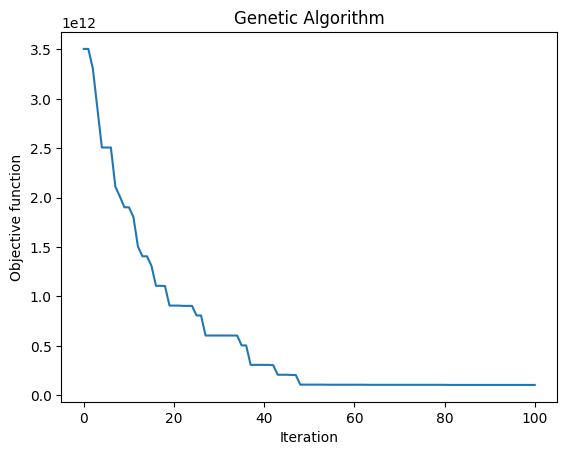

 The best solution found:                                                                           
 [ 559.  846.  636. 1011.  508.  769.  737.  668.  848.  962.  492.  820.
  529.  571.  733.  998. 1113.  650. 1013.  943.  960.]

 Objective function:
 5000038046.777778


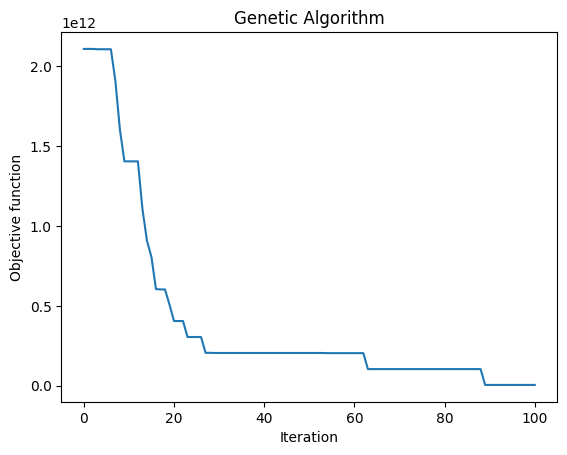

 The best solution found:                                                                           
 [ 571. 1084.  573.  827.  763. 1063.  938.  890.  881. 1036.  965.  891.
  777.  620.  969. 1019. 1032.  484. 1000.  712. 1171.]

 Objective function:
 7000038088.75


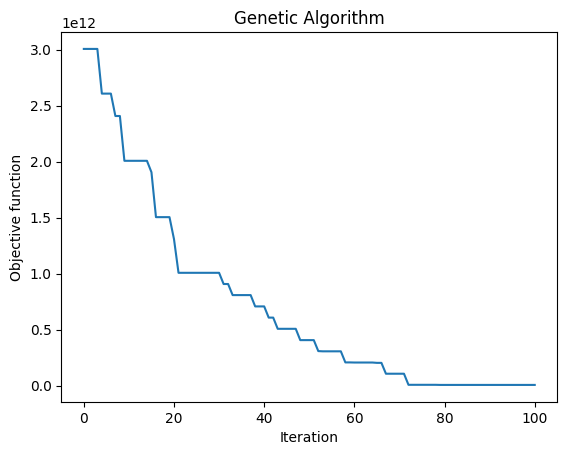

 The best solution found:                                                                           
 [1045.  585.  571.  797.  481.  484.  738.  974.  850. 1041.  487.  557.
  482.  732. 1015. 1059. 1151.  921.  997.  860.  680.]

 Objective function:
 2000037564.125


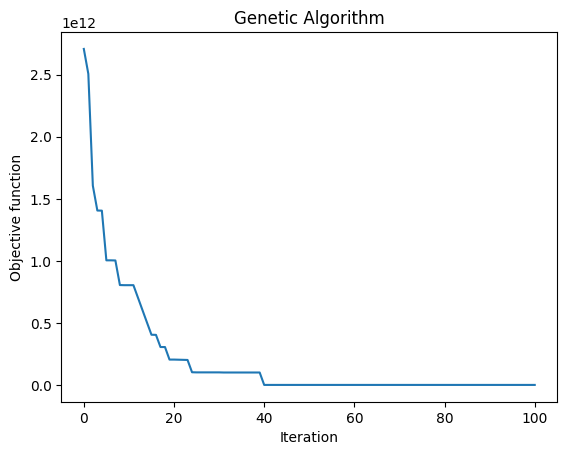

 The best solution found:                                                                           
 [ 497.  759.  486.  843.  613. 1048.  548.  540.  842.  691.  484.  737.
  590.  961.  953. 1059. 1150.  672. 1049. 1028.  486.]

 Objective function:
 37967.02777777778


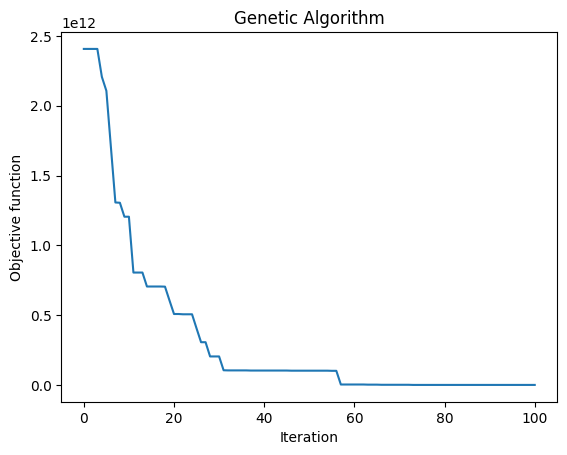

 The best solution found:                                                                           
 [ 482.  798.  481.  606.  846. 1039.  547.  883.  907.  961.  481. 1033.
  579.  544.  686. 1046. 1149.  725. 1044.  950.  495.]

 Objective function:
 2000037993.375


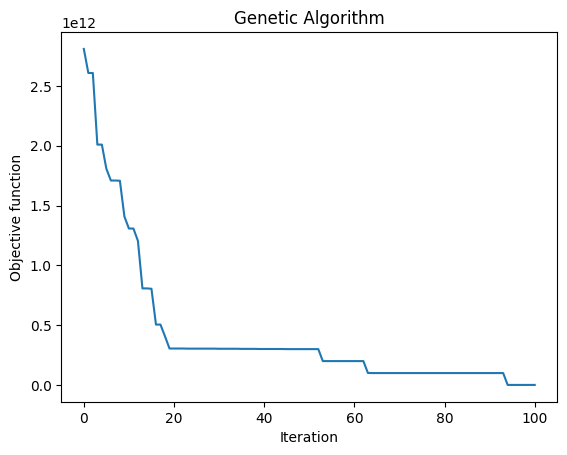

 The best solution found:                                                                           
 [ 496.  784.  527. 1018.  959.  846.  644.  545.  774.  721.  481.  778.
  842.  699.  486. 1041. 1154.  567. 1045.  947.  875.]

 Objective function:
 4000037978.7083335


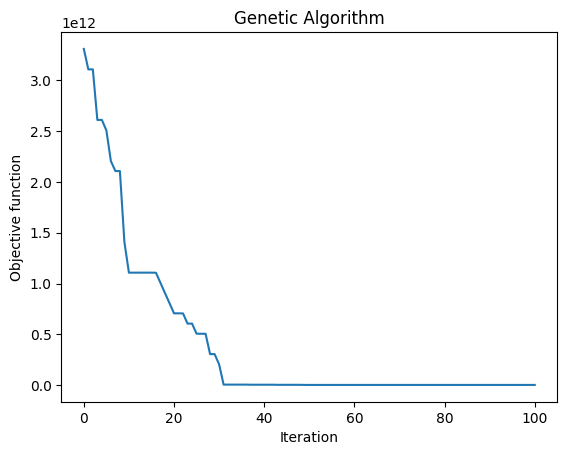

 The best solution found:                                                                           
 [ 498.  663.  587. 1014.  520.  997.  915.  555.  709.  970.  490.  637.
  499.  906.  922.  994. 1122.  828. 1047.  746.  485.]

 Objective function:
 1000038038.9166666


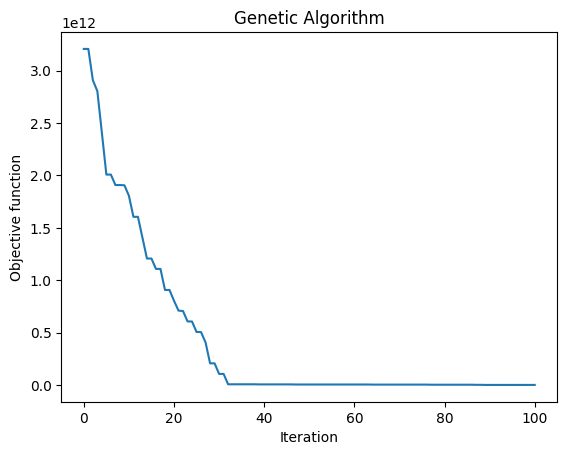

 The best solution found:                                                                           
 [ 720.  980.  624.  841.  888. 1056.  683.  542. 1047.  782.  544. 1094.
  896.  674.  485. 1038.  621.  768.  847.  618.  564.]

 Objective function:
 5000038050.555555


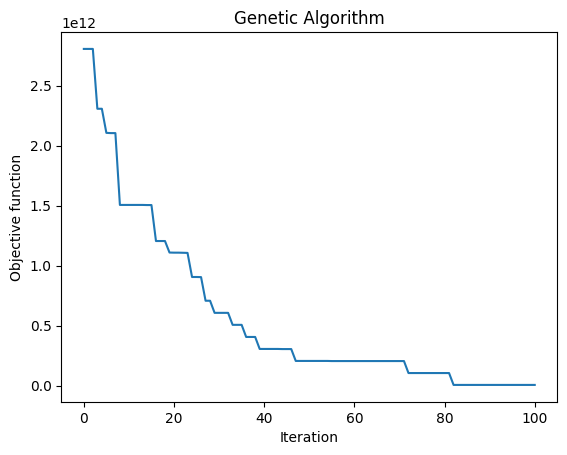

 The best solution found:                                                                           
 [ 940.  901.  634.  766. 1007.  988.  621. 1011.  867.  550.  553.  890.
  951.  619.  489. 1062.  836.  889.  912.  688.  954.]

 Objective function:
 6000038152.694445


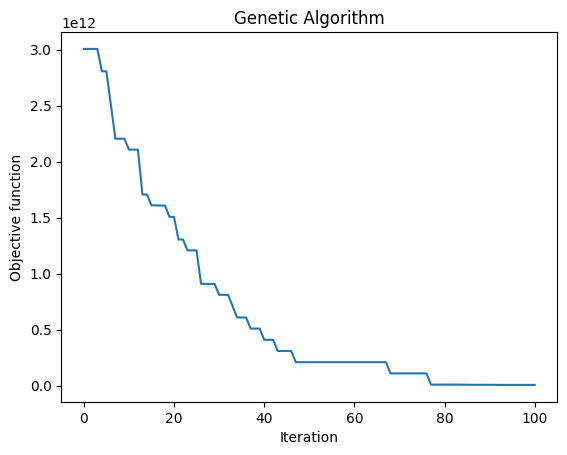

 The best solution found:                                                                           
 [ 873.  845.  678.  766.  953.  913.  508. 1169.  519.  568.  939.  933.
  581.  565.  948. 1053. 1081. 1170. 1037.  682.  852.]

 Objective function:
 303000038017.3889


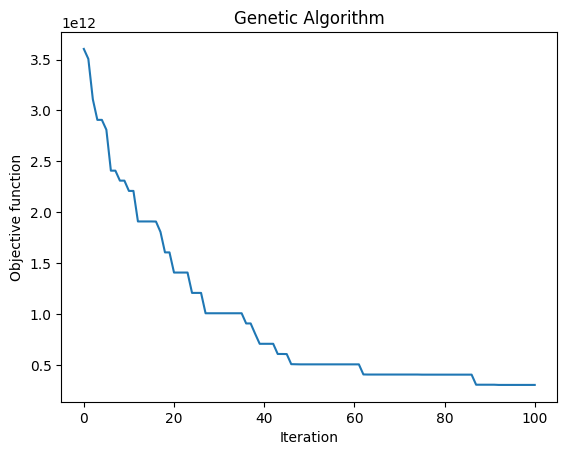

 The best solution found:                                                                           
 [ 514.  988.  650. 1091.  484. 1045.  802.  936.  748.  585.  921. 1070.
  852.  567.  735. 1006.  908.  907. 1006.  663.  876.]

 Objective function:
 105000038088.34723


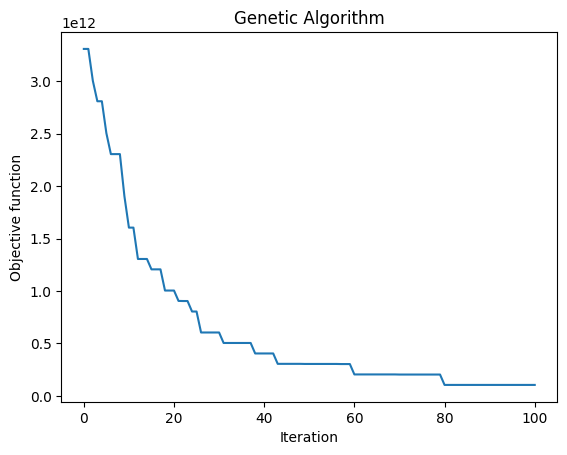

 The best solution found:                                                                           
 [ 576. 1005.  865.  878.  659.  842. 1107.  500. 1050.  946.  752.  980.
  494.  569.  896. 1004.  729.  830. 1004.  725.  795.]

 Objective function:
 6000038095.819445


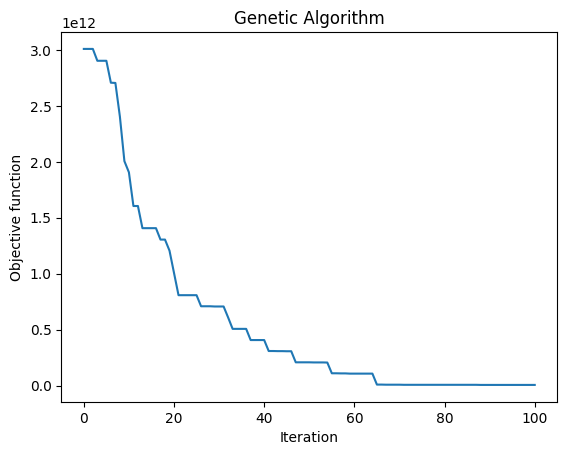

 The best solution found:                                                                           
 [ 766. 1115.  497.  650. 1012.  995.  713. 1011.  821.  609.  582. 1091.
  992.  514.  856.  980.  779.  860.  952.  930.  576.]

 Objective function:
 104000037655.26389


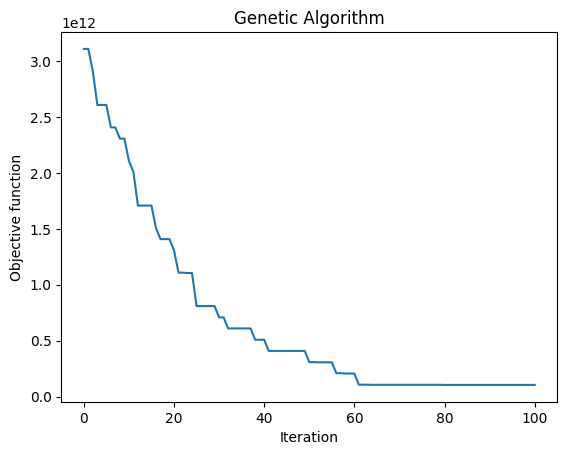

 The best solution found:                                                                           
 [ 642.  910.  841.  715.  549.  868. 1024.  962.  504.  627.  525.  692.
  705. 1075.  556. 1015.  621.  852. 1018.  855.  511.]

 Objective function:
 104000038082.40277


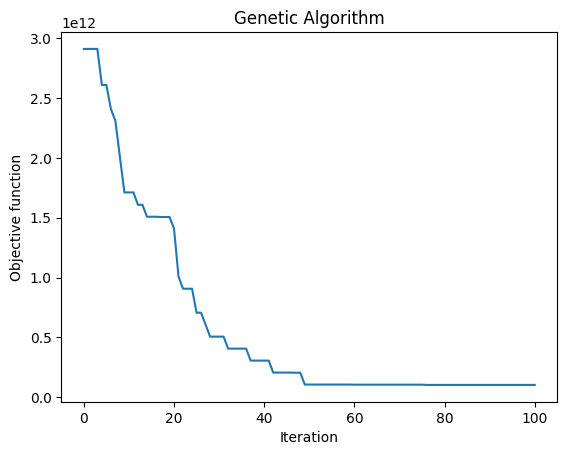

 The best solution found:                                                                           
 [ 962.  940.  576.  694.  954.  518. 1137.  874.  723.  661.  925. 1016.
  960.  496.  854.  870.  805.  801.  803.  642.  769.]

 Objective function:
 106000038065.81944


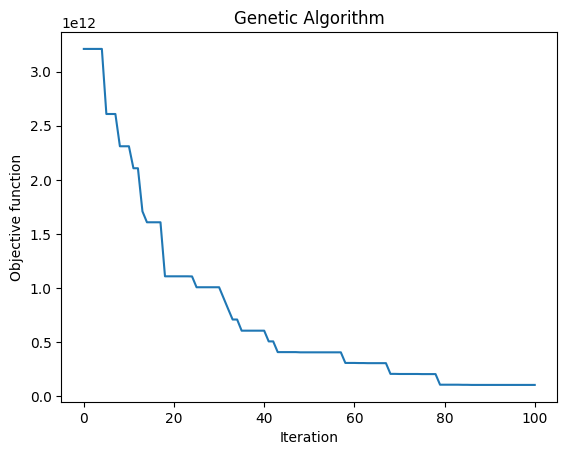

 The best solution found:                                                                           
 [ 496.  980.  838.  482.  647.  846.  714.  936.  548.  788.  485. 1084.
  506.  896.  865. 1062.  549.  653. 1042.  775.  612.]

 Objective function:
 103000037974.13889


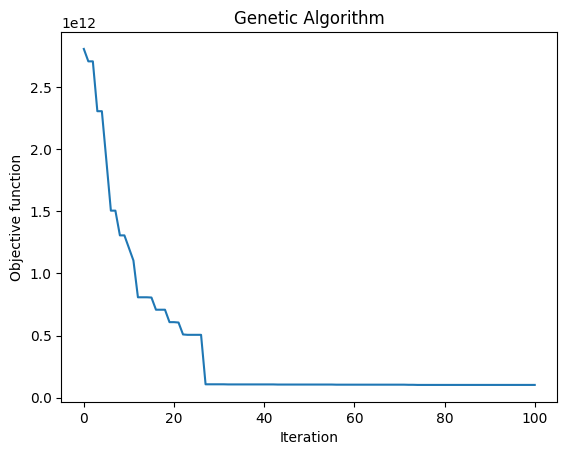

 The best solution found:                                                                           
 [ 498.  965.  716. 1124.  797. 1059. 1066.  772.  891.  546.  559.  768.
  483.  705.  863. 1006.  896.  945. 1034.  601.  659.]

 Objective function:
 103000038038.69444


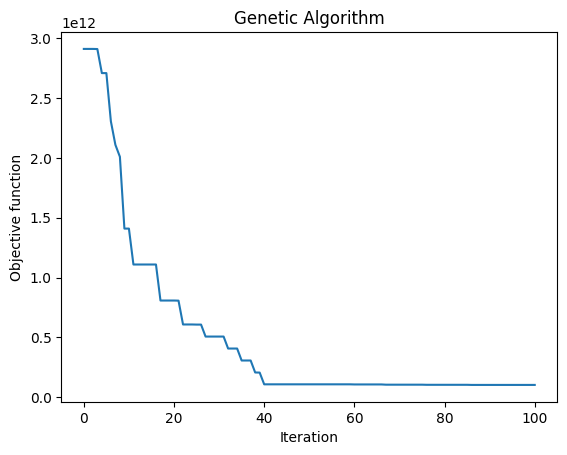

 The best solution found:                                                                           
 [ 494.  737.  490.  623.  996. 1063. 1061.  990. 1058.  587.  568.  580.
  620.  906.  848. 1056.  842.  830.  875. 1143.  492.]

 Objective function:
 102000038033.72223


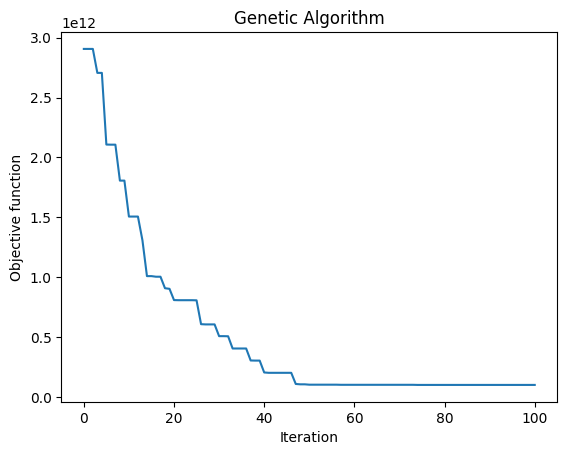

 The best solution found:                                                                           
 [ 507.  743.  493.  879.  858. 1027. 1123.  607. 1041.  677.  762.  863.
  791. 1018.  921.  855.  971.  599.  989.  675.  563.]

 Objective function:
 2000038098.6527777


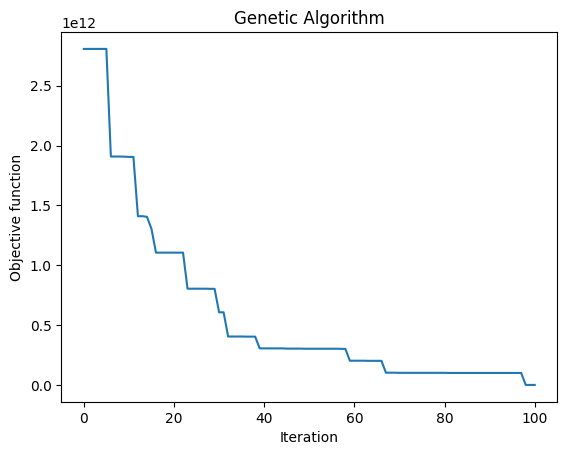

 The best solution found:                                                                           
 [ 523.  756.  493.  881.  975.  966. 1118. 1114. 1064.  687.  877. 1087.
  622.  565. 1019. 1058.  677.  957.  794.  482.  869.]

 Objective function:
 203000037976.29166


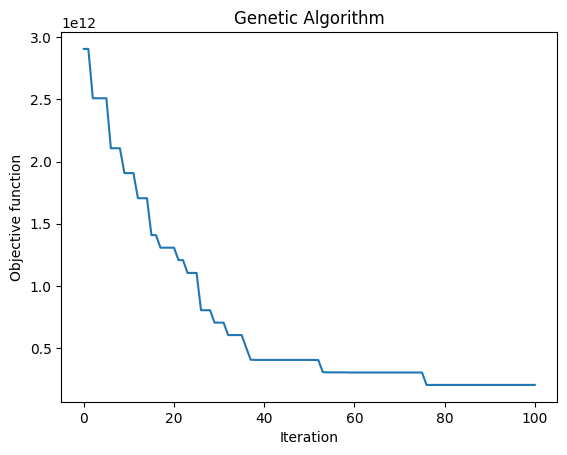

 The best solution found:                                                                           
 [ 660.  654.  514. 1025.  895. 1009. 1142.  941.  834.  744.  546. 1136.
  929.  809.  488.  937.  979.  743. 1033.  584.  853.]

 Objective function:
 205000038081.2361


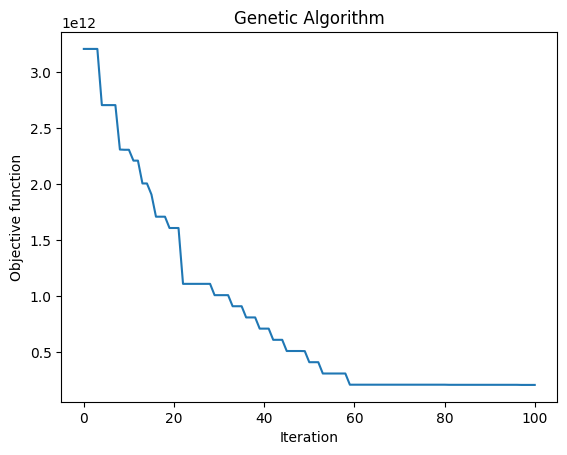

 The best solution found:                                                                           
 [ 571. 1081.  490.  865. 1002. 1048.  615.  608.  867.  806.  486. 1080.
  997.  789.  926. 1057.  670. 1014.  891.  738.  483.]

 Objective function:
 3000037615.625


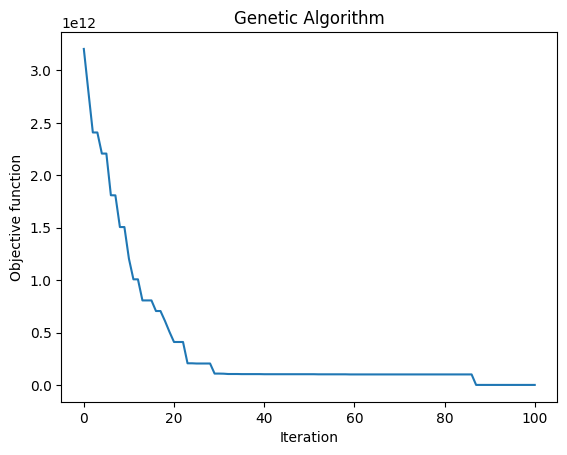

 The best solution found:                                                                           
 [ 575. 1091.  672.  945.  861. 1060. 1016.  879.  927.  569.  500. 1087.
  482.  674. 1014. 1010.  626. 1008. 1011.  561.  507.]

 Objective function:
 4000037610.625


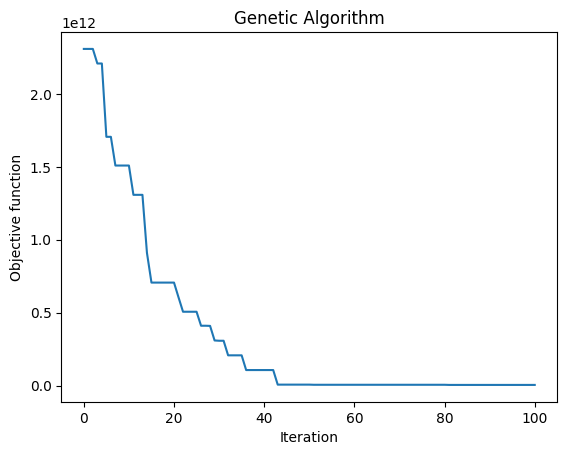

 The best solution found:                                                                           
 [ 843.  664.  643. 1047.  576.  953.  745.  560.  883.  831.  881. 1041.
  538.  817.  854. 1041.  985.  492.  946.  921.  629.]

 Objective function:
 104000034381.11111


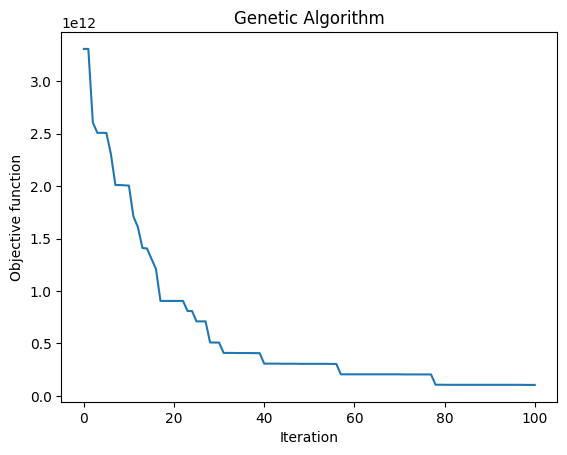

 The best solution found:                                                                           
 [ 498.  693.  610.  483.  997. 1063.  608.  922.  963.  569.  509.  681.
  723.  814.  896. 1057. 1123.  957.  819.  550.  888.]

 Objective function:
 104000037628.38889


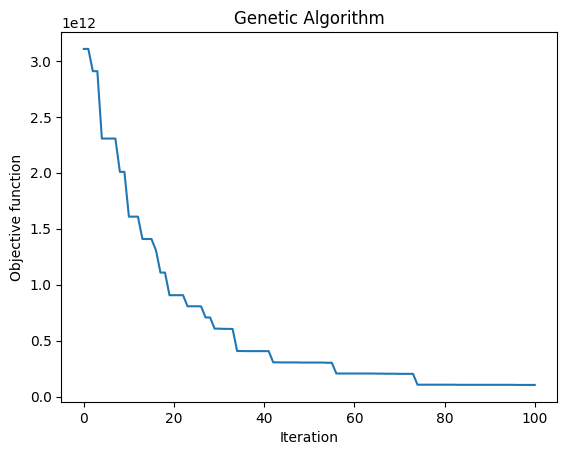

 The best solution found:                                                                           
 [ 573. 1123.  940.  756.  645.  992. 1208.  627.  523.  888.  997.  873.
  726.  987.  916.  484. 1064.  845. 1047.  575.  521.]

 Objective function:
 105000038009.26389


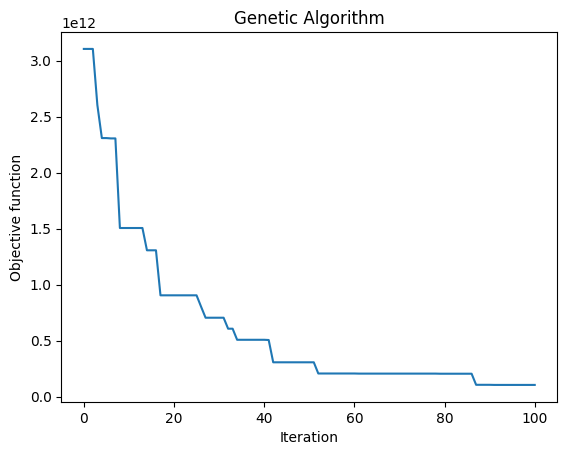

 The best solution found:                                                                           
 [ 736.  776.  515.  917.  850.  667.  862. 1015. 1035.  721.  823.  755.
  816.  692. 1008.  667.  544.  917.  774.  609.  504.]

 Objective function:
 5000038220.180555


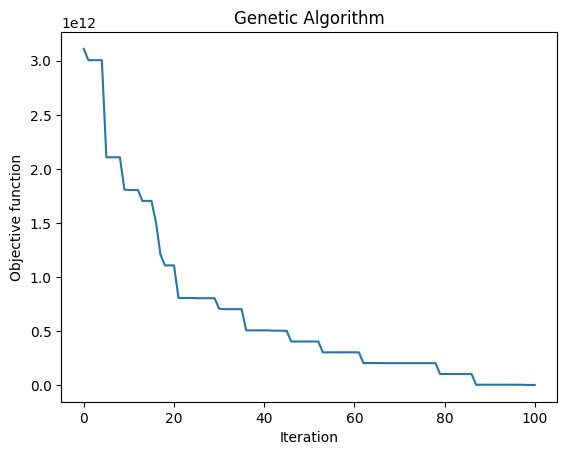

 The best solution found:                                                                           
 [ 851.  847.  681.  665. 1016. 1061. 1141.  921.  768.  541.  491.  645.
  487.  937. 1007. 1064.  583.  847.  980.  792.  502.]

 Objective function:
 2000037994.4166667


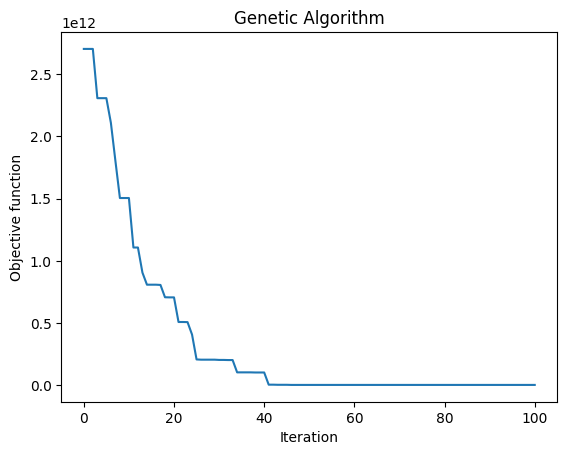

 The best solution found:                                                                           
 [ 646.  952.  954. 1071.  648. 1035. 1133.  689.  486.  811.  482.  939.
  531.  798.  932.  985.  558.  729. 1044.  861.  499.]

 Objective function:
 103000038023.59723


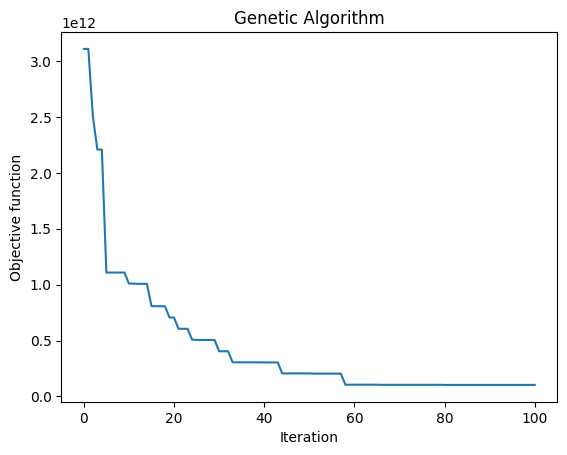

 The best solution found:                                                                           
 [ 532.  885.  548.  582.  868.  866. 1121.  930. 1040.  833.  528.  557.
  876. 1012.  754.  860.  819.  710.  625.  817.  508.]

 Objective function:
 4000038096.8472223


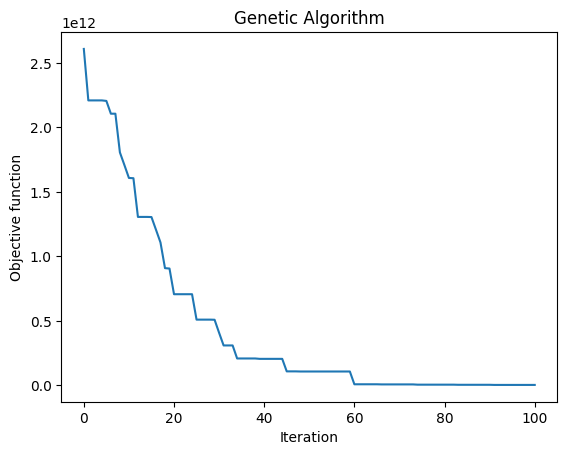

 The best solution found:                                                                           
 [ 542.  692.  645.  971.  503. 1057.  812.  862. 1064.  880.  536.  681.
  568.  873.  956. 1039. 1149.  609. 1013. 1096.  576.]

 Objective function:
 101000038111.65277


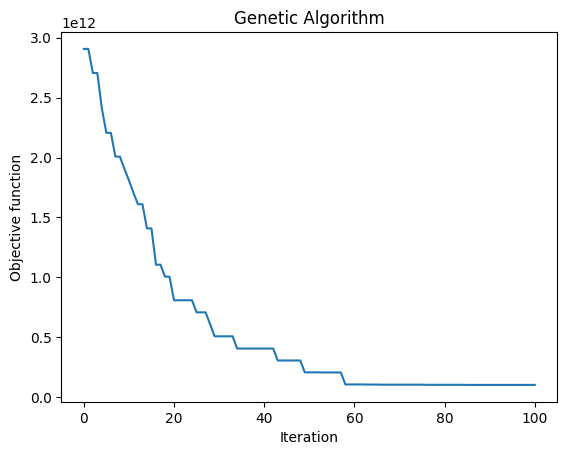

 The best solution found:                                                                           
 [ 601. 1046.  597.  947.  822.  823.  587.  515. 1066.  791.  505.  783.
  495.  651.  977.  916.  733.  905.  914.  732.  483.]

 Objective function:
 4000038117.0416665


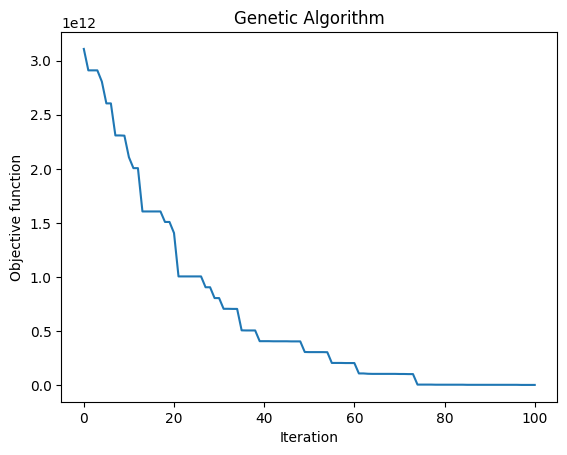

 The best solution found:                                                                           
 [ 760.  597.  603.  852.  924.  571. 1076.  967.  814.  689.  560.  579.
  736.  772. 1177.  920. 1024.  852.  864.  913. 1136.]

 Objective function:
 305000038220.18054


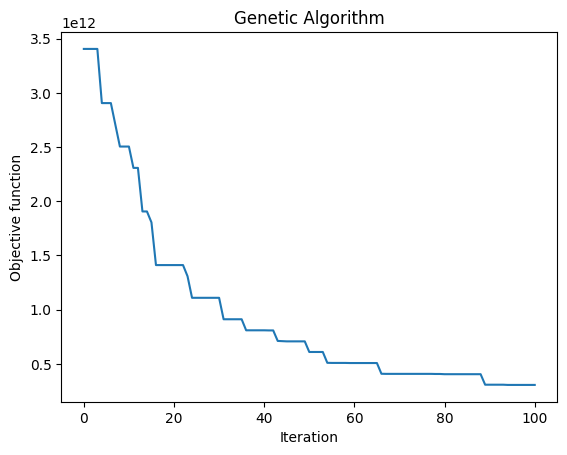

 The best solution found:                                                                           
 [ 482. 1029.  637.  882.  787. 1058.  640.  761.  865.  948.  496. 1004.
  834.  696.  559. 1063. 1143.  848.  988.  944.  579.]

 Objective function:
 3000038055.0


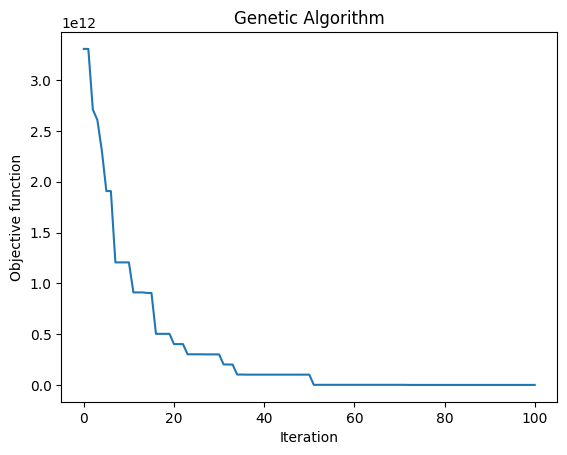

 The best solution found:                                                                           
 [ 571.  896.  490.  993.  703.  784. 1147.  693. 1057.  791.  513.  882.
  981.  764.  895. 1058.  570.  832.  845.  569.  630.]

 Objective function:
 3000038017.236111


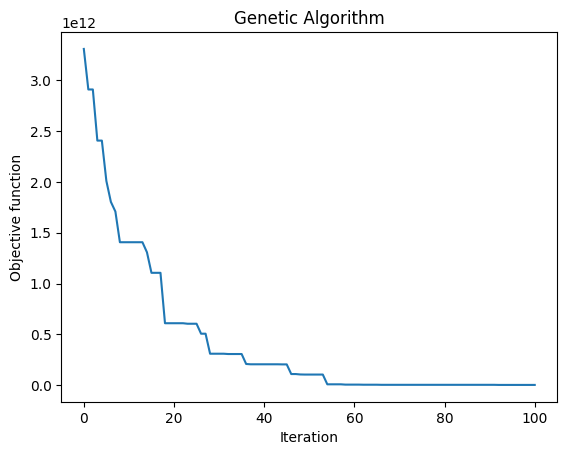

 The best solution found:                                                                           
 [ 879.  649.  608.  810. 1192.  514. 1139.  967. 1031.  544.  506.  624.
  492.  903.  883. 1054.  543.  987. 1029.  739.  488.]

 Objective function:
 103000038004.55556


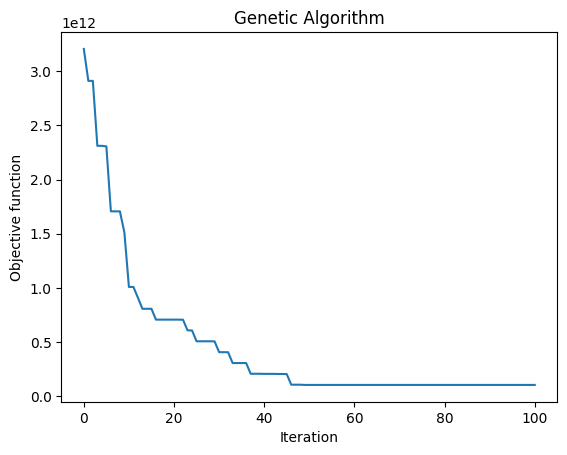

 The best solution found:                                                                           
 [ 765.  673.  743.  802.  547. 1042. 1062.  570.  846. 1012.  504.  654.
  566.  999.  496. 1061. 1150.  858. 1043.  939.  769.]

 Objective function:
 4000038014.7222223


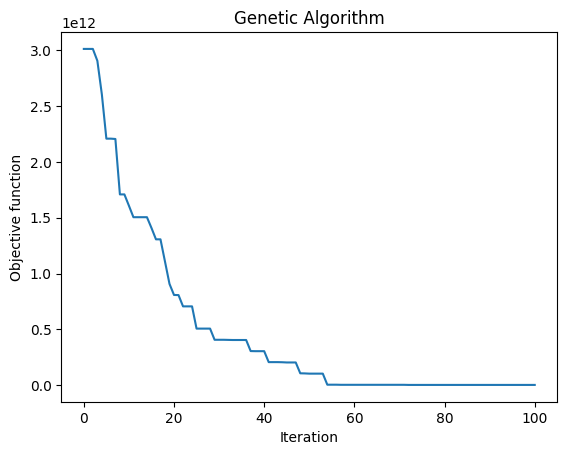

 The best solution found:                                                                           
 [ 809.  549.  538.  915.  629. 1036.  755.  643.  871. 1037.  504.  894.
  795. 1117.  973. 1045.  829.  903.  724.  490.  715.]

 Objective function:
 203000038026.2361


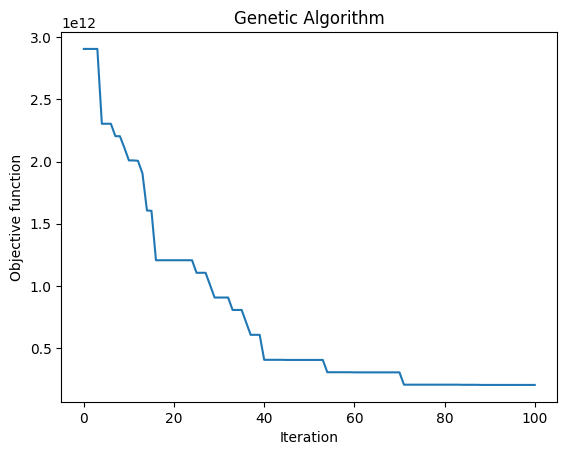

 The best solution found:                                                                           
 [ 554. 1084.  654.  706.  559. 1017.  822.  888.  785.  995.  646. 1066.
  505.  818.  820.  940.  659.  572.  924.  987.  625.]

 Objective function:
 104000038153.66667


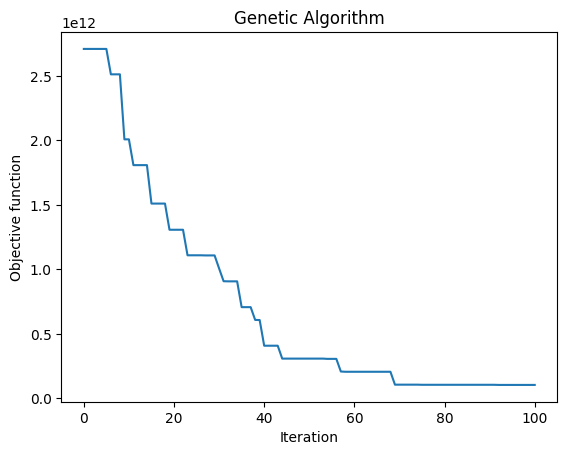

 The best solution found:                                                                           
 [ 526.  496.  565.  607.  818. 1056.  915.  906.  906. 1043.  495.  587.
  482.  712.  893. 1041. 1153.  960. 1011. 1028.  786.]

 Objective function:
 100000037990.41667


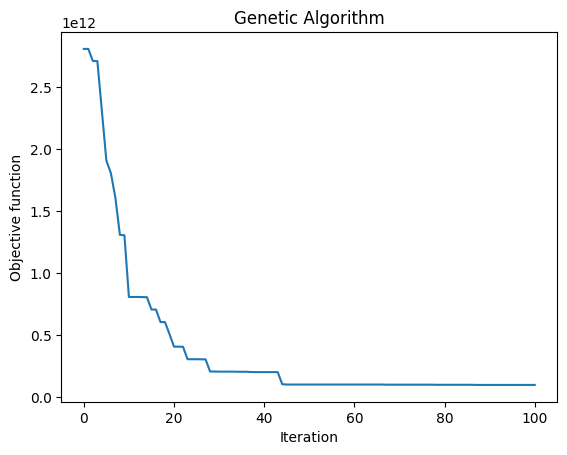

 The best solution found:                                                                           
 [ 793.  586.  482.  833.  663. 1045. 1077.  485.  848.  920.  482.  800.
  601.  915.  724. 1051. 1140.  849. 1048. 1010.  544.]

 Objective function:
 2000037982.5138888


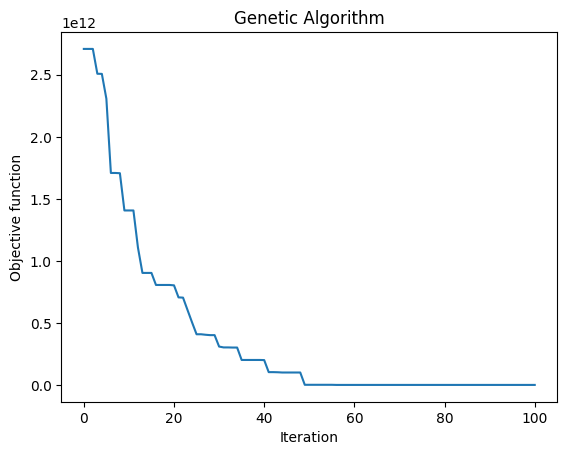

 The best solution found:                                                                           
 [ 499.  624.  892. 1114.  740.  929. 1040.  735.  481.  820.  494.  986.
  701.  802.  849. 1053.  571.  927. 1023.  912.  702.]

 Objective function:
 103000038054.36111


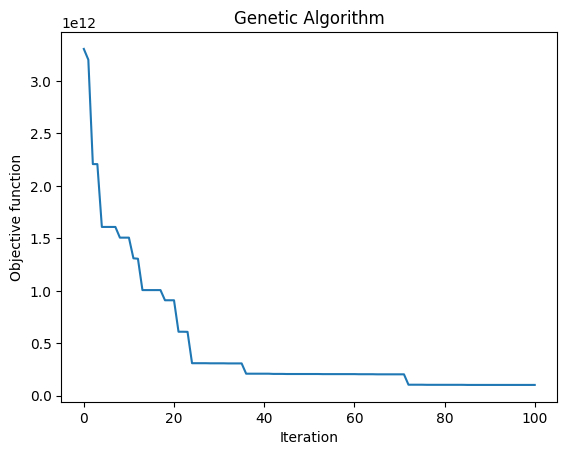

 The best solution found:                                                                           
 [ 536. 1050.  482.  918.  772. 1046.  650.  838.  909.  726.  482.  914.
  939.  648.  493. 1057. 1152.  938. 1024.  568.  804.]

 Objective function:
 5000037997.138889


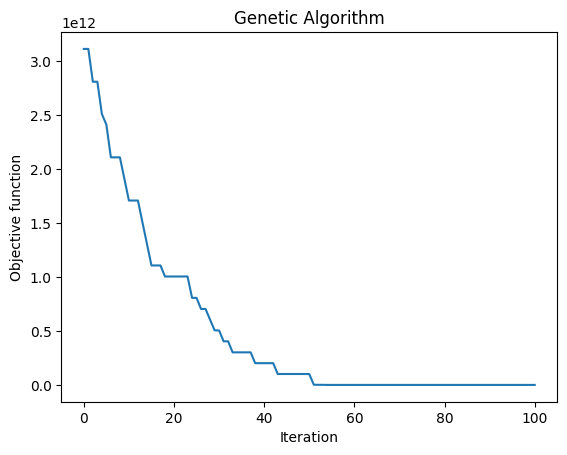

 The best solution found:                                                                           
 [ 846.  872.  500.  957.  779.  912.  656.  562.  661.  713.  491.  844.
  653.  648.  873. 1046.  710.  792. 1047. 1021.  579.]

 Objective function:
 3000038105.1944447


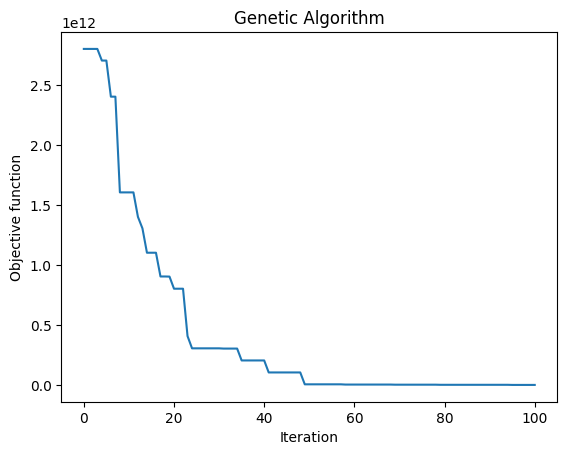

 The best solution found:                                                                           
 [ 716.  653.  591.  481.  794.  867.  555.  783. 1066. 1011.  563.  953.
  881.  877. 1163.  840. 1100.  731.  494. 1099.  611.]

 Objective function:
 303000038091.3889


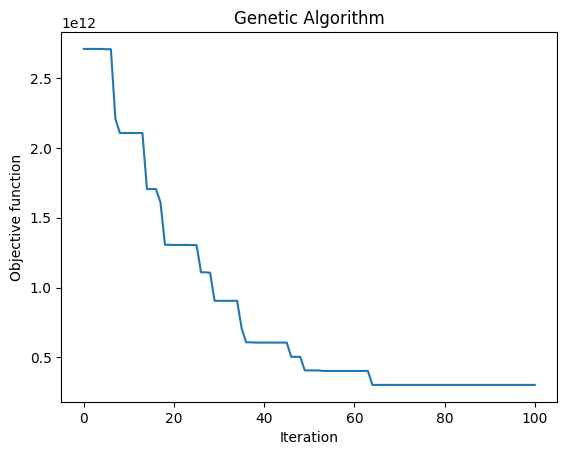

 The best solution found:                                                                           
 [ 496.  997.  607.  572.  743. 1064.  679.  811.  917.  963.  483.  545.
  509.  672.  880. 1053. 1152.  877. 1029.  945.  481.]

 Objective function:
 1000037587.8611112


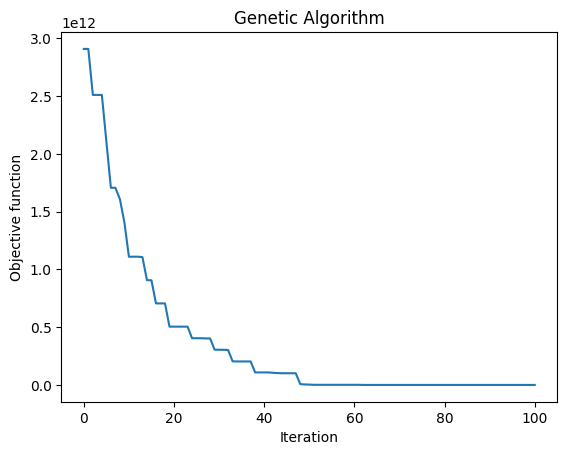

 The best solution found:                                                                           
 [ 619.  586.  529.  681.  981. 1009. 1091.  900.  881.  837.  495.  966.
  609.  750.  826. 1019. 1148.  888.  935. 1144.  492.]

 Objective function:
 102000037662.30556


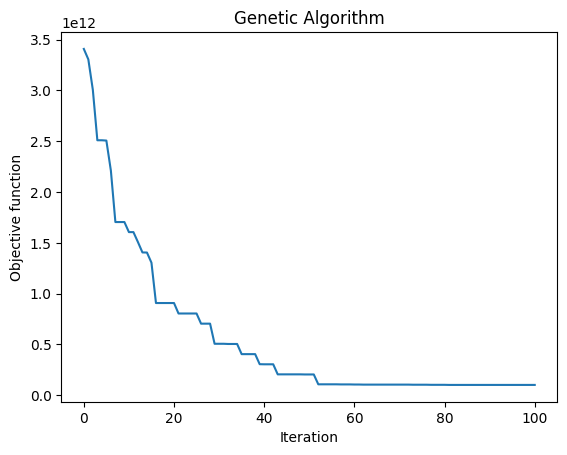

 The best solution found:                                                                           
 [ 842.  864.  717. 1013.  802.  984.  483.  882.  542.  560.  743.  987.
  492.  559.  800. 1011. 1105.  949. 1024.  702.  668.]

 Objective function:
 102000038050.08333


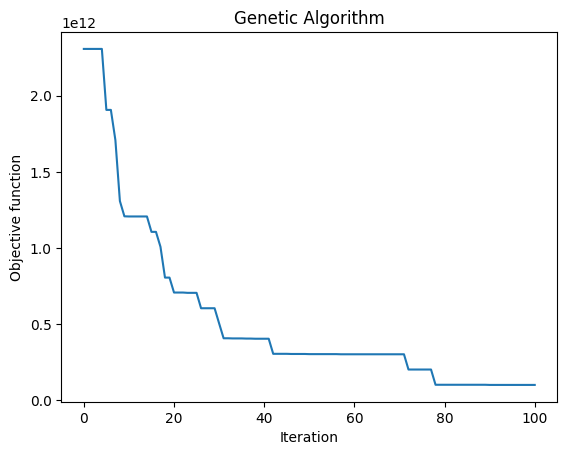

 The best solution found:                                                                           
 [ 731.  854.  482.  563.  852. 1018.  937.  789. 1011.  674.  556. 1015.
  565.  716.  932. 1062. 1151.  920. 1032.  660.  516.]

 Objective function:
 4000038047.875


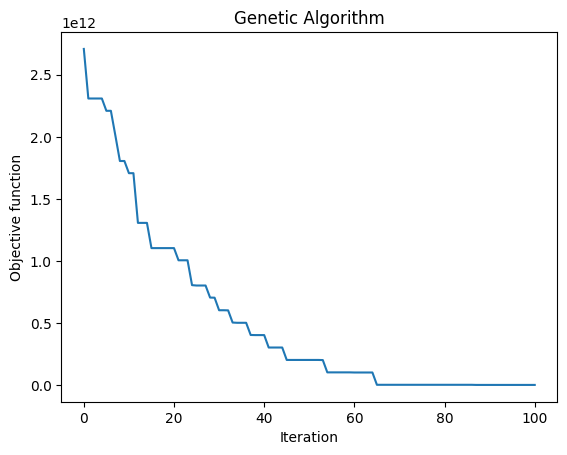

 The best solution found:                                                                           
 [ 503.  977.  520.  575.  653.  686. 1144.  941.  825.  860. 1005.  969.
  798. 1135.  666. 1055.  744.  797. 1048.  911.  508.]

 Objective function:
 103000038089.30556


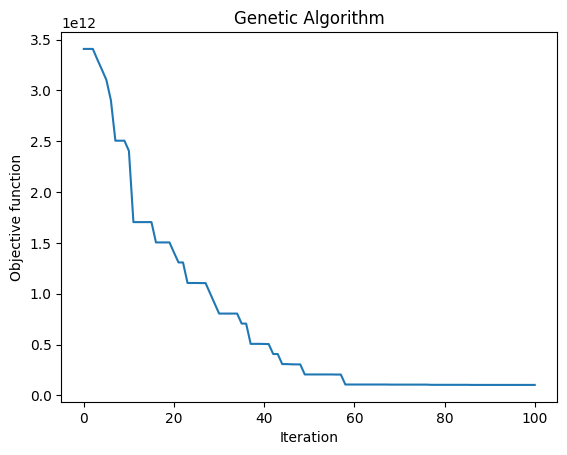

 The best solution found:                                                                           
 [ 870.  922.  820.  798.  914. 1010. 1189.  489.  988.  674. 1019.  778.
  940. 1118.  715.  548.  663. 1005.  486.  597.  549.]

 Objective function:
 206000038011.4861


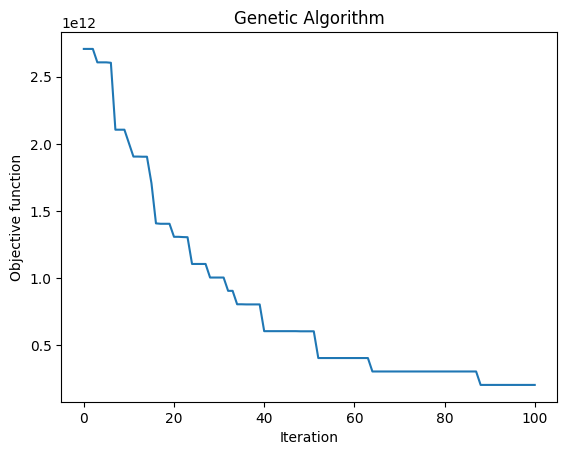

 The best solution found:                                                                           
 [ 488. 1117.  486.  804. 1000. 1064.  661.  942. 1065.  739.  484.  796.
  917.  910. 1004. 1046. 1069.  842.  845.  550.  488.]

 Objective function:
 2000037973.7083333


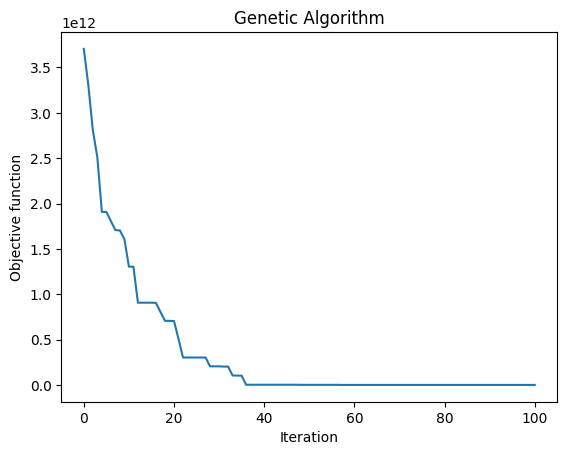

 The best solution found:                                                                           
 [ 504.  889.  521. 1083. 1011. 1052.  553.  684.  784.  746.  490.  679.
  933.  605. 1017. 1043. 1146.  956.  843.  810.  482.]

 Objective function:
 101000038022.73611


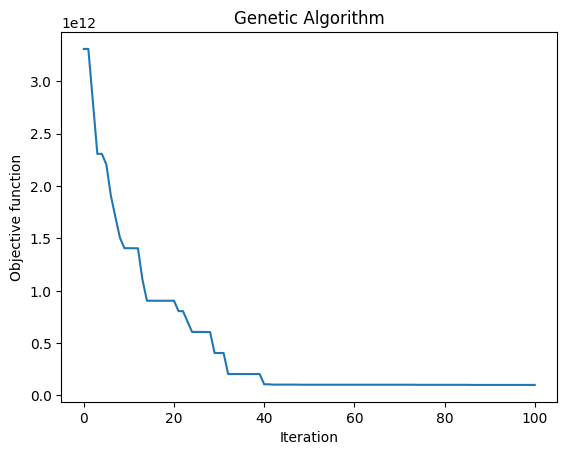

 The best solution found:                                                                           
 [ 494. 1056.  481.  489.  760.  871.  564.  945.  856.  887.  490. 1028.
  566.  865.  966. 1050. 1153.  779. 1030.  700.  630.]

 Objective function:
 103000037979.97223


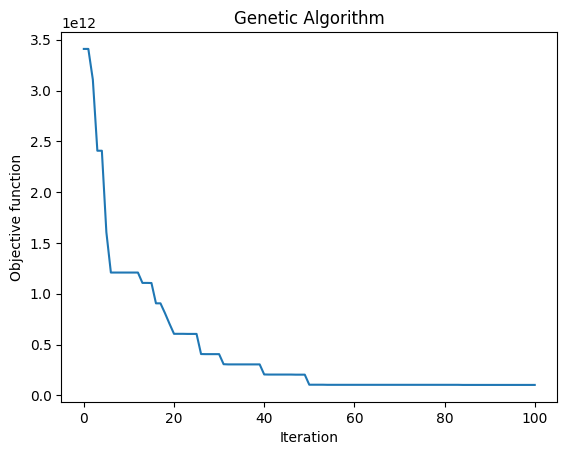

 The best solution found:                                                                           
 [ 665. 1104.  609.  770.  698.  987.  604.  903.  907.  859.  601.  658.
  530.  524.  914. 1023.  852.  842.  960. 1021.  492.]

 Objective function:
 102000037670.81944


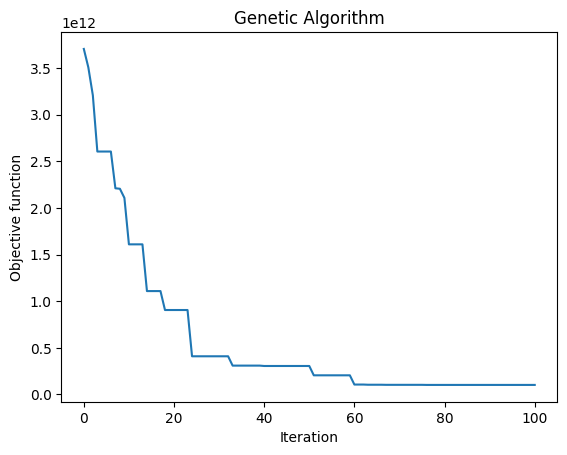

 The best solution found:                                                                           
 [ 797.  923.  651.  718. 1019. 1040.  851.  845. 1008.  579.  854. 1085.
  552.  560.  955. 1047.  792.  495.  960.  636.  890.]

 Objective function:
 6000038090.791667


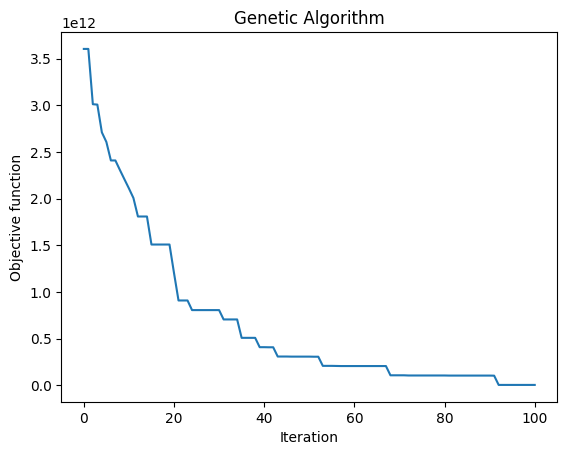

 The best solution found:                                                                           
 [ 810.  727.  788.  905.  943.  612.  596. 1014.  489.  654.  962.  704.
  931.  590. 1013.  894. 1186.  811. 1029.  825.  552.]

 Objective function:
 204000038089.75


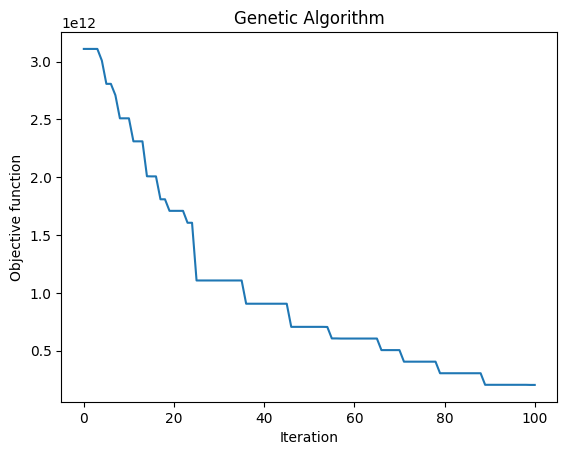

 The best solution found:                                                                           
 [ 484. 1122.  784.  567.  483.  856.  745.  886.  964.  961.  491.  561.
  482.  799.  868. 1064.  960.  946. 1048. 1014.  708.]

 Objective function:
 2000037566.1111112


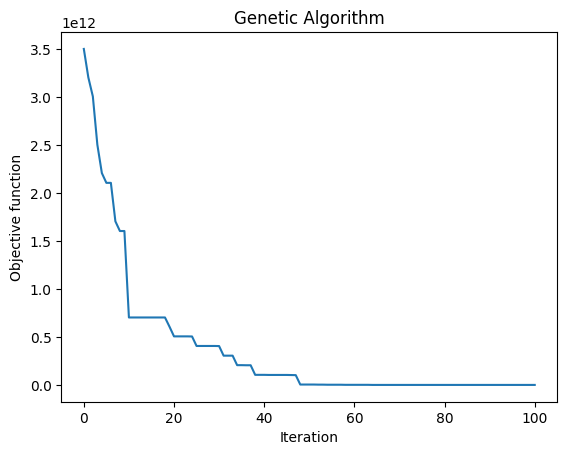

 The best solution found:                                                                           
 [ 493. 1115.  693.  598.  500. 1062.  868.  891.  868.  970.  493.  577.
  492.  967.  954. 1050.  702.  863. 1024.  755.  822.]

 Objective function:
 3000038007.5277777


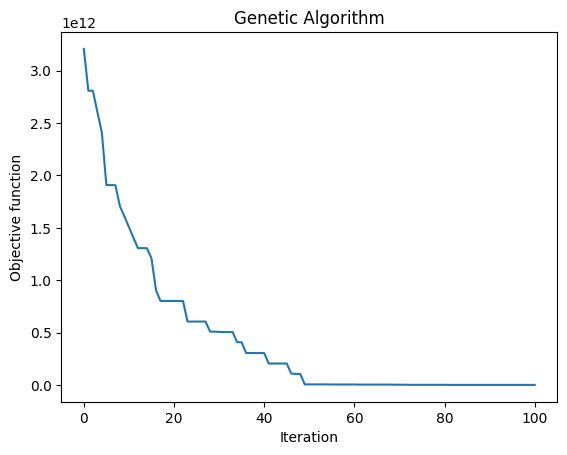

 The best solution found:                                                                           
 [1012. 1074.  568.  845.  651. 1060.  738.  572.  842.  925.  493. 1072.
  645.  915.  945. 1041.  799.  655.  831. 1011.  573.]

 Objective function:
 3000038136.7083335


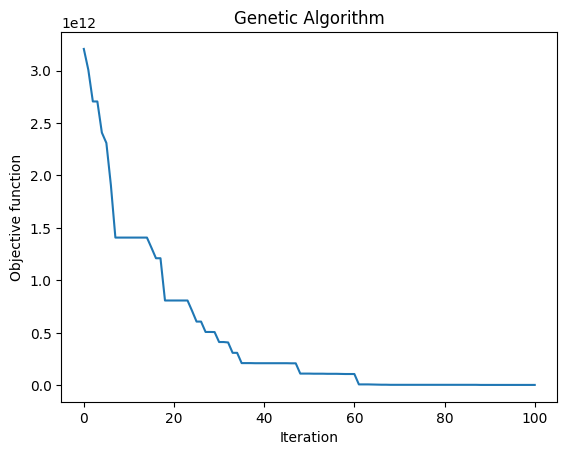

 The best solution found:                                                                           
 [ 820.  979.  506.  501.  933. 1058. 1067.  655.  664.  589.  507. 1065.
  713.  567.  837.  856.  742.  845. 1015.  909.  807.]

 Objective function:
 104000038086.25


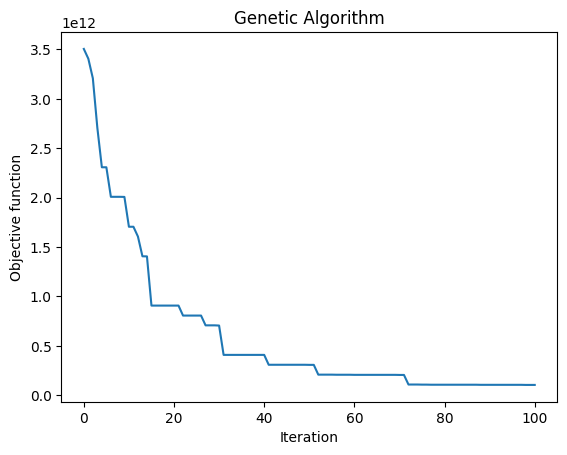

 The best solution found:                                                                           
 [ 817.  770.  496.  902. 1187. 1006.  686.  683.  727.  574.  570.  645.
  591.  556.  912. 1060. 1075.  484. 1020.  985.  856.]

 Objective function:
 104000038053.68056


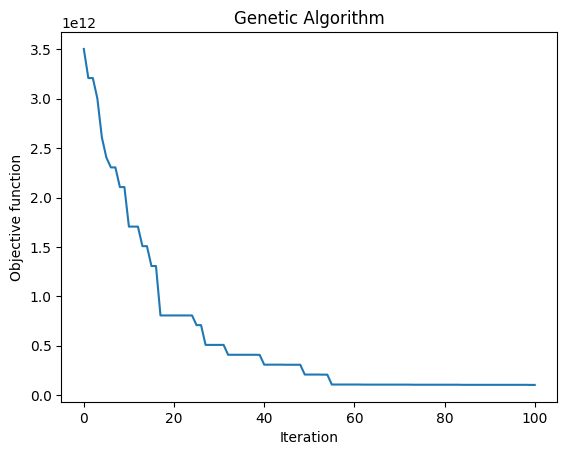

 The best solution found:                                                                           
 [ 587. 1120.  931.  722.  797.  883. 1199.  948.  918.  557.  603.  483.
  492.  601.  856.  546.  665. 1004. 1038. 1068.  891.]

 Objective function:
 306000037635.7222


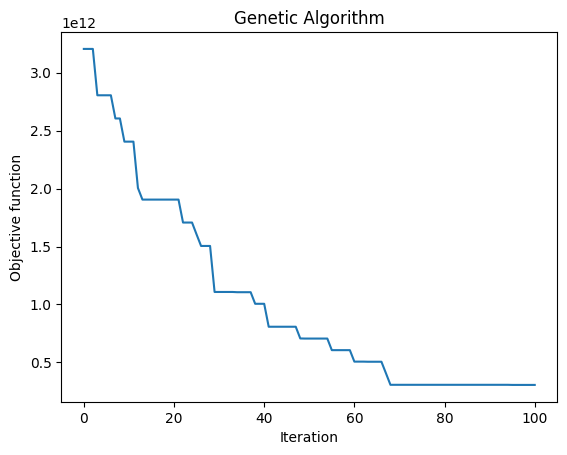

 The best solution found:                                                                           
 [ 499. 1082.  711.  682.  500. 1024.  751.  998.  861.  965.  498. 1072.
  499.  813.  936.  927.  614. 1001. 1025.  875.  582.]

 Objective function:
 3000037622.861111


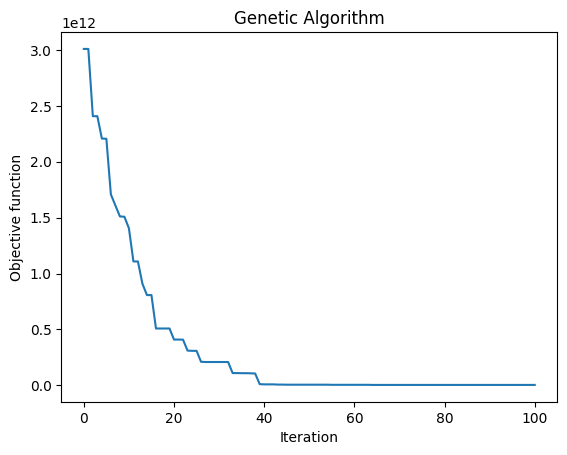

 The best solution found:                                                                           
 [ 509. 1097.  543.  727.  943. 1024.  546.  879.  859.  679.  493. 1086.
  642.  793.  928. 1048.  672.  664. 1048. 1012.  502.]

 Objective function:
 2000037589.2361112


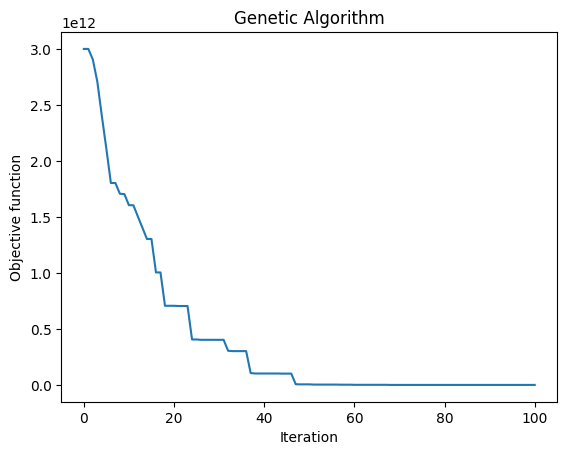

 The best solution found:                                                                           
 [1033.  921.  481. 1113.  698.  537.  863.  885. 1048. 1013.  483.  660.
  700.  797.  994.  950.  605. 1008.  849.  484.  535.]

 Objective function:
 202000037973.56946


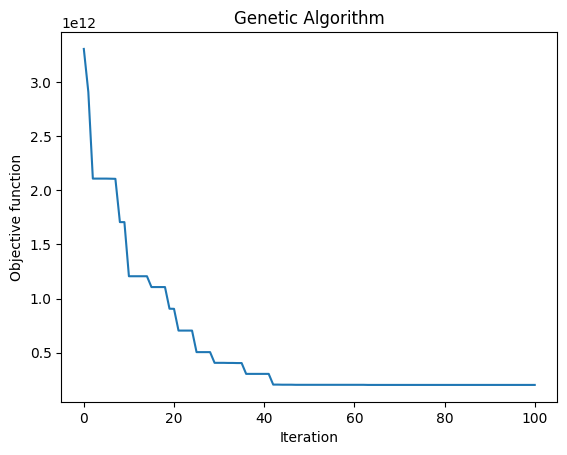

 The best solution found:                                                                           
 [ 540. 1107.  497.  781.  995.  972.  943.  999.  708.  629.  846. 1088.
  994.  623.  549.  981.  859.  492.  943.  730.  923.]

 Objective function:
 5000038031.541667


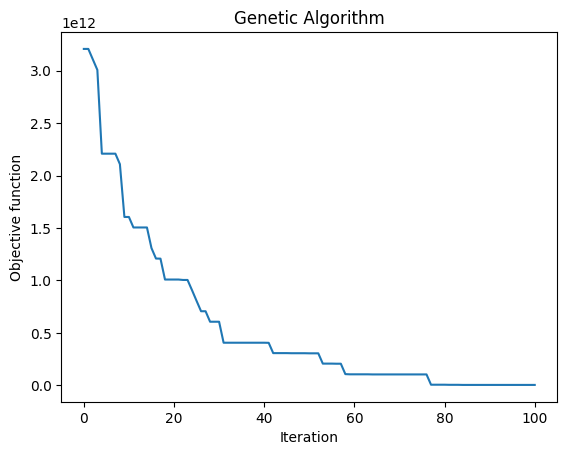

 The best solution found:                                                                           
 [ 502.  592.  585.  668.  747.  863.  924.  885.  946.  983.  514.  914.
  505. 1129.  985.  963.  842.  794.  938. 1074.  758.]

 Objective function:
 201000038101.81946


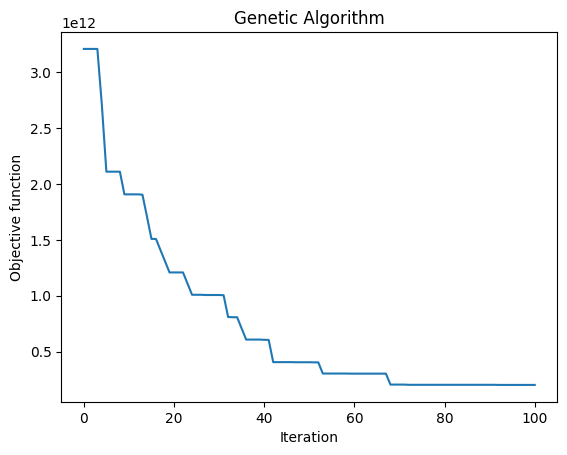

 The best solution found:                                                                           
 [ 587.  962.  531.  804.  686.  660. 1039.  573.  997.  931.  487. 1111.
  762.  667.  893.  793.  757.  569.  896.  487.  631.]

 Objective function:
 406000038098.3472


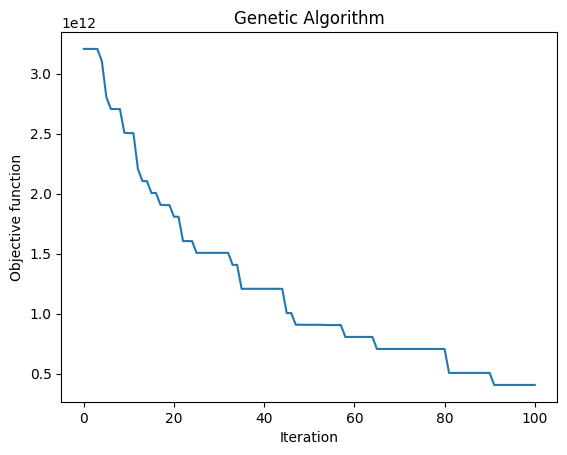

 The best solution found:                                                                           
 [ 846. 1178.  616. 1091.  545. 1057.  666.  972. 1010.  806.  507.  624.
  525.  795.  971.  929.  744.  732.  735.  910.  861.]

 Objective function:
 204000037699.25


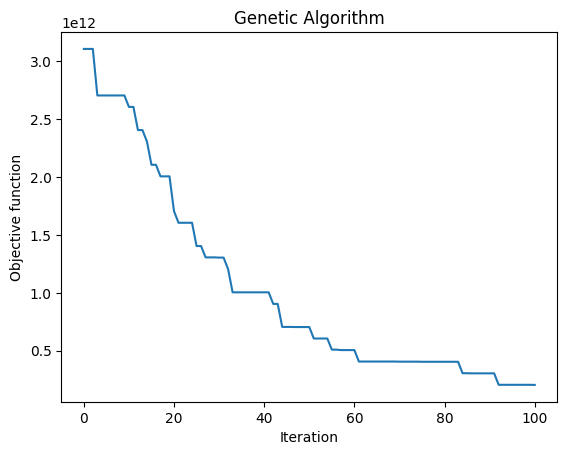

 The best solution found:                                                                           
 [ 797.  509.  795. 1018.  608.  924. 1112.  607.  571.  987.  510.  603.
  509.  734.  751.  865.  831.  930.  745.  911.  853.]

 Objective function:
 206000038112.1111


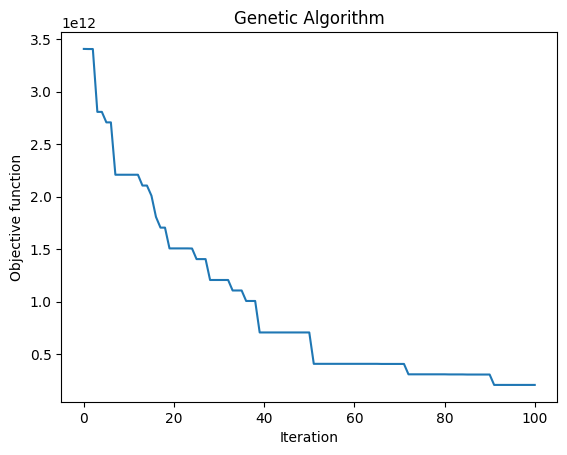

 The best solution found:                                                                           
 [ 592.  481.  966.  670. 1197.  846. 1056.  822.  748.  932.  557.  903.
  642.  745.  930.  960. 1009.  833.  525.  577.  634.]

 Objective function:
 205000038104.2361


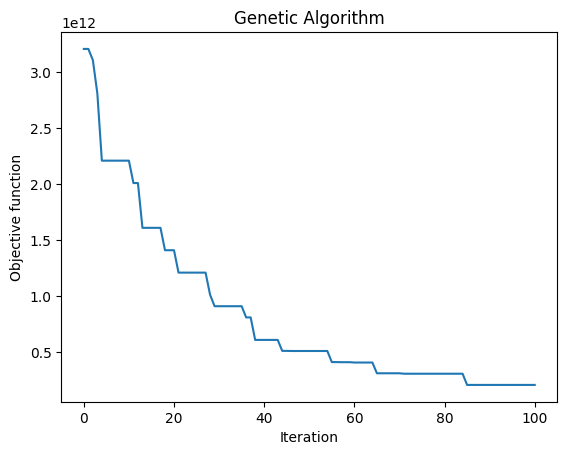

 The best solution found:                                                                           
 [1017.  491.  846.  637.  970.  575.  573.  714.  774.  936.  715.  927.
  694.  767.  917. 1030. 1106.  571.  511.  850.  794.]

 Objective function:
 207000038087.4861


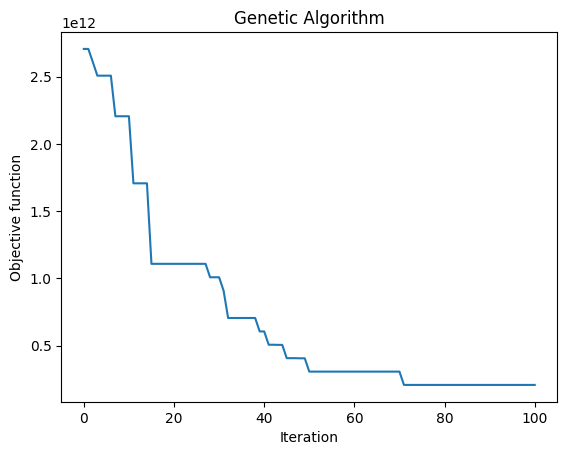

 The best solution found:                                                                           
 [ 520. 1145.  746. 1000.  650.  734.  771.  570.  495.  964.  847.  735.
  576.  937.  770.  999.  869.  607. 1006.  866.  539.]

 Objective function:
 202000038093.44446


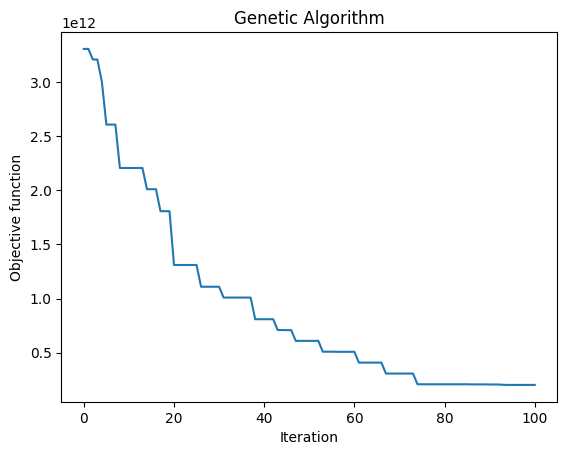

 The best solution found:                                                                           
 [ 507.  829.  809.  662.  542.  982. 1079.  890.  939. 1009.  491.  655.
  632.  913.  487. 1053. 1150.  550.  963.  990.  855.]

 Objective function:
 5000038035.444445


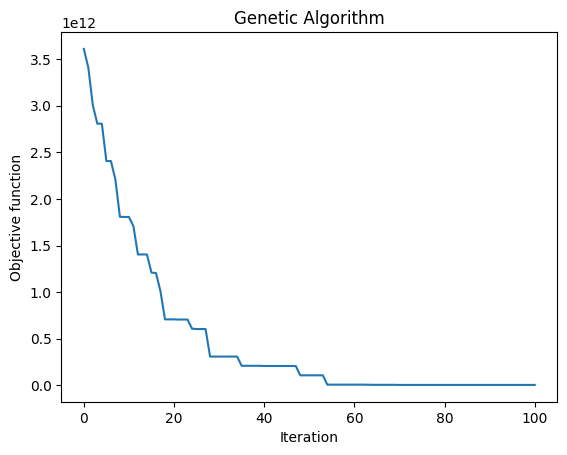

 The best solution found:                                                                           
 [ 875. 1029.  892.  605.  541. 1056.  756.  533.  486.  837.  624. 1008.
  533.  872.  869. 1060. 1144.  690. 1009.  937.  489.]

 Objective function:
 4000038033.736111


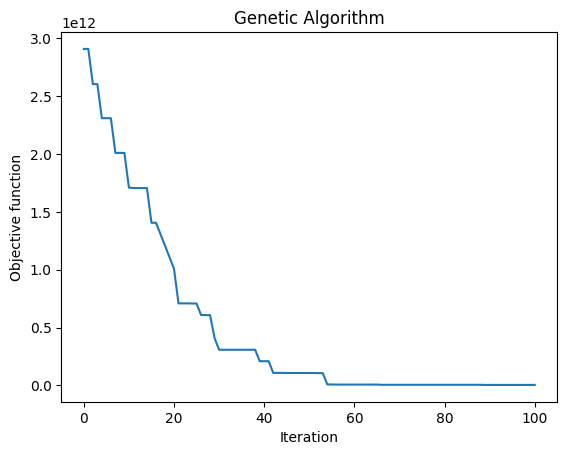

 The best solution found:                                                                           
 [ 659.  582.  620.  891.  902. 1035. 1100.  959.  869.  774.  539.  562.
  488.  818.  747.  923. 1049.  984. 1040.  694.  860.]

 Objective function:
 3000038085.638889


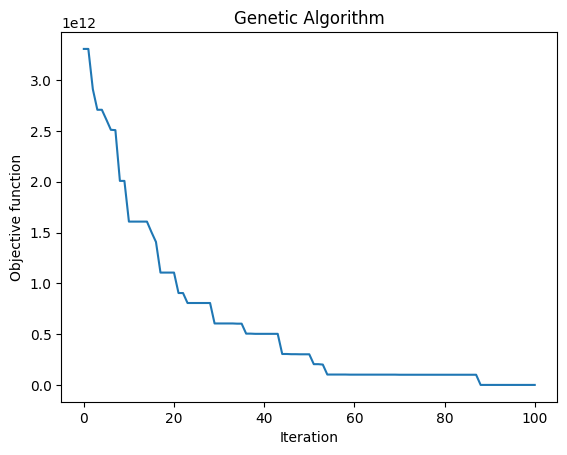

 The best solution found:                                                                           
 [ 641. 1028.  524.  574.  807.  754.  681.  675.  954.  871.  535.  552.
  774.  912.  484.  856.  750.  738. 1020. 1132.  992.]

 Objective function:
 105000037714.25


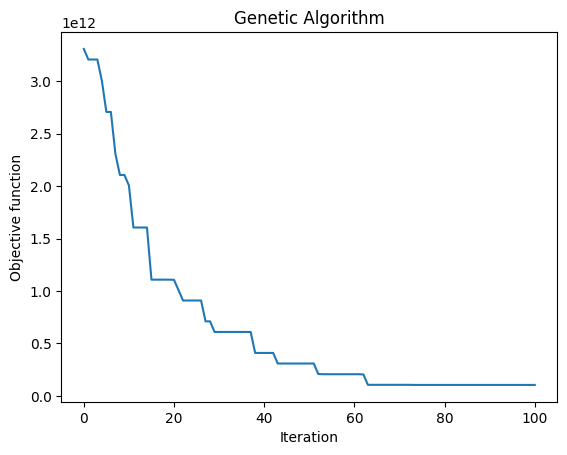

 The best solution found:                                                                           
 [ 864. 1086.  717.  550. 1169.  994.  837.  775. 1037.  945.  837.  508.
  553.  660.  871.  532.  977.  725.  979. 1025.  891.]

 Objective function:
 206000038093.22223


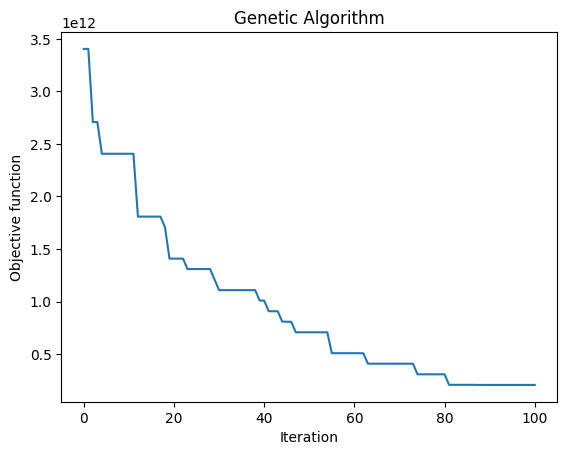

 The best solution found:                                                                           
 [ 488. 1035.  853.  705.  490. 1057.  900.  942.  957.  987.  493. 1030.
  608.  895.  802. 1063.  639.  800. 1032.  552.  766.]

 Objective function:
 4000038039.861111


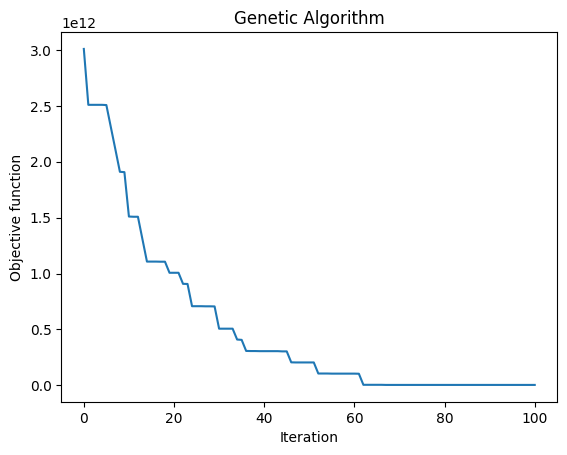

 The best solution found:                                                                           
 [ 551. 1175.  489.  903.  674. 1024. 1097.  619.  624.  572.  704.  877.
  578.  543.  958. 1018.  749.  881.  922.  823.  488.]

 Objective function:
 103000038037.38889


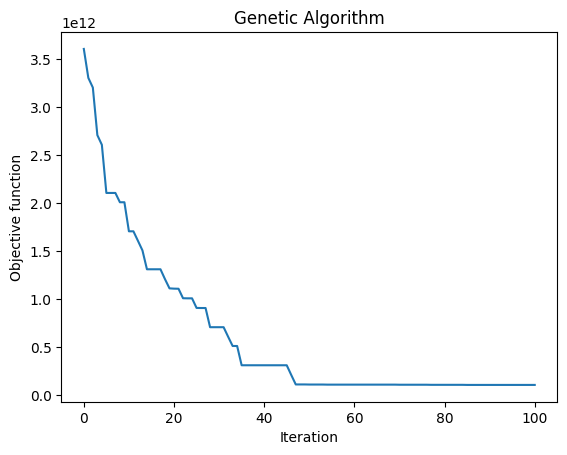

 The best solution found:                                                                           
 [ 501.  797.  522.  952.  719.  914. 1115.  731. 1051.  679.  613. 1093.
  697.  549.  936. 1045.  891.  878.  921.  612.  497.]

 Objective function:
 3000038027.1944447


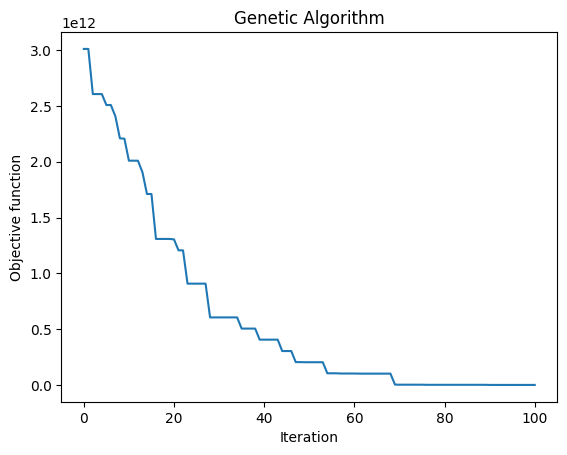

 The best solution found:                                                                           
 [ 746.  767.  733. 1062.  543. 1027.  678.  841.  511.  845.  568. 1044.
  889.  879.  488.  709.  964.  960. 1041.  617.  902.]

 Objective function:
 106000038074.63889


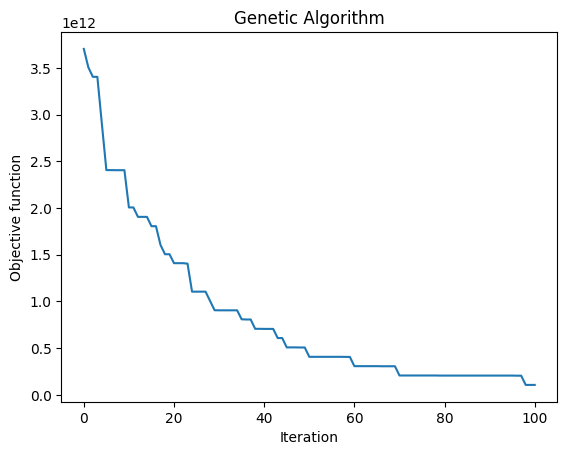

 The best solution found:                                                                           
 [ 949. 1144.  773.  674.  482.  803.  593.  768.  536.  977.  522.  549.
  531.  905.  922.  691. 1013.  742.  884.  821. 1086.]

 Objective function:
 308000038102.44446


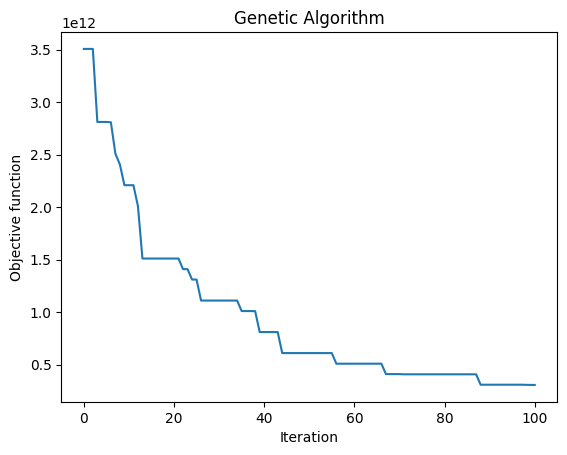

 The best solution found:                                                                           
 [ 763. 1033.  733.  588.  672.  848.  952.  953.  486.  835.  520.  554.
  544.  950.  726.  932. 1137.  843. 1049.  887.  484.]

 Objective function:
 3000038058.638889


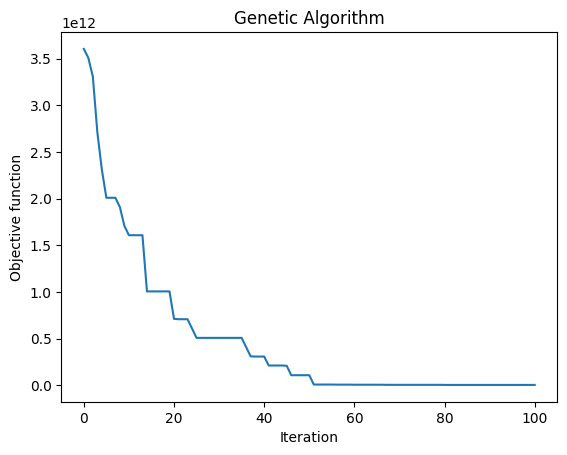

 The best solution found:                                                                           
 [ 488. 1053.  565.  972.  661.  845.  558.  689.  744.  930.  504.  857.
  489.  551.  726. 1037.  615.  887. 1049.  799.  505.]

 Objective function:
 2000038042.0


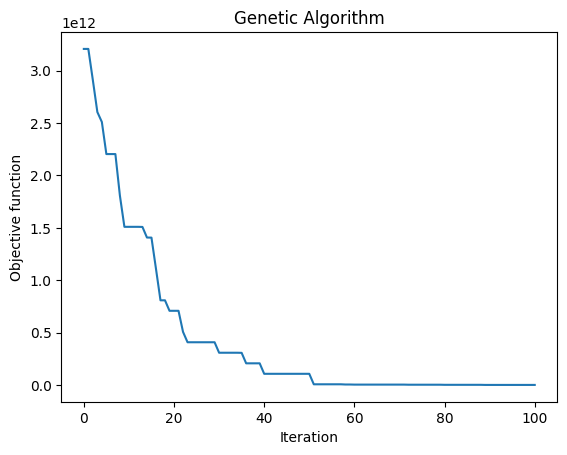

 The best solution found:                                                                           
 [ 498.  742.  835. 1035.  677. 1050. 1144.  481.  930.  627.  987. 1033.
  481.  546.  820. 1059.  890.  909. 1026.  957.  673.]

 Objective function:
 104000038014.16667


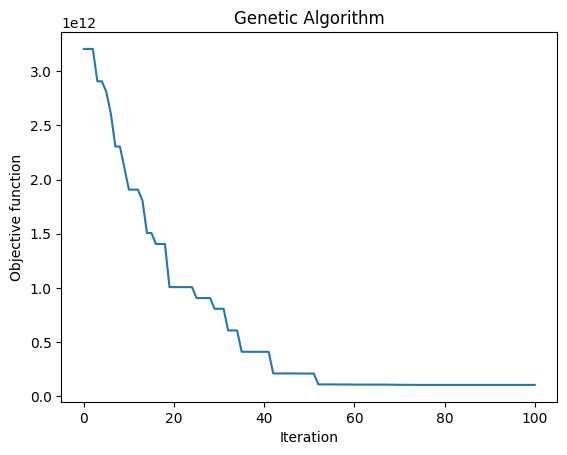

 The best solution found:                                                                           
 [ 965. 1069.  732.  846.  523.  997.  685.  877.  819. 1018.  521.  674.
  513.  923.  997. 1011.  782. 1007.  927. 1209.  626.]

 Objective function:
 303000038099.0139


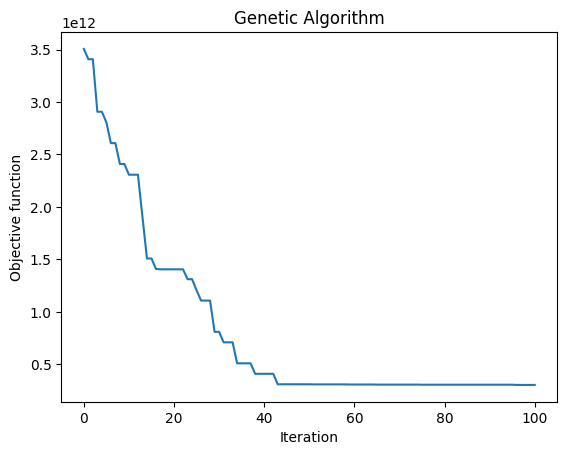

 The best solution found:                                                                           
 [ 570. 1055.  616.  712.  541. 1052.  978.  608.  724.  802. 1021. 1132.
  503.  843.  853.  499.  930.  570.  861.  791.  638.]

 Objective function:
 107000038088.94444


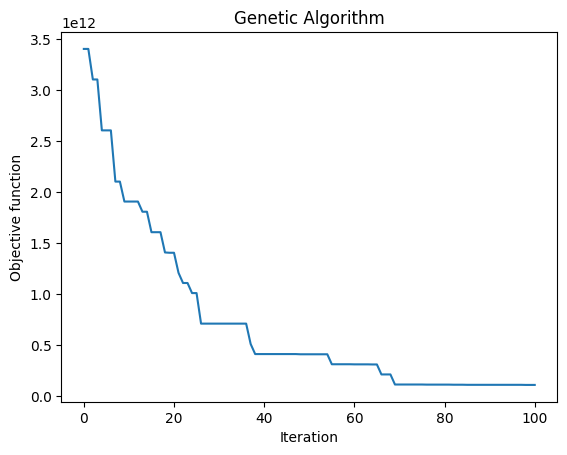

 The best solution found:                                                                           
 [ 482.  808.  601.  922.  501. 1007.  611.  607.  933. 1011.  488.  803.
  991. 1009.  851.  992. 1133.  739.  803.  671.  571.]

 Objective function:
 2000038047.3472223


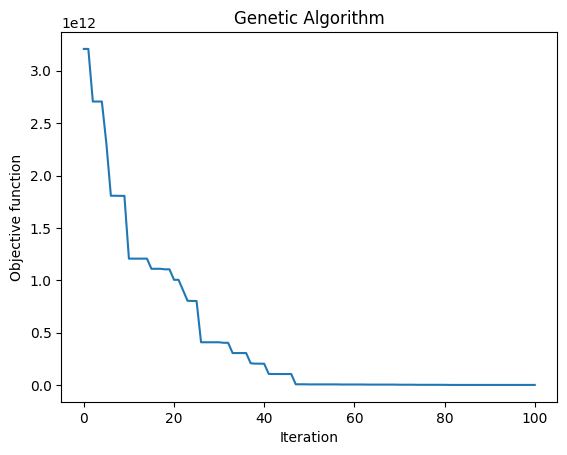

 The best solution found:                                                                           
 [ 538.  942.  838.  726.  995.  861. 1080.  889.  512.  543.  485.  914.
  726. 1073.  537.  984. 1152.  840.  956.  674.  481.]

 Objective function:
 104000038053.08333


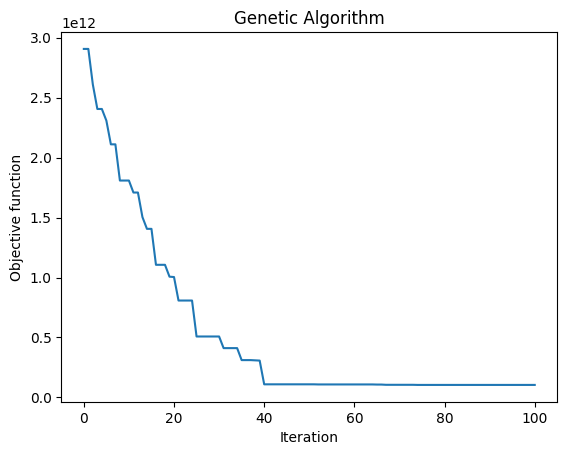

 The best solution found:                                                                           
 [ 487. 1120.  539.  890.  729.  793.  593.  720.  813.  984.  603.  713.
  701. 1048.  888. 1052.  659.  951. 1023.  834.  482.]

 Objective function:
 101000038081.05556


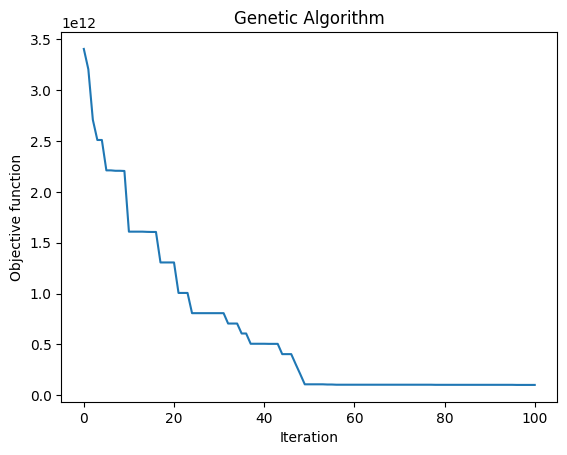

 The best solution found:                                                                           
 [ 888.  568.  657.  938.  870.  583.  805.  877.  609.  737.  520.  549.
  506. 1016.  955.  767. 1085.  798. 1005.  656.  495.]

 Objective function:
 5000038106.361111


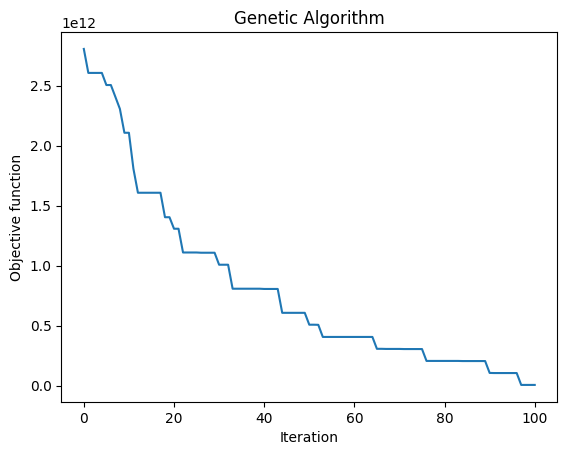

 The best solution found:                                                                           
 [ 948.  898.  552.  771.  904.  660. 1033. 1117. 1069.  632.  834.  883.
  796.  610. 1031. 1016.  515.  508.  511.  714.  995.]

 Objective function:
 308000038117.0417


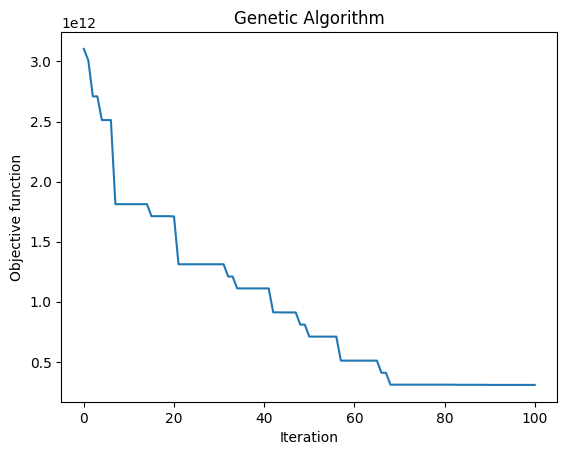

 The best solution found:                                                                           
 [ 612.  652.  650.  955.  521. 1061.  750.  544.  820.  837.  509.  624.
  484. 1074. 1006. 1055. 1137.  823. 1046.  895.  845.]

 Objective function:
 103000038023.22223


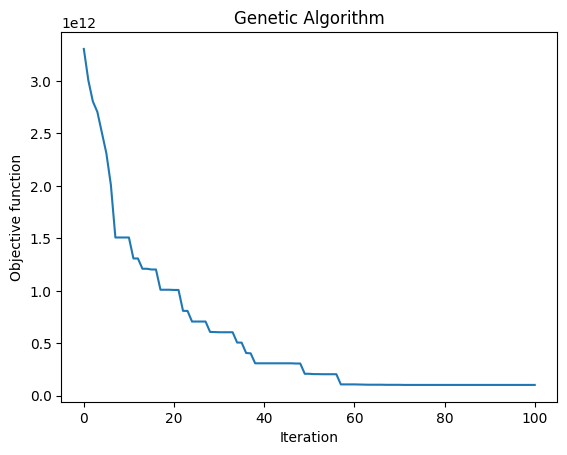

 The best solution found:                                                                           
 [ 650.  988.  489.  634.  958. 1002.  730.  572.  847.  806.  565.  966.
  951.  722.  557. 1044. 1139.  494. 1048.  873.  898.]

 Objective function:
 5000038014.236111


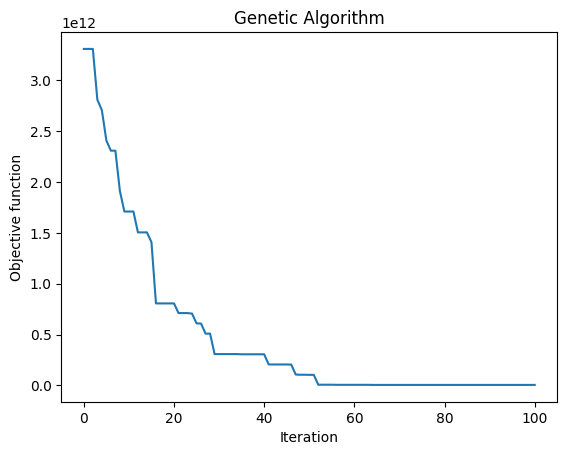

 The best solution found:                                                                           
 [ 789. 1123.  909.  782.  842. 1018. 1027.  933.  482.  647.  517.  997.
  513.  645.  884.  933.  586.  950. 1019.  707.  503.]

 Objective function:
 4000038048.5277777


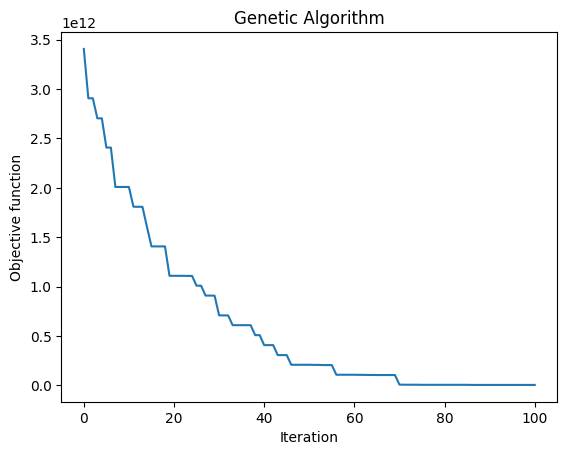

 The best solution found:                                                                           
 [ 764.  554.  918.  856. 1180. 1012.  632.  487.  526.  765.  648.  836.
  497.  946.  746.  838.  693.  763.  712. 1018.  510.]

 Objective function:
 203000038176.6111


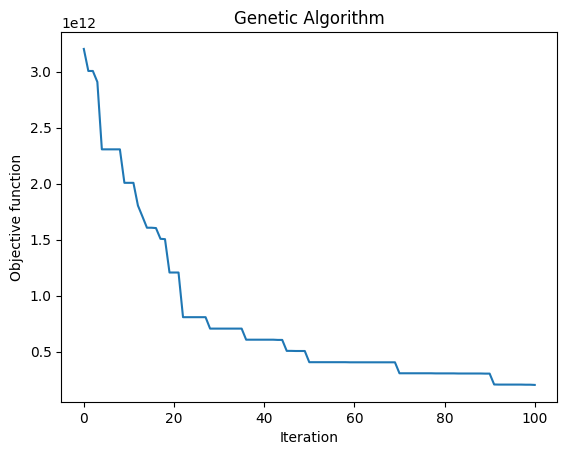

 The best solution found:                                                                           
 [ 535.  651.  613. 1101.  923. 1057.  851.  985.  837.  511.  807.  810.
  961.  508.  572.  912.  744. 1017.  701. 1189.  594.]

 Objective function:
 503000038044.69446


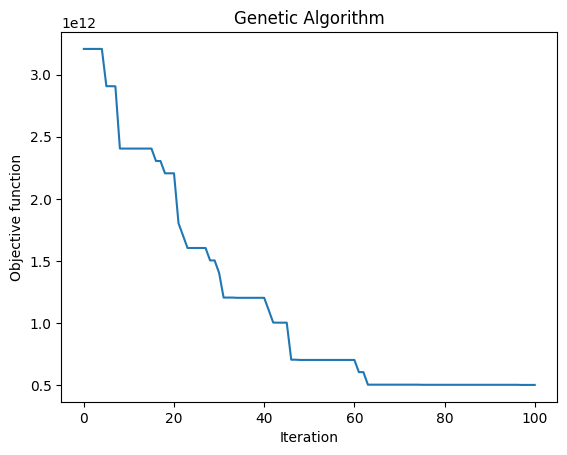

 The best solution found:                                                                           
 [ 495. 1035.  580.  622.  506. 1036.  749.  871.  871.  939.  488. 1006.
  503.  685.  747. 1062. 1146.  908. 1043.  936.  566.]

 Objective function:
 3000038008.236111


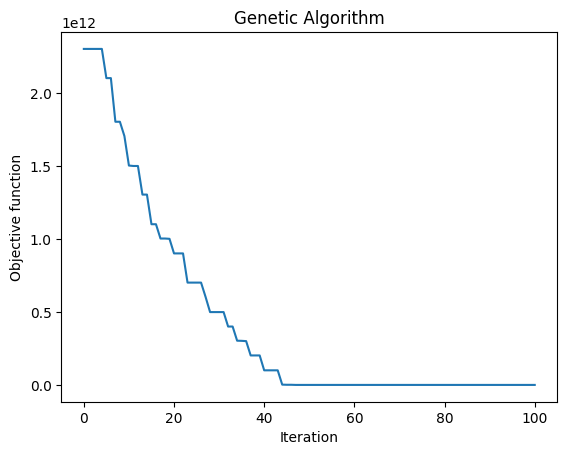

 The best solution found:                                                                           
 [ 486.  544.  485.  907.  957. 1043.  645. 1017. 1041.  727.  561.  891.
  611.  637.  890.  993. 1148.  811.  913.  713.  771.]

 Objective function:
 2000038047.9027777


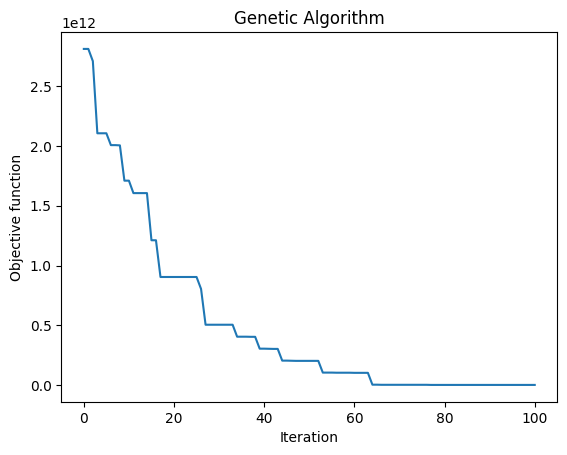

 The best solution found:                                                                           
 [ 745.  936.  707. 1126.  964.  894.  778.  489. 1028. 1040.  912.  926.
  840.  838.  560. 1020.  626.  619.  509.  716.  551.]

 Objective function:
 105000038070.01389


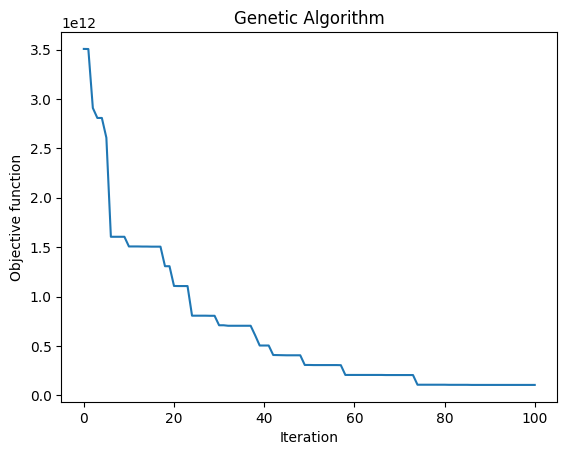

 The best solution found:                                                                           
 [ 516. 1124.  716.  950.  546.  886.  804.  571.  798.  863.  825.  798.
  546.  685.  728. 1013.  749.  948. 1021. 1011.  536.]

 Objective function:
 103000038085.69444


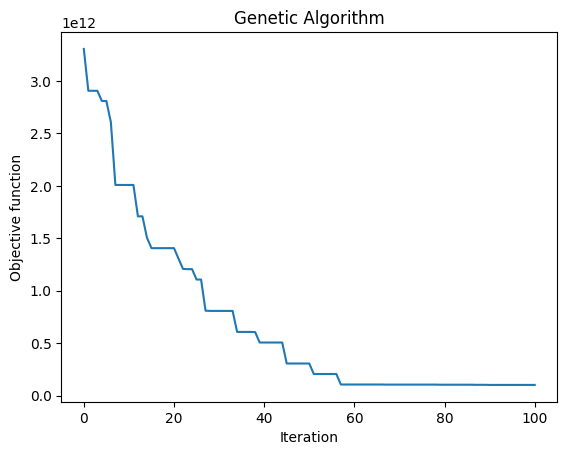

 The best solution found:                                                                           
 [ 641. 1085.  869.  775.  517.  917.  847.  873. 1042.  957.  564.  837.
  563.  610. 1014.  912.  693. 1013.  486.  952.  557.]

 Objective function:
 5000038067.791667


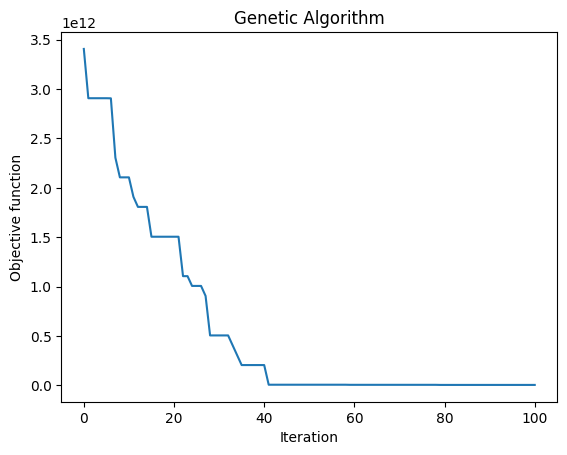

 The best solution found:                                                                           
 [ 513. 1077.  773.  983.  630.  807.  766.  700.  877.  897.  544. 1056.
  515.  762.  625. 1062.  558.  859. 1043.  930.  503.]

 Objective function:
 3000038044.5555553


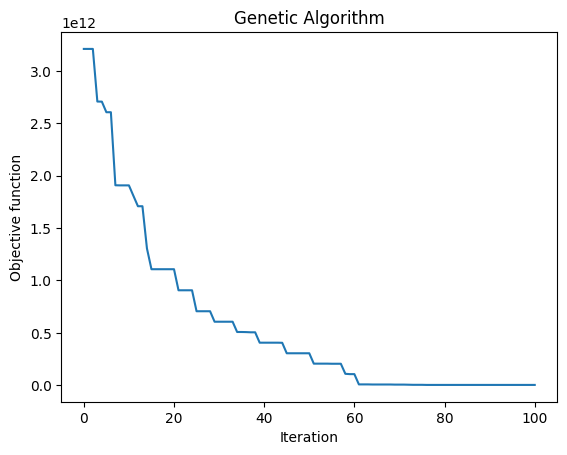

 The best solution found:                                                                           
 [ 533.  894.  941.  757.  837.  843.  578.  575.  491.  646.  540.  878.
  520.  990.  917. 1054. 1149.  639. 1030.  701.  527.]

 Objective function:
 2000038031.5972223


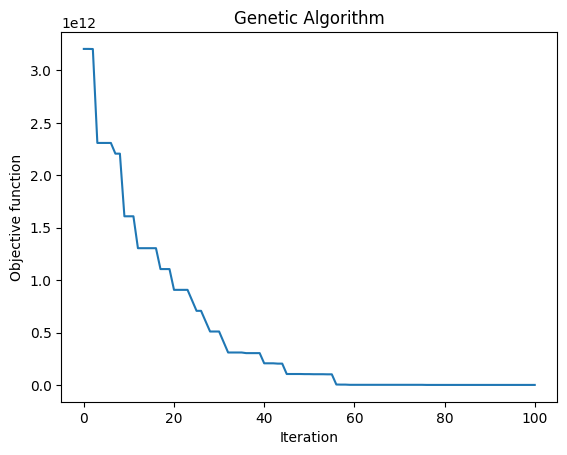

 The best solution found:                                                                           
 [ 650.  732.  964.  834.  851.  976. 1082. 1001.  569.  604.  551.  811.
  763.  929.  976.  827.  652.  485.  493.  650.  563.]

 Objective function:
 4000038132.0694447


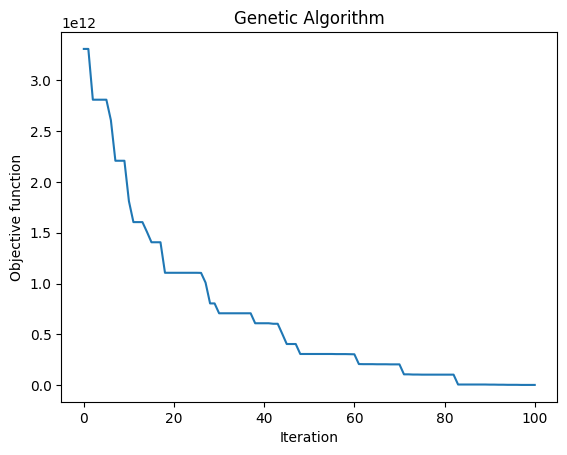

 The best solution found:                                                                           
 [ 518. 1109.  548.  801.  669.  741. 1191.  670.  822.  984.  483.  668.
  936.  961.  541.  701. 1042.  597.  788.  867.  521.]

 Objective function:
 103000036016.27777


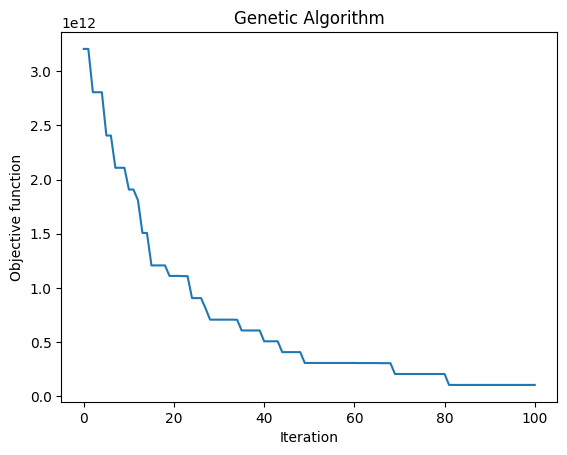

: 

In [ ]:

model = Optimizer(tasks, members)

# Hyperparameter tuning
best = [{'Cost':1e60,'Solution':None,'Param':None}]*5
for mutation in np.arange(0.01,1,0.1):
    for elit in np.arange(0.01,1,0.1):
        for crossover in np.arange(0.01,1,0.1):
            for parent in np.arange(0.01,1,0.1):
                if elit > parent:
                    continue
                result = model.genatic_algo({'max_num_iteration': 100, 'population_size': 1500, 'mutation_probability': mutation,
                                        'elit_ratio': elit, 'crossover_probability': crossover, 'parents_portion': parent,
                                        'crossover_type': 'two_point', 'max_iteration_without_improv': None})
                for item in best:
                    if item['Cost'] > result.best_function:
                        item['Cost'] = result.best_function
                        item['Solution'] = result.best_variable
                        item['Param'] = {'Mutation':mutation, 'Elit':elit, 'Crossover':crossover, 'Parent':parent}
                        break